This is the code for the fundamental idea for a deviation scale of 10.24.

In [1]:
import os
import numpy as np
import requests
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
import sys
import timeit
import copy

import tensorflow as tf
from tensorflow.keras import layers, Model, backend
from tensorflow.keras import applications
from tensorflow.keras.models import *
from tensorflow.keras.layers import *

import pyQEDA as pq
import sys
sys.path.append("/Users/chenjie/pyQEDA/pyscripts")
import pyQEDA_function_cj as pf
import pyQEDA_potential as pqp
import normalization_function as nf
import load_Intensity_function as lif
import makeUniqueUgVector_cj as mu
import makeUniqueUgVector_3D_cj as mu_3D

In [2]:
# calculate_R function: used to calculate the value of R_factor
def calculate_R(I_exp, I_sim):
    return np.sum(np.abs(I_sim - I_exp)) / np.sum(I_exp)

In [3]:
# divere_Ug_t function: used to diverse the origin Ug or t
def diverse_Ug_t(origin_Ug_t, scale_Ug=0.01, scale_t=0.001):
    '''
    origin_Ug_t: Input
    scale_Ug: the scale used to diverse the Structure factors
    scale_t: the scale used to diverse the Thickness   
    '''
    
    Ug_t_diverse = copy.deepcopy(origin_Ug_t)
    
    if scale_t:
        offset_t = (np.random.random()*2-1)*scale_t
        print('The offset applied on thickness: {}\n'.format(offset_t))
        Ug_t_diverse[-1] += offset_t
        
    if scale_Ug:
        offset_Ug = (np.random.random()*2-1)*scale_Ug
        print('The offset applied on Ug: {}\n'.format(offset_Ug))
        
        for j in range(len(Ug_t_diverse)-1):            
            # for real part of Ug    
            if j%2 == 0:
                # the offset if propotional to the magnitude of the Ug
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j]**2 + Ug_t_diverse[j+1]**2)
            # for imag part of Ug
            else:
                Ug_t_diverse[j] += offset_Ug*(Ug_t_diverse[j-1]**2 + Ug_t_diverse[j]**2)
    
    return Ug_t_diverse    

In [4]:
# generate_diversed_data function: used to generate datasets
def generate_diversed_data(Ug_t, scale_Ug=0.01, scale_t=0.001, data_size=140, LoadIntensityAsInput = False):
    '''
    data_size: total datasize, including training sets and testing sets
    origin_Ug_t: Input
    scale_Ug: the scale used to diverse the Structure factors
    scale_t: the scale used to diverse the Thickness  
    LoadIntensityAsInput: load the Intensities in txt.files as features if true
    '''
    
    # labels: divered Ug_t
    y = []
    # features: diversed I
    X = []
    # R_factors
    R_factors = []

    i = 0
    while i < data_size:
        print('>>> producing the {}. dataset...\n'.format(i+1))
    
        Ug_t_diverse = diverse_Ug_t(Ug_t, scale_Ug=scale_Ug, scale_t=scale_t)
    
        # normalization
        Ug_diverse = np.array(range( np.int((Ug_t_diverse.size - 1)/2) ), dtype=complex)
        Ug_diverse.real = Ug_t_diverse[0:-1:2]
        Ug_diverse.imag = Ug_t_diverse[1:-1:2]
        Ug_diverse_normalized = nf.normalization(file=File, origin_Ug=Ug_diverse)
        Ug_diverse_normalized = np.asarray(Ug_diverse_normalized)

        # reshape
        Ug_diverse_normalized_2real = np.concatenate((np.array(Ug_diverse_normalized.real,ndmin=2).T, np.array(Ug_diverse_normalized.imag,ndmin=2).T),axis=1)  
        Ug_diverse_normalized_2real = np.asarray(Ug_diverse_normalized_2real)
        Ug_t_diverse_normalized_2real = np.append(Ug_diverse_normalized_2real.reshape(-1), Ug_t_diverse[-1])
    
        file = File+".qed"
        I_sim = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_diverse_normalized_2real, InputUgdoFlip=False)
        
        if LoadIntensityAsInput == True:
            #load the intensities of simulation pattern from txt.files
            I_diverse = lif.LoadIntensity(file = File, test_simulation=True)
        else:
            I_diverse = I_sim
        I_diverse = I_diverse.reshape(-1)
           
        y = np.append(y, Ug_t_diverse)
        X = np.append(X, I_diverse)
    
        R = calculate_R(I, I_diverse)
        print('R-factor: {}\n'.format(R))
        R_factors = np.append(R_factors, R)
    
        i += 1

    y = (np.asarray(y)).reshape(data_size, 2*numUg+1)
    X = (np.asarray(X)).reshape(data_size,-1)
    R_factors = np.asarray(R_factors)
    
    # plot the R-factors 
    plt.figure(figsize=(12,8))
    plt.plot(R_factors[:])
    plt.title('R_factors (experimental pattern v.s. deviated pattern) at a scale of {}'.format(scale_Ug))
    plt.ylabel('R_factor')
    plt.xlabel('Dataset')
    plt.show()
    plt.close()
    
    return X, y, R_factors

-------------------------------------------------------------------------------------------------------------------

# I. Load Data

1. random datasets

In [5]:
name =  "SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn"
File = "SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn"
Nx = 83
t = 0.3     # 0.5*1000 = 500Am
save_name = "SiTrO3_01"

Folder = "/Users/chenjie/pyQEDA/pyQEDA_simulations/"
file_dir = Folder + name + "/" + name + "_experimental_data/_UgMasterList.txt"

(26,)


Text(0.5, 1.0, 'Ug of experimental pattern')

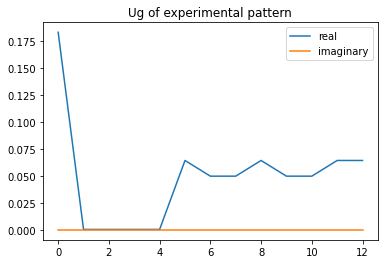

In [6]:
Ug = []
with open(file_dir, mode="r") as f:
    f.readline()
    for line in f:
        beam_id, Ug_re, Ug_im = line.strip().split(" ")[:3]
        Ug_re = float(Ug_re)
        Ug_im = float(Ug_im)
        Ug = np.append(Ug, [Ug_re, Ug_im])
        Ug = np.asarray(Ug)
        numUg = int(len(Ug)/2)
print(Ug.shape)

plt.plot(Ug[::2],label='real')
plt.plot(Ug[1::2],label='imaginary')
plt.legend()
plt.title('Ug of experimental pattern')

In [7]:
# join Ug and t:
Ug_t = np.append(Ug,t)
print(Ug_t.shape)

(27,)


the shape of the experimental pattern:  (1, 6889)
0.9999989287512341


Text(0.5, 1.0, 'experimental Pattern')

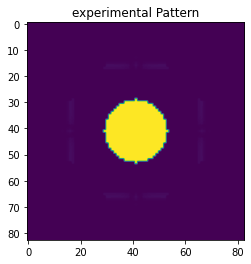

In [8]:
LoadIntensityAsInput = False  # LoadIntensityAsInput=True: load the Intensities in txt.files as Input
                             # LoadIntensityAsInput=False: use the integrated Intensities, which directly obtained from random diffraction, as Input

# load the integrated intensities of experimental pattern
I_exp = np.loadtxt("/Users/chenjie/pyQEDA/training_Data/diff_pattern_" + name + ".csv", dtype=float)

# load the intensities of random pattern & experimental pattern
if LoadIntensityAsInput == True:
    tilt_num, beam_num, exp_Intensity, random_Intensity = lif.LoadIntensity(file = File, N_training_data=200)    
    # use the experimental intensities
    I = exp_Intensity.reshape(1,-1)
    
# use the integrated intensitis of experimental pattern
else:
    I = I_exp.reshape(1,-1)
    
print('the shape of the experimental pattern: ',I.shape)
print(I.max())

    

def nlogf(x):
    return np.log(1+1000*x)
nlog = np.vectorize(nlogf)

        
nlogf_I_exp = nlogf(I_exp.reshape(1,Nx,Nx,1))
plt.imshow(nlogf_I_exp[0])
plt.title('experimental Pattern')

In [9]:
makeUniqueUgVector = True
beam1, beam2 = 4, 5

training set and testing set:

>>> producing the 1. dataset...

The offset applied on thickness: -0.00039978357026647517

The offset applied on Ug: -4.98818576036455

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6002164297335
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg, zone = [0.0, 0.0, 1.0]


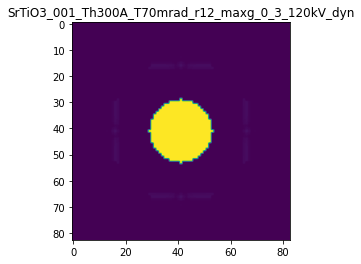

R-factor: 2.7574231295096845e-05

>>> producing the 2. dataset...

The offset applied on thickness: -0.0008375816142346045

The offset applied on Ug: -3.277466542390887

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1624183857654
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

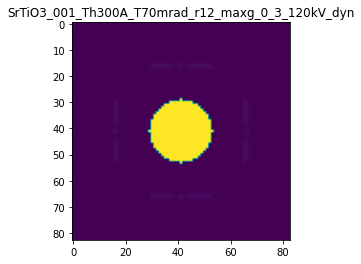

R-factor: 1.874752173627296e-05

>>> producing the 3. dataset...

The offset applied on thickness: -0.0008959141972560893

The offset applied on Ug: -5.847459014212034

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1040858027439
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

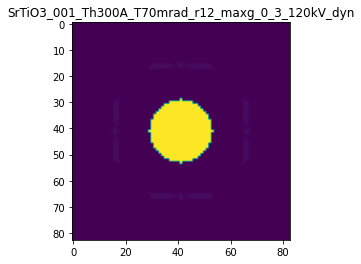

R-factor: 3.163177134446128e-05

>>> producing the 4. dataset...

The offset applied on thickness: -0.0006838186126074206

The offset applied on Ug: -2.061513067474748

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3161813873926
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

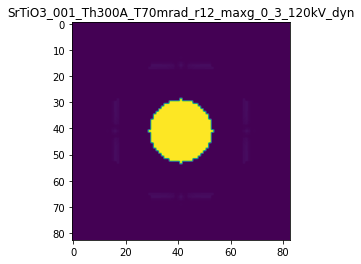

R-factor: 1.2019551473071266e-05

>>> producing the 5. dataset...

The offset applied on thickness: 8.103323827893405e-05

The offset applied on Ug: -2.2552945283011034

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.08103323827896
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

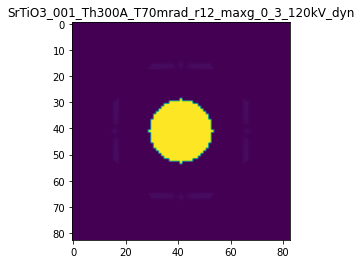

R-factor: 1.3307151582586616e-05

>>> producing the 6. dataset...

The offset applied on thickness: 0.00016300334018195107

The offset applied on Ug: 4.359237922716343

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.16300334018194
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

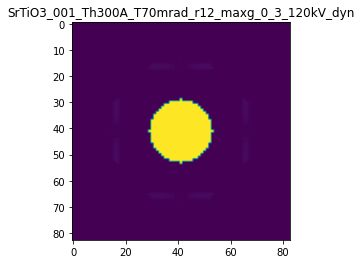

R-factor: 2.7310389229617227e-05

>>> producing the 7. dataset...

The offset applied on thickness: 0.0007538561637892425

The offset applied on Ug: 7.089953587582536

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.75385616378924
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

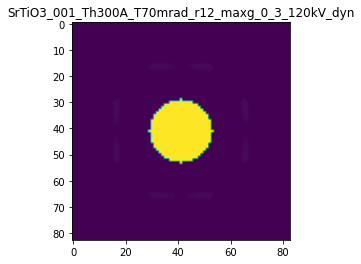

R-factor: 4.3496478966669486e-05

>>> producing the 8. dataset...

The offset applied on thickness: 0.0007924977083650328

The offset applied on Ug: 10.173098533194116

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.79249770836503
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

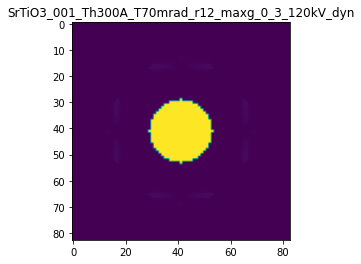

R-factor: 6.003447494980113e-05

>>> producing the 9. dataset...

The offset applied on thickness: -0.0007091183681365317

The offset applied on Ug: 6.036209783638199

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.29088163186344
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

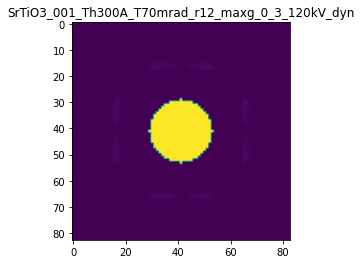

R-factor: 3.781854683245099e-05

>>> producing the 10. dataset...

The offset applied on thickness: -0.00038593625667449196

The offset applied on Ug: -5.746184459752156

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6140637433255
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

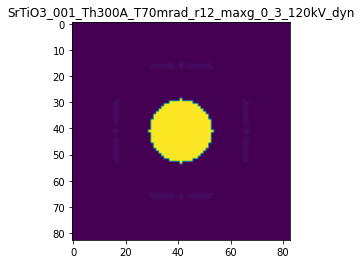

R-factor: 3.113936146403287e-05

>>> producing the 11. dataset...

The offset applied on thickness: 0.0005970561426206334

The offset applied on Ug: -7.3750659454003635

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5970561426206
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

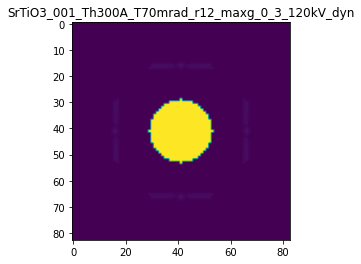

R-factor: 3.7963851917907376e-05

>>> producing the 12. dataset...

The offset applied on thickness: 0.0005633500995975762

The offset applied on Ug: 0.2113554799287431

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5633500995976
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

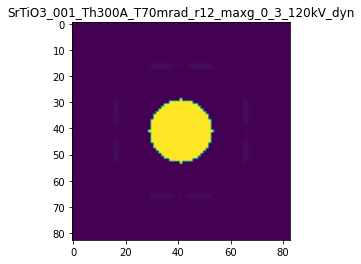

R-factor: 1.3893775507064533e-06

>>> producing the 13. dataset...

The offset applied on thickness: 0.00029952056010451144

The offset applied on Ug: -6.947588356388681

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2995205601045
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

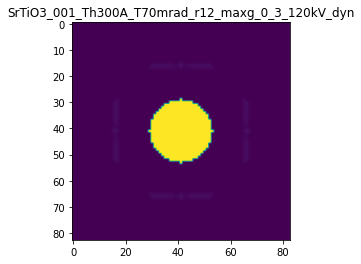

R-factor: 3.631632763414491e-05

>>> producing the 14. dataset...

The offset applied on thickness: -0.0005217917144251946

The offset applied on Ug: -0.44961369359080666

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4782082855748
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

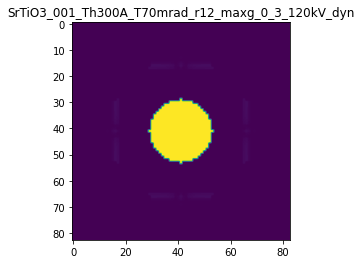

R-factor: 2.660935417403522e-06

>>> producing the 15. dataset...

The offset applied on thickness: -0.00031540449120180127

The offset applied on Ug: -5.099355034216671

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.68459550879817
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

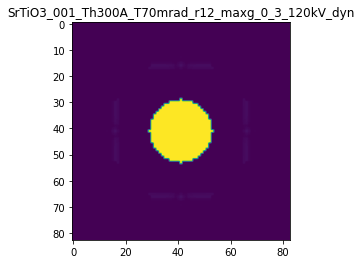

R-factor: 2.8114147436394926e-05

>>> producing the 16. dataset...

The offset applied on thickness: -2.6888349694830006e-05

The offset applied on Ug: -4.549575970336902

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.97311165030516
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

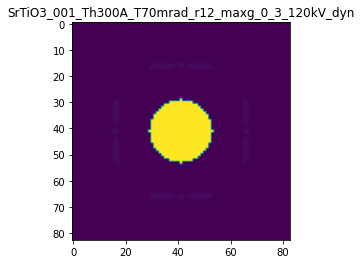

R-factor: 2.5453682130740786e-05

>>> producing the 17. dataset...

The offset applied on thickness: -0.0005809531185708341

The offset applied on Ug: 0.9964136295354342

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.41904688142915
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

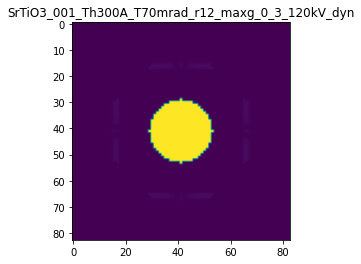

R-factor: 6.514903722887525e-06

>>> producing the 18. dataset...

The offset applied on thickness: 0.0006227787422565014

The offset applied on Ug: -8.886568741573667

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6227787422565
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

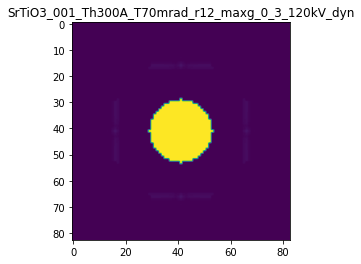

R-factor: 4.301456865425572e-05

>>> producing the 19. dataset...

The offset applied on thickness: -0.0008759648559129334

The offset applied on Ug: -5.032489654742124

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.12403514408703
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

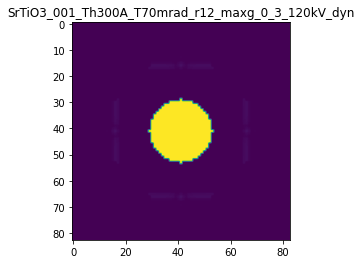

R-factor: 2.7776274943776913e-05

>>> producing the 20. dataset...

The offset applied on thickness: -0.00017582693563334174

The offset applied on Ug: 5.2183121741949705

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8241730643667
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

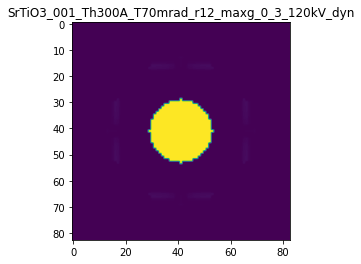

R-factor: 3.2698684018352645e-05

>>> producing the 21. dataset...

The offset applied on thickness: 0.0006615226264243406

The offset applied on Ug: 1.2881861195541842

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6615226264243
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

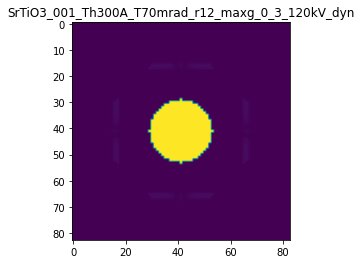

R-factor: 7.726309894990208e-06

>>> producing the 22. dataset...

The offset applied on thickness: -0.0007166059127370847

The offset applied on Ug: 1.0406489841855524

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2833940872629
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

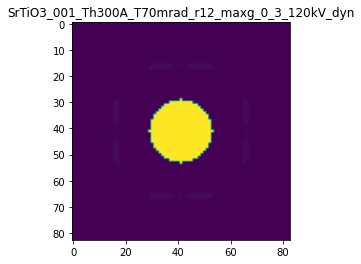

R-factor: 6.873455205481829e-06

>>> producing the 23. dataset...

The offset applied on thickness: -0.0009466036336588493

The offset applied on Ug: 6.146460668117625

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.05339636634113
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

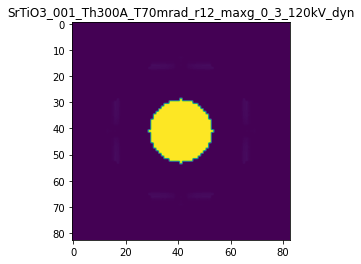

R-factor: 3.8558102001150066e-05

>>> producing the 24. dataset...

The offset applied on thickness: -0.00022848450644840913

The offset applied on Ug: 2.461088397778376

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7715154935516
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

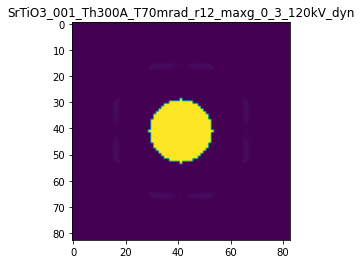

R-factor: 1.5560820939610477e-05

>>> producing the 25. dataset...

The offset applied on thickness: 0.0007426064136923613

The offset applied on Ug: 8.344104088350772

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.74260641369233
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

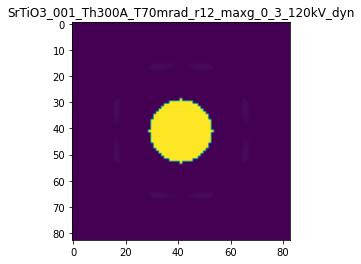

R-factor: 5.0525743362504664e-05

>>> producing the 26. dataset...

The offset applied on thickness: -0.0008187764320963123

The offset applied on Ug: -10.044299984921777

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.18122356790366
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

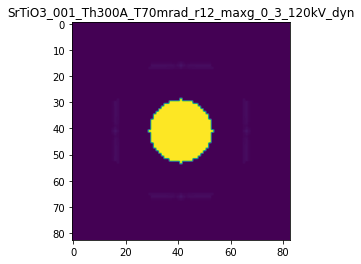

R-factor: 4.689359097695604e-05

>>> producing the 27. dataset...

The offset applied on thickness: 0.000309919732587115

The offset applied on Ug: -9.142958813959144

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3099197325871
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

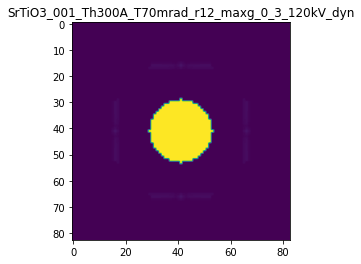

R-factor: 4.3772985419529674e-05

>>> producing the 28. dataset...

The offset applied on thickness: 0.0005557847458100931

The offset applied on Ug: 2.661958710104416

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.55578474581006
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

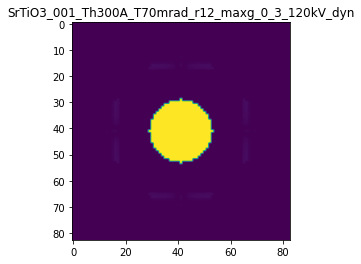

R-factor: 1.6487900381306903e-05

>>> producing the 29. dataset...

The offset applied on thickness: -0.0007012981886840117

The offset applied on Ug: 8.901381967476262

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.29870181131594
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

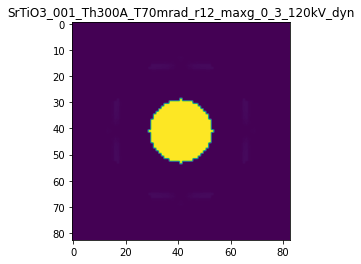

R-factor: 5.397395950580415e-05

>>> producing the 30. dataset...

The offset applied on thickness: 0.00033120793353776025

The offset applied on Ug: -4.167773032575333

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3312079335377
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

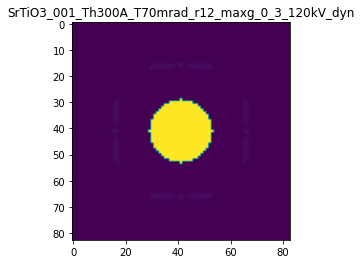

R-factor: 2.362384745951545e-05

>>> producing the 31. dataset...

The offset applied on thickness: 0.000583091847290274

The offset applied on Ug: 5.942668576611304

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.58309184729023
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

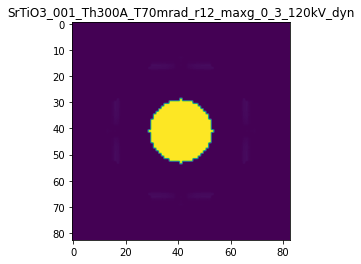

R-factor: 3.681317634190034e-05

>>> producing the 32. dataset...

The offset applied on thickness: 0.0005138802932667197

The offset applied on Ug: -2.1423233367642207

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5138802932667
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

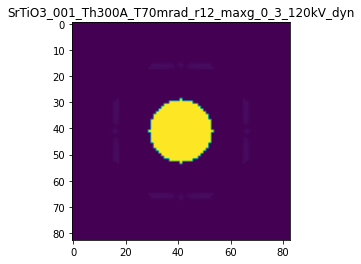

R-factor: 1.2874067504639007e-05

>>> producing the 33. dataset...

The offset applied on thickness: -0.0005474395442688904

The offset applied on Ug: -3.834875785013712

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4525604557311
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

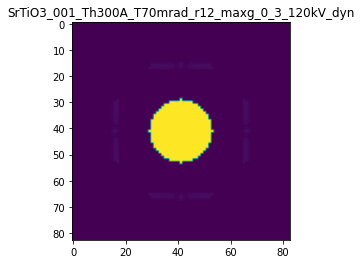

R-factor: 2.1744154359316338e-05

>>> producing the 34. dataset...

The offset applied on thickness: 0.00023075790351462656

The offset applied on Ug: -3.0034226233835284

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2307579035146
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

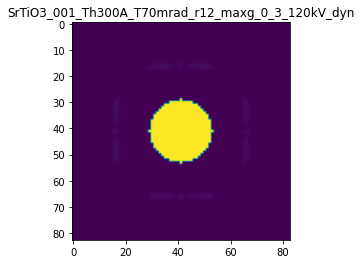

R-factor: 1.7499742605041732e-05

>>> producing the 35. dataset...

The offset applied on thickness: 8.492882480467756e-05

The offset applied on Ug: 3.9055418600336087

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.08492882480465
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

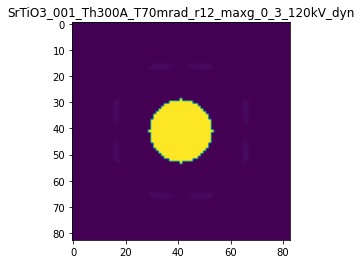

R-factor: 2.4521127292410405e-05

>>> producing the 36. dataset...

The offset applied on thickness: -0.00041337215327972345

The offset applied on Ug: -8.348414591660475

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.58662784672026
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

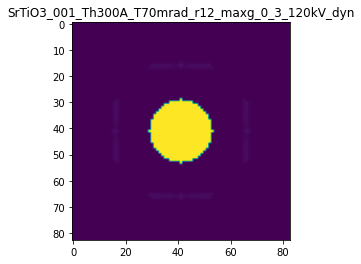

R-factor: 4.1399966756114007e-05

>>> producing the 37. dataset...

The offset applied on thickness: 0.0005133160216280162

The offset applied on Ug: 5.974633287020567

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.513316021628
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

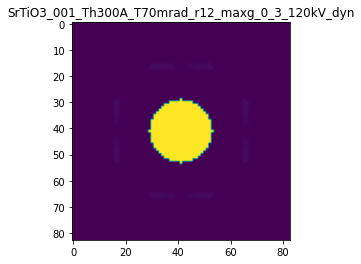

R-factor: 3.702855184178111e-05

>>> producing the 38. dataset...

The offset applied on thickness: -0.0003103395568698448

The offset applied on Ug: -6.022555782680845

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.68966044313015
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

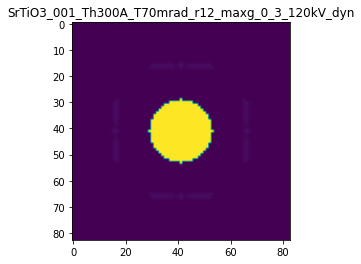

R-factor: 3.2396547420461465e-05

>>> producing the 39. dataset...

The offset applied on thickness: 0.00010278019490643598

The offset applied on Ug: 0.877889677662422

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1027801949064
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

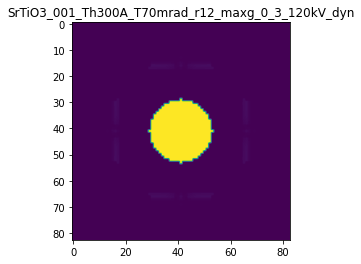

R-factor: 5.399370379205883e-06

>>> producing the 40. dataset...

The offset applied on thickness: -0.000746811228436509

The offset applied on Ug: -6.6567757748178655

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2531887715635
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

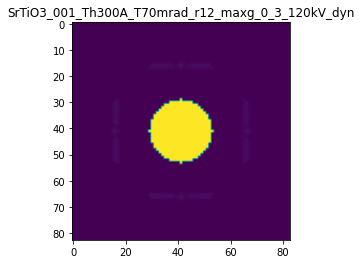

R-factor: 3.514607321329766e-05

>>> producing the 41. dataset...

The offset applied on thickness: 0.00050042157305101

The offset applied on Ug: 1.8067579107050915

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.500421573051
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTiO

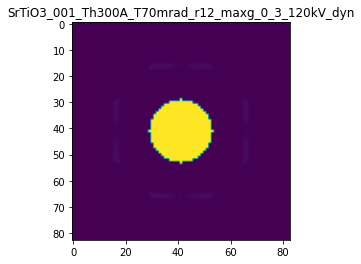

R-factor: 1.1076761181198901e-05

>>> producing the 42. dataset...

The offset applied on thickness: 0.0004600252087457406

The offset applied on Ug: 3.081910833778206

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4600252087457
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

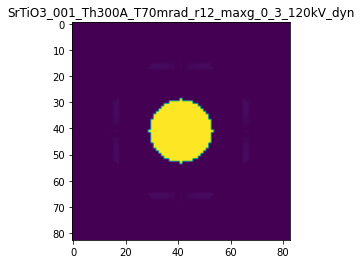

R-factor: 1.9190297586920645e-05

>>> producing the 43. dataset...

The offset applied on thickness: 0.0009339418770809043

The offset applied on Ug: -7.898619411607909

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.9339418770809
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

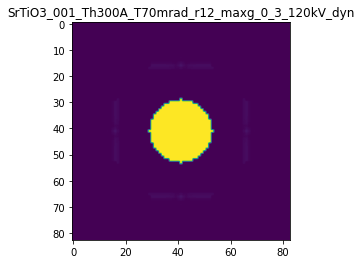

R-factor: 3.9859013627030865e-05

>>> producing the 44. dataset...

The offset applied on thickness: -0.0008788907893801588

The offset applied on Ug: 0.14450533518189104

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.12110921061986
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

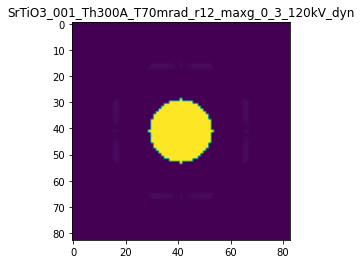

R-factor: 1.6252431812719642e-06

>>> producing the 45. dataset...

The offset applied on thickness: 1.4362741350387287e-05

The offset applied on Ug: -9.289467313947688

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.01436274135034
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

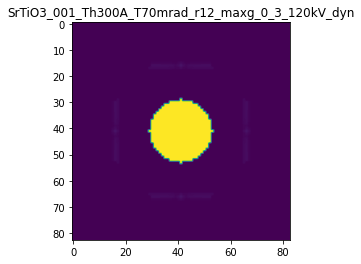

R-factor: 4.4276760784247816e-05

>>> producing the 46. dataset...

The offset applied on thickness: 0.00028762017299107637

The offset applied on Ug: -4.68367886360963

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.28762017299107
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

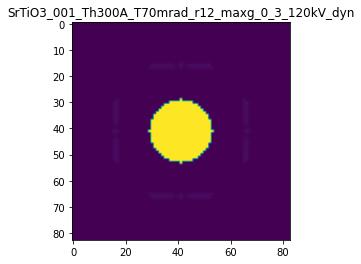

R-factor: 2.616501779623035e-05

>>> producing the 47. dataset...

The offset applied on thickness: 0.00014257049271199952

The offset applied on Ug: -0.3602345039206853

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.14257049271197
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

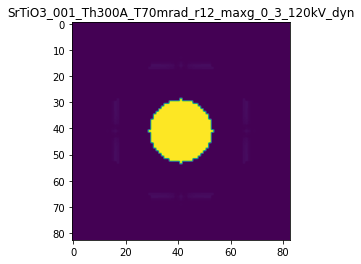

R-factor: 2.283270318850652e-06

>>> producing the 48. dataset...

The offset applied on thickness: -0.0005204966932417792

The offset applied on Ug: -1.795342085371476

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4795033067582
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

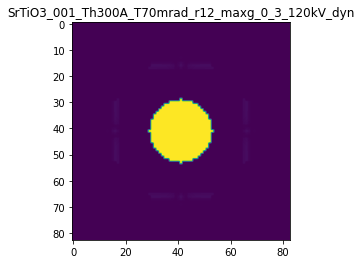

R-factor: 1.0521765442443586e-05

>>> producing the 49. dataset...

The offset applied on thickness: -0.00014577404284202777

The offset applied on Ug: -6.298926860203358

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.85422595715795
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

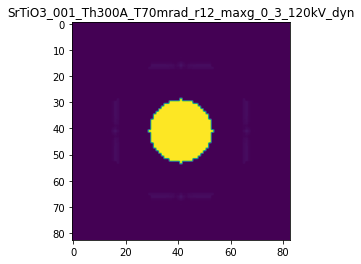

R-factor: 3.36151258010346e-05

>>> producing the 50. dataset...

The offset applied on thickness: -0.000679709104325864

The offset applied on Ug: -3.9026904114244987

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.32029089567413
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

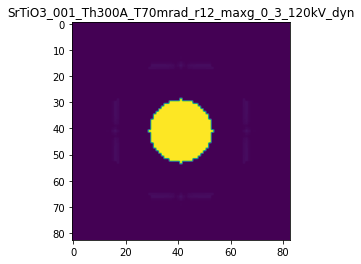

R-factor: 2.2082880781330384e-05

>>> producing the 51. dataset...

The offset applied on thickness: -0.0009047769319015668

The offset applied on Ug: 1.0937316682699885

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.09522306809845
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

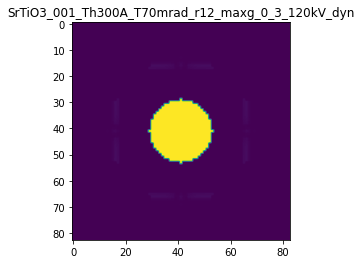

R-factor: 7.320737886243018e-06

>>> producing the 52. dataset...

The offset applied on thickness: 0.0008204673944332995

The offset applied on Ug: -5.455750837255764

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8204673944333
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

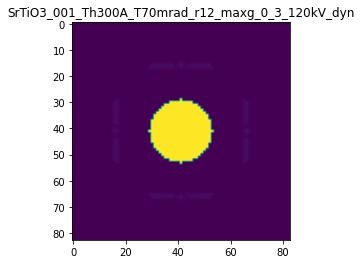

R-factor: 2.9906703956324617e-05

>>> producing the 53. dataset...

The offset applied on thickness: -0.0004897746082903861

The offset applied on Ug: 0.6768729469915252

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.51022539170964
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

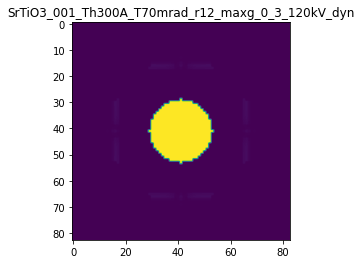

R-factor: 4.47715104444404e-06

>>> producing the 54. dataset...

The offset applied on thickness: 6.262629523989948e-05

The offset applied on Ug: 10.073062787802364

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0626262952399
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

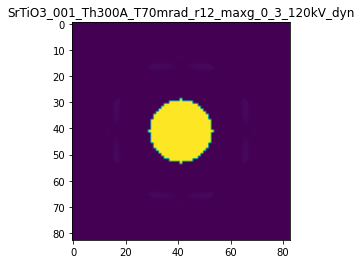

R-factor: 5.975990073044547e-05

>>> producing the 55. dataset...

The offset applied on thickness: -0.0005201749542374497

The offset applied on Ug: 9.236765368890659

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.47982504576254
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

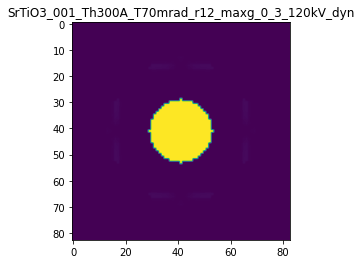

R-factor: 5.56773807077422e-05

>>> producing the 56. dataset...

The offset applied on thickness: -0.0008575294064412378

The offset applied on Ug: 7.268540382928375

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.14247059355876
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

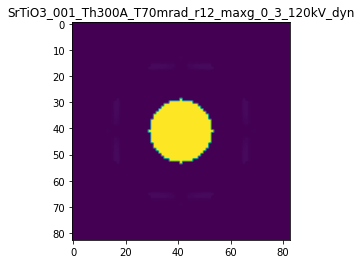

R-factor: 4.504992331733572e-05

>>> producing the 57. dataset...

The offset applied on thickness: 0.0008479458078779438

The offset applied on Ug: -6.835825405173348

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8479458078779
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

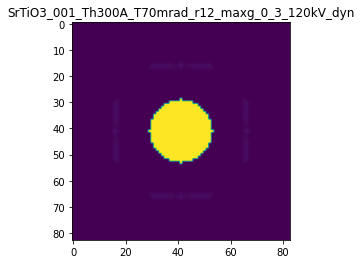

R-factor: 3.58766892206408e-05

>>> producing the 58. dataset...

The offset applied on thickness: 0.0005495423511023026

The offset applied on Ug: 2.5002719456538127

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.54954235110233
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

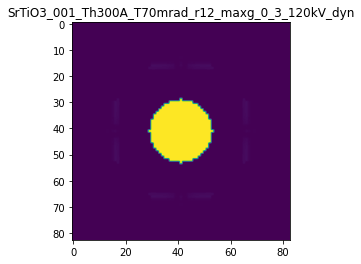

R-factor: 1.5462941430272496e-05

>>> producing the 59. dataset...

The offset applied on thickness: -0.0003418471949600024

The offset applied on Ug: 10.12115406777993

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.65815280504
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

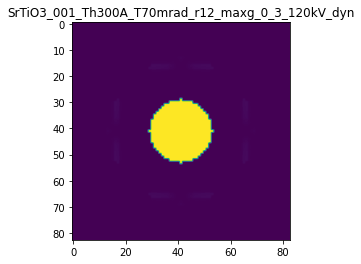

R-factor: 6.0126930206050337e-05

>>> producing the 60. dataset...

The offset applied on thickness: -0.0005546907532737781

The offset applied on Ug: 8.57552794379388

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4453092467262
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

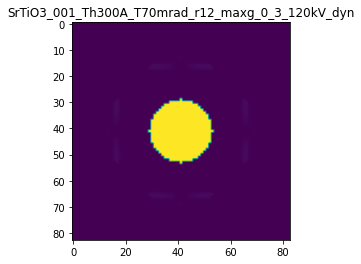

R-factor: 5.218845390270343e-05

>>> producing the 61. dataset...

The offset applied on thickness: -0.0005385273577405711

The offset applied on Ug: -0.11584376756695292

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4614726422594
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

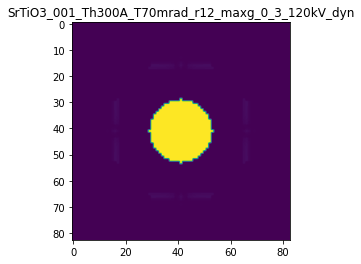

R-factor: 9.226293399613787e-07

>>> producing the 62. dataset...

The offset applied on thickness: -0.000751809130459053

The offset applied on Ug: 8.47937773411276

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2481908695409
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

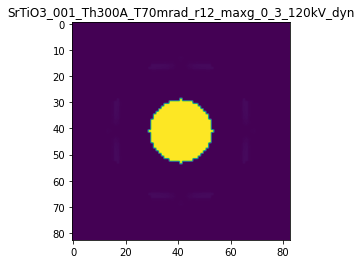

R-factor: 5.173390451414234e-05

>>> producing the 63. dataset...

The offset applied on thickness: 0.0006630915864479666

The offset applied on Ug: -6.568073910209198

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.66309158644793
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

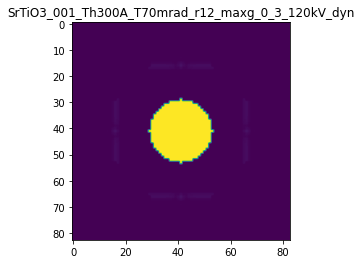

R-factor: 3.4762044456528286e-05

>>> producing the 64. dataset...

The offset applied on thickness: -0.000611605109804199

The offset applied on Ug: 10.237630123524836

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3883948901958
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

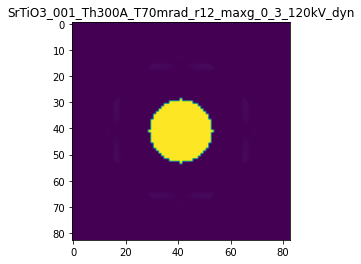

R-factor: 6.078955379841667e-05

>>> producing the 65. dataset...

The offset applied on thickness: 0.0006142389424228729

The offset applied on Ug: -5.955418661262281

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.61423894242284
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

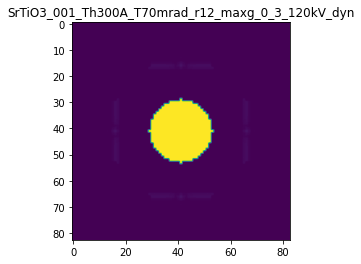

R-factor: 3.2111257239797725e-05

>>> producing the 66. dataset...

The offset applied on thickness: -0.0005481325414102627

The offset applied on Ug: -9.005340810037085

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.45186745858973
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

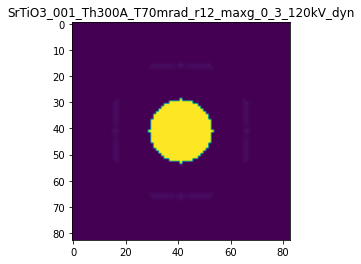

R-factor: 4.3433413212309634e-05

>>> producing the 67. dataset...

The offset applied on thickness: 0.0005638790987453555

The offset applied on Ug: -9.81323440965725

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5638790987453
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

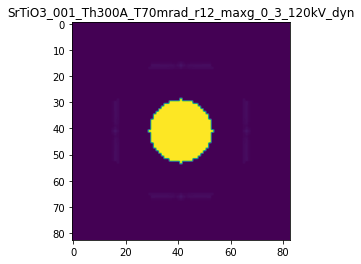

R-factor: 4.585419111772589e-05

>>> producing the 68. dataset...

The offset applied on thickness: -0.0004863249042733866

The offset applied on Ug: 5.034622796111637

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5136750957266
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

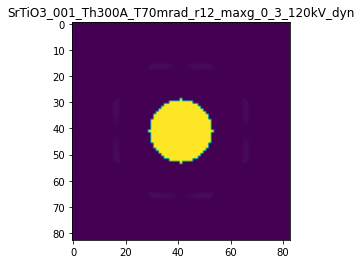

R-factor: 3.1703237974809134e-05

>>> producing the 69. dataset...

The offset applied on thickness: 0.0008112092437417136

The offset applied on Ug: 3.5314947092607802

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8112092437417
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

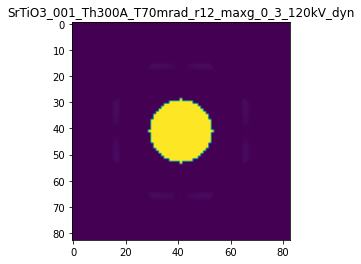

R-factor: 2.188212150883321e-05

>>> producing the 70. dataset...

The offset applied on thickness: 0.0003238905293364487

The offset applied on Ug: 1.329249405704411

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.32389052933644
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

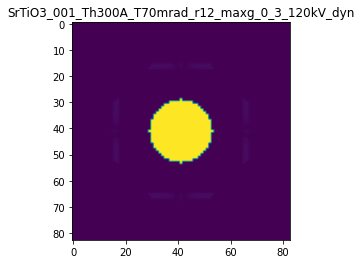

R-factor: 8.135793624056442e-06

>>> producing the 71. dataset...

The offset applied on thickness: -0.0006702131822512691

The offset applied on Ug: -1.3592443242242576

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.32978681774875
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

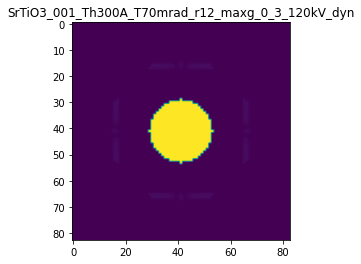

R-factor: 7.97615320229953e-06

>>> producing the 72. dataset...

The offset applied on thickness: 0.0008275034677137337

The offset applied on Ug: 8.367058102894742

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.8275034677137
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrTi

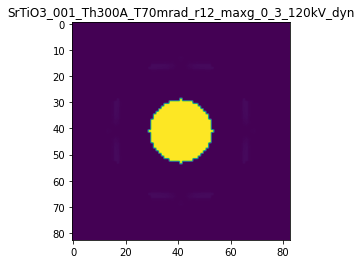

R-factor: 5.062405339202748e-05

>>> producing the 73. dataset...

The offset applied on thickness: -0.00016688476271898957

The offset applied on Ug: -1.5393217800619732

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.833115237281
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

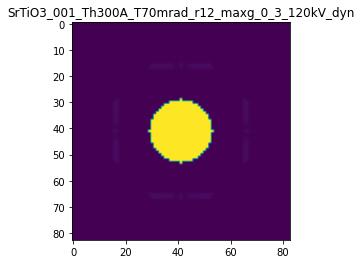

R-factor: 9.1293565316887e-06

>>> producing the 74. dataset...

The offset applied on thickness: -0.0002866397367990716

The offset applied on Ug: -7.505117529574213

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.7133602632009
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

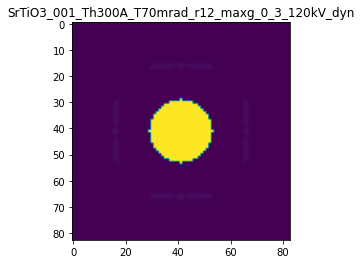

R-factor: 3.845718184802979e-05

>>> producing the 75. dataset...

The offset applied on thickness: -0.00017537332210339196

The offset applied on Ug: 1.8603596120780095

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8246266778966
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

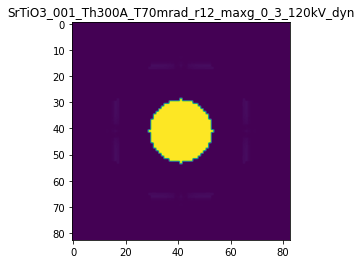

R-factor: 1.1731157302189849e-05

>>> producing the 76. dataset...

The offset applied on thickness: -0.0006796866700919217

The offset applied on Ug: 7.298772188535899

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.32031332990806
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

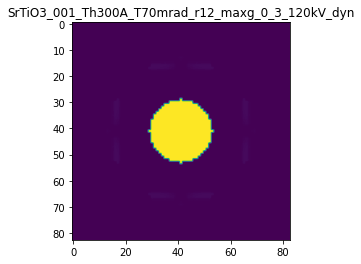

R-factor: 4.516236862149628e-05

>>> producing the 77. dataset...

The offset applied on thickness: 1.8757762260883215e-05

The offset applied on Ug: 1.843366639740541

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0187577622609
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

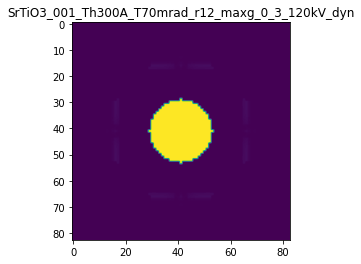

R-factor: 1.1530681564013647e-05

>>> producing the 78. dataset...

The offset applied on thickness: 0.0004388956513050646

The offset applied on Ug: 8.838702127857607

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4388956513051
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

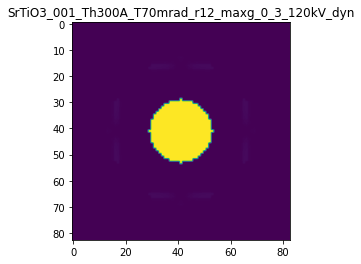

R-factor: 5.3280145101011445e-05

>>> producing the 79. dataset...

The offset applied on thickness: 0.0006179395111059893

The offset applied on Ug: -1.1546217927833777

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.617939511106
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

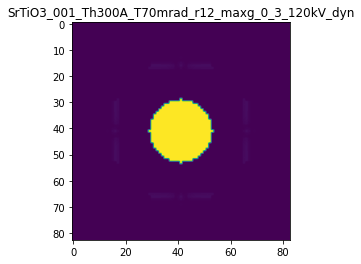

R-factor: 7.331627942753347e-06

>>> producing the 80. dataset...

The offset applied on thickness: 0.0007240574856399909

The offset applied on Ug: 5.7957441010825095

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.72405748563995
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

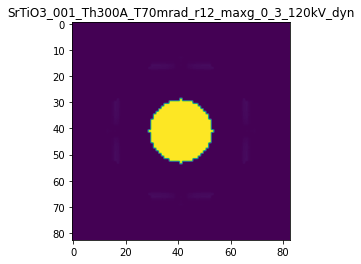

R-factor: 3.588150478647411e-05

>>> producing the 81. dataset...

The offset applied on thickness: 0.0009395222999506423

The offset applied on Ug: -4.496990218778771

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.9395222999506
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

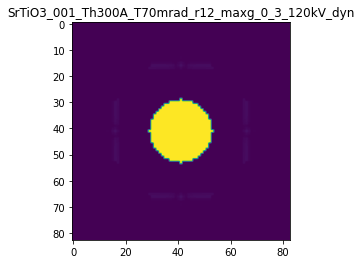

R-factor: 2.541833303842194e-05

>>> producing the 82. dataset...

The offset applied on thickness: 7.397763336377828e-05

The offset applied on Ug: 0.40700923451270454

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.07397763336377
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

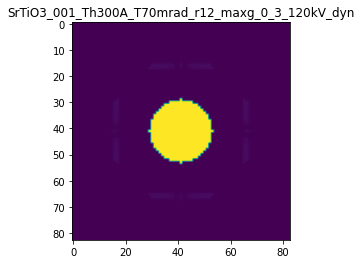

R-factor: 2.47561704817744e-06

>>> producing the 83. dataset...

The offset applied on thickness: 0.00042672119281610187

The offset applied on Ug: 8.949821770518847

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.4267211928161
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

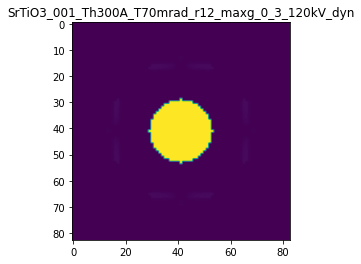

R-factor: 5.387305750557926e-05

>>> producing the 84. dataset...

The offset applied on thickness: -0.0007821784336328925

The offset applied on Ug: -7.914892114012749

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.2178215663671
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

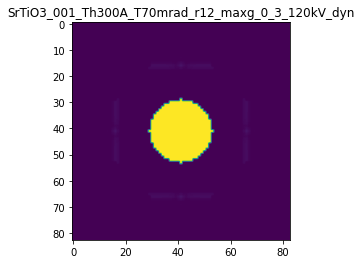

R-factor: 3.995894825065265e-05

>>> producing the 85. dataset...

The offset applied on thickness: 4.210748867740688e-05

The offset applied on Ug: -4.211507286176928

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0421074886774
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

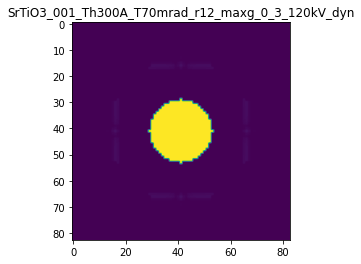

R-factor: 2.3776018139881447e-05

>>> producing the 86. dataset...

The offset applied on thickness: -0.0001679403327862894

The offset applied on Ug: -1.1619386556639075

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8320596672137
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

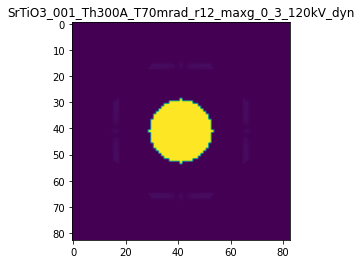

R-factor: 6.919774785672635e-06

>>> producing the 87. dataset...

The offset applied on thickness: -0.000157841162958837

The offset applied on Ug: 0.18601186113169207

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.84215883704115
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

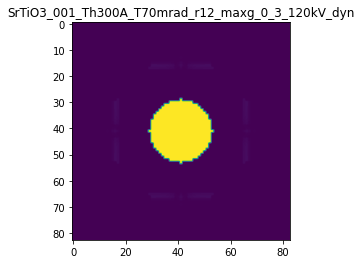

R-factor: 1.241344583201222e-06

>>> producing the 88. dataset...

The offset applied on thickness: 0.0003585348185458419

The offset applied on Ug: 7.293501999379239

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3585348185459
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/SrT

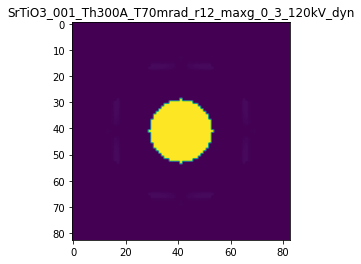

R-factor: 4.479096688983998e-05

>>> producing the 89. dataset...

The offset applied on thickness: -0.0003816791456158111

The offset applied on Ug: 9.632017013240775

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6183208543842
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

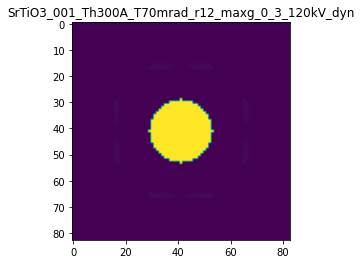

R-factor: 5.7672705125687914e-05

>>> producing the 90. dataset...

The offset applied on thickness: -0.0001724581206184941

The offset applied on Ug: 6.262755262121835

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8275418793815
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

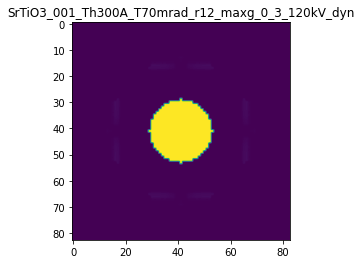

R-factor: 3.8979336923918094e-05

>>> producing the 91. dataset...

The offset applied on thickness: -0.0004360788135792446

The offset applied on Ug: -0.6267606223526991

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5639211864207
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

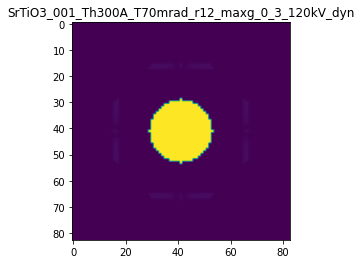

R-factor: 3.693329472745998e-06

>>> producing the 92. dataset...

The offset applied on thickness: 0.00013359116789982785

The offset applied on Ug: -6.940602776022115

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.13359116789985
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

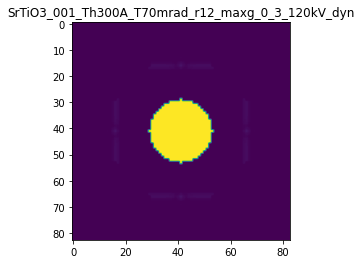

R-factor: 3.628669602921119e-05

>>> producing the 93. dataset...

The offset applied on thickness: 0.0006913258516228658

The offset applied on Ug: -1.8486284363748495

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.6913258516228
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

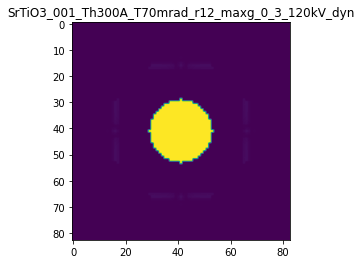

R-factor: 1.1360495510421265e-05

>>> producing the 94. dataset...

The offset applied on thickness: 0.0005384557457096415

The offset applied on Ug: 6.704257452788504

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.53845574570965
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

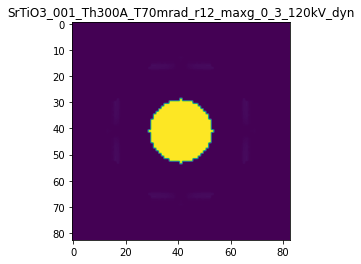

R-factor: 4.133331899907035e-05

>>> producing the 95. dataset...

The offset applied on thickness: 0.0008000342738697717

The offset applied on Ug: -2.42174721885895

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.80003427386976
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

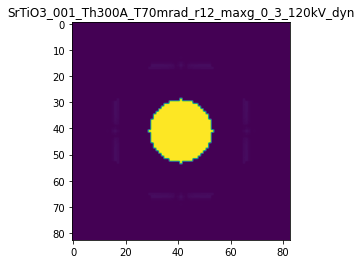

R-factor: 1.4582549410782093e-05

>>> producing the 96. dataset...

The offset applied on thickness: -5.70063212710723e-05

The offset applied on Ug: 1.1195550863304198

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.9429936787289
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

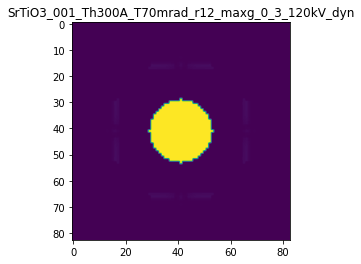

R-factor: 6.99726471356385e-06

>>> producing the 97. dataset...

The offset applied on thickness: 0.00028931683686803344

The offset applied on Ug: -2.260378364473149

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.28931683686807
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

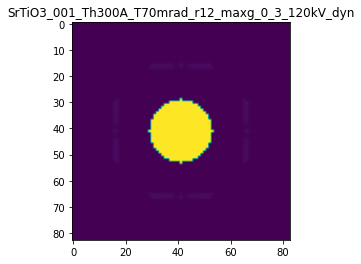

R-factor: 1.3416761908229778e-05

>>> producing the 98. dataset...

The offset applied on thickness: 0.0009710427020644046

The offset applied on Ug: 1.8194748077624787

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.9710427020644
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

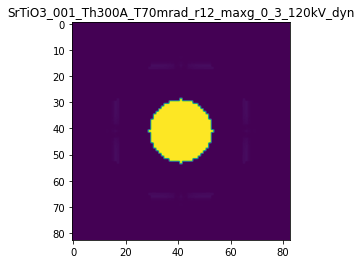

R-factor: 1.0947314826046663e-05

>>> producing the 99. dataset...

The offset applied on thickness: -0.0009737787887737104

The offset applied on Ug: 0.9860399730807308

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.0262212112263
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

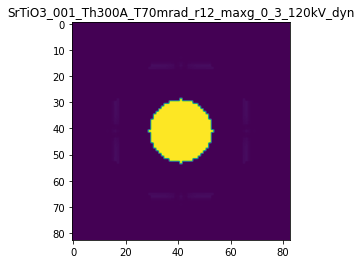

R-factor: 6.700547251248425e-06

>>> producing the 100. dataset...

The offset applied on thickness: -0.0009257187670298695

The offset applied on Ug: -0.3790268589968173

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.0742812329701
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

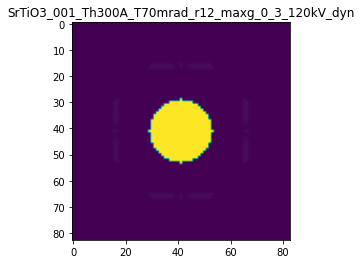

R-factor: 2.4500783347961322e-06

>>> producing the 101. dataset...

The offset applied on thickness: -0.0009851208247696037

The offset applied on Ug: 6.232586833091839

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.0148791752304
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

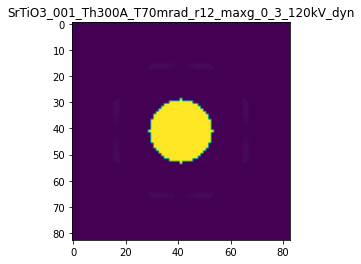

R-factor: 3.908205144037609e-05

>>> producing the 102. dataset...

The offset applied on thickness: 0.000568597230026177

The offset applied on Ug: -7.078067143103226

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.56859723002617
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

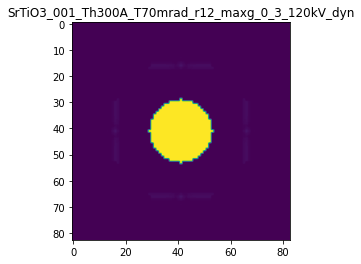

R-factor: 3.6835608596133716e-05

>>> producing the 103. dataset...

The offset applied on thickness: -0.0008674141940739628

The offset applied on Ug: -6.9993203187485165

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.132585805926
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

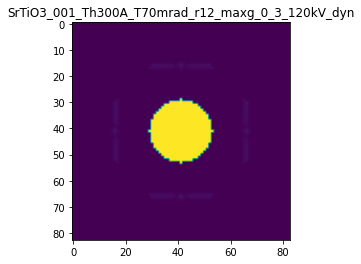

R-factor: 3.654548517439262e-05

>>> producing the 104. dataset...

The offset applied on thickness: -0.0003805717274961187

The offset applied on Ug: -7.96905805382074

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.61942827250385
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

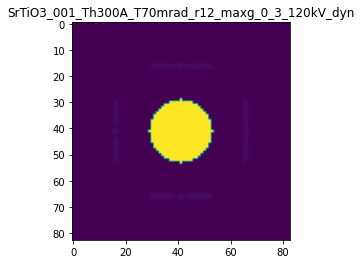

R-factor: 4.011987458601218e-05

>>> producing the 105. dataset...

The offset applied on thickness: 0.0003477277938551258

The offset applied on Ug: 3.0919133950151103

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.3477277938551
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

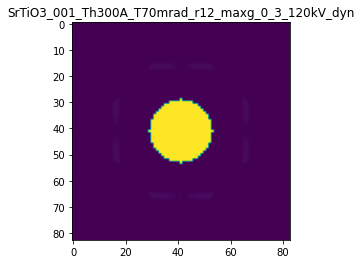

R-factor: 1.9300185450757583e-05

>>> producing the 106. dataset...

The offset applied on thickness: 0.00045119038197801386

The offset applied on Ug: 7.849790751105261

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.451190381978
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

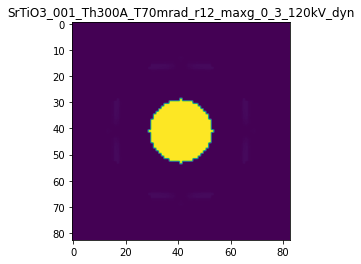

R-factor: 4.789666242891443e-05

>>> producing the 107. dataset...

The offset applied on thickness: -0.0005520535859701074

The offset applied on Ug: 3.6032645321470365

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4479464140299
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

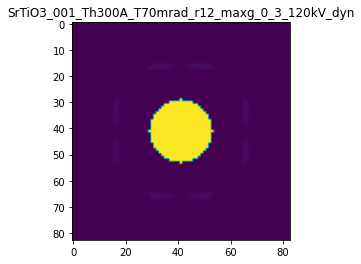

R-factor: 2.2900573675569537e-05

>>> producing the 108. dataset...

The offset applied on thickness: 6.7019827077069e-05

The offset applied on Ug: 6.319080102322837

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.06701982707705
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

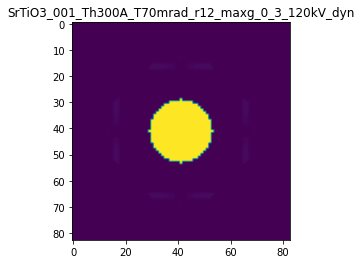

R-factor: 3.923088036029294e-05

>>> producing the 109. dataset...

The offset applied on thickness: 0.0005855040366366551

The offset applied on Ug: -2.6432202288814914

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5855040366366
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

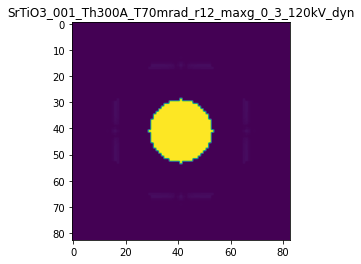

R-factor: 1.5663251214465035e-05

>>> producing the 110. dataset...

The offset applied on thickness: -0.0006518834158503527

The offset applied on Ug: -7.824905008080003

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.34811658414964
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

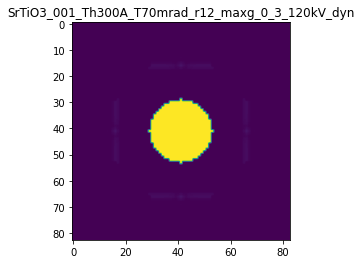

R-factor: 3.963122432094492e-05

>>> producing the 111. dataset...

The offset applied on thickness: -0.00061896636377617

The offset applied on Ug: 0.7376948025570369

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.38103363622383
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

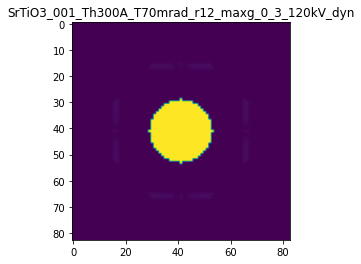

R-factor: 4.935907712173489e-06

>>> producing the 112. dataset...

The offset applied on thickness: 0.0002114308863290839

The offset applied on Ug: 7.302837207801356

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2114308863291
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

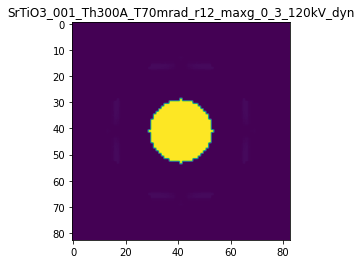

R-factor: 4.48924494113279e-05

>>> producing the 113. dataset...

The offset applied on thickness: 7.778952980993781e-05

The offset applied on Ug: 3.4456426914858684

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.0777895298099
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

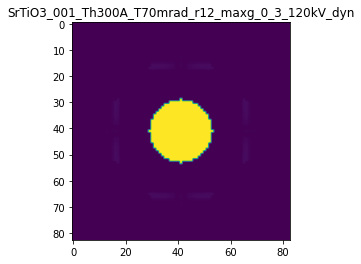

R-factor: 2.164195492783678e-05

>>> producing the 114. dataset...

The offset applied on thickness: -0.00014779432793669202

The offset applied on Ug: 7.290124640674294

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.8522056720633
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

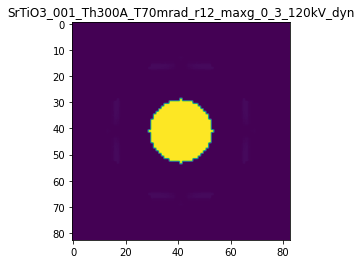

R-factor: 4.4937780002791835e-05

>>> producing the 115. dataset...

The offset applied on thickness: 0.00020248411001972855

The offset applied on Ug: 2.183992851006972

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2024841100197
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

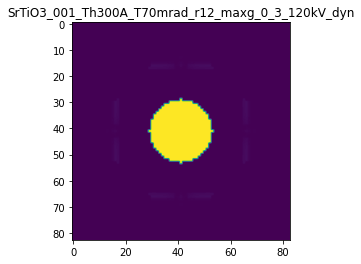

R-factor: 1.3605685400691009e-05

>>> producing the 116. dataset...

The offset applied on thickness: -2.4886095021097844e-05

The offset applied on Ug: -7.989873551463118

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.9751139049789
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

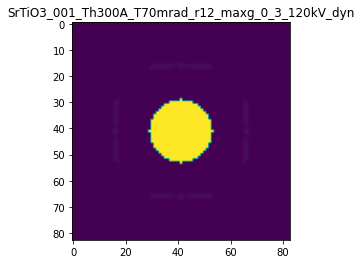

R-factor: 4.018131020353018e-05

>>> producing the 117. dataset...

The offset applied on thickness: 0.0007876599006676481

The offset applied on Ug: -9.840511329456419

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.7876599006676
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

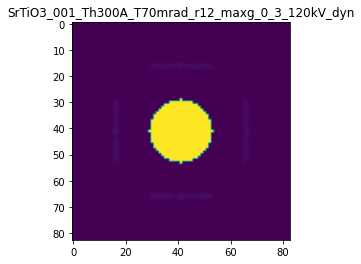

R-factor: 4.590807863687613e-05

>>> producing the 118. dataset...

The offset applied on thickness: -7.987984989509478e-06

The offset applied on Ug: -8.808560513656914

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.99201201501046
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

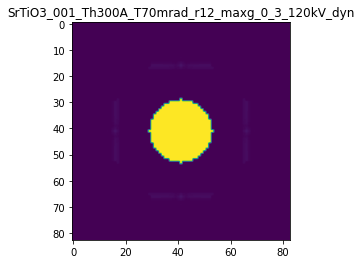

R-factor: 4.279954601309047e-05

>>> producing the 119. dataset...

The offset applied on thickness: -5.7597774673643136e-05

The offset applied on Ug: 1.7417505199217111

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.94240222532636
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

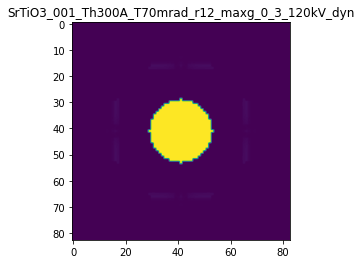

R-factor: 1.0924145016412157e-05

>>> producing the 120. dataset...

The offset applied on thickness: -0.0009874699625621209

The offset applied on Ug: 7.665484890227881

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.0125300374379
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

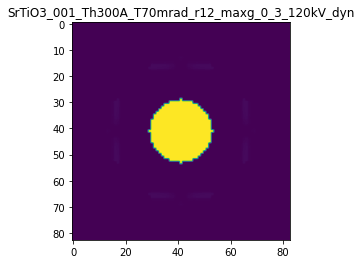

R-factor: 4.733436235001362e-05

>>> producing the 121. dataset...

The offset applied on thickness: 0.00014527965866941784

The offset applied on Ug: 0.5774493382087235

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.1452796586694
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

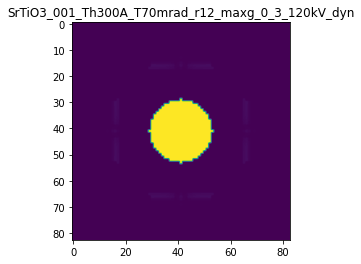

R-factor: 3.5000466999347644e-06

>>> producing the 122. dataset...

The offset applied on thickness: -0.0009547309926119594

The offset applied on Ug: -7.428131007942327

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.045269007388
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

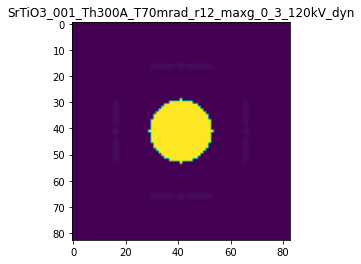

R-factor: 3.820562309668812e-05

>>> producing the 123. dataset...

The offset applied on thickness: -0.0004406663670580973

The offset applied on Ug: -6.022609150535612

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.5593336329419
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

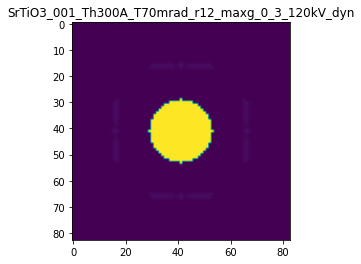

R-factor: 3.2402870258643454e-05

>>> producing the 124. dataset...

The offset applied on thickness: -0.0003175113632922284

The offset applied on Ug: 0.1355180792922397

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.6824886367078
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

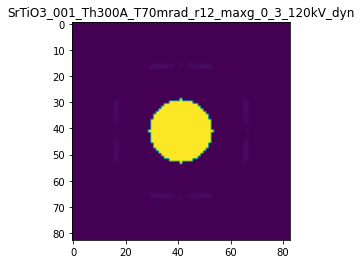

R-factor: 1.0580869967628753e-06

>>> producing the 125. dataset...

The offset applied on thickness: -0.0002487126821428767

The offset applied on Ug: -0.5962269830372862

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.75128731785713
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_fil

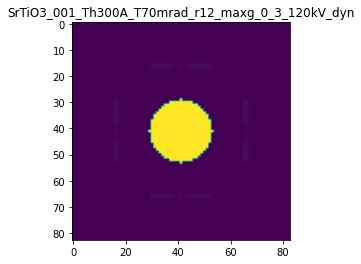

R-factor: 3.5351629031119937e-06

>>> producing the 126. dataset...

The offset applied on thickness: -0.0008787171450206895

The offset applied on Ug: -7.665542422444144

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.1212828549793
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

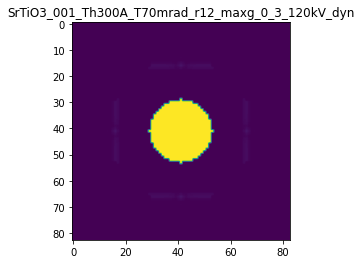

R-factor: 3.907519684632021e-05

>>> producing the 127. dataset...

The offset applied on thickness: 0.0009895680752376867

The offset applied on Ug: -8.79502253856455

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.9895680752377
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

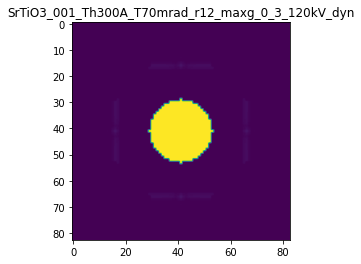

R-factor: 4.2744989489992874e-05

>>> producing the 128. dataset...

The offset applied on thickness: 0.0002383895072588176

The offset applied on Ug: -1.5040410492059642

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.2383895072588
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

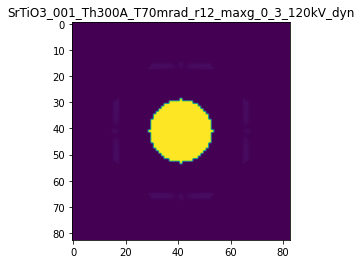

R-factor: 9.106795943347829e-06

>>> producing the 129. dataset...

The offset applied on thickness: 0.0007057887671118717

The offset applied on Ug: 0.6325767086105976

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.70578876711187
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

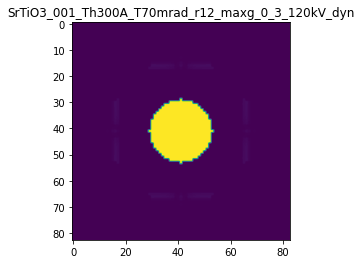

R-factor: 3.742760534338273e-06

>>> producing the 130. dataset...

The offset applied on thickness: -0.0005944721632576093

The offset applied on Ug: 5.2496034616089995

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.4055278367424
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

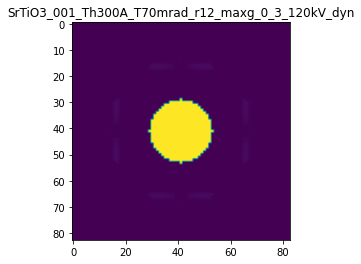

R-factor: 3.304875956296924e-05

>>> producing the 131. dataset...

The offset applied on thickness: 0.0005107072186730997

The offset applied on Ug: -3.5530714110166013

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.5107072186731
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

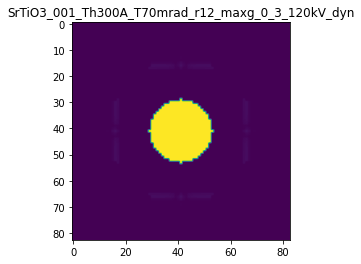

R-factor: 2.0520866043039098e-05

>>> producing the 132. dataset...

The offset applied on thickness: -0.0008214206510455442

The offset applied on Ug: -4.779355212482242

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.17857934895443
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

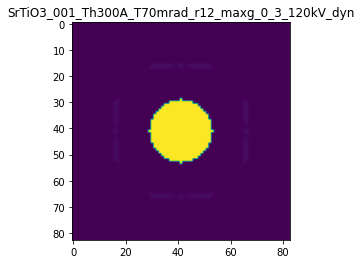

R-factor: 2.6535871895494482e-05

>>> producing the 133. dataset...

The offset applied on thickness: -0.0007805772703127311

The offset applied on Ug: 7.094682532087675

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.21942272968727
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

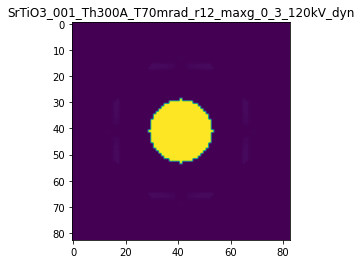

R-factor: 4.40321031515752e-05

>>> producing the 134. dataset...

The offset applied on thickness: -0.0008026711327231371

The offset applied on Ug: 8.839793822434599

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.19732886727684
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/S

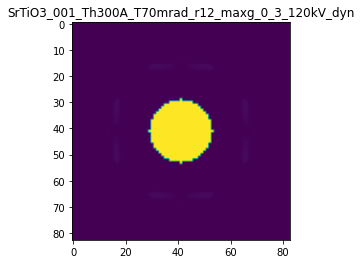

R-factor: 5.367992761515955e-05

>>> producing the 135. dataset...

The offset applied on thickness: 0.0008851258910937047

The offset applied on Ug: 1.7758939460001535

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.88512589109365
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/

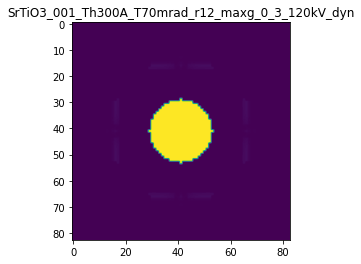

R-factor: 1.0708518252040956e-05

>>> producing the 136. dataset...

The offset applied on thickness: -1.8911475730016835e-05

The offset applied on Ug: -1.9341273942868384

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.98108852427
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

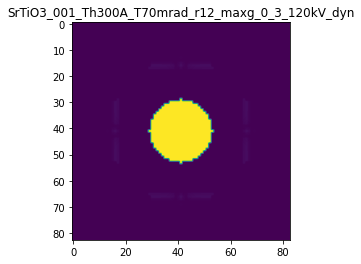

R-factor: 1.1452464732555784e-05

>>> producing the 137. dataset...

The offset applied on thickness: -0.0006350311657531013

The offset applied on Ug: -1.835120448094267

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.3649688342469
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files

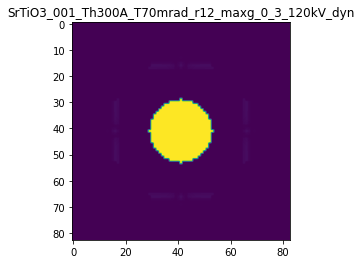

R-factor: 1.0733997654686916e-05

>>> producing the 138. dataset...

The offset applied on thickness: -0.0008543450304555956

The offset applied on Ug: -5.711958414324595

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.14565496954435
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

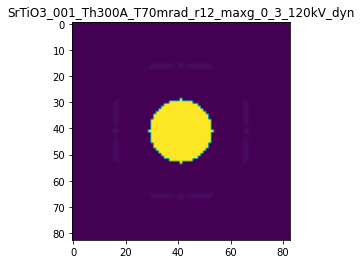

R-factor: 3.1007219904639714e-05

>>> producing the 139. dataset...

The offset applied on thickness: 0.0004952907488073696

The offset applied on Ug: -1.6036593421248926

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=300.49529074880735
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_file

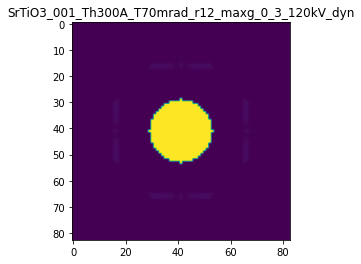

R-factor: 9.841939025654376e-06

>>> producing the 140. dataset...

The offset applied on thickness: -0.0009808451892899723

The offset applied on Ug: -4.872515559241108

mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn/SrTiO3_001_Th300A_T70mrad_r12_maxg_0_3_120kV_dyn.img
zone axis= 		[0.0, 0.0, 1.0]
gx vector= 		[1.0, 0.0, 0.0]
surface normal = 		[0.0, 0.0, 1.0]
tilt offset (mrad) = 		[0.0, 0.0]
approximation = 		0
term threshold = 		0.0001
target Ug = 		0.07
high tension = 		120.0
max g vector = 		0.3
max sg = 		0.2
thickness = 		300.0
scan compensation = 		0.939
tilt range (mrads) = 		70.0
disc radius (pixels) = 		12
detector size x = 		83
thickness=299.01915481071
InputUg = (13,)

* QEDA: Simulation of /Users/chenjie/pyQEDA/crystal_files/Sr

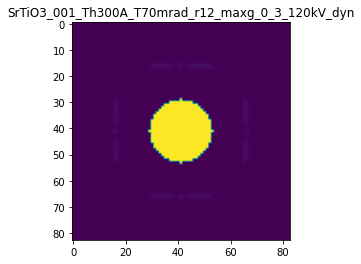

R-factor: 2.6994140432999826e-05



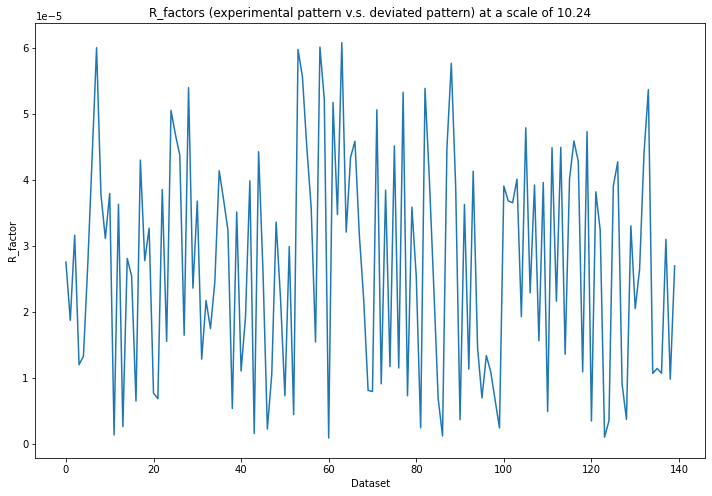

In [10]:
# define training set size & testing set size
trainsize = 100
testsize = 40
data_size = trainsize+testsize

# initial scale used to diverse Ug and t
scale_Ug, scale_t = 10.24, 0.001

# generate Datasets
X, y, R_factors = generate_diversed_data(Ug_t, scale_Ug=scale_Ug, scale_t=scale_t, data_size=data_size)
X = X.reshape(-1, I.shape[1])

X_train = X[:trainsize,]
X_test = X[trainsize:trainsize+testsize,]
y_train = y[:trainsize,]
y_test = y[trainsize:trainsize+testsize,]

In [16]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((100, 6889), (100, 27), (40, 6889), (40, 27))

In [17]:
I.shape

(1, 6889)

---------------------------------------------------------------------------------------------------------------

# II. Neural Network

In [21]:
backend.clear_session()

target_num = y_train.shape[1]
hidden_num = int((2/3)*X_train.shape[1])

intensity_input = Input(shape=(X_train.shape[1],))
x = Dense(units=hidden_num, activation="tanh")(intensity_input)
x = Dense(units=int((1/2)*hidden_num), activation="tanh")(x)
x = Dense(units=target_num, activation="tanh")(x)
x = Dense(units=target_num, activation="tanh")(x)

model = Model(inputs=intensity_input, outputs=x)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 6889)]            0         
_________________________________________________________________
dense (Dense)                (None, 4592)              31638880  
_________________________________________________________________
dense_1 (Dense)              (None, 2296)              10545528  
_________________________________________________________________
dense_2 (Dense)              (None, 27)                62019     
_________________________________________________________________
dense_3 (Dense)              (None, 27)                756       
Total params: 42,247,183
Trainable params: 42,247,183
Non-trainable params: 0
_________________________________________________________________


In [22]:
opt = tf.keras.optimizers.Adam(lr=0.001) 
model.compile(loss='mse', optimizer=opt, metrics='acc')

#save the model
model.save(name+"_ANN.h5")

_________________________________________________________________________________________________________________

# III. Replace the initial training set with new training set

>>>train the initial training set:
Epoch 1/30
5/5 [==============================] - 3s 341ms/step - loss: 0.4367 - acc: 0.1000 - val_loss: 0.4303 - val_acc: 0.2750
Epoch 2/30
5/5 [==============================] - 1s 236ms/step - loss: 0.4253 - acc: 0.2900 - val_loss: 0.4063 - val_acc: 0.2750
Epoch 3/30
5/5 [==============================] - 1s 231ms/step - loss: 0.3950 - acc: 0.2300 - val_loss: 0.3511 - val_acc: 0.0000e+00
Epoch 4/30
5/5 [==============================] - 1s 224ms/step - loss: 0.3534 - acc: 0.0000e+00 - val_loss: 0.3302 - val_acc: 0.0000e+00
Epoch 5/30
5/5 [==============================] - 1s 233ms/step - loss: 0.3180 - acc: 0.0000e+00 - val_loss: 0.2856 - val_acc: 0.0000e+00
Epoch 6/30
5/5 [==============================] - 1s 190ms/step - loss: 0.2720 - acc: 0.0000e+00 - val_loss: 0.2378 - val_acc: 0.0000e+00
Epoch 7/30
5/5 [==============================] - 1s 213ms/step - loss: 0.2200 - acc: 0.0000e+00 - val_loss: 0.1828 - val_acc: 0.0000e+00
Epoch 8/30
5/5 [===

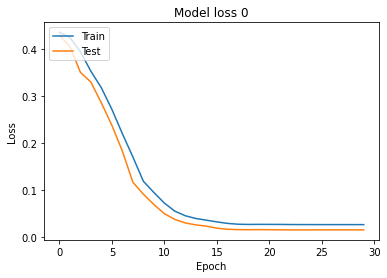

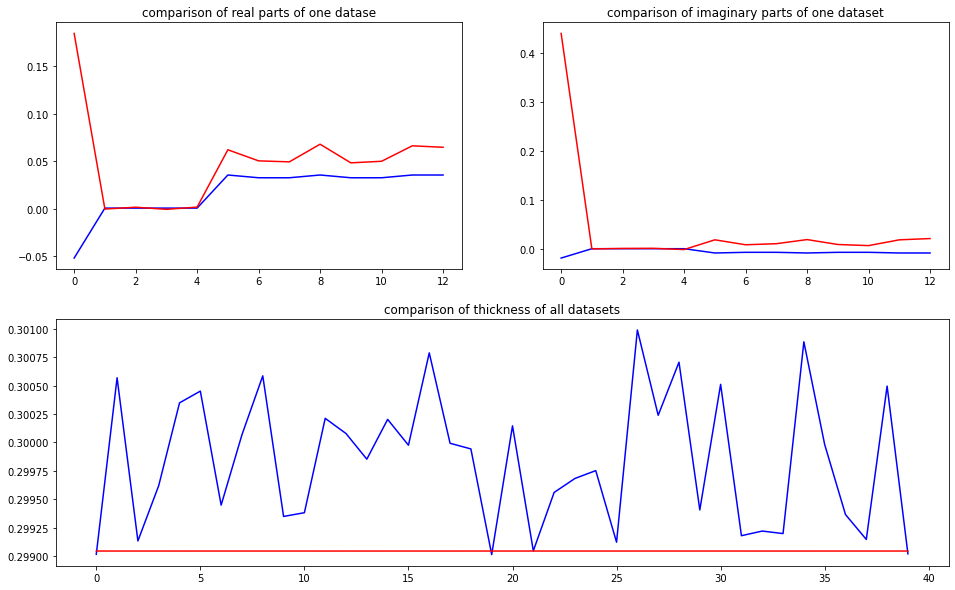

predicted thickness: 0.29904345


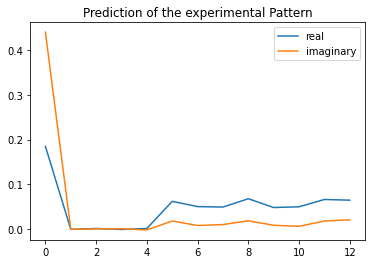

The offset applied on thickness: 9.743145142106635e-05

The offset applied on Ug: 1.251057896877675

Applied shift of unit cell origin (fractional coordinates): -0.20813114708327013 -0.0009623405715973458
Ug[ 0 ]: 0.4691 0.0  =>  0.4691 0.0
Ug[ 1 ]: 0.00062 -0.82297  =>  0.00062 -0.82902
Ug[ 2 ]: 0.00062 0.82297  =>  0.00062 0.82902
Ug[ 3 ]: 0.00131 1.30773  =>  0.00131 0.0
Ug[ 4 ]: 0.00131 -1.30773  =>  0.00131 -0.0
Ug[ 5 ]: 0.07065 -0.01209  =>  0.07065 0.0
Ug[ 6 ]: 0.05329 0.01719  =>  0.05329 -1.28449
Ug[ 7 ]: 0.05183 0.01732  =>  0.05183 1.33109
Ug[ 8 ]: 0.07065 0.01209  =>  0.07065 0.0
Ug[ 9 ]: 0.05183 -0.01732  =>  0.05183 -1.33109
Ug[ 10 ]: 0.05329 -0.01719  =>  0.05329 1.28449
Ug[ 11 ]: 0.07124 -0.01704  =>  0.07124 2.59841
Ug[ 12 ]: 0.07124 0.01704  =>  0.07124 -2.59841
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

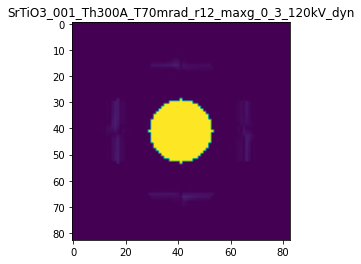

X_sim.max(): 0.9999922384807929
>>>replaced the 1. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 272ms/step - loss: 0.0259 - acc: 0.2900 - val_loss: 0.0145 - val_acc: 0.2500
Epoch 2/5
5/5 [==============================] - 1s 245ms/step - loss: 0.0259 - acc: 0.2900 - val_loss: 0.0145 - val_acc: 0.2500
Epoch 3/5
5/5 [==============================] - 1s 240ms/step - loss: 0.0259 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500
Epoch 4/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0259 - acc: 0.2900 - val_loss: 0.0146 - val_acc: 0.2500
Epoch 5/5
5/5 [==============================] - 1s 257ms/step - loss: 0.0259 - acc: 0.2900 - val_loss: 0.0146 - val_acc: 0.2500


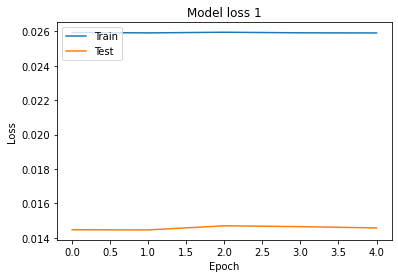

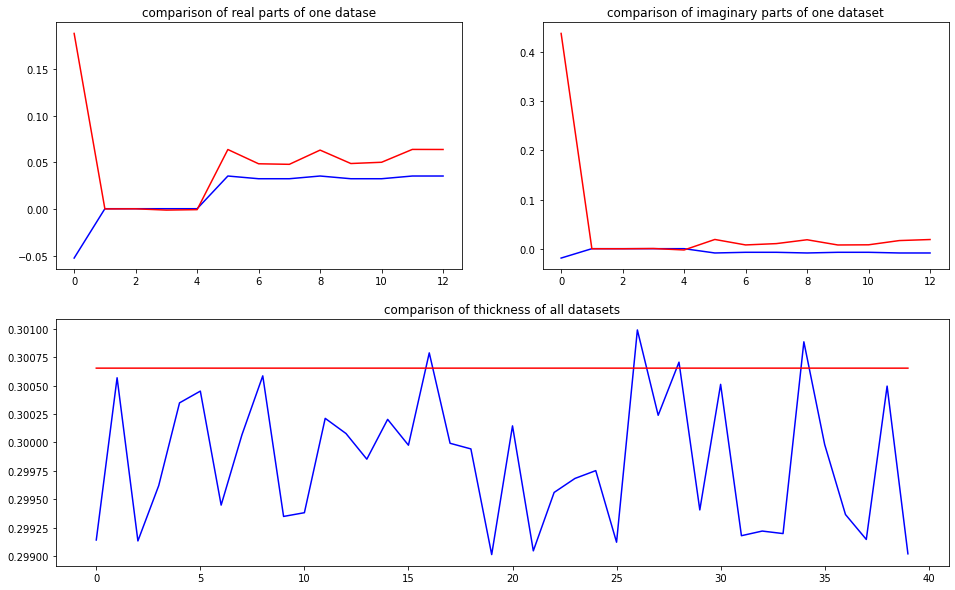

predicted thickness: 0.30065337


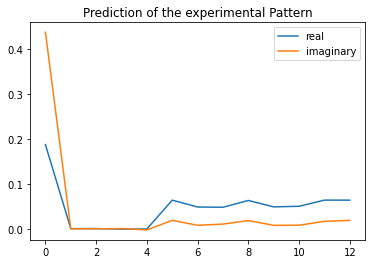

The offset applied on thickness: -0.0004008965312285011

The offset applied on Ug: 1.871765480247806

Applied shift of unit cell origin (fractional coordinates): -0.3254887188459332 0.00047326599803609344
Ug[ 0 ]: 0.6129 0.0  =>  0.6129 0.0
Ug[ 1 ]: 0.0003 0.05227  =>  0.0003 0.05524
Ug[ 2 ]: 0.0003 -0.05227  =>  0.0003 -0.05524
Ug[ 3 ]: 0.00167 2.04511  =>  0.00167 0.0
Ug[ 4 ]: 0.00167 -2.04511  =>  0.00167 0.0
Ug[ 5 ]: 0.07153 0.00595  =>  0.07153 0.0
Ug[ 6 ]: 0.05391 -0.00616  =>  0.05391 -2.05424
Ug[ 7 ]: 0.05283 0.02556  =>  0.05283 2.0677
Ug[ 8 ]: 0.07153 -0.00595  =>  0.07153 0.0
Ug[ 9 ]: 0.05283 -0.02556  =>  0.05283 -2.0677
Ug[ 10 ]: 0.05391 0.00616  =>  0.05391 2.05424
Ug[ 11 ]: 0.07194 -0.01576  =>  0.07194 -2.20874
Ug[ 12 ]: 0.07194 0.01576  =>  0.07194 2.20874
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

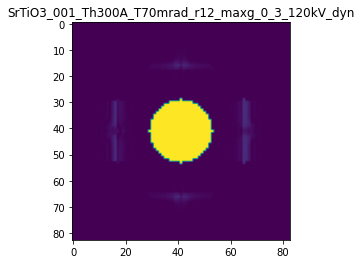

X_sim.max(): 0.9999905022554214
>>>replaced the 2. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 301ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0148 - val_acc: 0.2500
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0148 - val_acc: 0.2500
Epoch 3/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500
Epoch 4/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500
Epoch 5/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0146 - val_acc: 0.2500


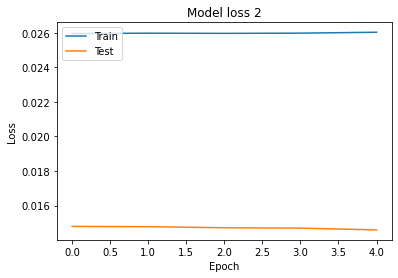

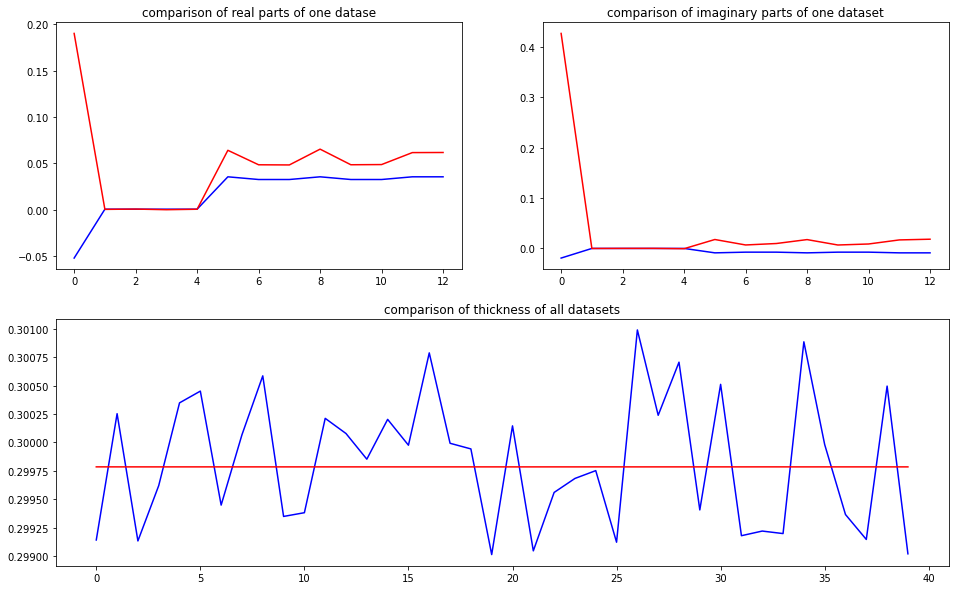

predicted thickness: 0.29978427


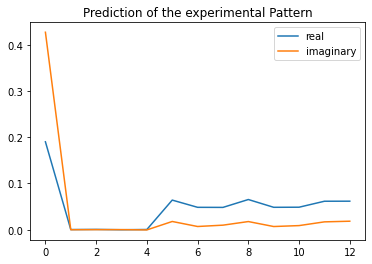

The offset applied on thickness: -0.0005457320986321737

The offset applied on Ug: -0.6063195000968653

Applied shift of unit cell origin (fractional coordinates): -0.17640235982859787 0.00016597959178562099
Ug[ 0 ]: 0.05763 0.0  =>  0.05763 0.0
Ug[ 1 ]: 0.00042 -0.19845  =>  0.00042 -0.19741
Ug[ 2 ]: 0.00042 0.19845  =>  0.00042 0.19741
Ug[ 3 ]: 0.00035 1.10837  =>  0.00035 -0.0
Ug[ 4 ]: 0.00035 -1.10837  =>  0.00035 0.0
Ug[ 5 ]: 0.06187 0.00209  =>  0.06187 -0.0
Ug[ 6 ]: 0.04702 -0.02033  =>  0.04702 -1.12974
Ug[ 7 ]: 0.04685 0.03136  =>  0.04685 1.13868
Ug[ 8 ]: 0.06187 -0.00209  =>  0.06187 0.0
Ug[ 9 ]: 0.04685 -0.03136  =>  0.04685 -1.13868
Ug[ 10 ]: 0.04702 0.02033  =>  0.04702 1.12974
Ug[ 11 ]: 0.05907 -0.01161  =>  0.05907 2.20513
Ug[ 12 ]: 0.05907 0.01161  =>  0.05907 -2.20513
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

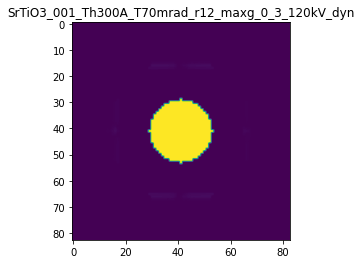

X_sim.max(): 0.9999984905532575
>>>replaced the 3. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 282ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500
Epoch 2/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500
Epoch 3/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0148 - val_acc: 0.2500
Epoch 4/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0149 - val_acc: 0.2500
Epoch 5/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0260 - acc: 0.2900 - val_loss: 0.0147 - val_acc: 0.2500


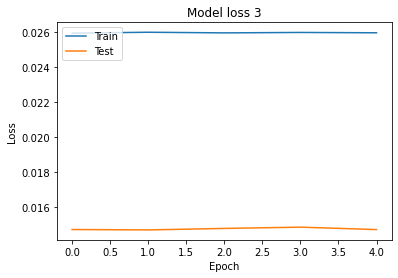

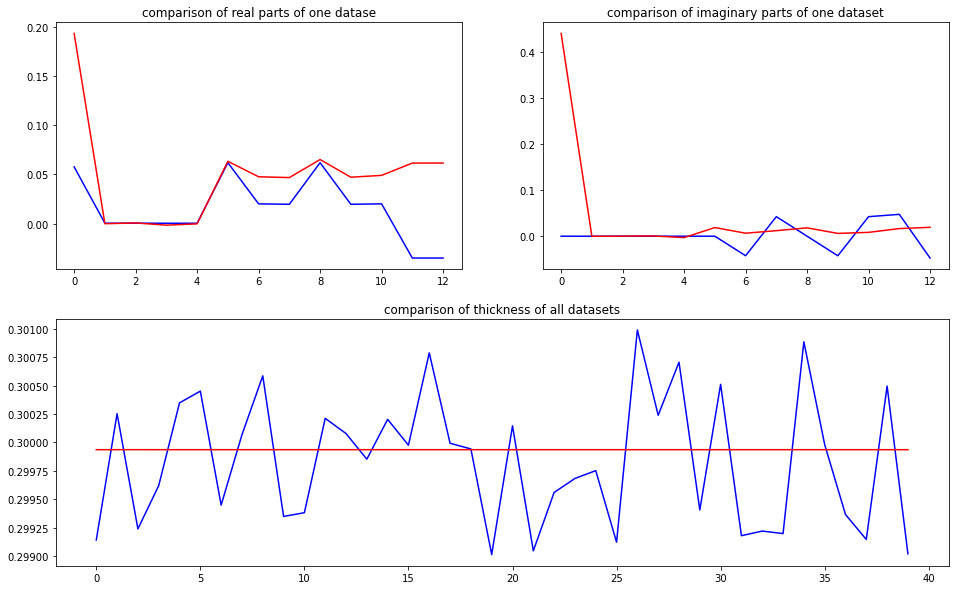

predicted thickness: 0.29993567


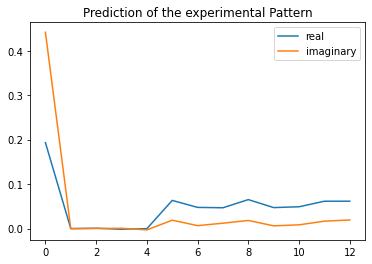

The offset applied on thickness: -0.00045129796021754374

The offset applied on Ug: 2.2695837765996103

Applied shift of unit cell origin (fractional coordinates): -0.3236610594749466 -4.256114155723436e-05
Ug[ 0 ]: 0.7201 0.0  =>  0.7201 0.0
Ug[ 1 ]: 0.00035 -0.66425  =>  0.00035 -0.66452
Ug[ 2 ]: 0.00035 0.66425  =>  0.00035 0.66452
Ug[ 3 ]: 0.00201 2.03362  =>  0.00201 -0.0
Ug[ 4 ]: 0.00201 -2.03362  =>  0.00201 0.0
Ug[ 5 ]: 0.07429 -0.00053  =>  0.07429 0.0
Ug[ 6 ]: 0.0537 -0.02151  =>  0.0537 -2.05486
Ug[ 7 ]: 0.05224 0.05906  =>  0.05224 2.09295
Ug[ 8 ]: 0.07429 0.00053  =>  0.07429 0.0
Ug[ 9 ]: 0.05224 -0.05906  =>  0.05224 -2.09295
Ug[ 10 ]: 0.0537 0.02151  =>  0.0537 2.05486
Ug[ 11 ]: 0.07081 -0.02094  =>  0.07081 -2.23688
Ug[ 12 ]: 0.07081 0.02094  =>  0.07081 2.23688
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

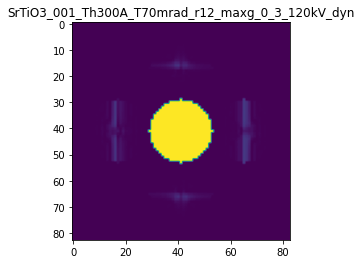

X_sim.max(): 0.9999873577372924
>>>replaced the 4. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 247ms/step - loss: 0.0261 - acc: 0.2900 - val_loss: 0.0150 - val_acc: 0.2500
Epoch 2/5
5/5 [==============================] - 1s 185ms/step - loss: 0.0261 - acc: 0.2900 - val_loss: 0.0148 - val_acc: 0.2500
Epoch 3/5
5/5 [==============================] - 1s 191ms/step - loss: 0.0261 - acc: 0.2900 - val_loss: 0.0149 - val_acc: 0.2500
Epoch 4/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0261 - acc: 0.2900 - val_loss: 0.0148 - val_acc: 0.2500
Epoch 5/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0261 - acc: 0.2900 - val_loss: 0.0149 - val_acc: 0.2500


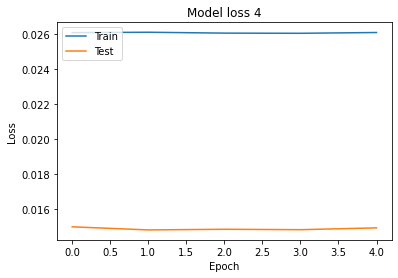

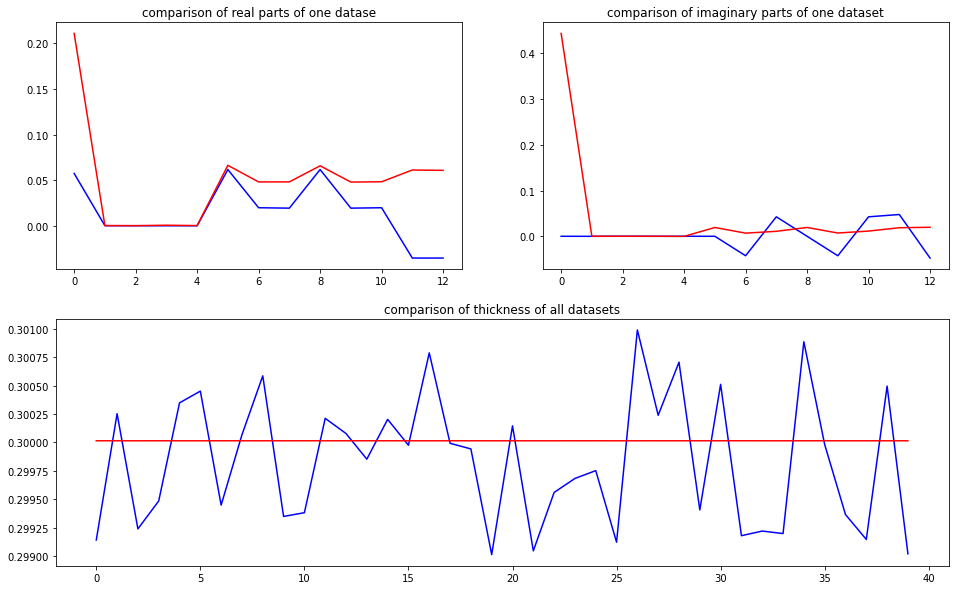

predicted thickness: 0.30001393


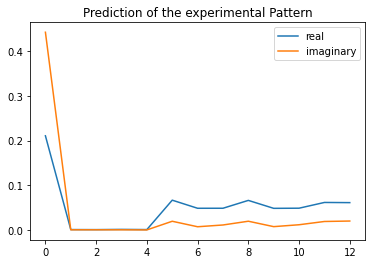

The offset applied on thickness: -2.09506121749119e-05

The offset applied on Ug: 4.413121093154465

Applied shift of unit cell origin (fractional coordinates): -0.023199957422054957 0.00022772765864062037
Ug[ 0 ]: 1.27379 0.0  =>  1.27379 0.0
Ug[ 1 ]: 0.0005 0.02271  =>  0.0005 0.02414
Ug[ 2 ]: 0.0005 -0.02271  =>  0.0005 -0.02414
Ug[ 3 ]: 0.00075 0.14577  =>  0.00075 -0.0
Ug[ 4 ]: 0.00075 -0.14577  =>  0.00075 0.0
Ug[ 5 ]: 0.08723 0.00286  =>  0.08723 -0.0
Ug[ 6 ]: 0.05919 -0.04371  =>  0.05919 -0.19091
Ug[ 7 ]: 0.05896 0.03657  =>  0.05896 0.1809
Ug[ 8 ]: 0.08723 -0.00286  =>  0.08723 0.0
Ug[ 9 ]: 0.05896 -0.03657  =>  0.05896 -0.1809
Ug[ 10 ]: 0.05919 0.04371  =>  0.05919 0.19091
Ug[ 11 ]: 0.07933 -0.00539  =>  0.07933 0.28615
Ug[ 12 ]: 0.07933 0.00539  =>  0.07933 -0.28615
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

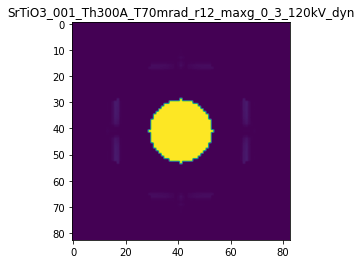

X_sim.max(): 0.9999983186647989
>>>replaced the 5. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 256ms/step - loss: 0.0265 - acc: 0.2900 - val_loss: 0.0161 - val_acc: 0.2500
Epoch 2/5
5/5 [==============================] - 1s 220ms/step - loss: 0.0265 - acc: 0.2900 - val_loss: 0.0160 - val_acc: 0.2500
Epoch 3/5
5/5 [==============================] - 1s 235ms/step - loss: 0.0265 - acc: 0.2900 - val_loss: 0.0161 - val_acc: 0.2500
Epoch 4/5
5/5 [==============================] - 1s 221ms/step - loss: 0.0265 - acc: 0.2900 - val_loss: 0.0161 - val_acc: 0.2500
Epoch 5/5
5/5 [==============================] - 1s 219ms/step - loss: 0.0265 - acc: 0.2900 - val_loss: 0.0162 - val_acc: 0.2500


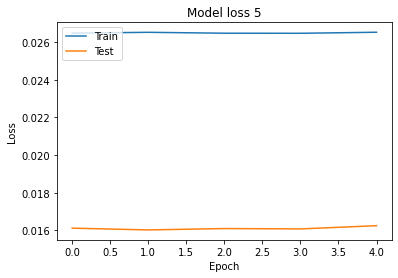

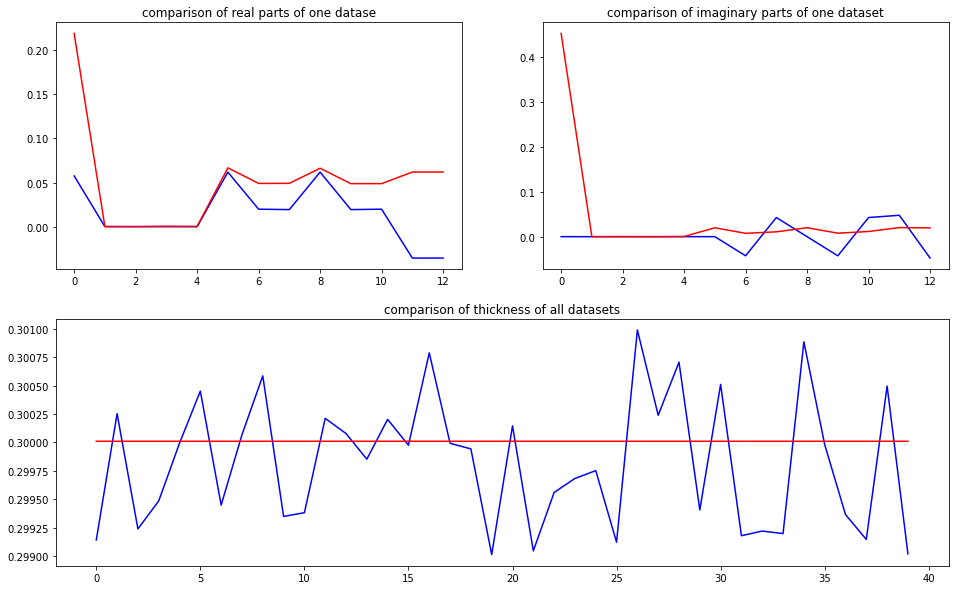

predicted thickness: 0.3000099


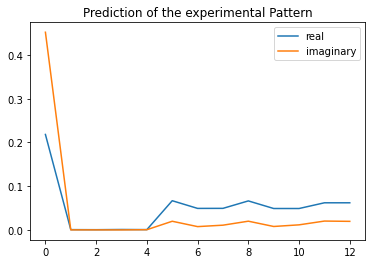

The offset applied on thickness: -0.0004942445514455136

The offset applied on Ug: -3.2085673750836663

Applied shift of unit cell origin (fractional coordinates): 0.049881622888328814 -0.00016634047577680007
Ug[ 0 ]: 0.58989 3.14159  =>  0.58989 3.14159
Ug[ 1 ]: 0.0005 0.04505  =>  0.0005 0.04401
Ug[ 2 ]: 0.0005 -0.04505  =>  0.0005 -0.04401
Ug[ 3 ]: 0.00079 -0.31342  =>  0.00079 0.0
Ug[ 4 ]: 0.00079 0.31342  =>  0.00079 -0.0
Ug[ 5 ]: 0.05103 -0.00209  =>  0.05103 0.0
Ug[ 6 ]: 0.04103 -0.04767  =>  0.04103 0.26679
Ug[ 7 ]: 0.04107 0.03402  =>  0.04107 -0.27835
Ug[ 8 ]: 0.05103 0.00209  =>  0.05103 0.0
Ug[ 9 ]: 0.04107 -0.03402  =>  0.04107 0.27835
Ug[ 10 ]: 0.04103 0.04767  =>  0.04103 -0.26679
Ug[ 11 ]: 0.04837 0.00605  =>  0.04837 -0.62078
Ug[ 12 ]: 0.04837 -0.00605  =>  0.04837 0.62078
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

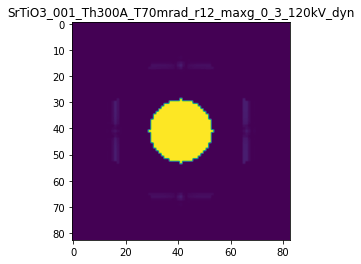

X_sim.max(): 0.9999962417752694
>>>replaced the 6. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 253ms/step - loss: 0.0268 - acc: 0.2800 - val_loss: 0.0157 - val_acc: 0.2250
Epoch 2/5
5/5 [==============================] - 1s 222ms/step - loss: 0.0268 - acc: 0.2800 - val_loss: 0.0156 - val_acc: 0.2250
Epoch 3/5
5/5 [==============================] - 1s 214ms/step - loss: 0.0268 - acc: 0.2800 - val_loss: 0.0154 - val_acc: 0.2250
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0268 - acc: 0.2800 - val_loss: 0.0155 - val_acc: 0.2250
Epoch 5/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0268 - acc: 0.2800 - val_loss: 0.0155 - val_acc: 0.2250


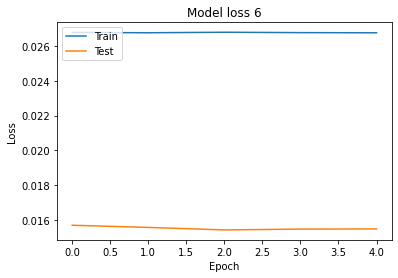

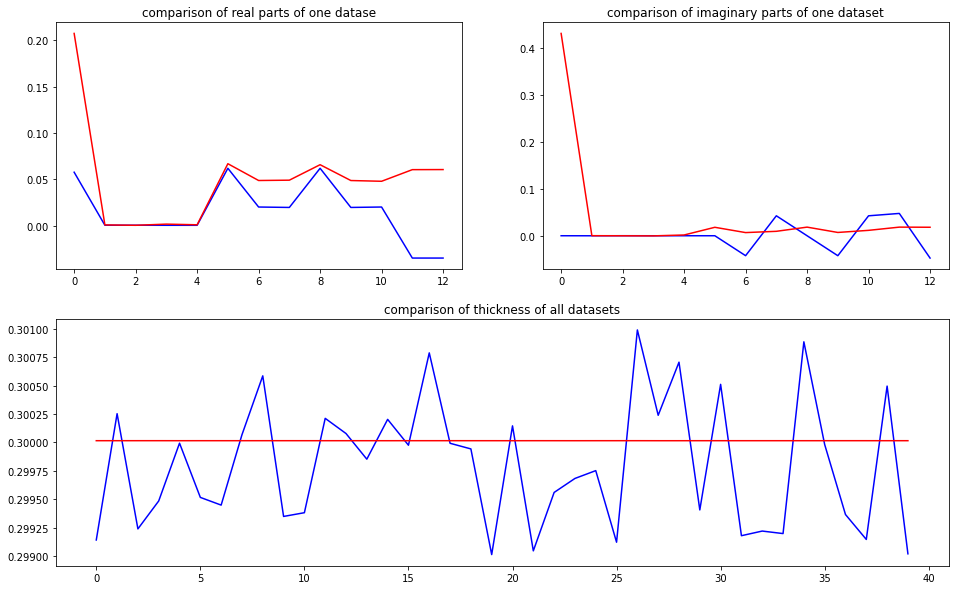

predicted thickness: 0.30001464


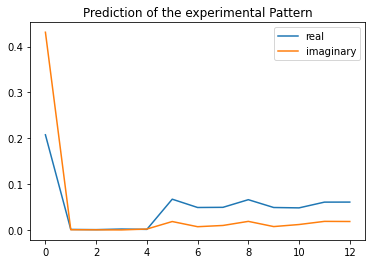

The offset applied on thickness: 0.0006956331458251859

The offset applied on Ug: -1.889754462562282

Applied shift of unit cell origin (fractional coordinates): 0.10325175554536303 -0.0003529037275924112
Ug[ 0 ]: 0.22551 3.14159  =>  0.22551 3.14159
Ug[ 1 ]: 0.00057 0.17828  =>  0.00057 0.17607
Ug[ 2 ]: 0.00057 -0.17828  =>  0.00057 -0.17607
Ug[ 3 ]: 0.00157 -0.64875  =>  0.00157 0.0
Ug[ 4 ]: 0.00157 0.64875  =>  0.00157 0.0
Ug[ 5 ]: 0.05734 -0.00443  =>  0.05734 0.0
Ug[ 6 ]: 0.04377 -0.05428  =>  0.04377 0.59669
Ug[ 7 ]: 0.04423 0.02615  =>  0.04423 -0.62038
Ug[ 8 ]: 0.05734 0.00443  =>  0.05734 -0.0
Ug[ 9 ]: 0.04423 -0.02615  =>  0.04423 0.62038
Ug[ 10 ]: 0.04377 0.05428  =>  0.04377 -0.59669
Ug[ 11 ]: 0.05291 0.00247  =>  0.05291 -1.29503
Ug[ 12 ]: 0.05291 -0.00247  =>  0.05291 1.29503
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

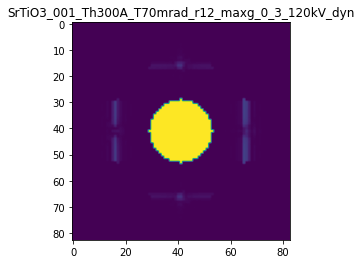

X_sim.max(): 0.9999895191467836
>>>replaced the 7. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 250ms/step - loss: 0.0266 - acc: 0.2700 - val_loss: 0.0158 - val_acc: 0.2000
Epoch 2/5
5/5 [==============================] - 1s 194ms/step - loss: 0.0267 - acc: 0.2700 - val_loss: 0.0157 - val_acc: 0.2000
Epoch 3/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0268 - acc: 0.2700 - val_loss: 0.0154 - val_acc: 0.2000
Epoch 4/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0266 - acc: 0.2700 - val_loss: 0.0155 - val_acc: 0.2000
Epoch 5/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0267 - acc: 0.2700 - val_loss: 0.0158 - val_acc: 0.2000


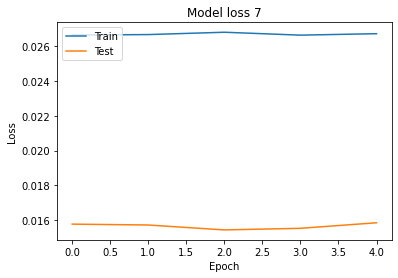

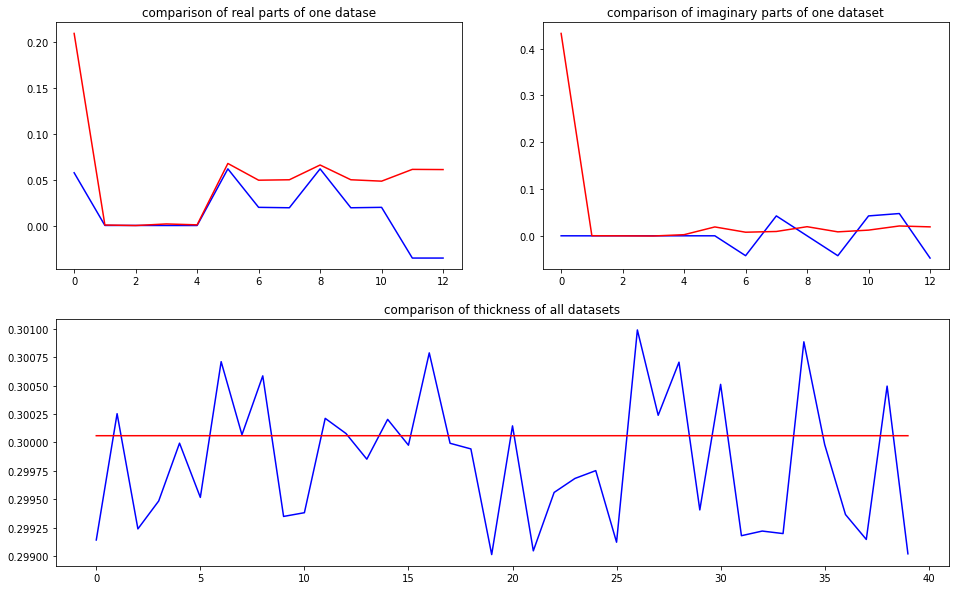

predicted thickness: 0.30005872


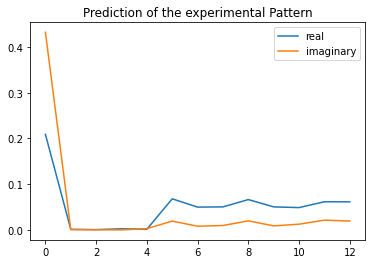

The offset applied on thickness: 0.0008342062430800863

The offset applied on Ug: 2.226879341633829

Applied shift of unit cell origin (fractional coordinates): 0.11630966351767773 8.810516754087845e-05
Ug[ 0 ]: 0.72294 0.0  =>  0.72294 0.0
Ug[ 1 ]: 0.00062 0.24549  =>  0.00062 0.24604
Ug[ 2 ]: 0.00062 -0.24549  =>  0.00062 -0.24604
Ug[ 3 ]: 0.0021 -0.7308  =>  0.0021 0.0
Ug[ 4 ]: 0.0021 0.7308  =>  0.0021 0.0
Ug[ 5 ]: 0.07769 0.00111  =>  0.07769 0.0
Ug[ 6 ]: 0.05466 -0.0404  =>  0.05466 0.68984
Ug[ 7 ]: 0.05577 0.00747  =>  0.05577 -0.72388
Ug[ 8 ]: 0.07769 -0.00111  =>  0.07769 -0.0
Ug[ 9 ]: 0.05577 -0.00747  =>  0.05577 0.72388
Ug[ 10 ]: 0.05466 0.0404  =>  0.05466 -0.68984
Ug[ 11 ]: 0.07045 0.01572  =>  0.07045 -1.44587
Ug[ 12 ]: 0.07045 -0.01572  =>  0.07045 1.44587
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

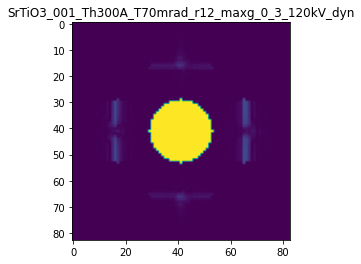

X_sim.max(): 0.9999822117002667
>>>replaced the 8. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 244ms/step - loss: 0.0247 - acc: 0.2600 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 2/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0246 - acc: 0.2600 - val_loss: 0.0156 - val_acc: 0.1750
Epoch 3/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0246 - acc: 0.2600 - val_loss: 0.0153 - val_acc: 0.1750
Epoch 4/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0246 - acc: 0.2600 - val_loss: 0.0154 - val_acc: 0.1750
Epoch 5/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0246 - acc: 0.2600 - val_loss: 0.0154 - val_acc: 0.1750


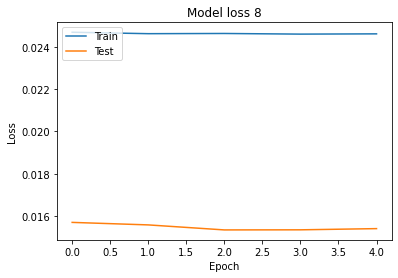

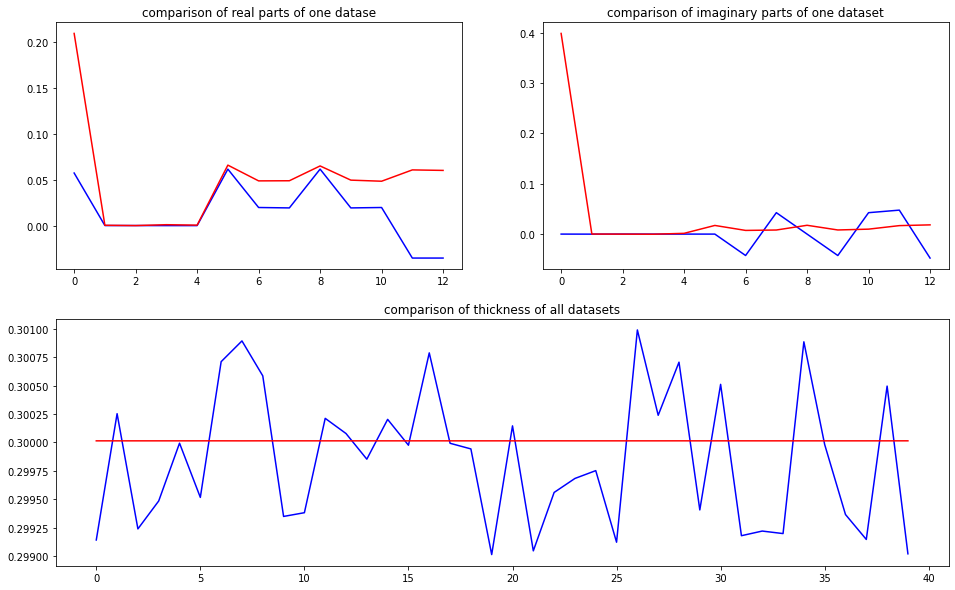

predicted thickness: 0.30001357


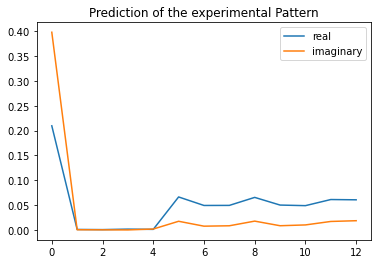

The offset applied on thickness: 0.00024795096419517735

The offset applied on Ug: -3.5794653335516142

Applied shift of unit cell origin (fractional coordinates): 0.10849715193315992 -0.00036602570865348753
Ug[ 0 ]: 0.51593 3.14159  =>  0.51593 3.14159
Ug[ 1 ]: 0.00054 0.1593  =>  0.00054 0.157
Ug[ 2 ]: 0.00054 -0.1593  =>  0.00054 -0.157
Ug[ 3 ]: 0.0014 -0.68171  =>  0.0014 0.0
Ug[ 4 ]: 0.0014 0.68171  =>  0.0014 0.0
Ug[ 5 ]: 0.04922 -0.0046  =>  0.04922 0.0
Ug[ 6 ]: 0.04008 -0.03093  =>  0.04008 0.65307
Ug[ 7 ]: 0.04052 0.00055  =>  0.04052 -0.67886
Ug[ 8 ]: 0.04922 0.0046  =>  0.04922 0.0
Ug[ 9 ]: 0.04052 -0.00055  =>  0.04052 0.67886
Ug[ 10 ]: 0.04008 0.03093  =>  0.04008 -0.65307
Ug[ 11 ]: 0.04644 -0.01588  =>  0.04644 -1.3793
Ug[ 12 ]: 0.04644 0.01588  =>  0.04644 1.3793
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

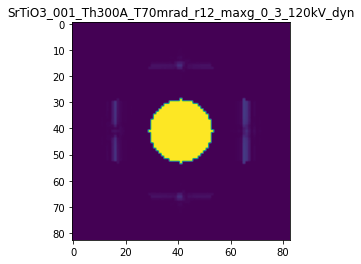

X_sim.max(): 0.9999913414798373
>>>replaced the 9. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 305ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1750
Epoch 2/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 3/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 4/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1750
Epoch 5/5
5/5 [==============================] - 1s 215ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1750


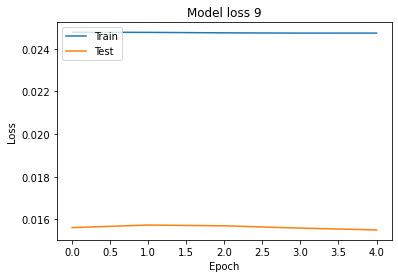

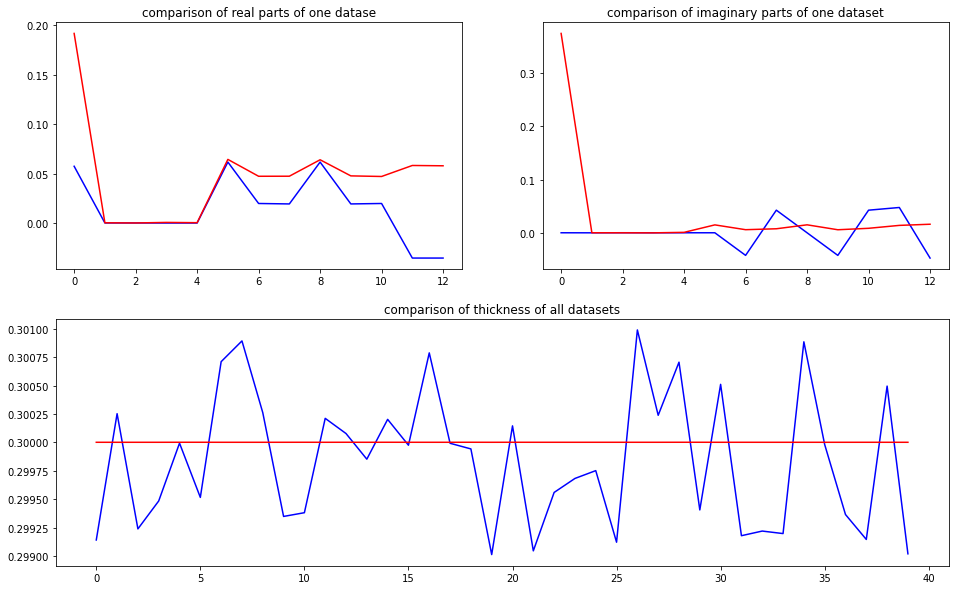

predicted thickness: 0.30000106


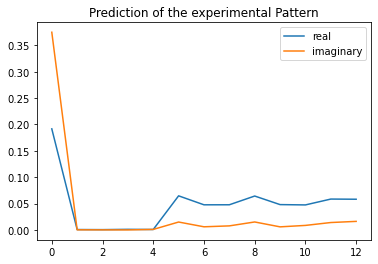

The offset applied on thickness: 0.0005003493775279373

The offset applied on Ug: -1.4338129430013302

Applied shift of unit cell origin (fractional coordinates): 0.08171823132771815 -0.00011474765393114843
Ug[ 0 ]: 0.06275 3.14159  =>  0.06275 3.14159
Ug[ 1 ]: 0.0005 0.08795  =>  0.0005 0.08723
Ug[ 2 ]: 0.0005 -0.08795  =>  0.0005 -0.08723
Ug[ 3 ]: 0.00095 -0.51345  =>  0.00095 -0.0
Ug[ 4 ]: 0.00095 0.51345  =>  0.00095 0.0
Ug[ 5 ]: 0.05812 -0.00144  =>  0.05812 0.0
Ug[ 6 ]: 0.04415 -0.02945  =>  0.04415 0.48472
Ug[ 7 ]: 0.04444 0.02089  =>  0.04444 -0.49184
Ug[ 8 ]: 0.05812 0.00144  =>  0.05812 0.0
Ug[ 9 ]: 0.04444 -0.02089  =>  0.04444 0.49184
Ug[ 10 ]: 0.04415 0.02945  =>  0.04415 -0.48472
Ug[ 11 ]: 0.05309 -0.02019  =>  0.05309 -1.0471
Ug[ 12 ]: 0.05309 0.02019  =>  0.05309 1.0471
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

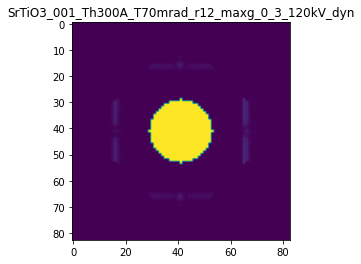

X_sim.max(): 0.9999951420529788
>>>replaced the 10. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 244ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 2/5
5/5 [==============================] - 1s 192ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1750
Epoch 3/5
5/5 [==============================] - 1s 209ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 4/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1750
Epoch 5/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1750


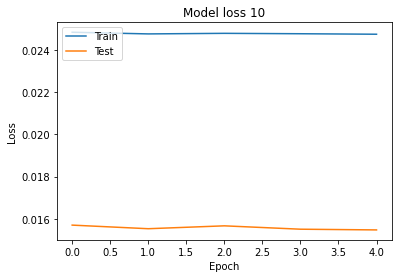

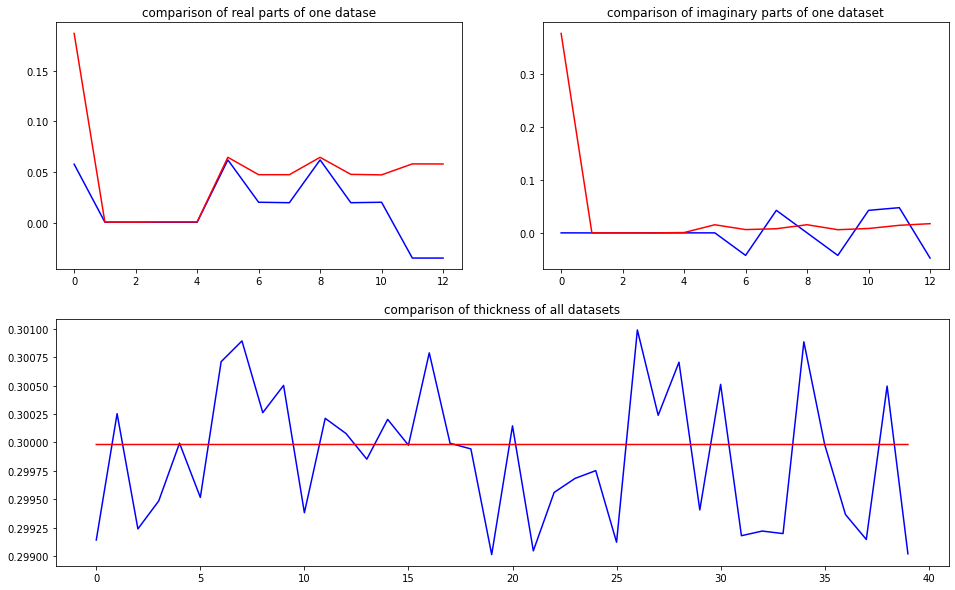

predicted thickness: 0.29998162


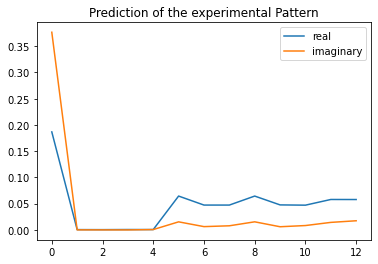

The offset applied on thickness: 1.4692245602329734e-05

The offset applied on Ug: -1.5965294152500624

Applied shift of unit cell origin (fractional coordinates): 0.07605481924714626 -3.171818958080357e-05
Ug[ 0 ]: 0.0954 3.14159  =>  0.0954 3.14159
Ug[ 1 ]: 0.00047 0.04407  =>  0.00047 0.04387
Ug[ 2 ]: 0.00047 -0.04407  =>  0.00047 -0.04387
Ug[ 3 ]: 0.00072 -0.47787  =>  0.00072 -0.0
Ug[ 4 ]: 0.00072 0.47787  =>  0.00072 0.0
Ug[ 5 ]: 0.05743 -0.0004  =>  0.05743 0.0
Ug[ 6 ]: 0.04355 -0.02339  =>  0.04355 0.45468
Ug[ 7 ]: 0.04377 0.02078  =>  0.04377 -0.45689
Ug[ 8 ]: 0.05743 0.0004  =>  0.05743 0.0
Ug[ 9 ]: 0.04377 -0.02078  =>  0.04377 0.45689
Ug[ 10 ]: 0.04355 0.02339  =>  0.04355 -0.45468
Ug[ 11 ]: 0.05215 -0.02861  =>  0.05215 -0.98435
Ug[ 12 ]: 0.05215 0.02861  =>  0.05215 0.98435
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

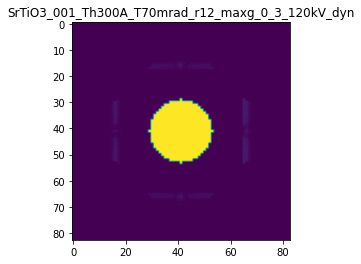

X_sim.max(): 0.9999969493303618
>>>replaced the 11. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 251ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1750
Epoch 2/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1750
Epoch 3/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0247 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 4/5
5/5 [==============================] - 1s 192ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1750
Epoch 5/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0159 - val_acc: 0.1750


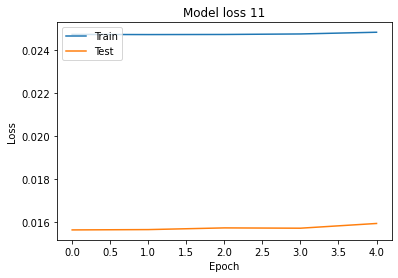

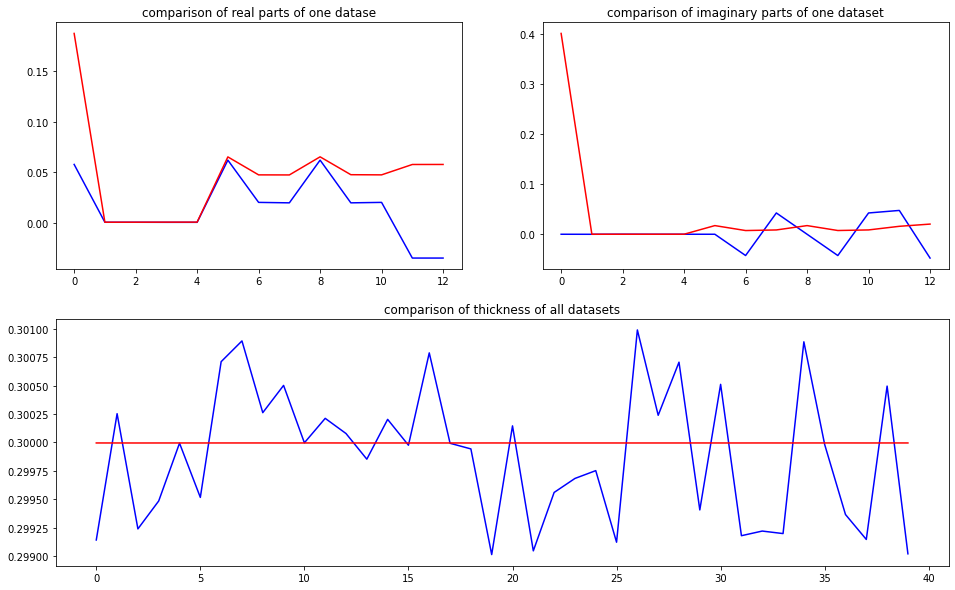

predicted thickness: 0.2999948


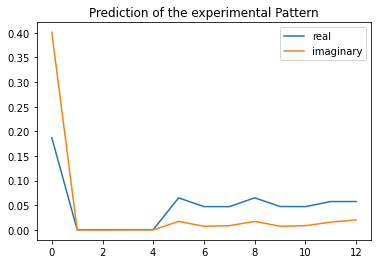

The offset applied on thickness: 0.0005384088084746488

The offset applied on Ug: 1.9821763462921032

Applied shift of unit cell origin (fractional coordinates): 0.008661299487054675 -9.756747779538356e-06
Ug[ 0 ]: 0.57579 0.0  =>  0.57579 0.0
Ug[ 1 ]: 0.00046 -0.00822  =>  0.00046 -0.00828
Ug[ 2 ]: 0.00046 0.00822  =>  0.00046 0.00828
Ug[ 3 ]: 0.00053 -0.05442  =>  0.00053 -0.0
Ug[ 4 ]: 0.00053 0.05442  =>  0.00053 0.0
Ug[ 5 ]: 0.0741 -0.00012  =>  0.0741 0.0
Ug[ 6 ]: 0.05186 -0.0123  =>  0.05186 0.04218
Ug[ 7 ]: 0.05192 0.01057  =>  0.05192 -0.04379
Ug[ 8 ]: 0.0741 0.00012  =>  0.0741 -0.0
Ug[ 9 ]: 0.05192 -0.01057  =>  0.05192 0.04379
Ug[ 10 ]: 0.05186 0.0123  =>  0.05186 -0.04218
Ug[ 11 ]: 0.06486 -0.03727  =>  0.06486 -0.14611
Ug[ 12 ]: 0.06486 0.03727  =>  0.06486 0.14611
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

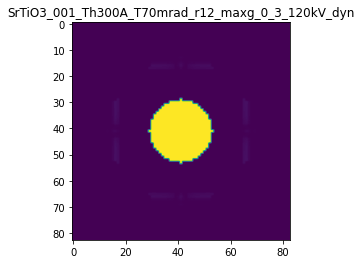

X_sim.max(): 0.9999989533202629
>>>replaced the 12. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 279ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0154 - val_acc: 0.1500
Epoch 2/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0152 - val_acc: 0.1500
Epoch 3/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0151 - val_acc: 0.1500
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0149 - val_acc: 0.1500
Epoch 5/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0248 - acc: 0.2500 - val_loss: 0.0149 - val_acc: 0.1500


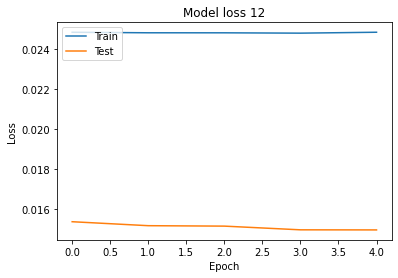

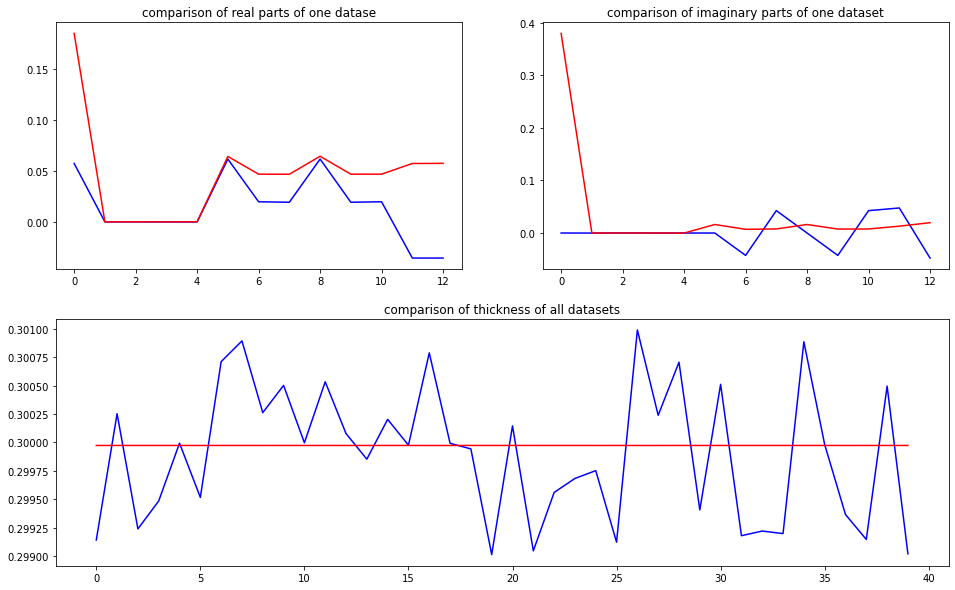

predicted thickness: 0.29997286


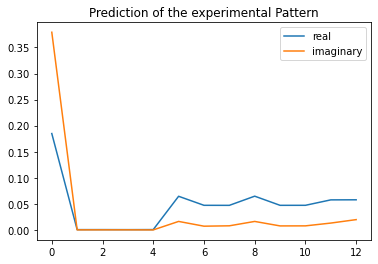

The offset applied on thickness: -7.180581181126855e-05

The offset applied on Ug: 3.9397550099140153

Applied shift of unit cell origin (fractional coordinates): -0.024816362959339918 -9.08842762564329e-05
Ug[ 0 ]: 0.88611 0.0  =>  0.88611 0.0
Ug[ 1 ]: 0.00045 -0.02735  =>  0.00045 -0.02793
Ug[ 2 ]: 0.00045 0.02735  =>  0.00045 0.02793
Ug[ 3 ]: 0.00046 0.15593  =>  0.00046 0.0
Ug[ 4 ]: 0.00046 -0.15593  =>  0.00046 0.0
Ug[ 5 ]: 0.08198 -0.00114  =>  0.08198 -0.0
Ug[ 6 ]: 0.05606 -0.00605  =>  0.05606 -0.16141
Ug[ 7 ]: 0.05601 0.00179  =>  0.05601 0.15829
Ug[ 8 ]: 0.08198 0.00114  =>  0.08198 0.0
Ug[ 9 ]: 0.05601 -0.00179  =>  0.05601 -0.15829
Ug[ 10 ]: 0.05606 0.00605  =>  0.05606 0.16141
Ug[ 11 ]: 0.07189 -0.0561  =>  0.07189 0.25575
Ug[ 12 ]: 0.07189 0.0561  =>  0.07189 -0.25575
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

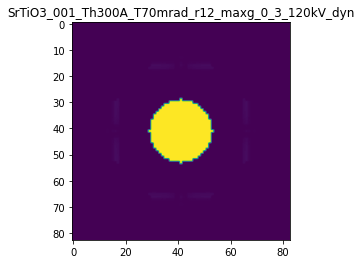

X_sim.max(): 0.9999991787485653
>>>replaced the 13. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 240ms/step - loss: 0.0249 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1250
Epoch 2/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0250 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1250
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0250 - acc: 0.2500 - val_loss: 0.0154 - val_acc: 0.1250
Epoch 4/5
5/5 [==============================] - 1s 218ms/step - loss: 0.0250 - acc: 0.2500 - val_loss: 0.0153 - val_acc: 0.1250
Epoch 5/5
5/5 [==============================] - 1s 222ms/step - loss: 0.0249 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1250


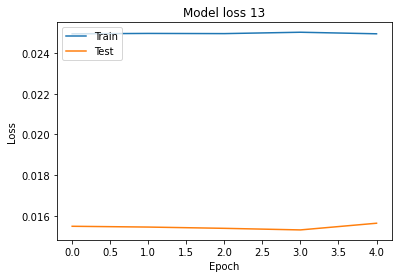

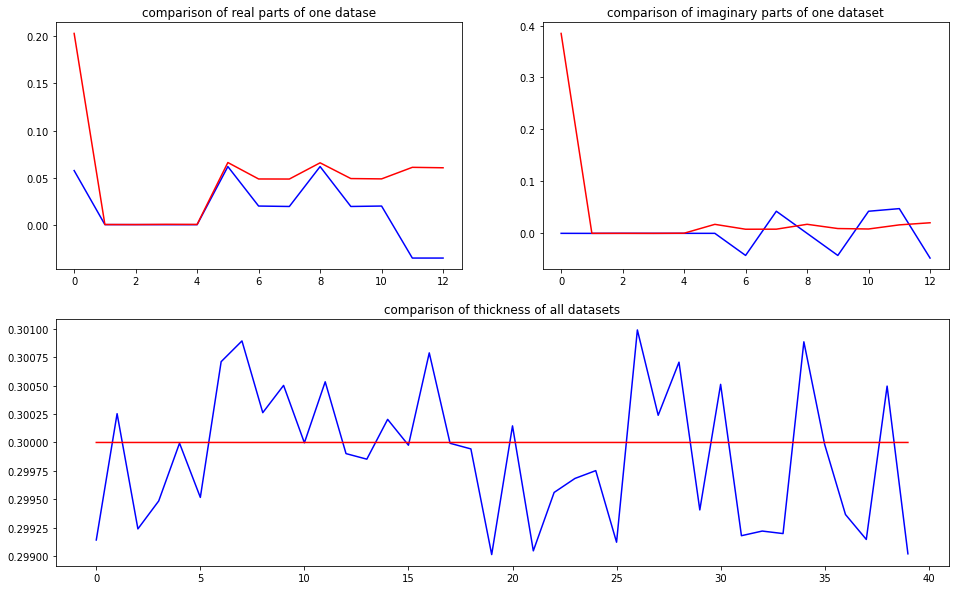

predicted thickness: 0.2999992


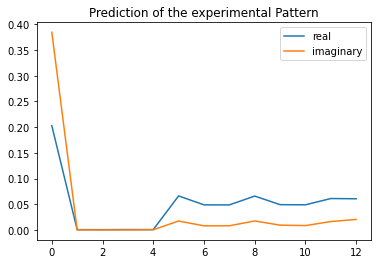

The offset applied on thickness: 0.0002919945201154679

The offset applied on Ug: 3.0261428270168267

Applied shift of unit cell origin (fractional coordinates): 0.034888694942114266 4.2481811627274024e-05
Ug[ 0 ]: 0.77546 0.0  =>  0.77546 0.0
Ug[ 1 ]: 0.00048 0.03386  =>  0.00048 0.03413
Ug[ 2 ]: 0.00048 -0.03386  =>  0.00048 -0.03413
Ug[ 3 ]: 0.00066 -0.21921  =>  0.00066 0.0
Ug[ 4 ]: 0.00066 0.21921  =>  0.00066 -0.0
Ug[ 5 ]: 0.0801 0.00053  =>  0.0801 -0.0
Ug[ 6 ]: 0.05619 -0.00477  =>  0.05619 0.21417
Ug[ 7 ]: 0.05639 -0.0135  =>  0.05639 -0.23298
Ug[ 8 ]: 0.0801 -0.00053  =>  0.0801 0.0
Ug[ 9 ]: 0.05639 0.0135  =>  0.05639 0.23298
Ug[ 10 ]: 0.05619 0.00477  =>  0.05619 -0.21417
Ug[ 11 ]: 0.07309 -0.03027  =>  0.07309 -0.46869
Ug[ 12 ]: 0.07309 0.03027  =>  0.07309 0.46869
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

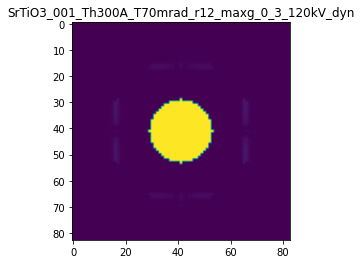

X_sim.max(): 0.9999986482838854
>>>replaced the 14. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 261ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 228ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0155 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0154 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 1s 191ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0153 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 1s 273ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0151 - val_acc: 0.1000


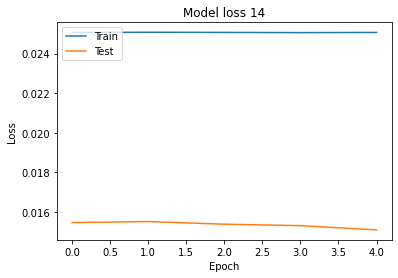

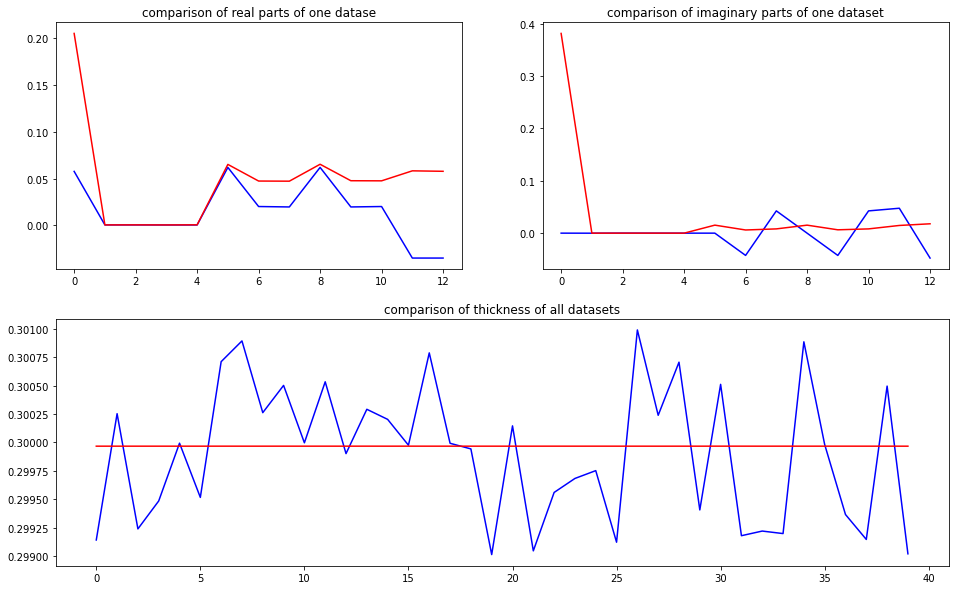

predicted thickness: 0.29996663


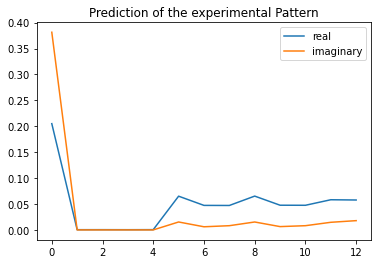

The offset applied on thickness: 0.0009852440588440266

The offset applied on Ug: -1.5103061684300376

Applied shift of unit cell origin (fractional coordinates): -0.004544217142296326 2.6997855085622693e-05
Ug[ 0 ]: 0.07823 3.14159  =>  0.07823 3.14159
Ug[ 1 ]: 0.00044 -0.01887  =>  0.00044 -0.0187
Ug[ 2 ]: 0.00044 0.01887  =>  0.00044 0.0187
Ug[ 3 ]: 0.00045 0.02855  =>  0.00045 0.0
Ug[ 4 ]: 0.00045 -0.02855  =>  0.00045 -0.0
Ug[ 5 ]: 0.0584 0.00034  =>  0.0584 0.0
Ug[ 6 ]: 0.04396 -0.02306  =>  0.04396 -0.05178
Ug[ 7 ]: 0.04394 0.02016  =>  0.04394 0.04855
Ug[ 8 ]: 0.0584 -0.00034  =>  0.0584 -0.0
Ug[ 9 ]: 0.04394 -0.02016  =>  0.04394 -0.04855
Ug[ 10 ]: 0.04396 0.02306  =>  0.04396 0.05178
Ug[ 11 ]: 0.05251 -0.02966  =>  0.05251 0.02744
Ug[ 12 ]: 0.05251 0.02966  =>  0.05251 -0.02744
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

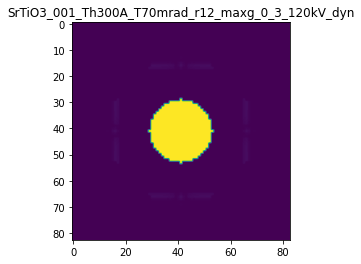

X_sim.max(): 0.9999986745434951
>>>replaced the 15. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 276ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0153 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 256ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0154 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 241ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0151 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 1s 251ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0152 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 1s 242ms/step - loss: 0.0251 - acc: 0.2500 - val_loss: 0.0153 - val_acc: 0.1000


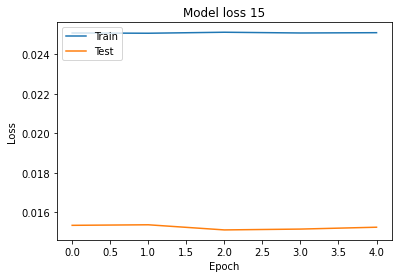

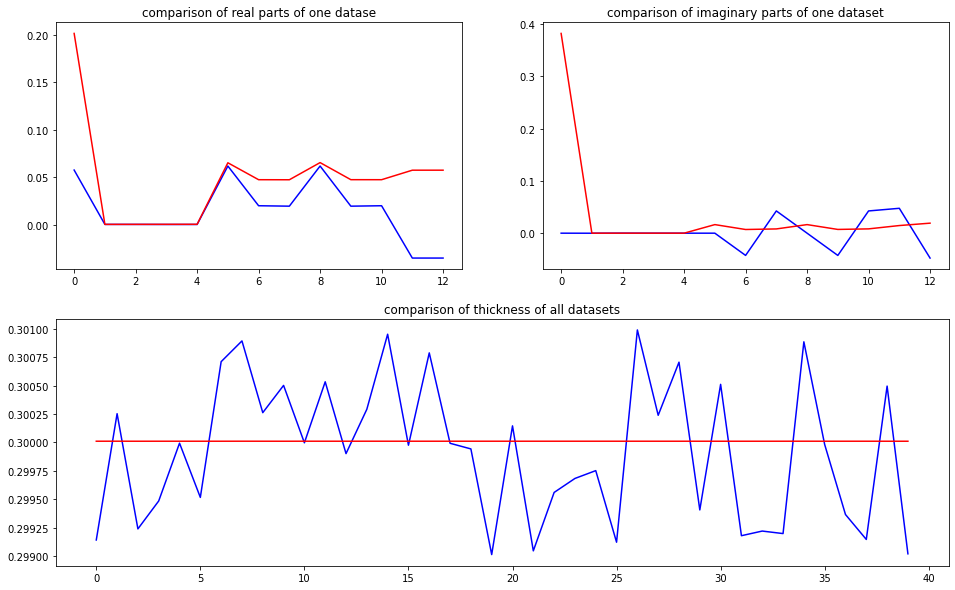

predicted thickness: 0.30001017


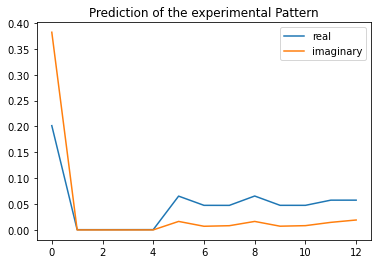

The offset applied on thickness: 0.0004966510015647119

The offset applied on Ug: 4.253163877626147

Applied shift of unit cell origin (fractional coordinates): 0.0021315508431702973 -0.00010283170687062466
Ug[ 0 ]: 0.99473 0.0  =>  0.99473 0.0
Ug[ 1 ]: 0.00046 -0.01153  =>  0.00046 -0.01217
Ug[ 2 ]: 0.00046 0.01153  =>  0.00046 0.01217
Ug[ 3 ]: 0.00052 -0.01339  =>  0.00052 0.0
Ug[ 4 ]: 0.00052 0.01339  =>  0.00052 0.0
Ug[ 5 ]: 0.08473 -0.00129  =>  0.08473 -0.0
Ug[ 6 ]: 0.05733 -0.01148  =>  0.05733 0.00256
Ug[ 7 ]: 0.0573 0.00859  =>  0.0573 -0.00416
Ug[ 8 ]: 0.08473 0.00129  =>  0.08473 0.0
Ug[ 9 ]: 0.0573 -0.00859  =>  0.0573 0.00416
Ug[ 10 ]: 0.05733 0.01148  =>  0.05733 -0.00256
Ug[ 11 ]: 0.07285 -0.03861  =>  0.07285 -0.0654
Ug[ 12 ]: 0.07285 0.03861  =>  0.07285 0.0654
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

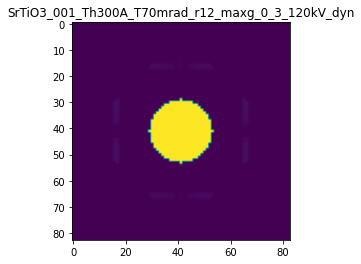

X_sim.max(): 0.9999991319867785
>>>replaced the 16. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 321ms/step - loss: 0.0253 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 228ms/step - loss: 0.0253 - acc: 0.2500 - val_loss: 0.0159 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 215ms/step - loss: 0.0253 - acc: 0.2500 - val_loss: 0.0160 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0253 - acc: 0.2500 - val_loss: 0.0160 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0253 - acc: 0.2500 - val_loss: 0.0158 - val_acc: 0.1000


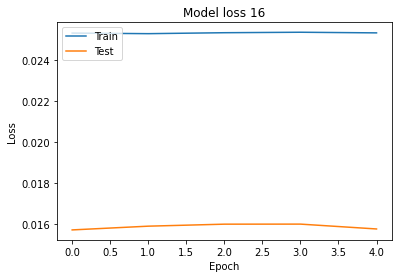

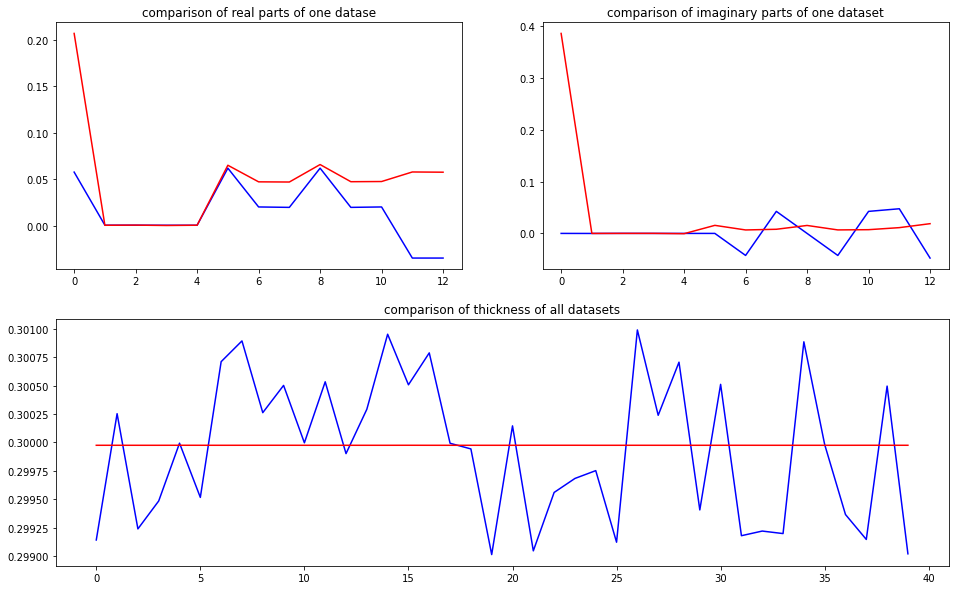

predicted thickness: 0.29997435


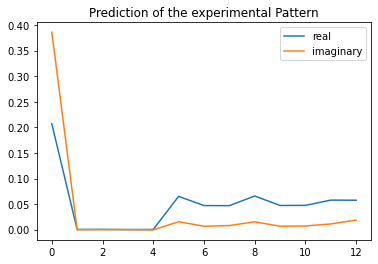

The offset applied on thickness: -0.0004637110837433278

The offset applied on Ug: 3.4181559210617034

Applied shift of unit cell origin (fractional coordinates): -0.14095700822176907 -0.00019155326204975943
Ug[ 0 ]: 0.86297 0.0  =>  0.86297 0.0
Ug[ 1 ]: 0.00041 -0.09032  =>  0.00041 -0.09152
Ug[ 2 ]: 0.00041 0.09032  =>  0.00041 0.09152
Ug[ 3 ]: 0.00039 0.88566  =>  0.00039 -0.0
Ug[ 4 ]: 0.00039 -0.88566  =>  0.00039 0.0
Ug[ 5 ]: 0.08083 -0.00241  =>  0.08083 0.0
Ug[ 6 ]: 0.05513 -0.00667  =>  0.05513 -0.89113
Ug[ 7 ]: 0.0549 0.01059  =>  0.0549 0.89745
Ug[ 8 ]: 0.08083 0.00241  =>  0.08083 0.0
Ug[ 9 ]: 0.0549 -0.01059  =>  0.0549 -0.89745
Ug[ 10 ]: 0.05513 0.00667  =>  0.05513 0.89113
Ug[ 11 ]: 0.06996 -0.06182  =>  0.06996 1.7095
Ug[ 12 ]: 0.06996 0.06182  =>  0.06996 -1.7095
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

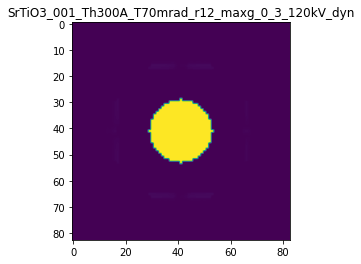

X_sim.max(): 0.9999988793278567
>>>replaced the 17. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 224ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0158 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0158 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1000


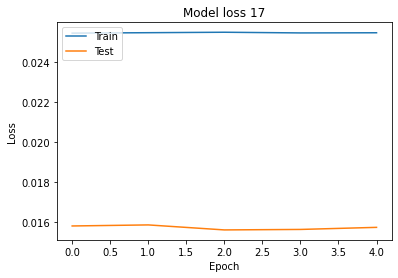

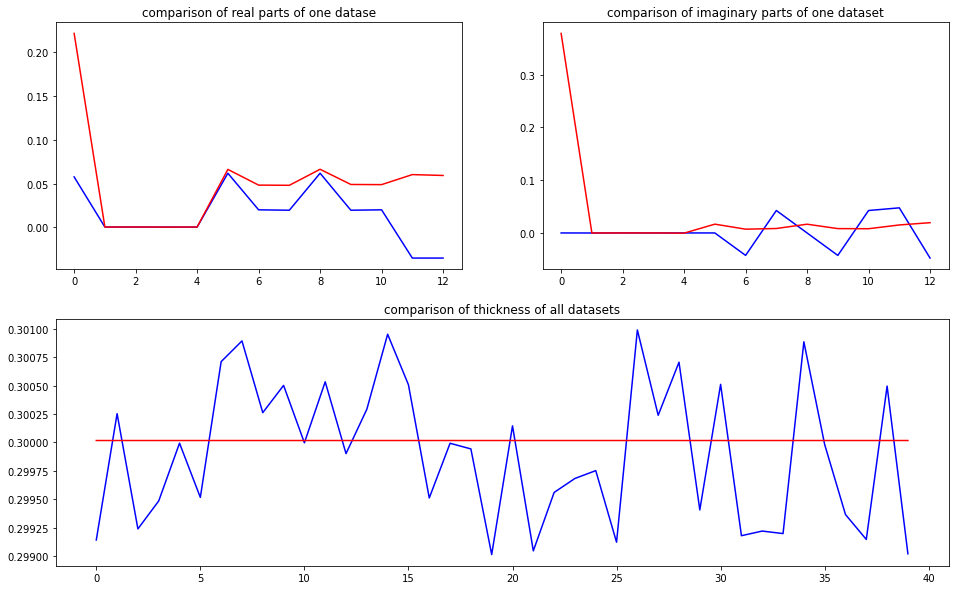

predicted thickness: 0.3000164


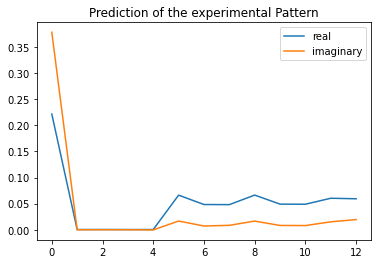

The offset applied on thickness: 9.148382237984398e-05

The offset applied on Ug: -0.5286907530428374

Applied shift of unit cell origin (fractional coordinates): -0.06992374106923159 5.6144565041996045e-05
Ug[ 0 ]: 0.11997 0.0  =>  0.11997 0.0
Ug[ 1 ]: 0.00044 -0.04514  =>  0.00044 -0.04478
Ug[ 2 ]: 0.00044 0.04514  =>  0.00044 0.04478
Ug[ 3 ]: 0.00045 0.43934  =>  0.00045 0.0
Ug[ 4 ]: 0.00045 -0.43934  =>  0.00045 -0.0
Ug[ 5 ]: 0.06383 0.00071  =>  0.06383 0.0
Ug[ 6 ]: 0.04729 -0.00876  =>  0.04729 -0.44845
Ug[ 7 ]: 0.04726 0.00268  =>  0.04726 0.44167
Ug[ 8 ]: 0.06383 -0.00071  =>  0.06383 -0.0
Ug[ 9 ]: 0.04726 -0.00268  =>  0.04726 -0.44167
Ug[ 10 ]: 0.04729 0.00876  =>  0.04729 0.44845
Ug[ 11 ]: 0.0578 -0.03716  =>  0.0578 0.84152
Ug[ 12 ]: 0.0578 0.03716  =>  0.0578 -0.84152
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

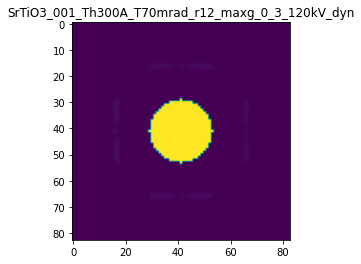

X_sim.max(): 0.9999987132036561
>>>replaced the 18. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 323ms/step - loss: 0.0254 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 232ms/step - loss: 0.0254 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 303ms/step - loss: 0.0255 - acc: 0.2500 - val_loss: 0.0156 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 2s 315ms/step - loss: 0.0254 - acc: 0.2500 - val_loss: 0.0157 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 2s 342ms/step - loss: 0.0254 - acc: 0.2500 - val_loss: 0.0159 - val_acc: 0.1000


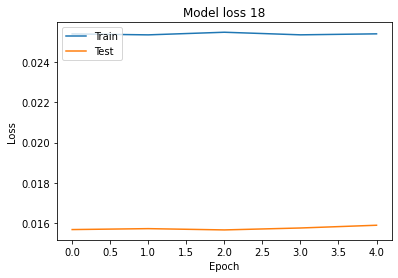

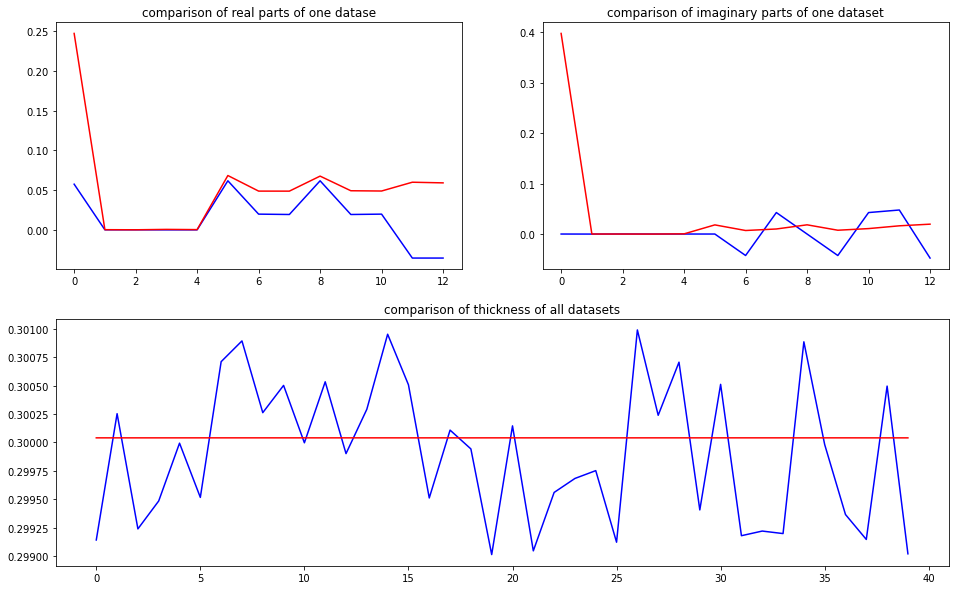

predicted thickness: 0.30003983


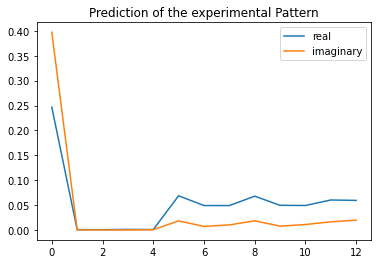

The offset applied on thickness: -0.0007399974997842973

The offset applied on Ug: 3.5455152345270977

Applied shift of unit cell origin (fractional coordinates): 0.038658340751195695 0.00023185592001063608
Ug[ 0 ]: 1.02179 0.0  =>  1.02179 0.0
Ug[ 1 ]: 0.00051 0.04117  =>  0.00051 0.04262
Ug[ 2 ]: 0.00051 -0.04117  =>  0.00051 -0.04262
Ug[ 3 ]: 0.00082 -0.2429  =>  0.00082 0.0
Ug[ 4 ]: 0.00082 0.2429  =>  0.00082 0.0
Ug[ 5 ]: 0.08573 0.00291  =>  0.08573 0.0
Ug[ 6 ]: 0.05785 -0.03623  =>  0.05785 0.20521
Ug[ 7 ]: 0.058 0.0207  =>  0.058 -0.22365
Ug[ 8 ]: 0.08573 -0.00291  =>  0.08573 0.0
Ug[ 9 ]: 0.058 -0.0207  =>  0.058 0.22365
Ug[ 10 ]: 0.05785 0.03623  =>  0.05785 -0.20521
Ug[ 11 ]: 0.07347 -0.02238  =>  0.07347 -0.50818
Ug[ 12 ]: 0.07347 0.02238  =>  0.07347 0.50818
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70

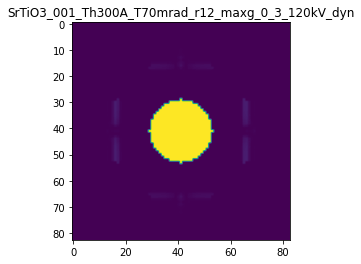

X_sim.max(): 0.9999978699852863
>>>replaced the 19. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 248ms/step - loss: 0.0256 - acc: 0.2500 - val_loss: 0.0164 - val_acc: 0.1000
Epoch 2/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0256 - acc: 0.2500 - val_loss: 0.0164 - val_acc: 0.1000
Epoch 3/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0256 - acc: 0.2500 - val_loss: 0.0164 - val_acc: 0.1000
Epoch 4/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0256 - acc: 0.2500 - val_loss: 0.0163 - val_acc: 0.1000
Epoch 5/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0256 - acc: 0.2500 - val_loss: 0.0163 - val_acc: 0.1000


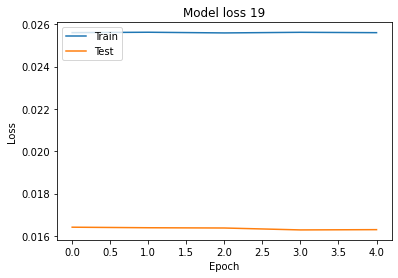

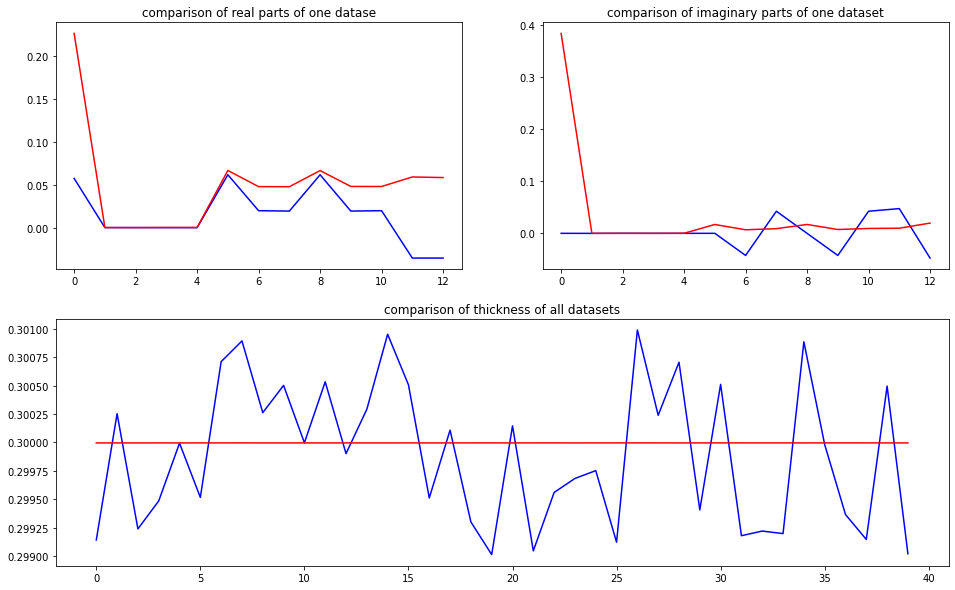

predicted thickness: 0.29999524


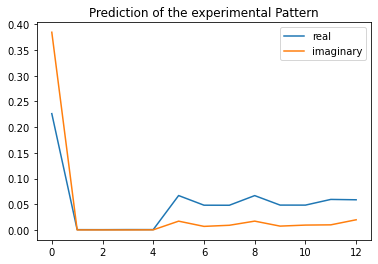

The offset applied on thickness: 0.0006105693870387108

The offset applied on Ug: -0.33499883439223155

Applied shift of unit cell origin (fractional coordinates): 0.01891613853247806 -3.900513844855235e-05
Ug[ 0 ]: 0.15955 0.0  =>  0.15955 0.0
Ug[ 1 ]: 0.00047 0.00568  =>  0.00047 0.00543
Ug[ 2 ]: 0.00047 -0.00568  =>  0.00047 -0.00543
Ug[ 3 ]: 0.00061 -0.11885  =>  0.00061 0.0
Ug[ 4 ]: 0.00061 0.11885  =>  0.00061 -0.0
Ug[ 5 ]: 0.06521 -0.00049  =>  0.06521 0.0
Ug[ 6 ]: 0.04738 -0.0265  =>  0.04738 0.0926
Ug[ 7 ]: 0.04734 0.01741  =>  0.04734 -0.1012
Ug[ 8 ]: 0.06521 0.00049  =>  0.06521 0.0
Ug[ 9 ]: 0.04734 -0.01741  =>  0.04734 0.1012
Ug[ 10 ]: 0.04738 0.0265  =>  0.04738 -0.0926
Ug[ 11 ]: 0.05794 -0.08468  =>  0.05794 -0.32239
Ug[ 12 ]: 0.05794 0.08468  =>  0.05794 0.32239
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

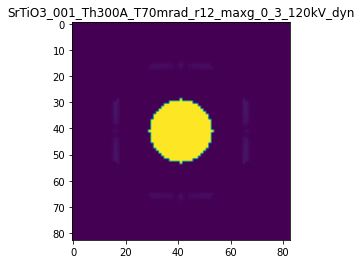

X_sim.max(): 0.9999983826378654
>>>replaced the 20. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 257ms/step - loss: 0.0256 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0256 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0256 - acc: 0.2400 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 194ms/step - loss: 0.0256 - acc: 0.2400 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0256 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750


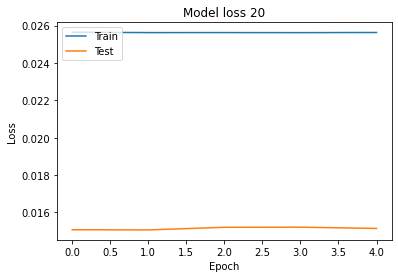

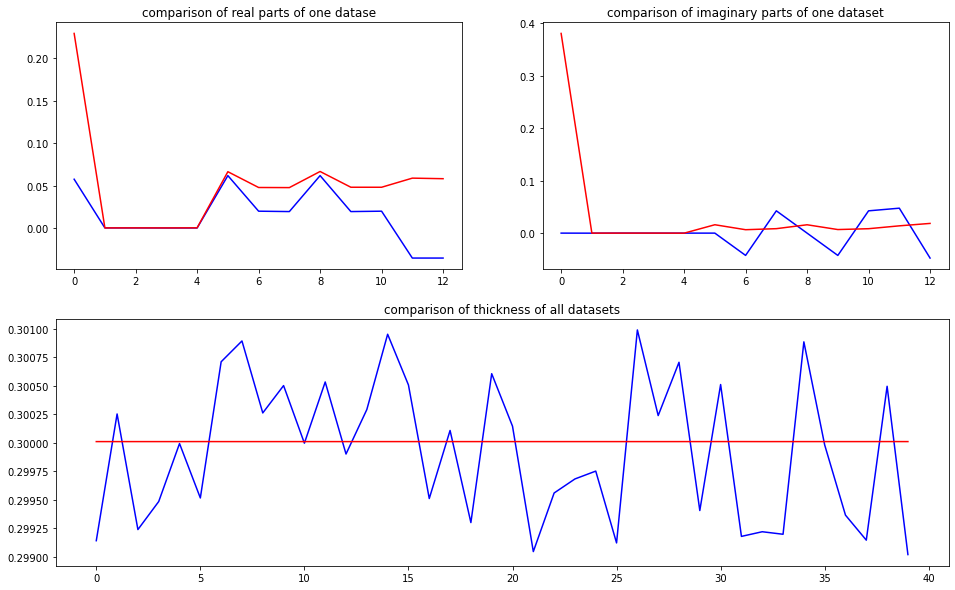

predicted thickness: 0.30001017


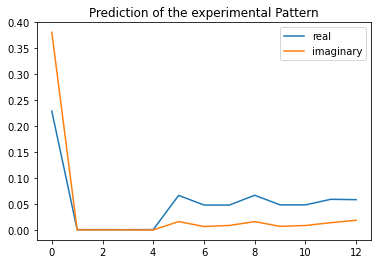

The offset applied on thickness: 0.0006271246575884513

The offset applied on Ug: 2.3527165451892476

Applied shift of unit cell origin (fractional coordinates): -0.01645665755733021 -3.750169916525655e-05
Ug[ 0 ]: 0.69376 0.0  =>  0.69376 0.0
Ug[ 1 ]: 0.00044 -0.02038  =>  0.00044 -0.02061
Ug[ 2 ]: 0.00044 0.02038  =>  0.00044 0.02061
Ug[ 3 ]: 0.00047 0.1034  =>  0.00047 0.0
Ug[ 4 ]: 0.00047 -0.1034  =>  0.00047 0.0
Ug[ 5 ]: 0.07762 -0.00047  =>  0.07762 0.0
Ug[ 6 ]: 0.05363 -0.01943  =>  0.05363 -0.1226
Ug[ 7 ]: 0.05356 0.01522  =>  0.05356 0.11886
Ug[ 8 ]: 0.07762 0.00047  =>  0.07762 0.0
Ug[ 9 ]: 0.05356 -0.01522  =>  0.05356 -0.11886
Ug[ 10 ]: 0.05363 0.01943  =>  0.05363 0.1226
Ug[ 11 ]: 0.06732 -0.03585  =>  0.06732 0.17095
Ug[ 12 ]: 0.06732 0.03585  =>  0.06732 -0.17095
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

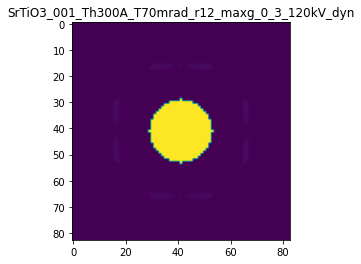

X_sim.max(): 0.9999991490723511
>>>replaced the 21. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 332ms/step - loss: 0.0257 - acc: 0.2400 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0257 - acc: 0.2400 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0257 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0257 - acc: 0.2400 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 221ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0155 - val_acc: 0.0750


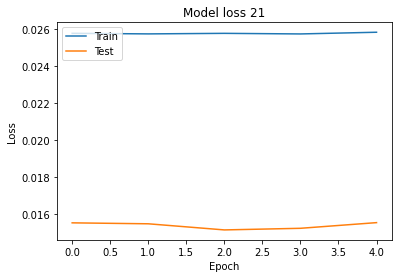

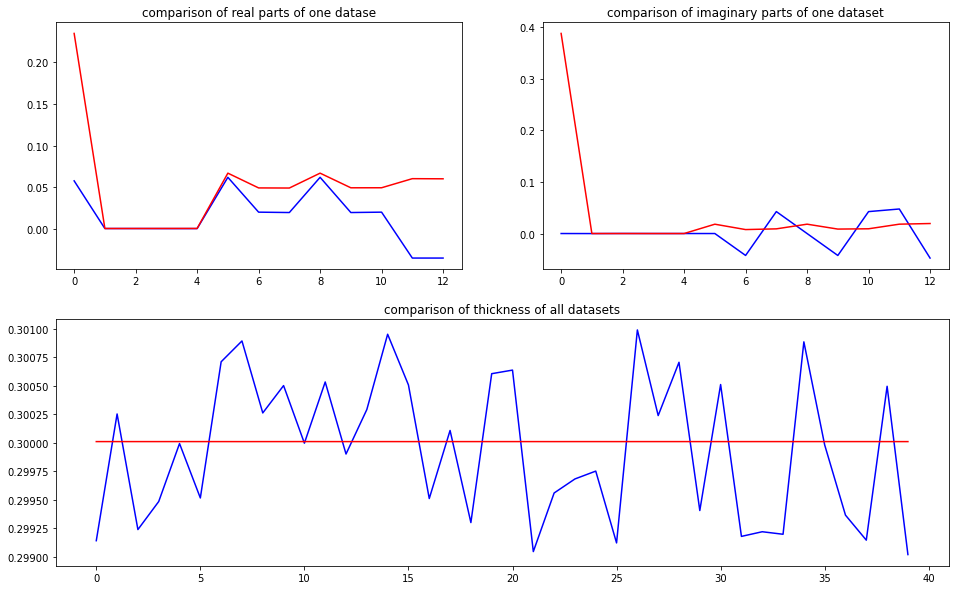

predicted thickness: 0.30001003


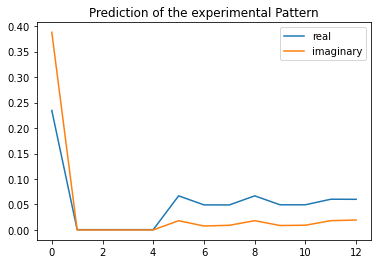

The offset applied on thickness: -0.0001758246821052485

The offset applied on Ug: 2.3755043467811907

Applied shift of unit cell origin (fractional coordinates): -0.000660458145747529 -3.331602435198322e-05
Ug[ 0 ]: 0.72295 0.0  =>  0.72295 0.0
Ug[ 1 ]: 0.00046 -0.00613  =>  0.00046 -0.00634
Ug[ 2 ]: 0.00046 0.00613  =>  0.00046 0.00634
Ug[ 3 ]: 0.00052 0.00415  =>  0.00052 0.0
Ug[ 4 ]: 0.00052 -0.00415  =>  0.00052 0.0
Ug[ 5 ]: 0.07827 -0.00042  =>  0.07827 -0.0
Ug[ 6 ]: 0.05519 -0.01514  =>  0.05519 -0.01908
Ug[ 7 ]: 0.05509 0.00335  =>  0.05509 0.00771
Ug[ 8 ]: 0.07827 0.00042  =>  0.07827 0.0
Ug[ 9 ]: 0.05509 -0.00335  =>  0.05509 -0.00771
Ug[ 10 ]: 0.05519 0.01514  =>  0.05519 0.01908
Ug[ 11 ]: 0.06961 -0.00961  =>  0.06961 -0.00131
Ug[ 12 ]: 0.06961 0.00961  =>  0.06961 0.00131
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

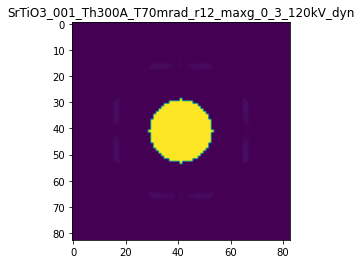

X_sim.max(): 0.9999990708678824
>>>replaced the 22. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 258ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 191ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0258 - acc: 0.2400 - val_loss: 0.0151 - val_acc: 0.0750


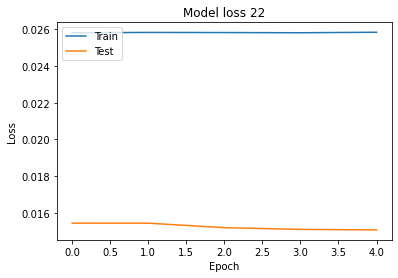

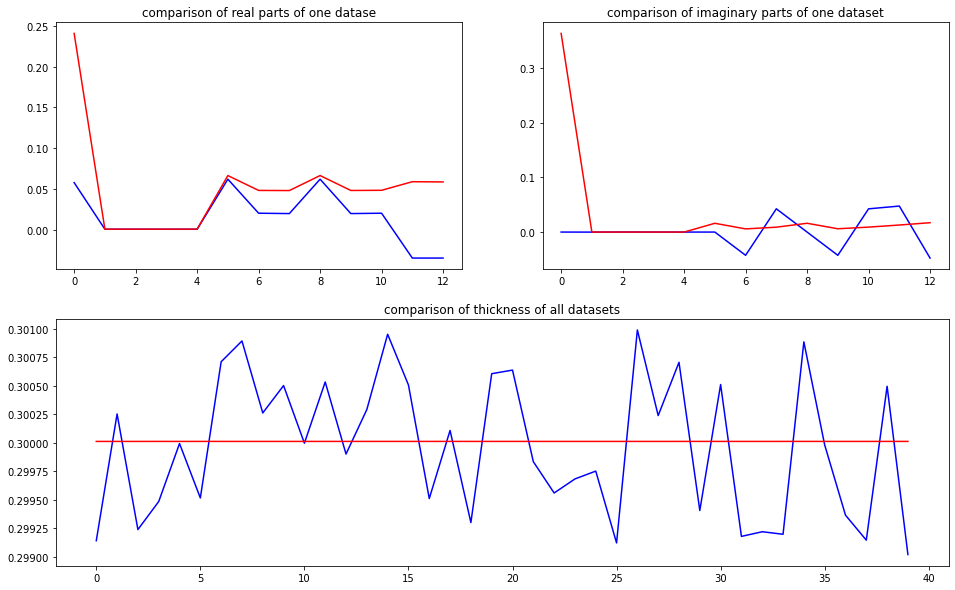

predicted thickness: 0.30001184


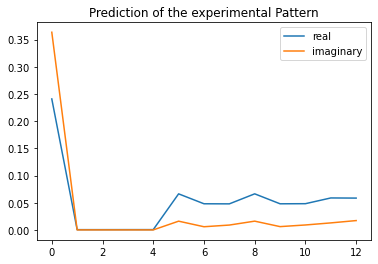

The offset applied on thickness: -0.00027041660304375804

The offset applied on Ug: 1.9163272711309238

Applied shift of unit cell origin (fractional coordinates): -0.005988585938106308 -2.7559965877921614e-05
Ug[ 0 ]: 0.6053 0.0  =>  0.6053 0.0
Ug[ 1 ]: 0.00045 -0.01035  =>  0.00045 -0.01052
Ug[ 2 ]: 0.00045 0.01035  =>  0.00045 0.01052
Ug[ 3 ]: 0.00051 0.03763  =>  0.00051 0.0
Ug[ 4 ]: 0.00051 -0.03763  =>  0.00051 -0.0
Ug[ 5 ]: 0.07524 -0.00035  =>  0.07524 0.0
Ug[ 6 ]: 0.05271 -0.03226  =>  0.05271 -0.06972
Ug[ 7 ]: 0.05249 0.02811  =>  0.05249 0.06591
Ug[ 8 ]: 0.07524 0.00035  =>  0.07524 -0.0
Ug[ 9 ]: 0.05249 -0.02811  =>  0.05249 -0.06591
Ug[ 10 ]: 0.05271 0.03226  =>  0.05271 0.06972
Ug[ 11 ]: 0.06569 -0.03422  =>  0.06569 0.04103
Ug[ 12 ]: 0.06569 0.03422  =>  0.06569 -0.04103
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

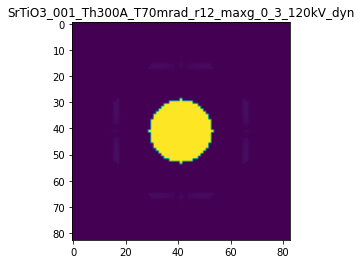

X_sim.max(): 0.9999989986111673
>>>replaced the 23. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 265ms/step - loss: 0.0258 - acc: 0.2300 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 236ms/step - loss: 0.0258 - acc: 0.2300 - val_loss: 0.0153 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0258 - acc: 0.2300 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 222ms/step - loss: 0.0258 - acc: 0.2300 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 228ms/step - loss: 0.0258 - acc: 0.2300 - val_loss: 0.0153 - val_acc: 0.0750


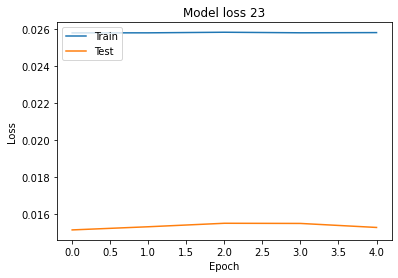

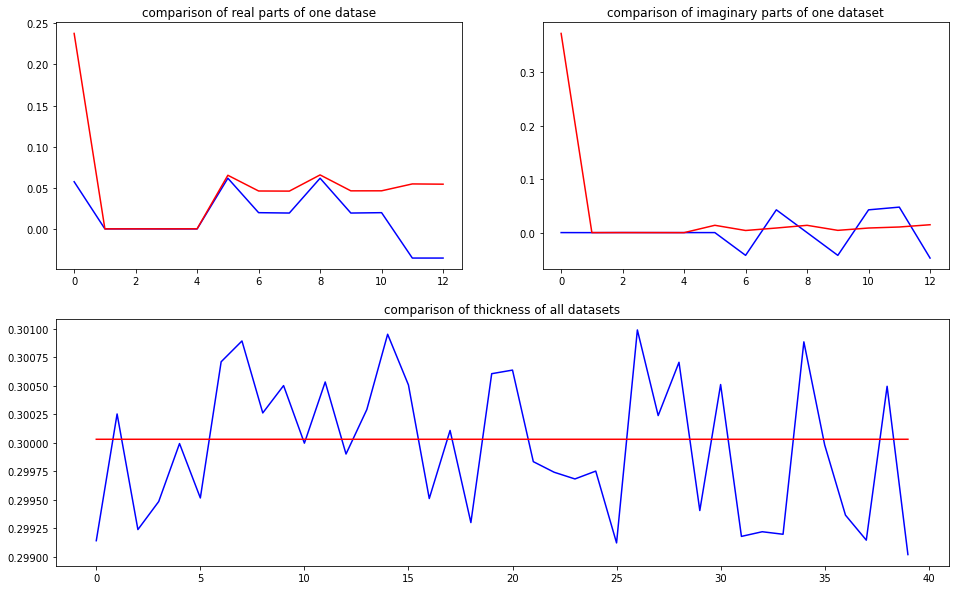

predicted thickness: 0.30003047


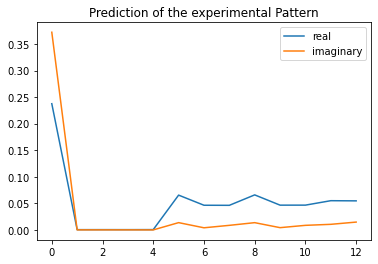

The offset applied on thickness: -0.0003121124379768714

The offset applied on Ug: 3.713877838410621

Applied shift of unit cell origin (fractional coordinates): -0.013976722253416991 -0.00016643191342957078
Ug[ 0 ]: 0.96136 0.0  =>  0.96136 0.0
Ug[ 1 ]: 0.00044 -0.02291  =>  0.00044 -0.02396
Ug[ 2 ]: 0.00044 0.02291  =>  0.00044 0.02396
Ug[ 3 ]: 0.00048 0.08782  =>  0.00048 0.0
Ug[ 4 ]: 0.00048 -0.08782  =>  0.00048 0.0
Ug[ 5 ]: 0.08237 -0.00209  =>  0.08237 -0.0
Ug[ 6 ]: 0.05473 -0.04597  =>  0.05473 -0.13274
Ug[ 7 ]: 0.05459 0.04095  =>  0.05459 0.12981
Ug[ 8 ]: 0.08237 0.00209  =>  0.08237 0.0
Ug[ 9 ]: 0.05459 -0.04095  =>  0.05459 -0.12981
Ug[ 10 ]: 0.05473 0.04597  =>  0.05473 0.13274
Ug[ 11 ]: 0.06658 -0.03451  =>  0.06658 0.14112
Ug[ 12 ]: 0.06658 0.03451  =>  0.06658 -0.14112
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

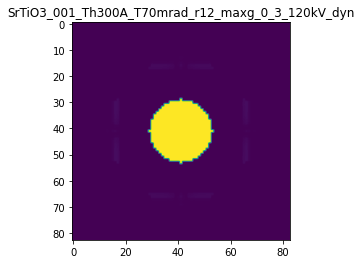

X_sim.max(): 0.9999991599712881
>>>replaced the 24. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 392ms/step - loss: 0.0260 - acc: 0.2300 - val_loss: 0.0158 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 281ms/step - loss: 0.0260 - acc: 0.2300 - val_loss: 0.0156 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 2s 326ms/step - loss: 0.0260 - acc: 0.2300 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 2s 326ms/step - loss: 0.0261 - acc: 0.2300 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0260 - acc: 0.2300 - val_loss: 0.0154 - val_acc: 0.0750


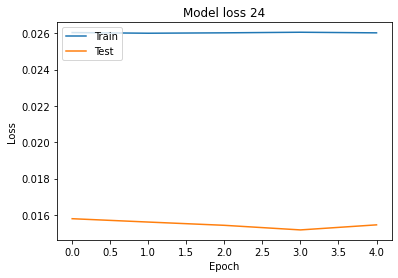

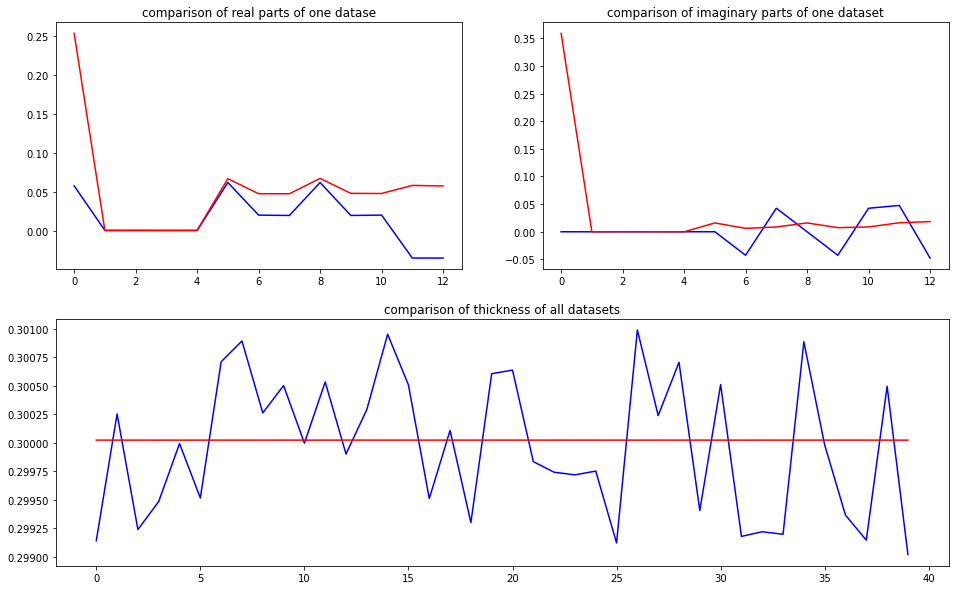

predicted thickness: 0.30002308


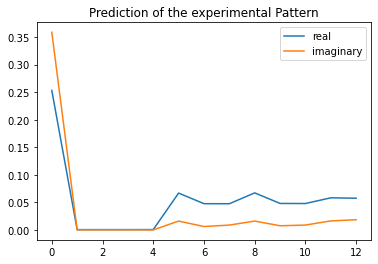

The offset applied on thickness: -0.0003944510221419622

The offset applied on Ug: 3.211863357621575

Applied shift of unit cell origin (fractional coordinates): -0.017037862676710726 -0.00013541786092847264
Ug[ 0 ]: 0.87226 0.0  =>  0.87226 0.0
Ug[ 1 ]: 0.00045 -0.02174  =>  0.00045 -0.02259
Ug[ 2 ]: 0.00045 0.02174  =>  0.00045 0.02259
Ug[ 3 ]: 0.0005 0.10705  =>  0.0005 0.0
Ug[ 4 ]: 0.0005 -0.10705  =>  0.0005 -0.0
Ug[ 5 ]: 0.0822 -0.0017  =>  0.0822 -0.0
Ug[ 6 ]: 0.05517 -0.02653  =>  0.05517 -0.13273
Ug[ 7 ]: 0.05522 0.00966  =>  0.05522 0.11756
Ug[ 8 ]: 0.0822 0.0017  =>  0.0822 0.0
Ug[ 9 ]: 0.05522 -0.00966  =>  0.05522 -0.11756
Ug[ 10 ]: 0.05517 0.02653  =>  0.05517 0.13273
Ug[ 11 ]: 0.06953 -0.01448  =>  0.06953 0.19962
Ug[ 12 ]: 0.06953 0.01448  =>  0.06953 -0.19962
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

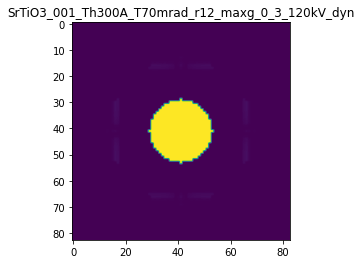

X_sim.max(): 0.9999991250528999
>>>replaced the 25. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0160 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0156 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0156 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0154 - val_acc: 0.0750


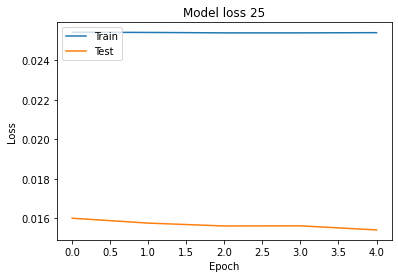

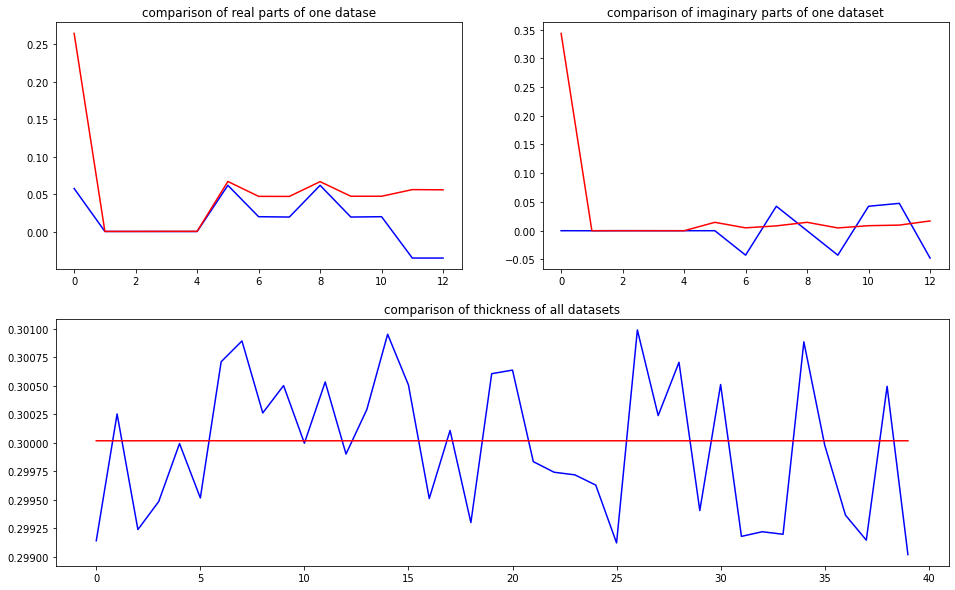

predicted thickness: 0.30001727


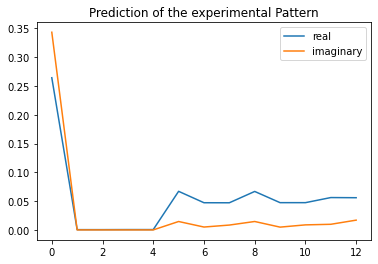

The offset applied on thickness: -0.0007527335049826161

The offset applied on Ug: 0.42442564984792563

Applied shift of unit cell origin (fractional coordinates): -0.002974029159814588 -6.521015483872474e-06
Ug[ 0 ]: 0.34378 0.0  =>  0.34378 0.0
Ug[ 1 ]: 0.00046 -0.01257  =>  0.00046 -0.01261
Ug[ 2 ]: 0.00046 0.01257  =>  0.00046 0.01261
Ug[ 3 ]: 0.00057 0.01869  =>  0.00057 0.0
Ug[ 4 ]: 0.00057 -0.01869  =>  0.00057 0.0
Ug[ 5 ]: 0.06887 -8e-05  =>  0.06887 -0.0
Ug[ 6 ]: 0.04824 -0.0392  =>  0.04824 -0.05784
Ug[ 7 ]: 0.0482 0.03735  =>  0.0482 0.05607
Ug[ 8 ]: 0.06887 8e-05  =>  0.06887 0.0
Ug[ 9 ]: 0.0482 -0.03735  =>  0.0482 -0.05607
Ug[ 10 ]: 0.04824 0.0392  =>  0.04824 0.05784
Ug[ 11 ]: 0.05755 -0.06333  =>  0.05755 -0.02596
Ug[ 12 ]: 0.05755 0.06333  =>  0.05755 0.02596
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

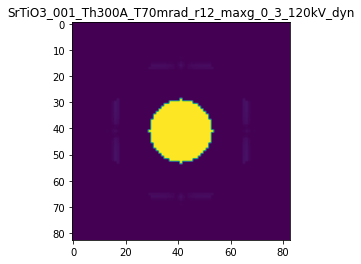

X_sim.max(): 0.9999985363948657
>>>replaced the 26. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 252ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0153 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0252 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 219ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0154 - val_acc: 0.0750


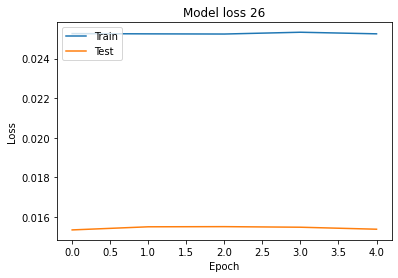

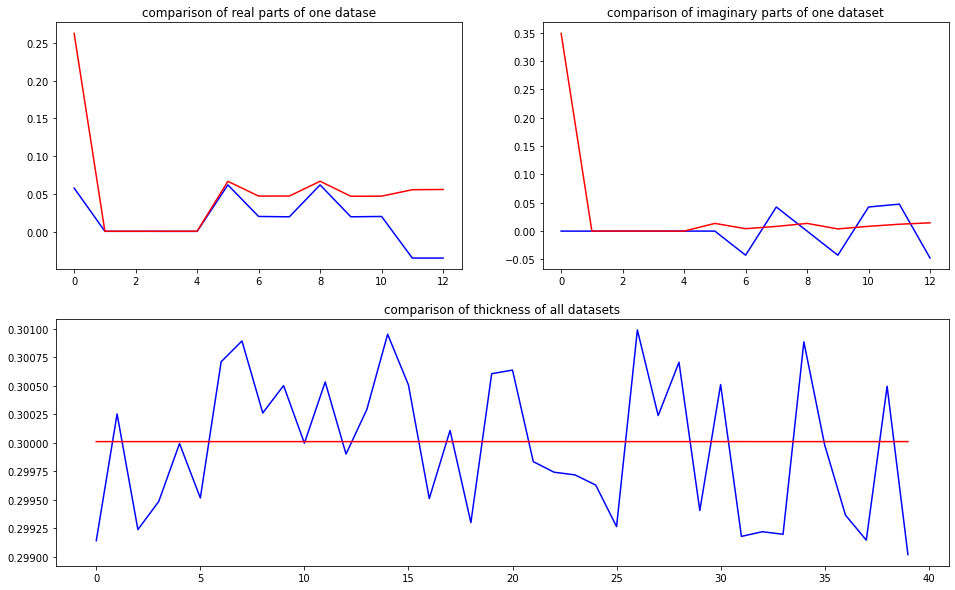

predicted thickness: 0.30001003


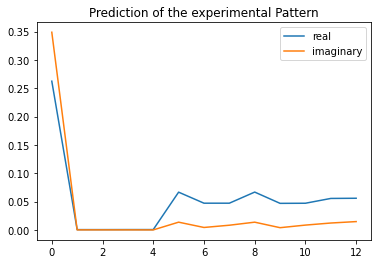

The offset applied on thickness: -0.0009854528823592078

The offset applied on Ug: 3.3672304692060027

Applied shift of unit cell origin (fractional coordinates): -0.01154831227304615 -4.606413136118639e-05
Ug[ 0 ]: 0.9041 0.0  =>  0.9041 0.0
Ug[ 1 ]: 0.00045 -0.01526  =>  0.00045 -0.01555
Ug[ 2 ]: 0.00045 0.01526  =>  0.00045 0.01555
Ug[ 3 ]: 0.00053 0.07256  =>  0.00053 0.0
Ug[ 4 ]: 0.00053 -0.07256  =>  0.00053 0.0
Ug[ 5 ]: 0.08222 -0.00058  =>  0.08222 0.0
Ug[ 6 ]: 0.0547 -0.04018  =>  0.0547 -0.11245
Ug[ 7 ]: 0.05457 0.04346  =>  0.05457 0.11631
Ug[ 8 ]: 0.08222 0.00058  =>  0.08222 0.0
Ug[ 9 ]: 0.05457 -0.04346  =>  0.05457 -0.11631
Ug[ 10 ]: 0.0547 0.04018  =>  0.0547 0.11245
Ug[ 11 ]: 0.0667 -0.02289  =>  0.0667 0.12223
Ug[ 12 ]: 0.0667 0.02289  =>  0.0667 -0.12223
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

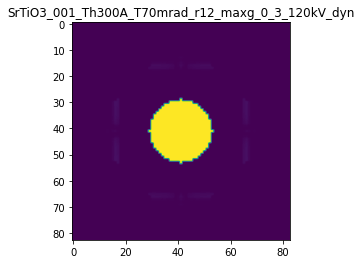

X_sim.max(): 0.9999990009726643
>>>replaced the 27. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 280ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 222ms/step - loss: 0.0253 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750


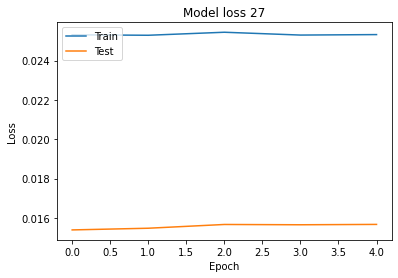

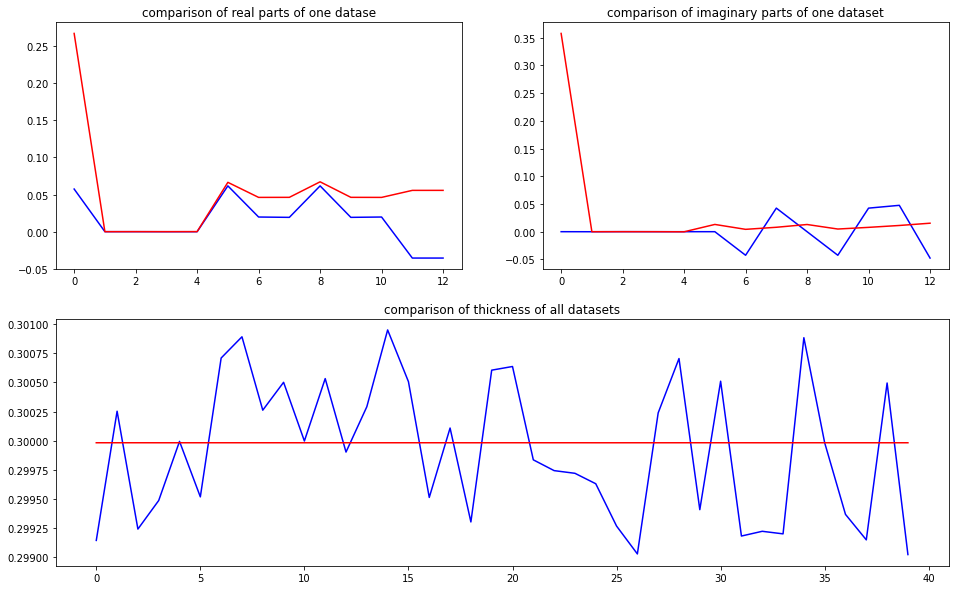

predicted thickness: 0.2999813


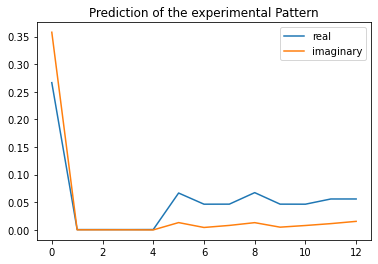

The offset applied on thickness: 0.0008180386532505168

The offset applied on Ug: -1.5236592607015715

Applied shift of unit cell origin (fractional coordinates): -0.03402445636952193 0.00014245986591332813
Ug[ 0 ]: 0.03675 3.14159  =>  0.03675 3.14159
Ug[ 1 ]: 0.00043 -0.02067  =>  0.00043 -0.01977
Ug[ 2 ]: 0.00043 0.02067  =>  0.00043 0.01977
Ug[ 3 ]: 0.00047 0.21378  =>  0.00047 -0.0
Ug[ 4 ]: 0.00047 -0.21378  =>  0.00047 0.0
Ug[ 5 ]: 0.05989 0.00179  =>  0.05989 0.0
Ug[ 6 ]: 0.04311 -0.04083  =>  0.04311 -0.25551
Ug[ 7 ]: 0.04316 0.03605  =>  0.04316 0.24893
Ug[ 8 ]: 0.05989 -0.00179  =>  0.05989 -0.0
Ug[ 9 ]: 0.04316 -0.03605  =>  0.04316 -0.24893
Ug[ 10 ]: 0.04311 0.04083  =>  0.04311 0.25551
Ug[ 11 ]: 0.05086 -0.03905  =>  0.05086 0.38852
Ug[ 12 ]: 0.05086 0.03905  =>  0.05086 -0.38852
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations/

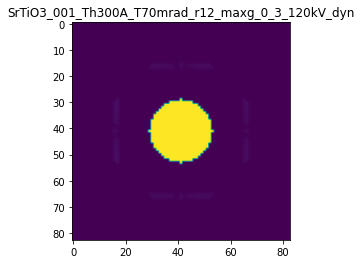

X_sim.max(): 0.9999985380209442
>>>replaced the 28. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 248ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0155 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0156 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 267ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 2s 311ms/step - loss: 0.0254 - acc: 0.2200 - val_loss: 0.0157 - val_acc: 0.0750


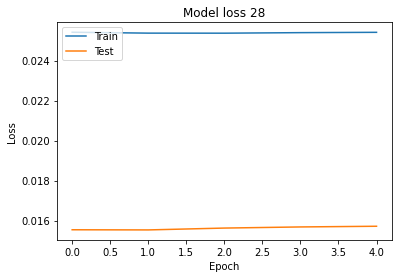

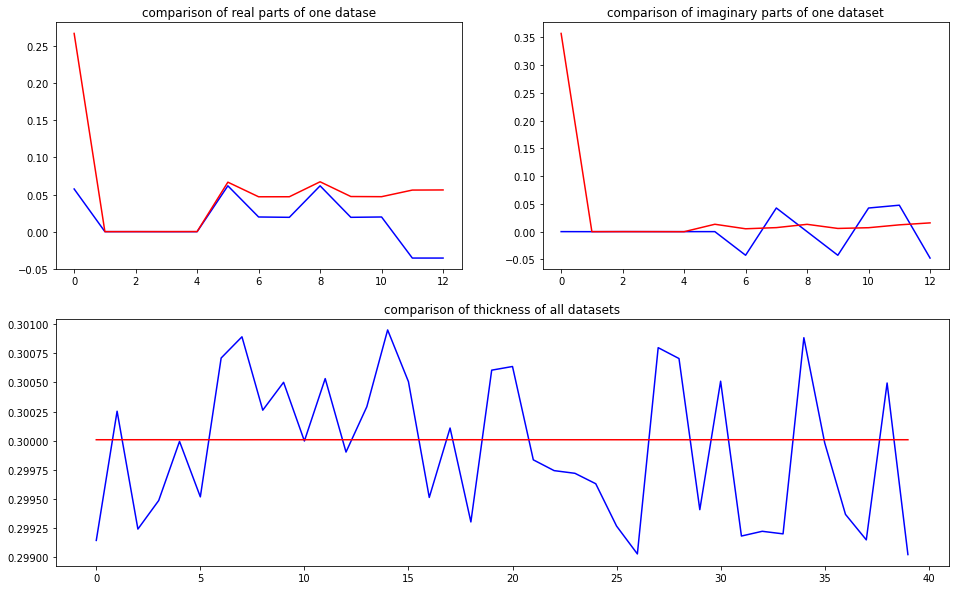

predicted thickness: 0.3000072


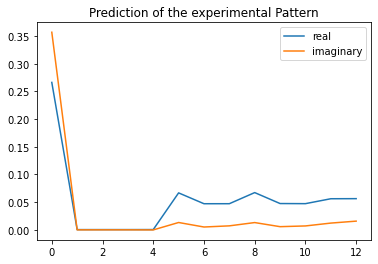

The offset applied on thickness: -0.0004948366707648198

The offset applied on Ug: -1.5008656261156246

Applied shift of unit cell origin (fractional coordinates): -0.021497414124638375 0.0001274298199936794
Ug[ 0 ]: 0.03124 3.14159  =>  0.03124 3.14159
Ug[ 1 ]: 0.00044 -0.01768  =>  0.00044 -0.01688
Ug[ 2 ]: 0.00044 0.01768  =>  0.00044 0.01688
Ug[ 3 ]: 0.00049 0.13507  =>  0.00049 0.0
Ug[ 4 ]: 0.00049 -0.13507  =>  0.00049 0.0
Ug[ 5 ]: 0.06002 0.0016  =>  0.06002 0.0
Ug[ 6 ]: 0.04384 -0.0214  =>  0.04384 -0.15728
Ug[ 7 ]: 0.04394 0.01693  =>  0.04394 0.1512
Ug[ 8 ]: 0.06002 -0.0016  =>  0.06002 0.0
Ug[ 9 ]: 0.04394 -0.01693  =>  0.04394 -0.1512
Ug[ 10 ]: 0.04384 0.0214  =>  0.04384 0.15728
Ug[ 11 ]: 0.05123 -0.03309  =>  0.05123 0.23706
Ug[ 12 ]: 0.05123 0.03309  =>  0.05123 -0.23706
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

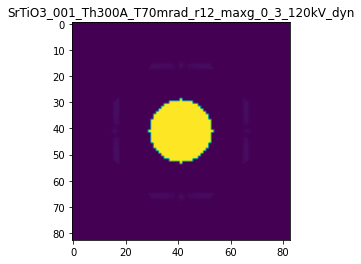

X_sim.max(): 0.9999984489632225
>>>replaced the 29. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 271ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0156 - val_acc: 0.0750
Epoch 2/5
5/5 [==============================] - 1s 225ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 3/5
5/5 [==============================] - 1s 231ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0154 - val_acc: 0.0750
Epoch 4/5
5/5 [==============================] - 1s 214ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0152 - val_acc: 0.0750
Epoch 5/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0152 - val_acc: 0.0750


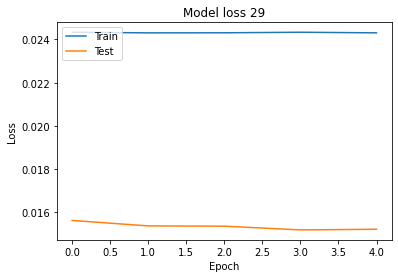

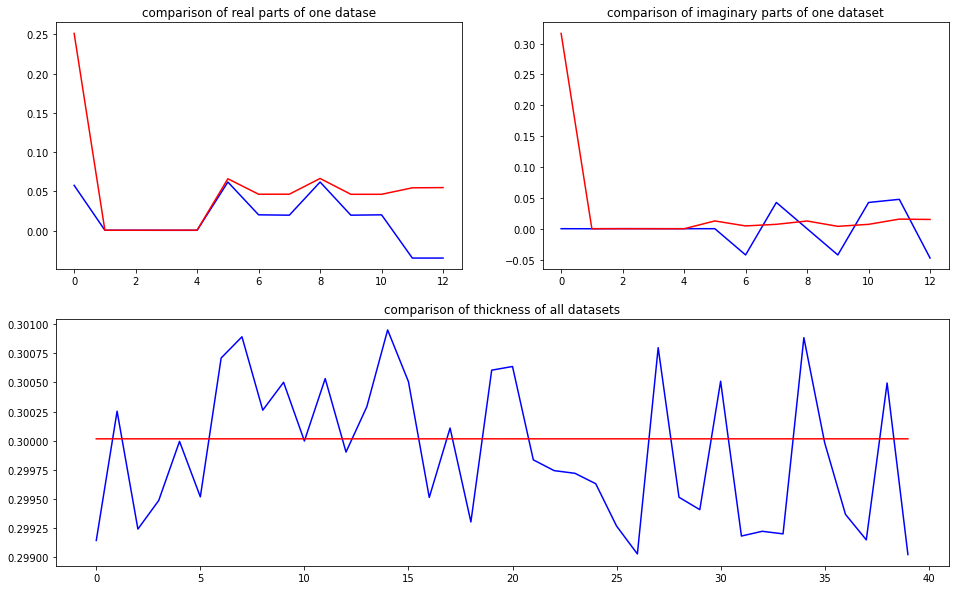

predicted thickness: 0.30001482


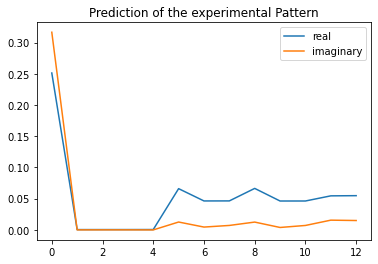

The offset applied on thickness: -0.00029251439337633055

The offset applied on Ug: 0.8263575620534417

Applied shift of unit cell origin (fractional coordinates): -0.014178968414290206 2.2572190526389228e-05
Ug[ 0 ]: 0.38607 0.0  =>  0.38607 0.0
Ug[ 1 ]: 0.00045 -0.01929  =>  0.00045 -0.01915
Ug[ 2 ]: 0.00045 0.01929  =>  0.00045 0.01915
Ug[ 3 ]: 0.00051 0.08909  =>  0.00051 0.0
Ug[ 4 ]: 0.00051 -0.08909  =>  0.00051 0.0
Ug[ 5 ]: 0.06995 0.00028  =>  0.06995 0.0
Ug[ 6 ]: 0.04808 -0.02697  =>  0.04808 -0.1162
Ug[ 7 ]: 0.04812 0.03425  =>  0.04812 0.12319
Ug[ 8 ]: 0.06995 -0.00028  =>  0.06995 -0.0
Ug[ 9 ]: 0.04812 -0.03425  =>  0.04812 -0.12319
Ug[ 10 ]: 0.04808 0.02697  =>  0.04808 0.1162
Ug[ 11 ]: 0.05728 0.00487  =>  0.05728 0.18305
Ug[ 12 ]: 0.05728 -0.00487  =>  0.05728 -0.18305
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

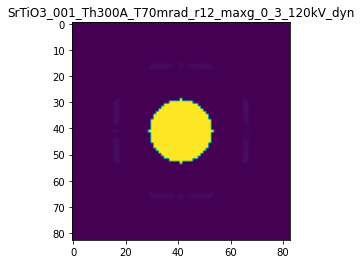

X_sim.max(): 0.9999987547723412
>>>replaced the 30. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 289ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0152 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0154 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0154 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0153 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 1s 294ms/step - loss: 0.0243 - acc: 0.2100 - val_loss: 0.0154 - val_acc: 0.0500


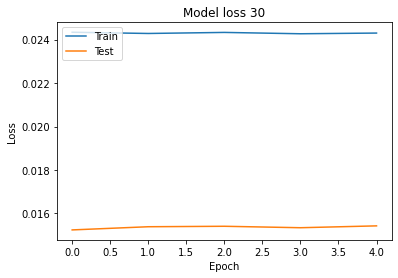

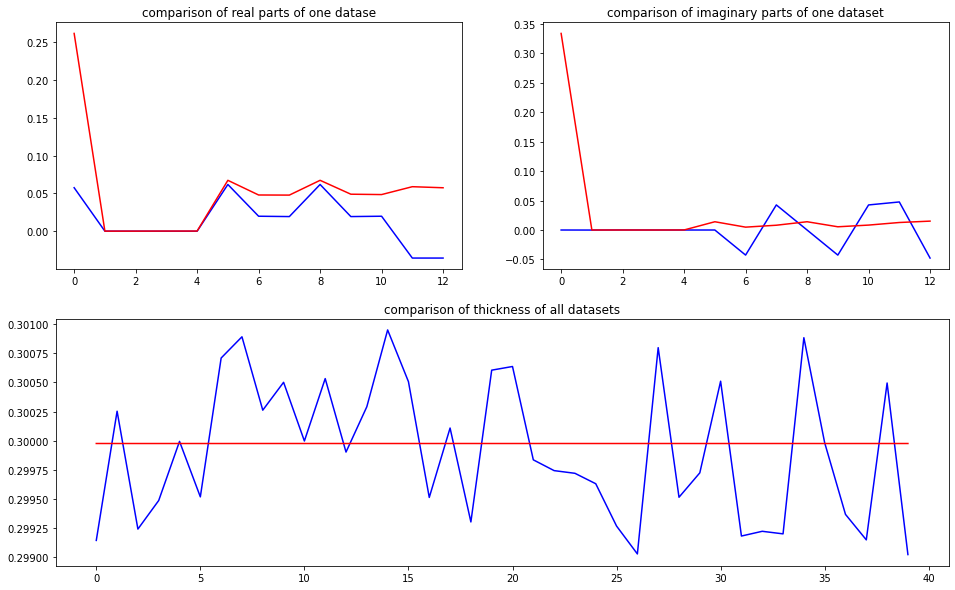

predicted thickness: 0.29997474


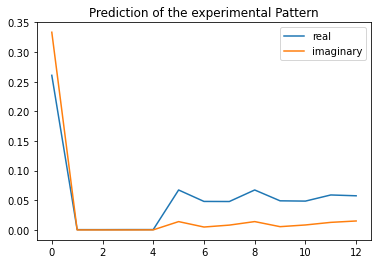

The offset applied on thickness: -0.0001096557859860594

The offset applied on Ug: -0.5691958448334804

Applied shift of unit cell origin (fractional coordinates): 0.010801131352336726 -1.5031219007348151e-05
Ug[ 0 ]: 0.15878 0.0  =>  0.15878 0.0
Ug[ 1 ]: 0.00046 0.00168  =>  0.00046 0.00159
Ug[ 2 ]: 0.00046 -0.00168  =>  0.00046 -0.00159
Ug[ 3 ]: 0.00055 -0.06787  =>  0.00055 0.0
Ug[ 4 ]: 0.00055 0.06787  =>  0.00055 0.0
Ug[ 5 ]: 0.06466 -0.00019  =>  0.06466 0.0
Ug[ 6 ]: 0.04699 -0.03648  =>  0.04699 0.03148
Ug[ 7 ]: 0.04714 0.02838  =>  0.04714 -0.03939
Ug[ 8 ]: 0.06466 0.00019  =>  0.06466 -0.0
Ug[ 9 ]: 0.04714 -0.02838  =>  0.04714 0.03939
Ug[ 10 ]: 0.04699 0.03648  =>  0.04699 -0.03148
Ug[ 11 ]: 0.05623 -0.02128  =>  0.05623 -0.15701
Ug[ 12 ]: 0.05623 0.02128  =>  0.05623 0.15701
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3

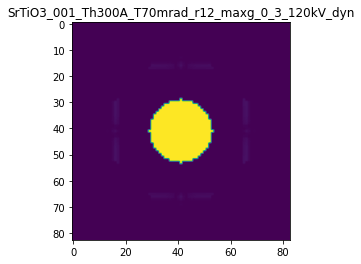

X_sim.max(): 0.999998551552177
>>>replaced the 31. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 252ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0151 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 1s 228ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0152 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 1s 259ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0152 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 1s 247ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0149 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 2s 340ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0149 - val_acc: 0.0500


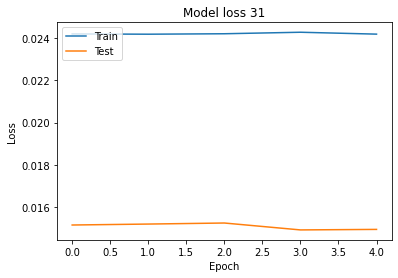

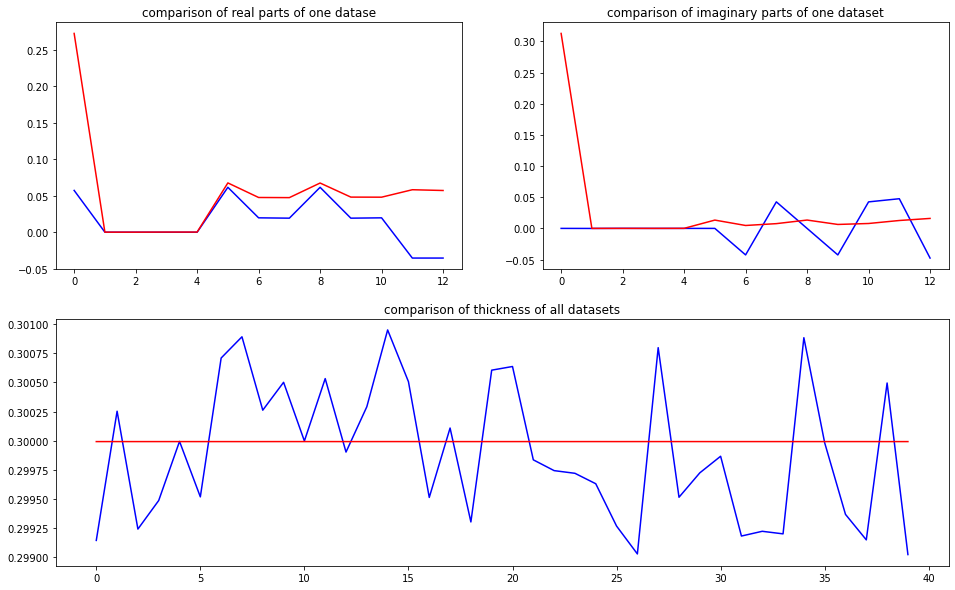

predicted thickness: 0.29999128


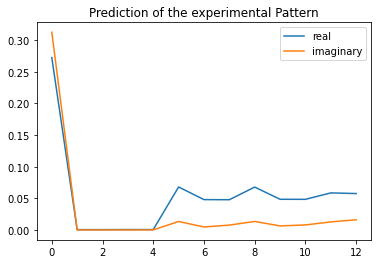

The offset applied on thickness: -0.00039256726806786426

The offset applied on Ug: -0.21319069197013626

Applied shift of unit cell origin (fractional coordinates): 0.009922941620914302 -3.7871049806922045e-05
Ug[ 0 ]: 0.2359 0.0  =>  0.2359 0.0
Ug[ 1 ]: 0.00046 0.001  =>  0.00046 0.00076
Ug[ 2 ]: 0.00046 -0.001  =>  0.00046 -0.00076
Ug[ 3 ]: 0.00058 -0.06235  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 0.06235  =>  0.00058 0.0
Ug[ 5 ]: 0.0668 -0.00048  =>  0.0668 0.0
Ug[ 6 ]: 0.04767 -0.03323  =>  0.04767 0.02936
Ug[ 7 ]: 0.0476 0.01371  =>  0.0476 -0.0484
Ug[ 8 ]: 0.0668 0.00048  =>  0.0668 0.0
Ug[ 9 ]: 0.0476 -0.01371  =>  0.0476 0.0484
Ug[ 10 ]: 0.04767 0.03323  =>  0.04767 -0.02936
Ug[ 11 ]: 0.0573 -0.02907  =>  0.0573 -0.15377
Ug[ 12 ]: 0.0573 0.02907  =>  0.0573 0.15377
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70mrad

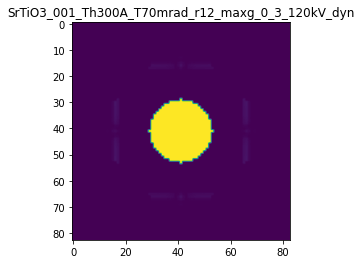

X_sim.max(): 0.9999984702105928
>>>replaced the 32. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 257ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0151 - val_acc: 0.0500
Epoch 2/5
5/5 [==============================] - 1s 247ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0150 - val_acc: 0.0500
Epoch 3/5
5/5 [==============================] - 1s 272ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0150 - val_acc: 0.0500
Epoch 4/5
5/5 [==============================] - 1s 235ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0152 - val_acc: 0.0500
Epoch 5/5
5/5 [==============================] - 1s 190ms/step - loss: 0.0242 - acc: 0.2000 - val_loss: 0.0152 - val_acc: 0.0500


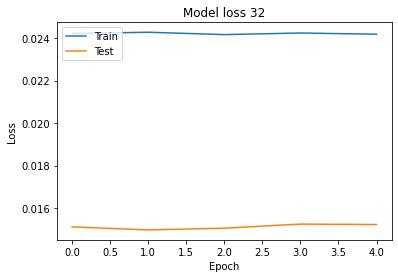

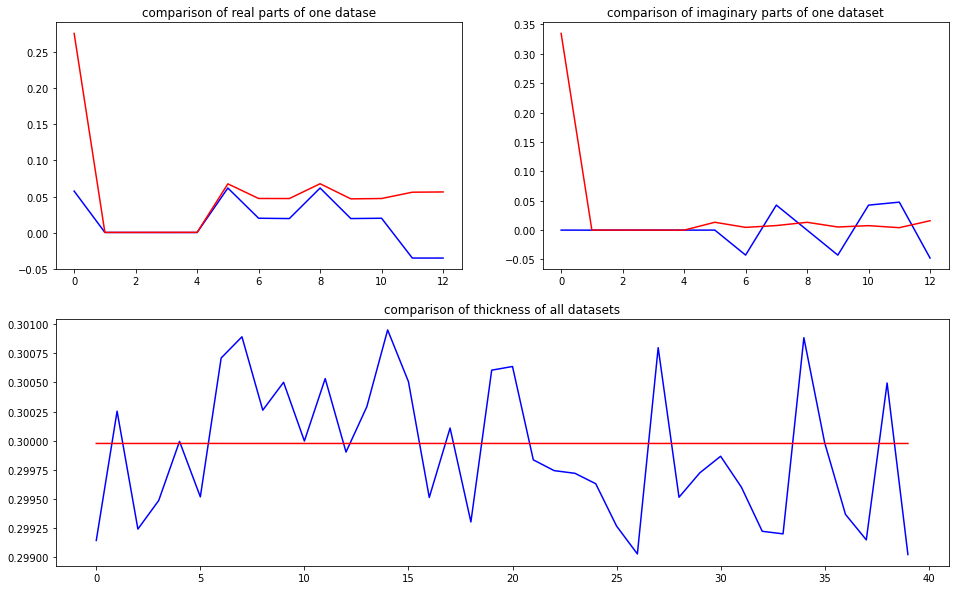

predicted thickness: 0.29997537


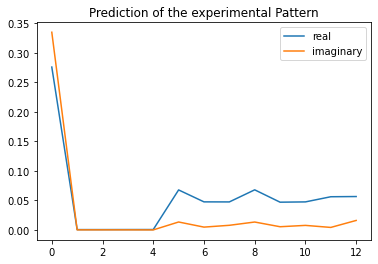

The offset applied on thickness: 0.0003053573577553497

The offset applied on Ug: -2.980644681228302

Applied shift of unit cell origin (fractional coordinates): -0.01568638402376818 5.788368144892246e-05
Ug[ 0 ]: 0.28482 3.14159  =>  0.28482 3.14159
Ug[ 1 ]: 0.00045 -0.01534  =>  0.00045 -0.01497
Ug[ 2 ]: 0.00045 0.01534  =>  0.00045 0.01497
Ug[ 3 ]: 0.00054 0.09856  =>  0.00054 0.0
Ug[ 4 ]: 0.00054 -0.09856  =>  0.00054 0.0
Ug[ 5 ]: 0.05352 0.00073  =>  0.05352 -0.0
Ug[ 6 ]: 0.0406 -0.03507  =>  0.0406 -0.13399
Ug[ 7 ]: 0.04037 0.0282  =>  0.04037 0.1264
Ug[ 8 ]: 0.05352 -0.00073  =>  0.05352 0.0
Ug[ 9 ]: 0.04037 -0.0282  =>  0.04037 -0.1264
Ug[ 10 ]: 0.0406 0.03507  =>  0.0406 0.13399
Ug[ 11 ]: 0.04677 -0.12045  =>  0.04677 0.07667
Ug[ 12 ]: 0.04677 0.12045  =>  0.04677 -0.07667
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

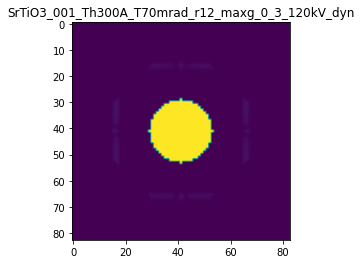

X_sim.max(): 0.9999980366614553
>>>replaced the 33. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 281ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0149 - val_acc: 0.0250
Epoch 2/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0147 - val_acc: 0.0250
Epoch 3/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0146 - val_acc: 0.0250
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0143 - val_acc: 0.0250
Epoch 5/5
5/5 [==============================] - 1s 275ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0146 - val_acc: 0.0250


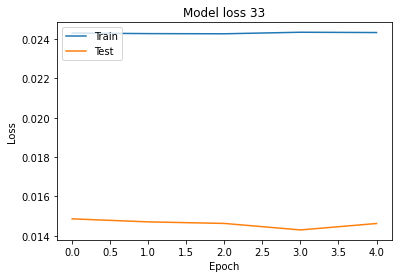

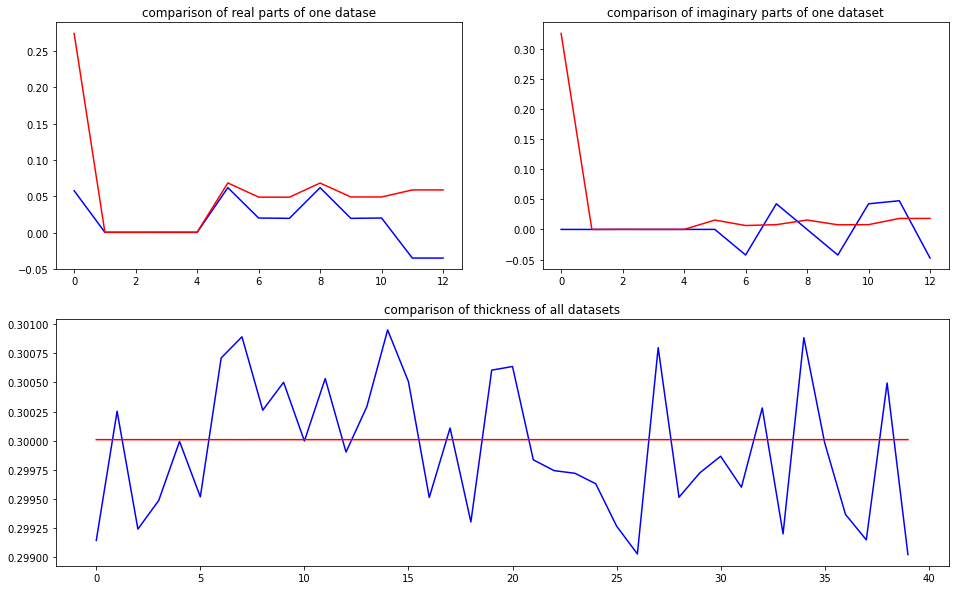

predicted thickness: 0.3000079


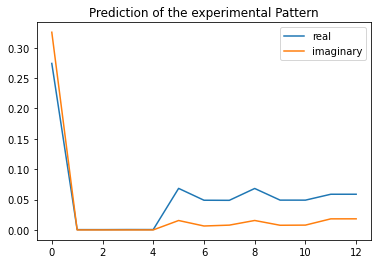

The offset applied on thickness: -0.0008576379945601165

The offset applied on Ug: 0.43301146580977506

Applied shift of unit cell origin (fractional coordinates): 0.0006784199124510402 -1.7603645321334805e-05
Ug[ 0 ]: 0.35243 0.0  =>  0.35243 0.0
Ug[ 1 ]: 0.00047 -0.00163  =>  0.00047 -0.00174
Ug[ 2 ]: 0.00047 0.00163  =>  0.00047 0.00174
Ug[ 3 ]: 0.00059 -0.00426  =>  0.00059 0.0
Ug[ 4 ]: 0.00059 0.00426  =>  0.00059 0.0
Ug[ 5 ]: 0.07041 -0.00022  =>  0.07041 0.0
Ug[ 6 ]: 0.05 -0.01472  =>  0.05 -0.01034
Ug[ 7 ]: 0.04994 0.00205  =>  0.04994 -0.0021
Ug[ 8 ]: 0.07041 0.00022  =>  0.07041 0.0
Ug[ 9 ]: 0.04994 -0.00205  =>  0.04994 0.0021
Ug[ 10 ]: 0.05 0.01472  =>  0.05 0.01034
Ug[ 11 ]: 0.06036 -0.00037  =>  0.06036 -0.00889
Ug[ 12 ]: 0.06036 0.00037  =>  0.06036 0.00889
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

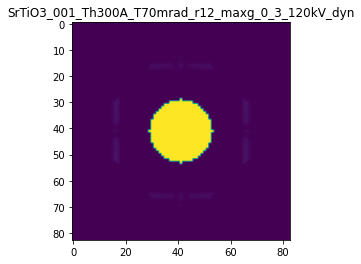

X_sim.max(): 0.9999985656406492
>>>replaced the 34. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 253ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 225ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0243 - acc: 0.2000 - val_loss: 0.0118 - val_acc: 0.0000e+00


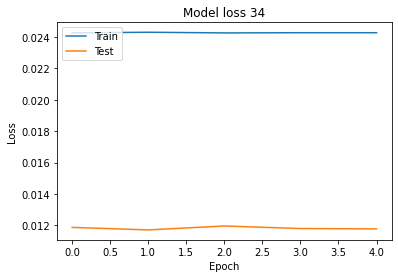

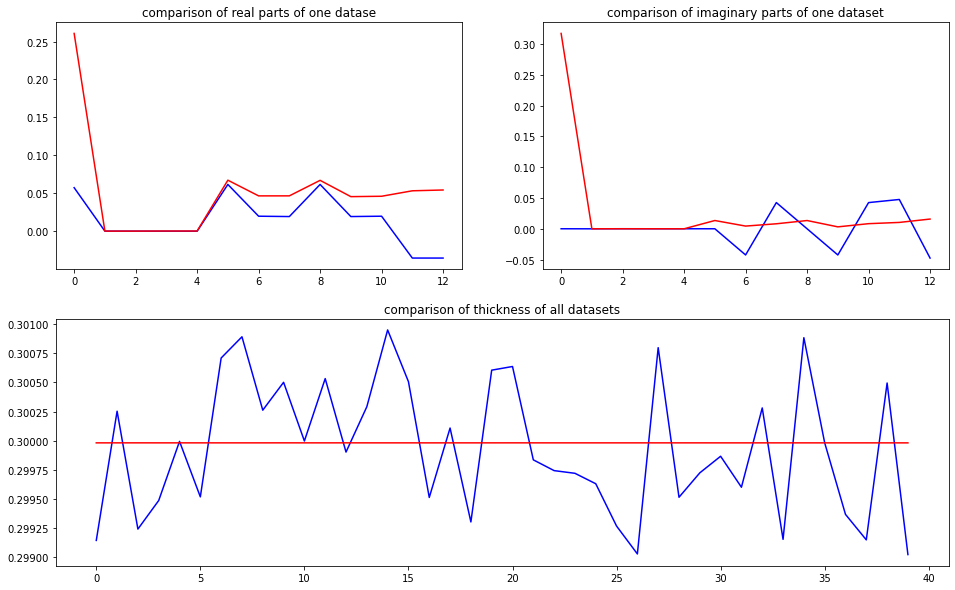

predicted thickness: 0.2999802


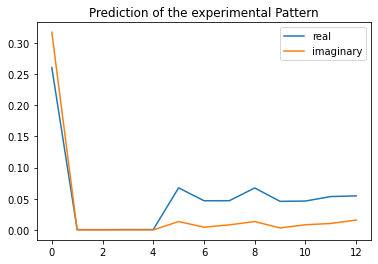

The offset applied on thickness: 0.0008776440116288685

The offset applied on Ug: -0.754095123289769

Applied shift of unit cell origin (fractional coordinates): -0.0043596238260303465 1.018235275213836e-06
Ug[ 0 ]: 0.13349 0.0  =>  0.13349 0.0
Ug[ 1 ]: 0.00046 -0.01224  =>  0.00046 -0.01224
Ug[ 2 ]: 0.00046 0.01224  =>  0.00046 0.01224
Ug[ 3 ]: 0.00058 0.02739  =>  0.00058 -0.0
Ug[ 4 ]: 0.00058 -0.02739  =>  0.00058 0.0
Ug[ 5 ]: 0.06383 1e-05  =>  0.06383 0.0
Ug[ 6 ]: 0.04495 -0.04345  =>  0.04495 -0.07085
Ug[ 7 ]: 0.04476 0.05466  =>  0.04476 0.08204
Ug[ 8 ]: 0.06383 -1e-05  =>  0.06383 -0.0
Ug[ 9 ]: 0.04476 -0.05466  =>  0.04476 -0.08204
Ug[ 10 ]: 0.04495 0.04345  =>  0.04495 0.07085
Ug[ 11 ]: 0.05178 -0.05112  =>  0.05178 0.00367
Ug[ 12 ]: 0.05178 0.05112  =>  0.05178 -0.00367
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

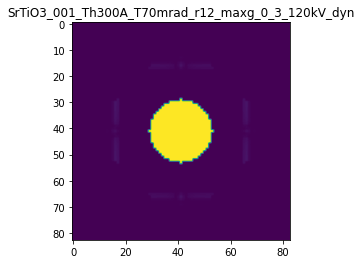

X_sim.max(): 0.9999983248905898
>>>replaced the 35. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 359ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 2s 328ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 269ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 254ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 366ms/step - loss: 0.0244 - acc: 0.1900 - val_loss: 0.0118 - val_acc: 0.0000e+00


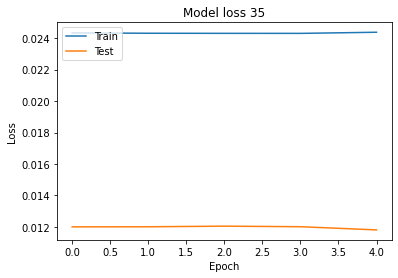

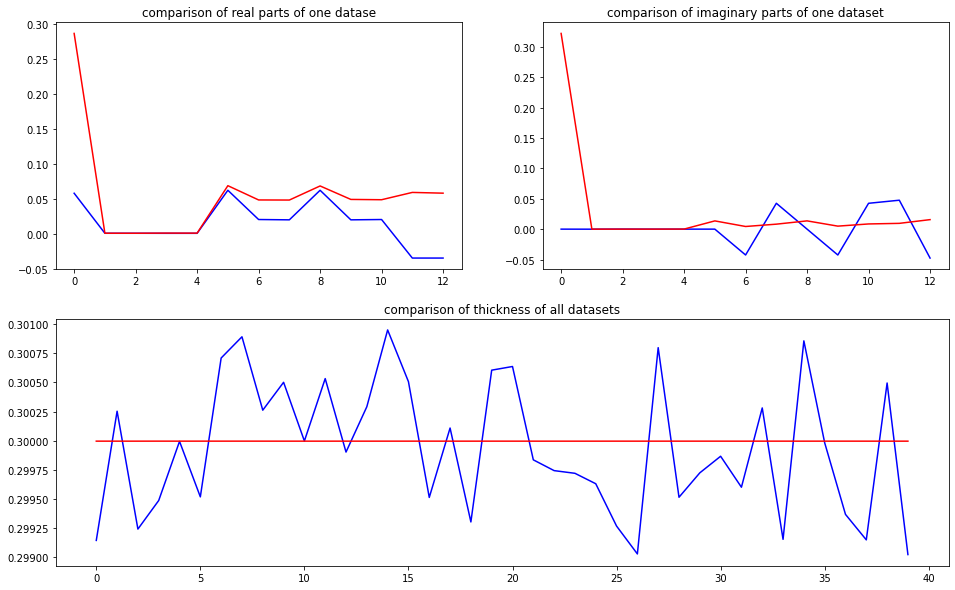

predicted thickness: 0.29999498


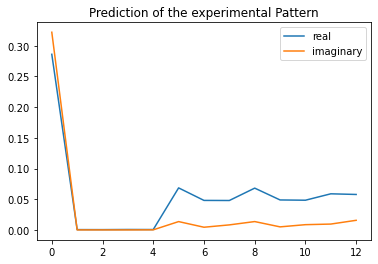

The offset applied on thickness: -0.0002781909826100455

The offset applied on Ug: -0.2468955009903024

Applied shift of unit cell origin (fractional coordinates): 0.014926536697186946 -3.075798302742341e-05
Ug[ 0 ]: 0.24024 0.0  =>  0.24024 0.0
Ug[ 1 ]: 0.00048 0.00106  =>  0.00048 0.00087
Ug[ 2 ]: 0.00048 -0.00106  =>  0.00048 -0.00087
Ug[ 3 ]: 0.00064 -0.09379  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 0.09379  =>  0.00064 0.0
Ug[ 5 ]: 0.06704 -0.00039  =>  0.06704 -0.0
Ug[ 6 ]: 0.04766 -0.04358  =>  0.04766 0.0504
Ug[ 7 ]: 0.04779 0.03397  =>  0.04779 -0.05962
Ug[ 8 ]: 0.06704 0.00039  =>  0.06704 0.0
Ug[ 9 ]: 0.04779 -0.03397  =>  0.04779 0.05962
Ug[ 10 ]: 0.04766 0.04358  =>  0.04766 -0.0504
Ug[ 11 ]: 0.05747 -0.05326  =>  0.05747 -0.24083
Ug[ 12 ]: 0.05747 0.05326  =>  0.05747 0.24083
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

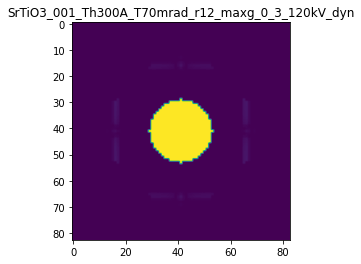

X_sim.max(): 0.999998244117754
>>>replaced the 36. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 440ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0116 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 306ms/step - loss: 0.0242 - acc: 0.1900 - val_loss: 0.0116 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 2s 347ms/step - loss: 0.0242 - acc: 0.1900 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 309ms/step - loss: 0.0243 - acc: 0.1900 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 317ms/step - loss: 0.0242 - acc: 0.1900 - val_loss: 0.0119 - val_acc: 0.0000e+00


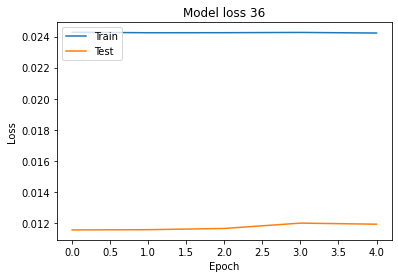

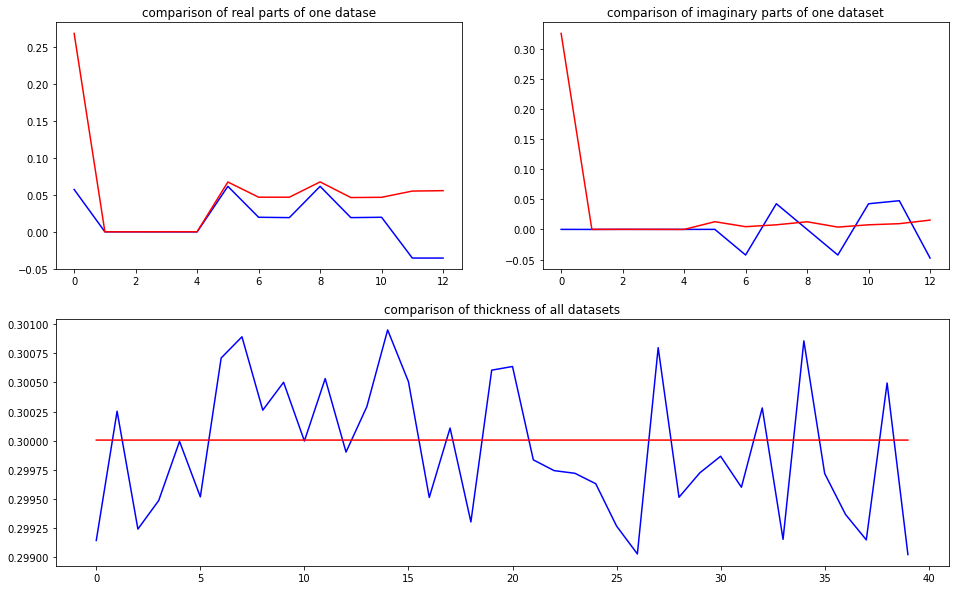

predicted thickness: 0.30000415


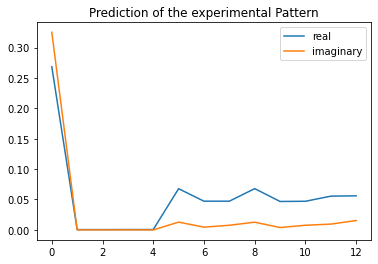

The offset applied on thickness: -0.0009898205708111073

The offset applied on Ug: 2.7451183329003883

Applied shift of unit cell origin (fractional coordinates): -0.01184706699635057 1.1129463894241891e-05
Ug[ 0 ]: 0.7563 0.0  =>  0.7563 0.0
Ug[ 1 ]: 0.00045 -0.0174  =>  0.00045 -0.01733
Ug[ 2 ]: 0.00045 0.0174  =>  0.00045 0.01733
Ug[ 3 ]: 0.00056 0.07444  =>  0.00056 0.0
Ug[ 4 ]: 0.00056 -0.07444  =>  0.00056 0.0
Ug[ 5 ]: 0.08084 0.00014  =>  0.08084 0.0
Ug[ 6 ]: 0.05333 -0.03  =>  0.05333 -0.10451
Ug[ 7 ]: 0.05314 0.03849  =>  0.05314 0.11286
Ug[ 8 ]: 0.08084 -0.00014  =>  0.08084 0.0
Ug[ 9 ]: 0.05314 -0.03849  =>  0.05314 -0.11286
Ug[ 10 ]: 0.05333 0.03  =>  0.05333 0.10451
Ug[ 11 ]: 0.06481 -0.05184  =>  0.06481 0.09704
Ug[ 12 ]: 0.06481 0.05184  =>  0.06481 -0.09704
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T

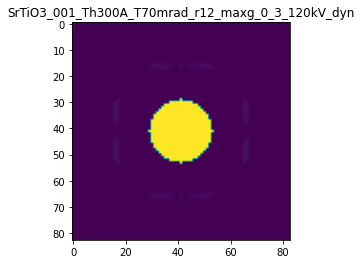

X_sim.max(): 0.9999988675010775
>>>replaced the 37. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 379ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 287ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 310ms/step - loss: 0.0242 - acc: 0.1800 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 286ms/step - loss: 0.0242 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 353ms/step - loss: 0.0242 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00


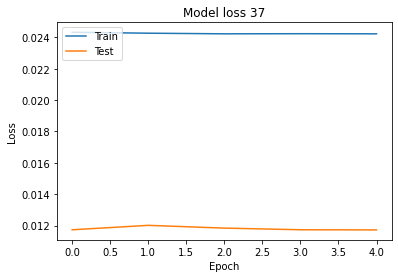

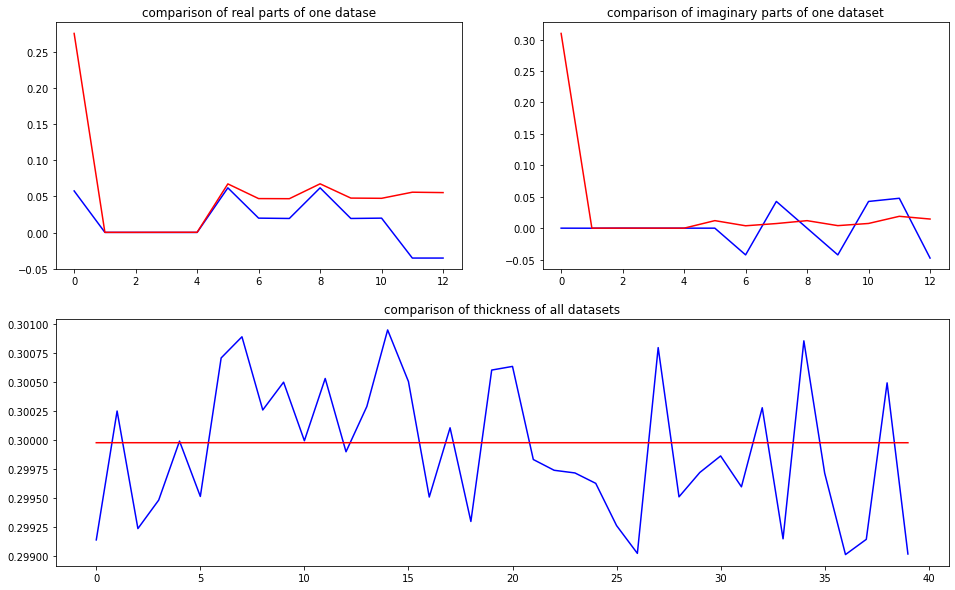

predicted thickness: 0.29997918


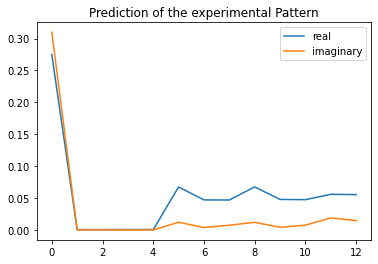

The offset applied on thickness: -0.00018476895038978825

The offset applied on Ug: -2.4734473068629

Applied shift of unit cell origin (fractional coordinates): -0.0017957504918330374 3.851265187475231e-05
Ug[ 0 ]: 0.14961 3.14159  =>  0.14961 3.14159
Ug[ 1 ]: 0.00045 -0.01291  =>  0.00045 -0.01267
Ug[ 2 ]: 0.00045 0.01291  =>  0.00045 0.01267
Ug[ 3 ]: 0.00056 0.01128  =>  0.00056 -0.0
Ug[ 4 ]: 0.00056 -0.01128  =>  0.00056 0.0
Ug[ 5 ]: 0.05579 0.00048  =>  0.05579 -0.0
Ug[ 6 ]: 0.04167 -0.04255  =>  0.04167 -0.05408
Ug[ 7 ]: 0.04173 0.04039  =>  0.04173 0.05143
Ug[ 8 ]: 0.05579 -0.00048  =>  0.05579 0.0
Ug[ 9 ]: 0.04173 -0.04039  =>  0.04173 -0.05143
Ug[ 10 ]: 0.04167 0.04255  =>  0.04167 0.05408
Ug[ 11 ]: 0.04729 0.04204  =>  0.04729 0.06461
Ug[ 12 ]: 0.04729 -0.04204  =>  0.04729 -0.06461
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations/

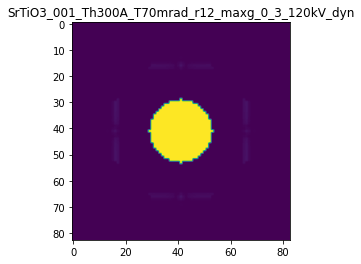

X_sim.max(): 0.9999980407398918
>>>replaced the 38. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 346ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 221ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 288ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 315ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 359ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00


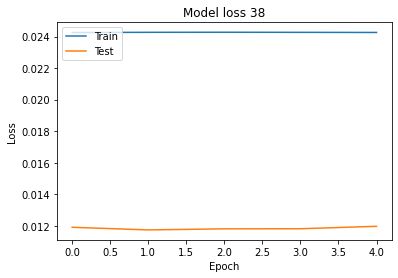

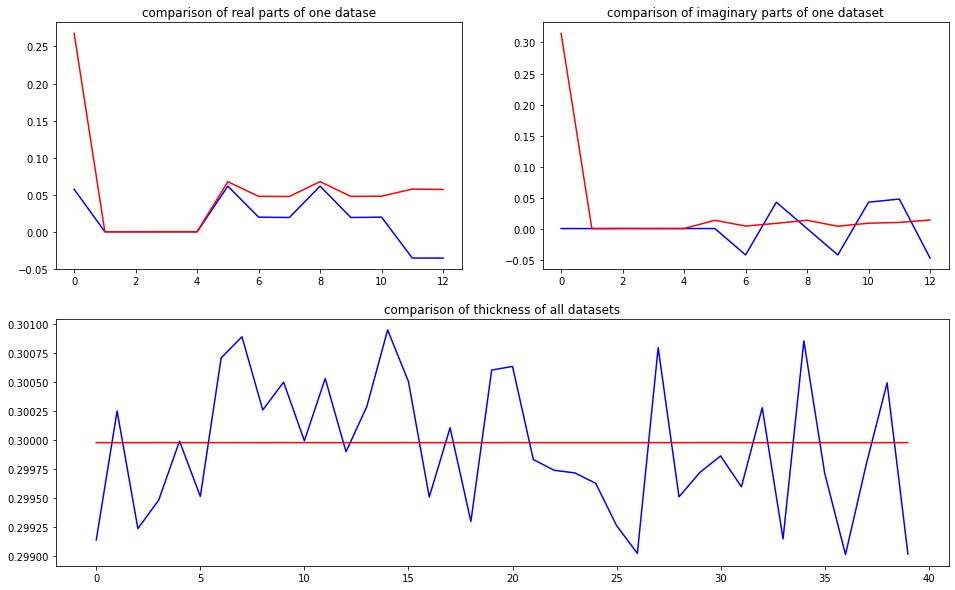

predicted thickness: 0.2999799


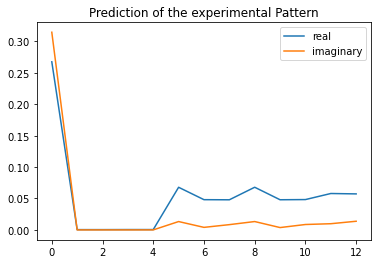

The offset applied on thickness: 0.0005167518701664906

The offset applied on Ug: 1.1064718215661116

Applied shift of unit cell origin (fractional coordinates): 0.003470669992924696 -1.2187772198774505e-05
Ug[ 0 ]: 0.45628 0.0  =>  0.45628 0.0
Ug[ 1 ]: 0.00046 -0.00781  =>  0.00046 -0.00789
Ug[ 2 ]: 0.00046 0.00781  =>  0.00046 0.00789
Ug[ 3 ]: 0.00055 -0.02181  =>  0.00055 0.0
Ug[ 4 ]: 0.00055 0.02181  =>  0.00055 -0.0
Ug[ 5 ]: 0.07318 -0.00015  =>  0.07318 0.0
Ug[ 6 ]: 0.05089 -0.04579  =>  0.05089 -0.0239
Ug[ 7 ]: 0.05062 0.04662  =>  0.05062 0.02489
Ug[ 8 ]: 0.07318 0.00015  =>  0.07318 0.0
Ug[ 9 ]: 0.05062 -0.04662  =>  0.05062 -0.02489
Ug[ 10 ]: 0.05089 0.04579  =>  0.05089 0.0239
Ug[ 11 ]: 0.06151 -0.0321  =>  0.06151 -0.07571
Ug[ 12 ]: 0.06151 0.0321  =>  0.06151 0.07571
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

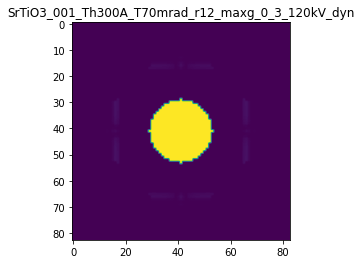

X_sim.max(): 0.999998845537808
>>>replaced the 39. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 272ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 209ms/step - loss: 0.0243 - acc: 0.2300 - val_loss: 0.0115 - val_acc: 0.4500
Epoch 4/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0243 - acc: 0.3000 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 257ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00


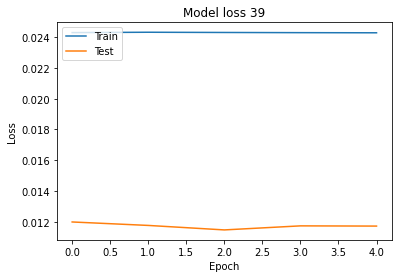

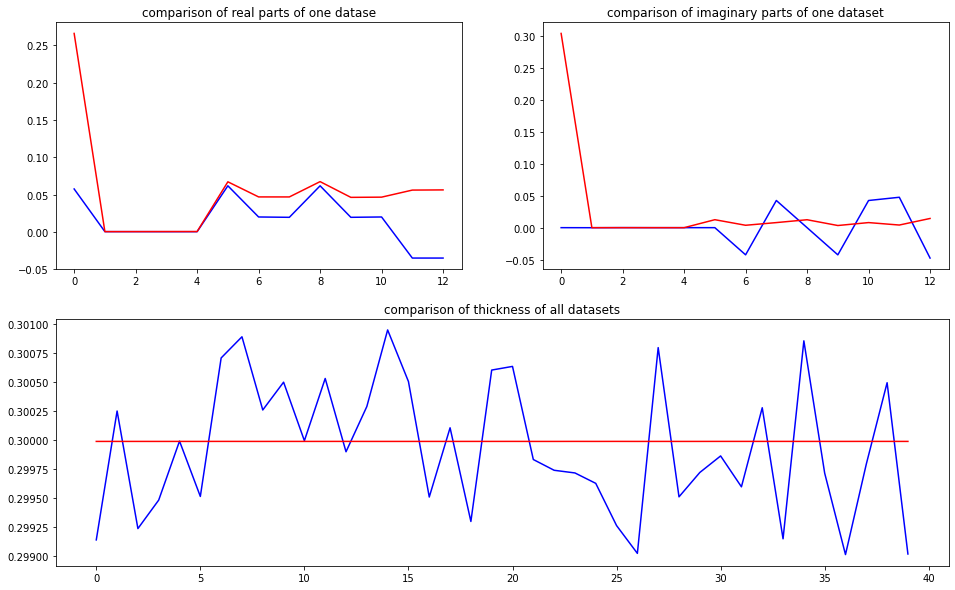

predicted thickness: 0.29999053


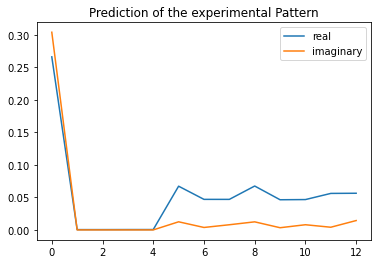

The offset applied on thickness: -0.0008275767580150298

The offset applied on Ug: 2.0758227721174736

Applied shift of unit cell origin (fractional coordinates): -0.0035937551669170532 -1.5061573376152025e-05
Ug[ 0 ]: 0.60509 0.0  =>  0.60509 0.0
Ug[ 1 ]: 0.00045 -0.00791  =>  0.00045 -0.00801
Ug[ 2 ]: 0.00045 0.00791  =>  0.00045 0.00801
Ug[ 3 ]: 0.00054 0.02258  =>  0.00054 0.0
Ug[ 4 ]: 0.00054 -0.02258  =>  0.00054 0.0
Ug[ 5 ]: 0.07709 -0.00019  =>  0.07709 0.0
Ug[ 6 ]: 0.05149 -0.04118  =>  0.05149 -0.06367
Ug[ 7 ]: 0.05132 0.04729  =>  0.05132 0.06996
Ug[ 8 ]: 0.07709 0.00019  =>  0.07709 -0.0
Ug[ 9 ]: 0.05132 -0.04729  =>  0.05132 -0.06996
Ug[ 10 ]: 0.05149 0.04118  =>  0.05149 0.06367
Ug[ 11 ]: 0.06328 -0.08588  =>  0.06328 -0.04072
Ug[ 12 ]: 0.06328 0.08588  =>  0.06328 0.04072
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

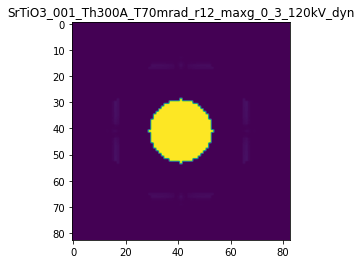

X_sim.max(): 0.9999988642003674
>>>replaced the 40. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 240ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 195ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0121 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 195ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00


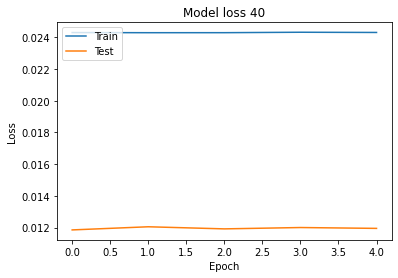

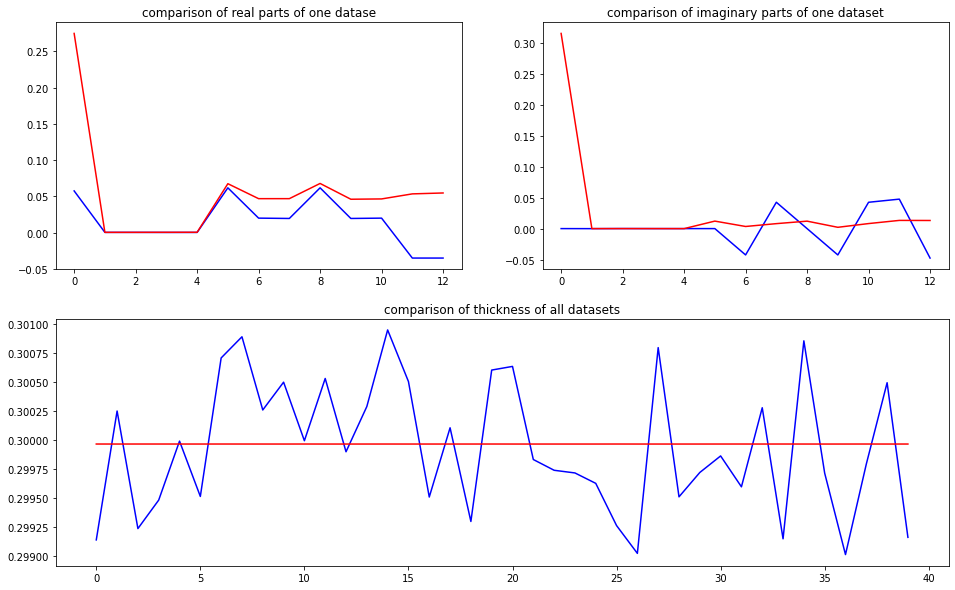

predicted thickness: 0.2999677


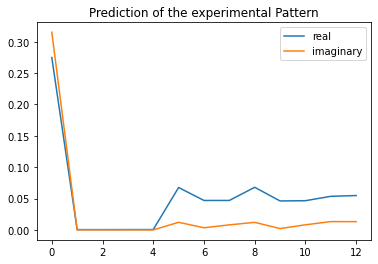

The offset applied on thickness: -0.0005561448093877948

The offset applied on Ug: -1.5177644933405308

Applied shift of unit cell origin (fractional coordinates): -0.006672596480908747 7.449575155134485e-05
Ug[ 0 ]: 0.00942 0.0  =>  0.00942 0.0
Ug[ 1 ]: 0.00045 -0.01424  =>  0.00045 -0.01378
Ug[ 2 ]: 0.00045 0.01424  =>  0.00045 0.01378
Ug[ 3 ]: 0.00053 0.04193  =>  0.00053 0.0
Ug[ 4 ]: 0.00053 -0.04193  =>  0.00053 0.0
Ug[ 5 ]: 0.06056 0.00094  =>  0.06056 0.0
Ug[ 6 ]: 0.04343 -0.05374  =>  0.04343 -0.09613
Ug[ 7 ]: 0.0433 0.06629  =>  0.0433 0.10774
Ug[ 8 ]: 0.06056 -0.00094  =>  0.06056 -0.0
Ug[ 9 ]: 0.0433 -0.06629  =>  0.0433 -0.10774
Ug[ 10 ]: 0.04343 0.05374  =>  0.04343 0.09613
Ug[ 11 ]: 0.04944 0.00288  =>  0.04944 0.08673
Ug[ 12 ]: 0.04944 -0.00288  =>  0.04944 -0.08673
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

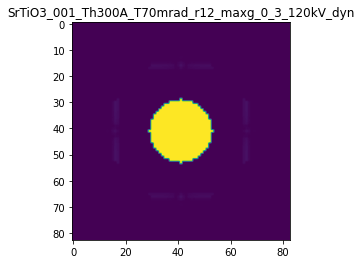

X_sim.max(): 0.9999982593071692
>>>replaced the 41. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 253ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 241ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 224ms/step - loss: 0.0244 - acc: 0.3100 - val_loss: 0.0114 - val_acc: 0.4500
Epoch 4/5
5/5 [==============================] - 1s 311ms/step - loss: 0.0244 - acc: 0.5900 - val_loss: 0.0114 - val_acc: 0.4500
Epoch 5/5
5/5 [==============================] - 1s 301ms/step - loss: 0.0244 - acc: 0.3700 - val_loss: 0.0117 - val_acc: 0.0000e+00


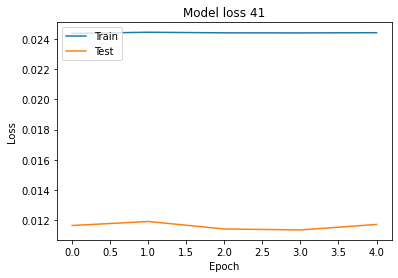

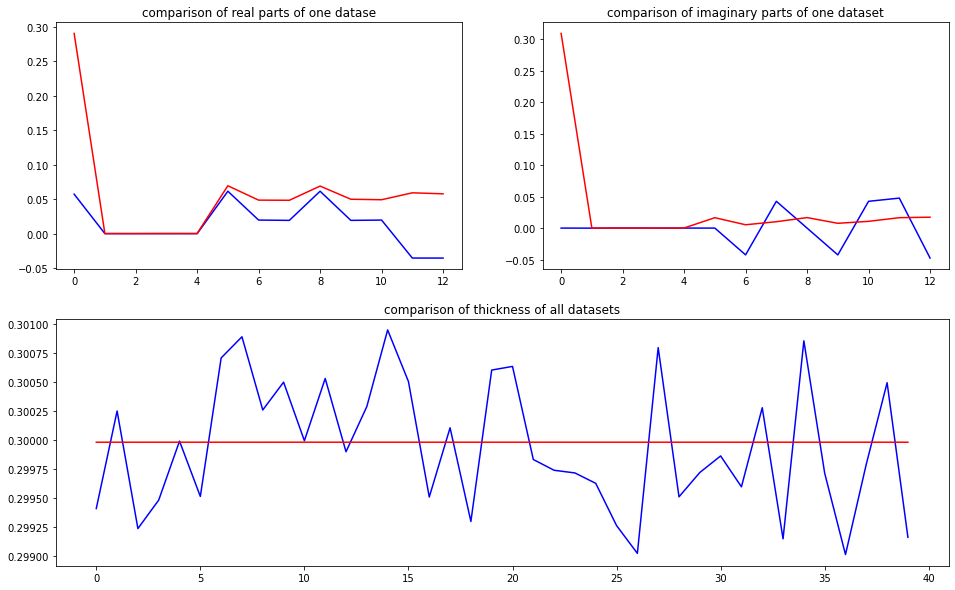

predicted thickness: 0.29998353


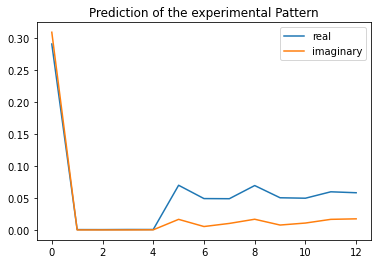

The offset applied on thickness: 0.00020067935130246674

The offset applied on Ug: 2.732600374463092

Applied shift of unit cell origin (fractional coordinates): 0.018879663233319337 4.2145754108370005e-05
Ug[ 0 ]: 0.78242 0.0  =>  0.78242 0.0
Ug[ 1 ]: 0.00048 -0.0032  =>  0.00048 -0.00294
Ug[ 2 ]: 0.00048 0.0032  =>  0.00048 0.00294
Ug[ 3 ]: 0.00064 -0.11862  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 0.11862  =>  0.00064 0.0
Ug[ 5 ]: 0.08355 0.00053  =>  0.08355 0.0
Ug[ 6 ]: 0.05617 -0.05338  =>  0.05617 0.06498
Ug[ 7 ]: 0.05644 0.01861  =>  0.05644 -0.10028
Ug[ 8 ]: 0.08355 -0.00053  =>  0.08355 0.0
Ug[ 9 ]: 0.05644 -0.01861  =>  0.05644 0.10028
Ug[ 10 ]: 0.05617 0.05338  =>  0.05617 -0.06498
Ug[ 11 ]: 0.06909 -0.00116  =>  0.06909 -0.23841
Ug[ 12 ]: 0.06909 0.00116  =>  0.06909 0.23841
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

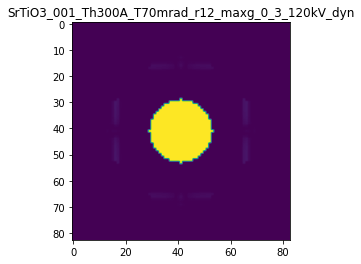

X_sim.max(): 0.9999987982920411
>>>replaced the 42. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 262ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 230ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0119 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0121 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00


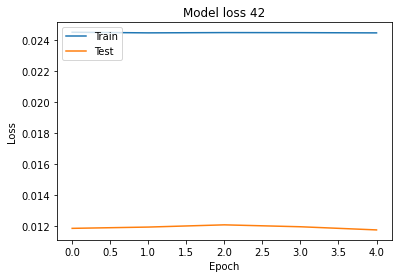

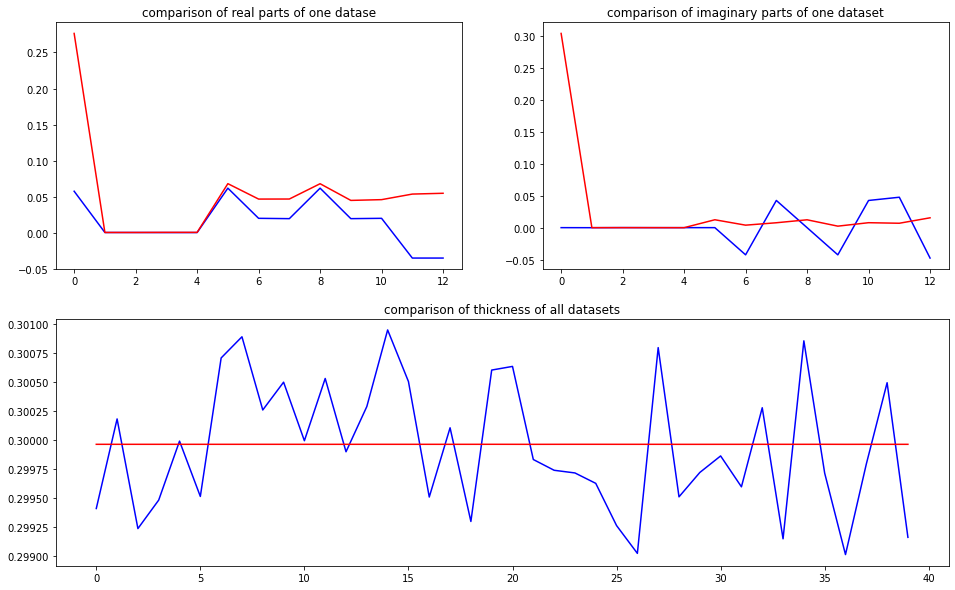

predicted thickness: 0.29996535


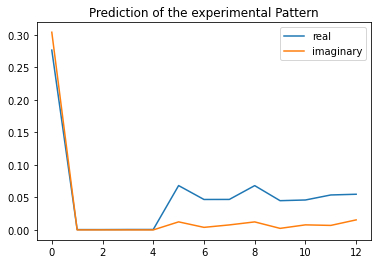

The offset applied on thickness: 0.0007507339615310363

The offset applied on Ug: -0.45244737150025893

Applied shift of unit cell origin (fractional coordinates): -0.005733254665096113 3.342148489310568e-05
Ug[ 0 ]: 0.20004 0.0  =>  0.20004 0.0
Ug[ 1 ]: 0.00046 -0.02452  =>  0.00046 -0.02431
Ug[ 2 ]: 0.00046 0.02452  =>  0.00046 0.02431
Ug[ 3 ]: 0.0006 0.03602  =>  0.0006 0.0
Ug[ 4 ]: 0.0006 -0.03602  =>  0.0006 -0.0
Ug[ 5 ]: 0.06591 0.00042  =>  0.06591 -0.0
Ug[ 6 ]: 0.04541 -0.04249  =>  0.04541 -0.07873
Ug[ 7 ]: 0.04498 0.05795  =>  0.04498 0.09377
Ug[ 8 ]: 0.06591 -0.00042  =>  0.06591 0.0
Ug[ 9 ]: 0.04498 -0.05795  =>  0.04498 -0.09377
Ug[ 10 ]: 0.04541 0.04249  =>  0.04541 0.07873
Ug[ 11 ]: 0.05301 -0.07912  =>  0.05301 -0.00707
Ug[ 12 ]: 0.05301 0.07912  =>  0.05301 0.00707
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

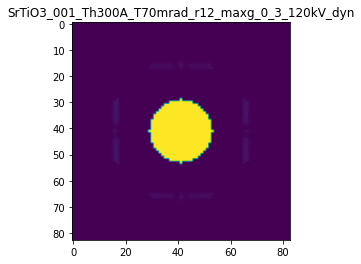

X_sim.max(): 0.999998299136018
>>>replaced the 43. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 234ms/step - loss: 0.0244 - acc: 0.4800 - val_loss: 0.0113 - val_acc: 0.4500
Epoch 2/5
5/5 [==============================] - 1s 194ms/step - loss: 0.0244 - acc: 0.5800 - val_loss: 0.0114 - val_acc: 0.4500
Epoch 3/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0244 - acc: 0.3200 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 290ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 318ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00


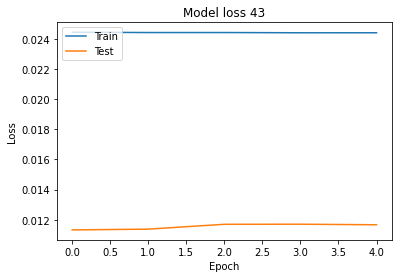

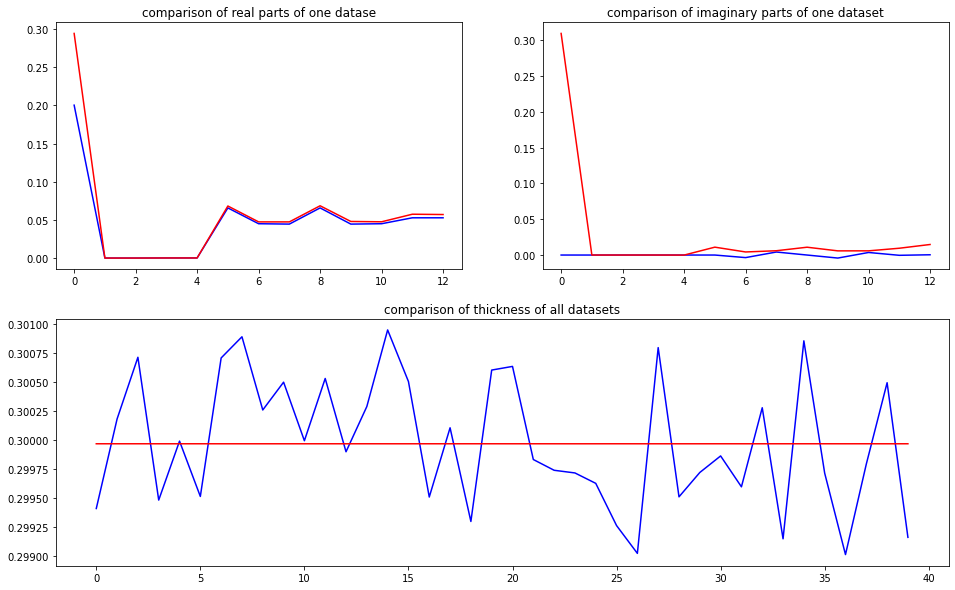

predicted thickness: 0.29997018


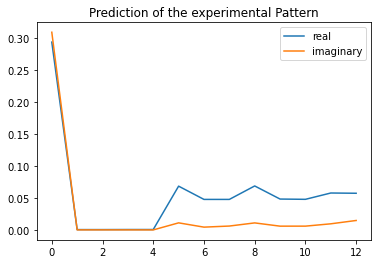

The offset applied on thickness: -0.0006685803217433997

The offset applied on Ug: -0.23548527585909465

Applied shift of unit cell origin (fractional coordinates): -0.00819729320462776 4.991988366100437e-05
Ug[ 0 ]: 0.25088 0.0  =>  0.25088 0.0
Ug[ 1 ]: 0.00045 -0.00127  =>  0.00045 -0.00096
Ug[ 2 ]: 0.00045 0.00127  =>  0.00045 0.00096
Ug[ 3 ]: 0.00056 0.05151  =>  0.00056 0.0
Ug[ 4 ]: 0.00056 -0.05151  =>  0.00056 -0.0
Ug[ 5 ]: 0.06742 0.00063  =>  0.06742 0.0
Ug[ 6 ]: 0.04719 -0.01643  =>  0.04719 -0.06825
Ug[ 7 ]: 0.04739 0.00193  =>  0.04739 0.05313
Ug[ 8 ]: 0.06742 -0.00063  =>  0.06742 0.0
Ug[ 9 ]: 0.04739 -0.00193  =>  0.04739 -0.05313
Ug[ 10 ]: 0.04719 0.01643  =>  0.04719 0.06825
Ug[ 11 ]: 0.05672 -0.04577  =>  0.05672 0.05724
Ug[ 12 ]: 0.05672 0.04577  =>  0.05672 -0.05724
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

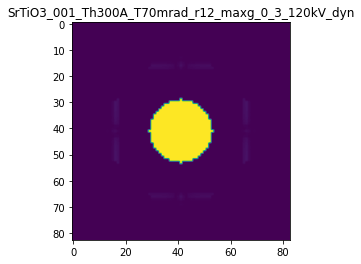

X_sim.max(): 0.9999985071278834
>>>replaced the 44. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 241ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0114 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 187ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0117 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 214ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0115 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0115 - val_acc: 0.0000e+00


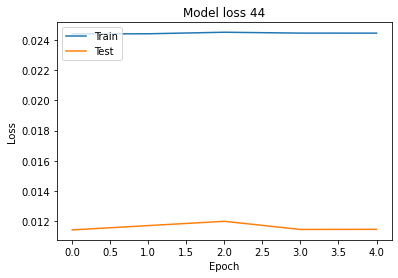

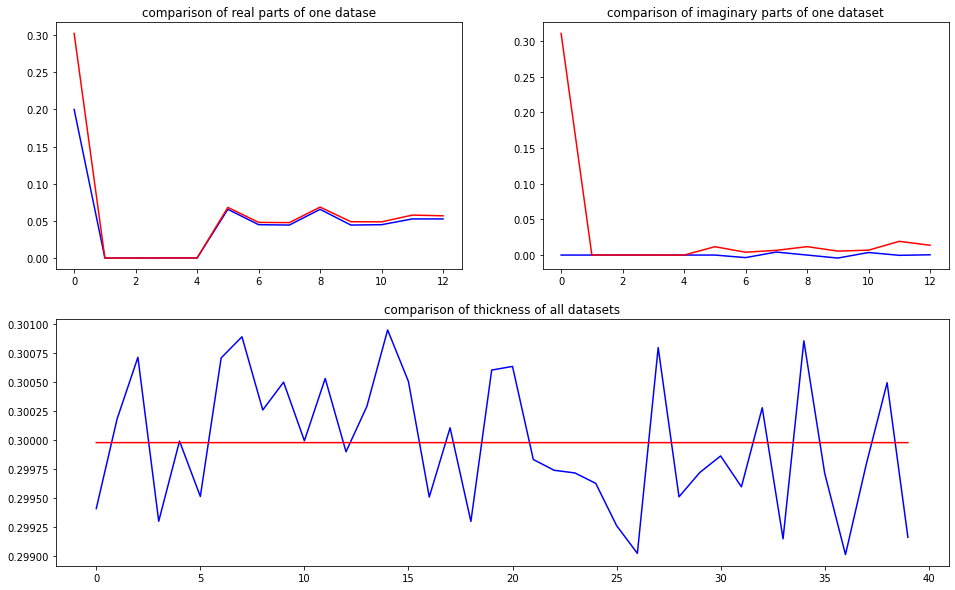

predicted thickness: 0.29997998


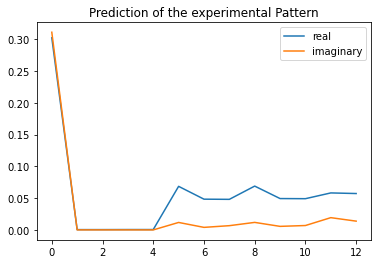

The offset applied on thickness: -0.0009183064785514241

The offset applied on Ug: -2.6827505450427975

Applied shift of unit cell origin (fractional coordinates): -0.005843775730932512 -6.817746553281741e-06
Ug[ 0 ]: 0.20213 3.14159  =>  0.20213 3.14159
Ug[ 1 ]: 0.00045 -0.00224  =>  0.00045 -0.00228
Ug[ 2 ]: 0.00045 0.00224  =>  0.00045 0.00228
Ug[ 3 ]: 0.00054 0.03672  =>  0.00054 0.0
Ug[ 4 ]: 0.00054 -0.03672  =>  0.00054 -0.0
Ug[ 5 ]: 0.05567 -9e-05  =>  0.05567 0.0
Ug[ 6 ]: 0.04228 -0.03213  =>  0.04228 -0.0688
Ug[ 7 ]: 0.04222 0.01498  =>  0.04222 0.05174
Ug[ 8 ]: 0.05567 9e-05  =>  0.05567 0.0
Ug[ 9 ]: 0.04222 -0.01498  =>  0.04222 -0.05174
Ug[ 10 ]: 0.04228 0.03213  =>  0.04228 0.0688
Ug[ 11 ]: 0.04806 0.05162  =>  0.04806 0.12506
Ug[ 12 ]: 0.04806 -0.05162  =>  0.04806 -0.12506
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

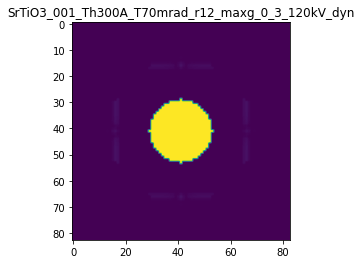

X_sim.max(): 0.9999980875720633
>>>replaced the 45. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 287ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0110 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 258ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0107 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 2s 336ms/step - loss: 0.0244 - acc: 0.2500 - val_loss: 0.0108 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 312ms/step - loss: 0.0244 - acc: 0.4700 - val_loss: 0.0106 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 2s 332ms/step - loss: 0.0244 - acc: 0.5200 - val_loss: 0.0107 - val_acc: 0.0000e+00


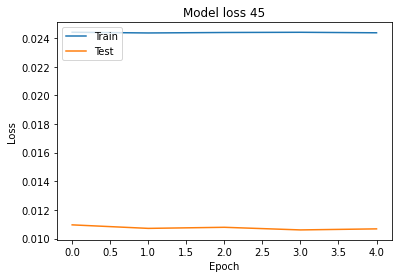

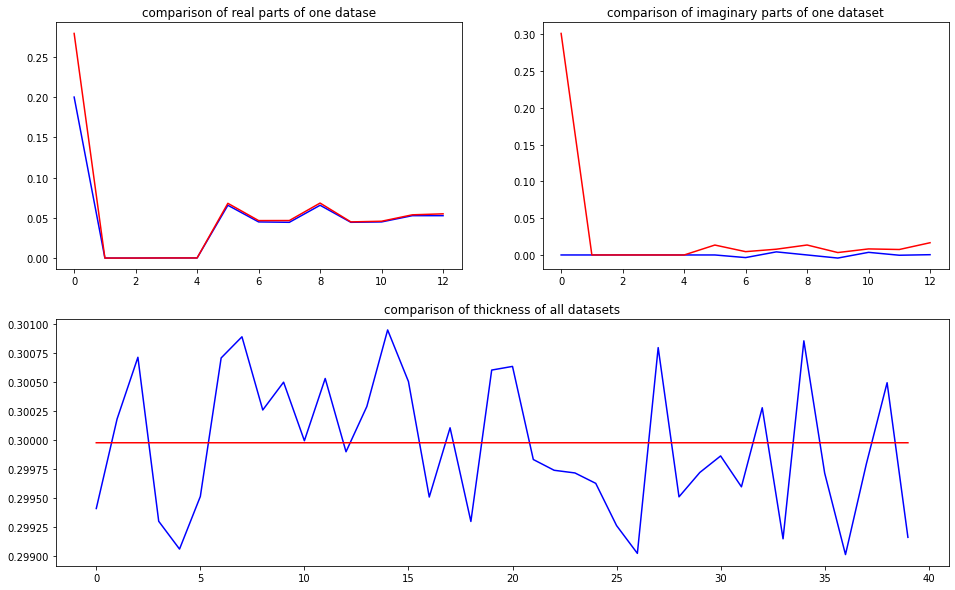

predicted thickness: 0.29997888


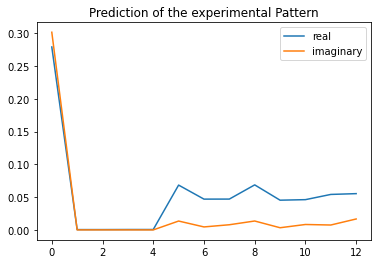

The offset applied on thickness: 0.0005648464549853828

The offset applied on Ug: -0.8752765759072604

Applied shift of unit cell origin (fractional coordinates): -0.00651077267979619 -1.3120970501699947e-05
Ug[ 0 ]: 0.13133 0.0  =>  0.13133 0.0
Ug[ 1 ]: 0.00046 -0.01942  =>  0.00046 -0.0195
Ug[ 2 ]: 0.00046 0.01942  =>  0.00046 0.0195
Ug[ 3 ]: 0.00057 0.04091  =>  0.00057 0.0
Ug[ 4 ]: 0.00057 -0.04091  =>  0.00057 0.0
Ug[ 5 ]: 0.06422 -0.00016  =>  0.06422 0.0
Ug[ 6 ]: 0.04462 -0.04188  =>  0.04462 -0.0827
Ug[ 7 ]: 0.0443 0.04964  =>  0.0443 0.09063
Ug[ 8 ]: 0.06422 0.00016  =>  0.06422 0.0
Ug[ 9 ]: 0.0443 -0.04964  =>  0.0443 -0.09063
Ug[ 10 ]: 0.04462 0.04188  =>  0.04462 0.0827
Ug[ 11 ]: 0.05211 -0.08582  =>  0.05211 -0.004
Ug[ 12 ]: 0.05211 0.08582  =>  0.05211 0.004
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

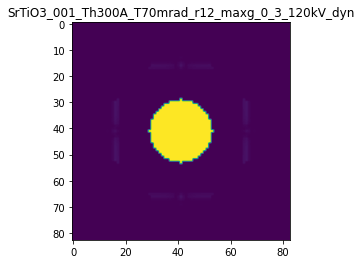

X_sim.max(): 0.9999983133785242
>>>replaced the 46. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 249ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 238ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 231ms/step - loss: 0.0243 - acc: 0.1800 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0102 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 224ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00


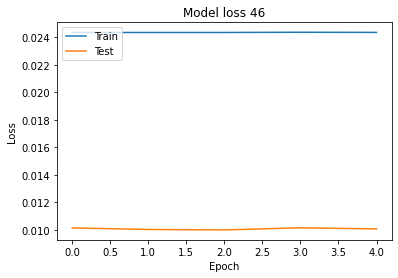

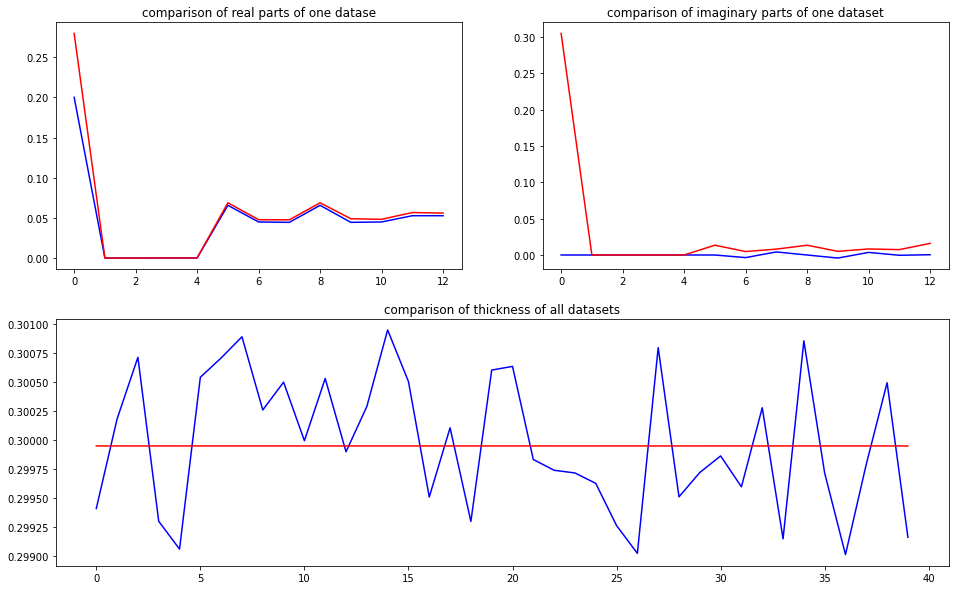

predicted thickness: 0.29995131


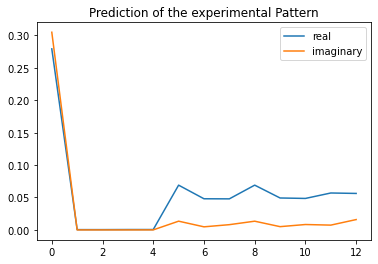

The offset applied on thickness: 0.0009917834532597656

The offset applied on Ug: -2.446049564154722

Applied shift of unit cell origin (fractional coordinates): 0.00507824062784217 2.0257307769588348e-05
Ug[ 0 ]: 0.13892 3.14159  =>  0.13892 3.14159
Ug[ 1 ]: 0.00046 -0.00544  =>  0.00046 -0.00531
Ug[ 2 ]: 0.00046 0.00544  =>  0.00046 0.00531
Ug[ 3 ]: 0.00058 -0.03191  =>  0.00058 -0.0
Ug[ 4 ]: 0.00058 0.03191  =>  0.00058 0.0
Ug[ 5 ]: 0.05695 0.00025  =>  0.05695 -0.0
Ug[ 6 ]: 0.04252 -0.03995  =>  0.04252 -0.00817
Ug[ 7 ]: 0.04273 0.03748  =>  0.04273 0.00544
Ug[ 8 ]: 0.05695 -0.00025  =>  0.05695 0.0
Ug[ 9 ]: 0.04273 -0.03748  =>  0.04273 -0.00544
Ug[ 10 ]: 0.04252 0.03995  =>  0.04252 0.00817
Ug[ 11 ]: 0.04857 -0.08556  =>  0.04857 -0.14938
Ug[ 12 ]: 0.04857 0.08556  =>  0.04857 0.14938
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//S

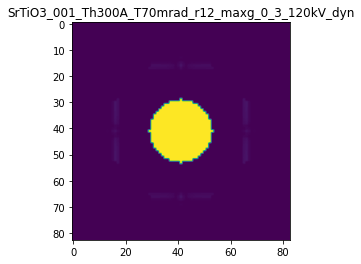

X_sim.max(): 0.9999981406684115
>>>replaced the 47. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 311ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 242ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 269ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 356ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0099 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 346ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0102 - val_acc: 0.0000e+00


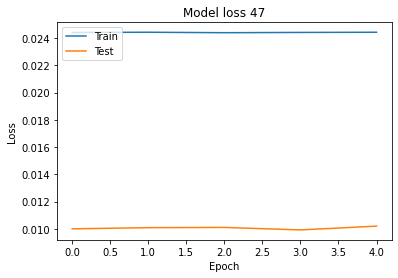

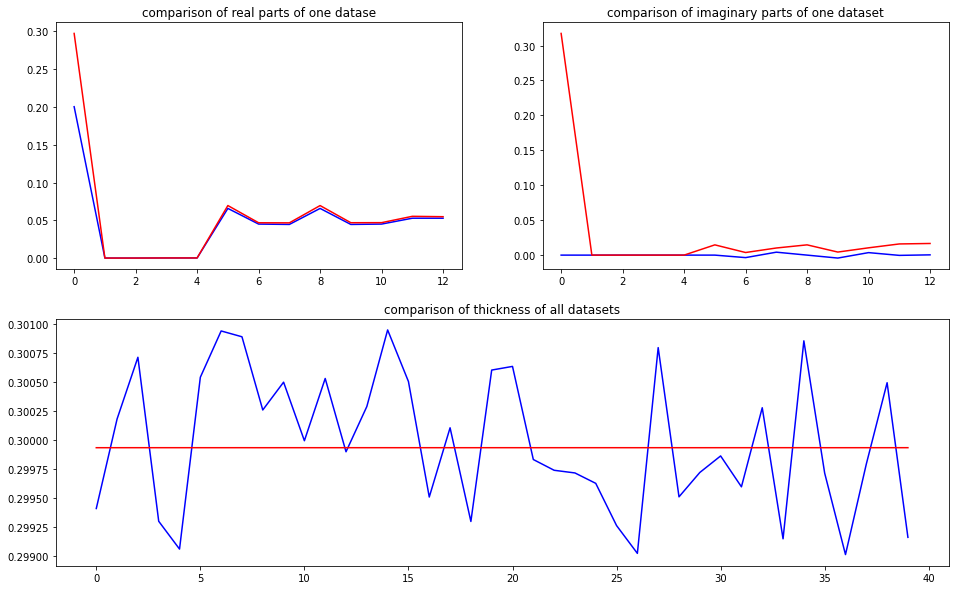

predicted thickness: 0.2999362


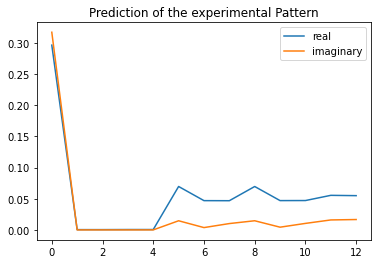

The offset applied on thickness: 0.0008557155624990802

The offset applied on Ug: 0.66265801185322

Applied shift of unit cell origin (fractional coordinates): 0.001979147784841501 -6.069152643181718e-06
Ug[ 0 ]: 0.42167 0.0  =>  0.42167 0.0
Ug[ 1 ]: 0.00046 -0.02241  =>  0.00046 -0.02245
Ug[ 2 ]: 0.00046 0.02241  =>  0.00046 0.02245
Ug[ 3 ]: 0.0006 -0.01244  =>  0.0006 0.0
Ug[ 4 ]: 0.0006 0.01244  =>  0.0006 -0.0
Ug[ 5 ]: 0.07305 -8e-05  =>  0.07305 0.0
Ug[ 6 ]: 0.04869 -0.06995  =>  0.04869 -0.05748
Ug[ 7 ]: 0.04855 0.06034  =>  0.04855 0.04794
Ug[ 8 ]: 0.07305 8e-05  =>  0.07305 0.0
Ug[ 9 ]: 0.04855 -0.06034  =>  0.04855 -0.04794
Ug[ 10 ]: 0.04869 0.06995  =>  0.04869 0.05748
Ug[ 11 ]: 0.05745 -0.0056  =>  0.05745 -0.03047
Ug[ 12 ]: 0.05745 0.0056  =>  0.05745 0.03047
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70

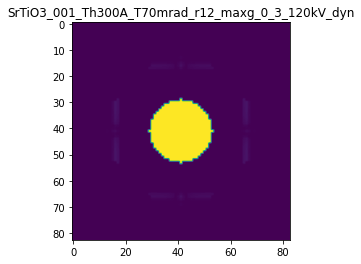

X_sim.max(): 0.9999986004400465
>>>replaced the 48. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 300ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 221ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 301ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0098 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 342ms/step - loss: 0.0244 - acc: 0.1800 - val_loss: 0.0098 - val_acc: 0.0000e+00


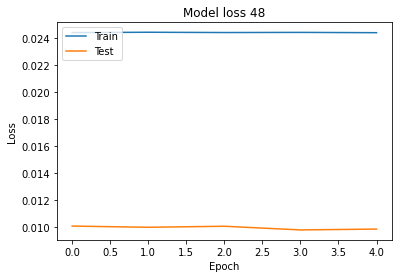

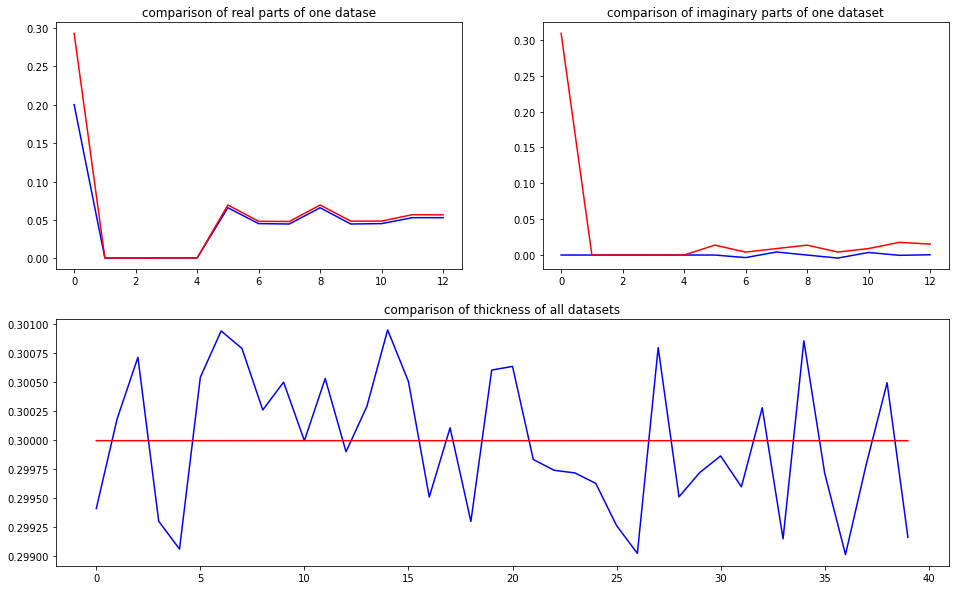

predicted thickness: 0.29999682


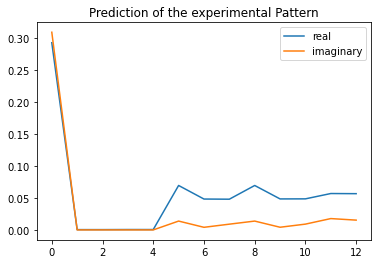

The offset applied on thickness: -0.0005999014569107708

The offset applied on Ug: 2.9394925437722885

Applied shift of unit cell origin (fractional coordinates): -0.0014293194160974142 1.2189977899412012e-05
Ug[ 0 ]: 0.82544 0.0  =>  0.82544 0.0
Ug[ 1 ]: 0.00046 -0.0191  =>  0.00046 -0.01902
Ug[ 2 ]: 0.00046 0.0191  =>  0.00046 0.01902
Ug[ 3 ]: 0.00058 0.00898  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 -0.00898  =>  0.00058 0.0
Ug[ 5 ]: 0.08423 0.00015  =>  0.08423 0.0
Ug[ 6 ]: 0.05552 -0.04832  =>  0.05552 -0.05737
Ug[ 7 ]: 0.05527 0.04418  =>  0.05527 0.05308
Ug[ 8 ]: 0.08423 -0.00015  =>  0.08423 -0.0
Ug[ 9 ]: 0.05527 -0.04418  =>  0.05527 -0.05308
Ug[ 10 ]: 0.05552 0.04832  =>  0.05552 0.05737
Ug[ 11 ]: 0.06707 0.02136  =>  0.06707 0.03932
Ug[ 12 ]: 0.06707 -0.02136  =>  0.06707 -0.03932
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

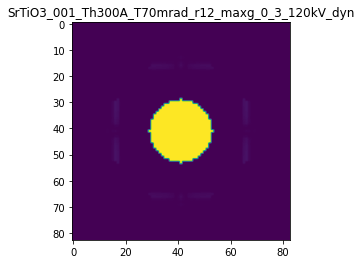

X_sim.max(): 0.9999989378366467
>>>replaced the 49. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 274ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 239ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 237ms/step - loss: 0.0245 - acc: 0.2100 - val_loss: 0.0093 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 242ms/step - loss: 0.0245 - acc: 0.2900 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 276ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0095 - val_acc: 0.0000e+00


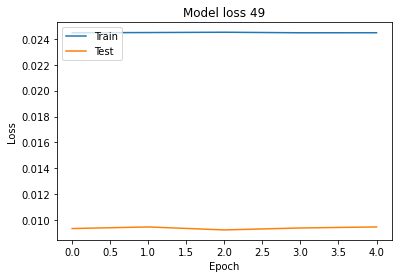

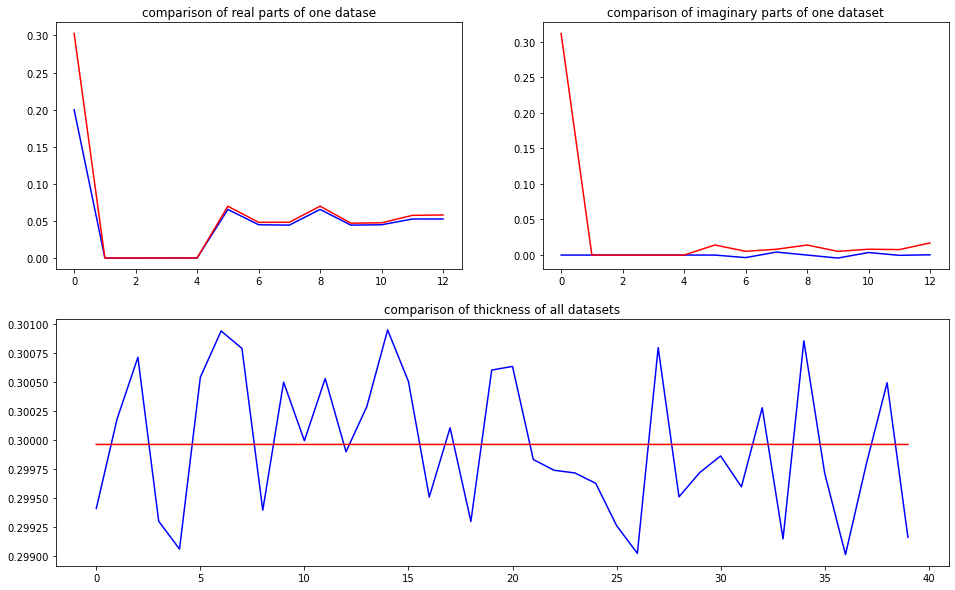

predicted thickness: 0.29996434


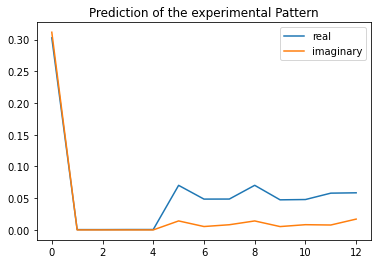

The offset applied on thickness: -0.00035131022908741594

The offset applied on Ug: 1.26743393755597

Applied shift of unit cell origin (fractional coordinates): -0.004080209544198293 8.223065288463986e-06
Ug[ 0 ]: 0.54193 0.0  =>  0.54193 0.0
Ug[ 1 ]: 0.00046 -0.00887  =>  0.00046 -0.00882
Ug[ 2 ]: 0.00046 0.00887  =>  0.00046 0.00882
Ug[ 3 ]: 0.00058 0.02564  =>  0.00058 -0.0
Ug[ 4 ]: 0.00058 -0.02564  =>  0.00058 0.0
Ug[ 5 ]: 0.07676 0.0001  =>  0.07676 0.0
Ug[ 6 ]: 0.05123 -0.02784  =>  0.05123 -0.05353
Ug[ 7 ]: 0.05102 0.03065  =>  0.05102 0.05624
Ug[ 8 ]: 0.07676 -0.0001  =>  0.07676 0.0
Ug[ 9 ]: 0.05102 -0.03065  =>  0.05102 -0.05624
Ug[ 10 ]: 0.05123 0.02784  =>  0.05123 0.05353
Ug[ 11 ]: 0.0629 -0.07764  =>  0.0629 -0.02637
Ug[ 12 ]: 0.0629 0.07764  =>  0.0629 0.02637
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

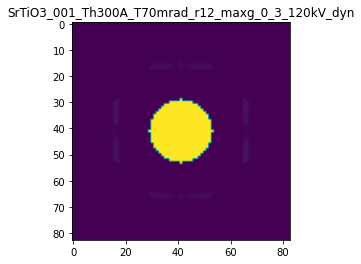

X_sim.max(): 0.9999987429202012
>>>replaced the 50. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 398ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0093 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 2s 375ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 2s 407ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 338ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 2s 335ms/step - loss: 0.0245 - acc: 0.1600 - val_loss: 0.0092 - val_acc: 0.5500


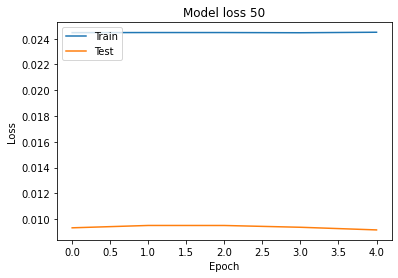

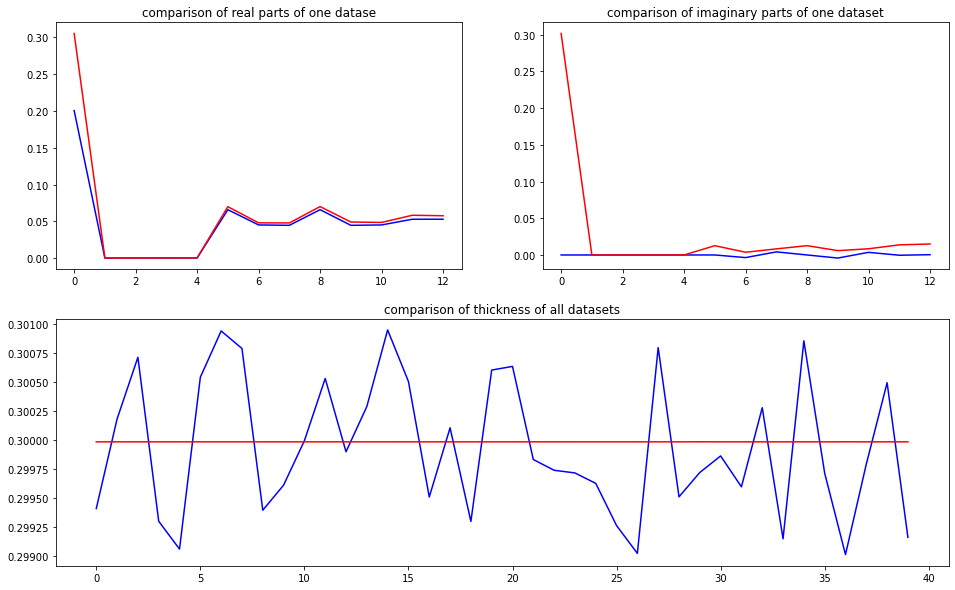

predicted thickness: 0.29998672


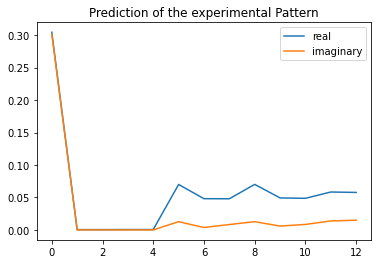

The offset applied on thickness: 0.000828918673456186

The offset applied on Ug: 0.03068865081247221

Applied shift of unit cell origin (fractional coordinates): 0.0009280071153887992 -1.0157672048648896e-05
Ug[ 0 ]: 0.31014 0.0  =>  0.31014 0.0
Ug[ 1 ]: 0.00046 -0.0094  =>  0.00046 -0.00946
Ug[ 2 ]: 0.00046 0.0094  =>  0.00046 0.00946
Ug[ 3 ]: 0.00058 -0.00583  =>  0.00058 -0.0
Ug[ 4 ]: 0.00058 0.00583  =>  0.00058 0.0
Ug[ 5 ]: 0.07021 -0.00013  =>  0.07021 0.0
Ug[ 6 ]: 0.04852 -0.04903  =>  0.04852 -0.04313
Ug[ 7 ]: 0.04872 0.02473  =>  0.04872 0.01896
Ug[ 8 ]: 0.07021 0.00013  =>  0.07021 0.0
Ug[ 9 ]: 0.04872 -0.02473  =>  0.04872 -0.01896
Ug[ 10 ]: 0.04852 0.04903  =>  0.04852 0.04313
Ug[ 11 ]: 0.05818 -0.00973  =>  0.05818 -0.02139
Ug[ 12 ]: 0.05818 0.00973  =>  0.05818 0.02139
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

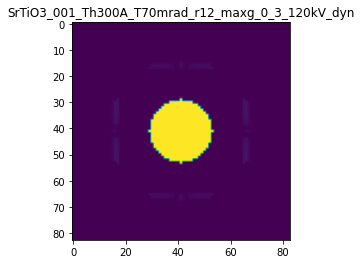

X_sim.max(): 0.9999986644817976
>>>replaced the 51. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 291ms/step - loss: 0.0245 - acc: 0.2700 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 226ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0094 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 2s 349ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0093 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 2s 320ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0095 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 288ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0094 - val_acc: 0.0000e+00


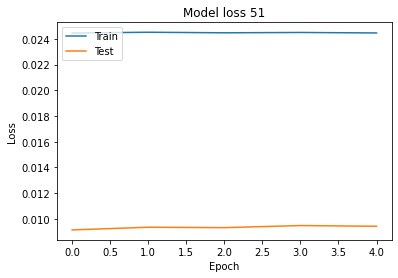

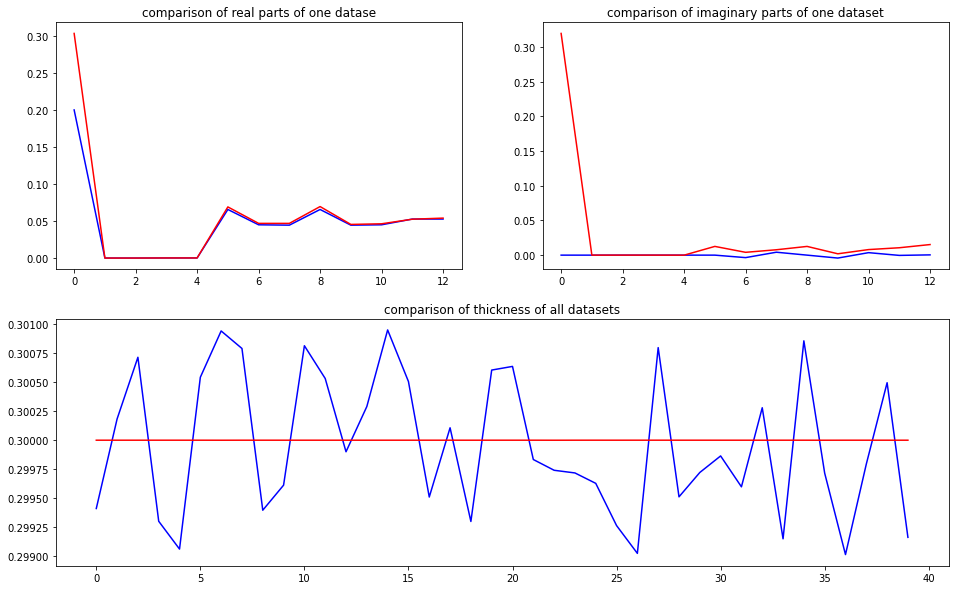

predicted thickness: 0.30000094


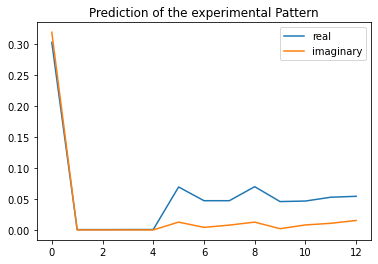

The offset applied on thickness: 0.0006951782819792631

The offset applied on Ug: -1.6333117611973638

Applied shift of unit cell origin (fractional coordinates): -0.005024030046714772 5.682968835273499e-05
Ug[ 0 ]: 0.01361 3.14159  =>  0.01361 3.14159
Ug[ 1 ]: 0.00045 -0.0206  =>  0.00045 -0.02025
Ug[ 2 ]: 0.00045 0.0206  =>  0.00045 0.02025
Ug[ 3 ]: 0.00058 0.03157  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 -0.03157  =>  0.00058 0.0
Ug[ 5 ]: 0.06143 0.00071  =>  0.06143 0.0
Ug[ 6 ]: 0.04329 -0.04558  =>  0.04329 -0.0775
Ug[ 7 ]: 0.04299 0.06466  =>  0.04299 0.09587
Ug[ 8 ]: 0.06143 -0.00071  =>  0.06143 0.0
Ug[ 9 ]: 0.04299 -0.06466  =>  0.04299 -0.09587
Ug[ 10 ]: 0.04329 0.04558  =>  0.04329 0.0775
Ug[ 11 ]: 0.04862 -0.04359  =>  0.04862 0.01954
Ug[ 12 ]: 0.04862 0.04359  =>  0.04862 -0.01954
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

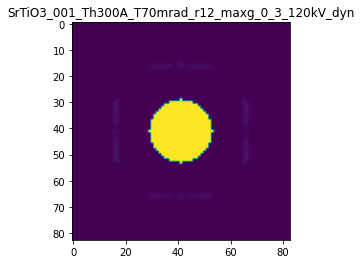

X_sim.max(): 0.9999981741837644
>>>replaced the 52. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 273ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0245 - acc: 0.2200 - val_loss: 0.0089 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0245 - acc: 0.2200 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 231ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0093 - val_acc: 0.0000e+00


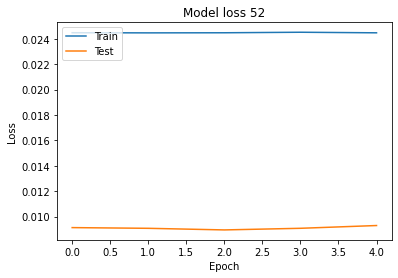

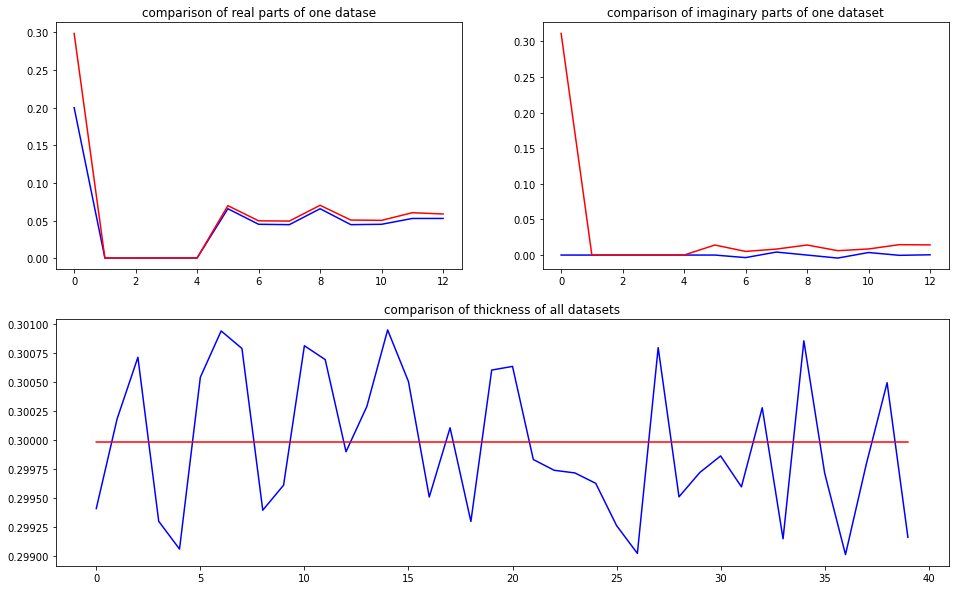

predicted thickness: 0.2999853


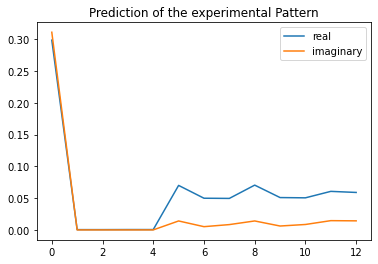

The offset applied on thickness: 0.0009097859854514034

The offset applied on Ug: 1.6314676315223604

Applied shift of unit cell origin (fractional coordinates): 0.0023550475581851733 -7.30683262609536e-05
Ug[ 0 ]: 0.60167 0.0  =>  0.60167 0.0
Ug[ 1 ]: 0.00046 -0.00753  =>  0.00046 -0.00799
Ug[ 2 ]: 0.00046 0.00753  =>  0.00046 0.00799
Ug[ 3 ]: 0.00055 -0.0148  =>  0.00055 0.0
Ug[ 4 ]: 0.00055 0.0148  =>  0.00055 0.0
Ug[ 5 ]: 0.0786 -0.00092  =>  0.0786 0.0
Ug[ 6 ]: 0.05437 -0.03372  =>  0.05437 -0.01846
Ug[ 7 ]: 0.05443 0.01871  =>  0.05443 0.00437
Ug[ 8 ]: 0.0786 0.00092  =>  0.0786 0.0
Ug[ 9 ]: 0.05443 -0.01871  =>  0.05443 -0.00437
Ug[ 10 ]: 0.05437 0.03372  =>  0.05437 0.01846
Ug[ 11 ]: 0.06596 0.00579  =>  0.06596 -0.0238
Ug[ 12 ]: 0.06596 -0.00579  =>  0.06596 0.0238
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

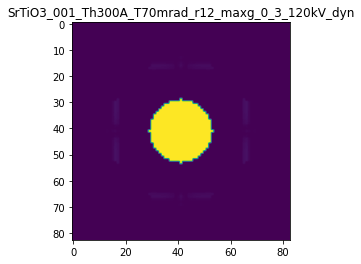

X_sim.max(): 0.9999990134050689
>>>replaced the 53. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 252ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 2/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 3/5
5/5 [==============================] - 1s 194ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 4/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0092 - val_acc: 0.0000e+00
Epoch 5/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0245 - acc: 0.1800 - val_loss: 0.0090 - val_acc: 0.0000e+00


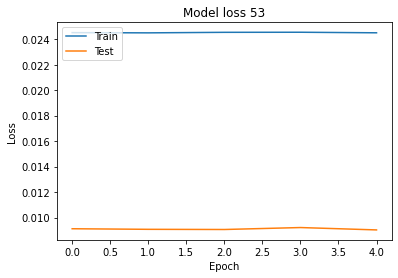

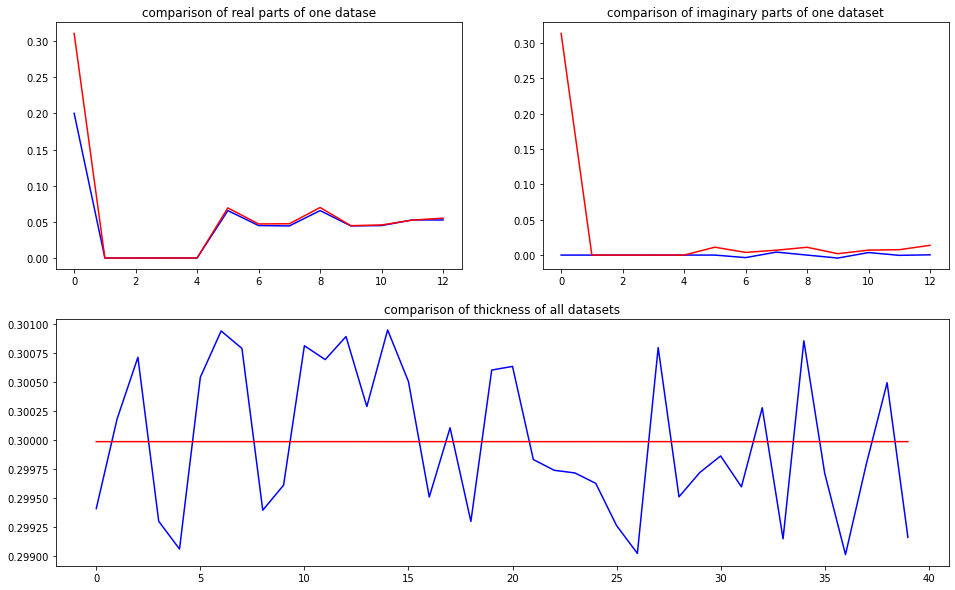

predicted thickness: 0.29998845


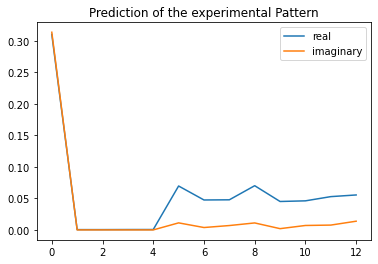

The offset applied on thickness: 6.679659524630388e-05

The offset applied on Ug: -2.414919444211978

Applied shift of unit cell origin (fractional coordinates): -0.0032328240390160014 0.0001255655860400795
Ug[ 0 ]: 0.15982 3.14159  =>  0.15982 3.14159
Ug[ 1 ]: 0.00046 -0.01968  =>  0.00046 -0.01889
Ug[ 2 ]: 0.00046 0.01968  =>  0.00046 0.01889
Ug[ 3 ]: 0.00059 0.02031  =>  0.00059 -0.0
Ug[ 4 ]: 0.00059 -0.02031  =>  0.00059 0.0
Ug[ 5 ]: 0.05781 0.00158  =>  0.05781 0.0
Ug[ 6 ]: 0.04147 -0.04096  =>  0.04147 -0.06206
Ug[ 7 ]: 0.04122 0.05396  =>  0.04122 0.07348
Ug[ 8 ]: 0.05781 -0.00158  =>  0.05781 0.0
Ug[ 9 ]: 0.04122 -0.05396  =>  0.04122 -0.07348
Ug[ 10 ]: 0.04147 0.04096  =>  0.04147 0.06206
Ug[ 11 ]: 0.04683 -0.0585  =>  0.04683 -0.01788
Ug[ 12 ]: 0.04683 0.0585  =>  0.04683 0.01788
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//Sr

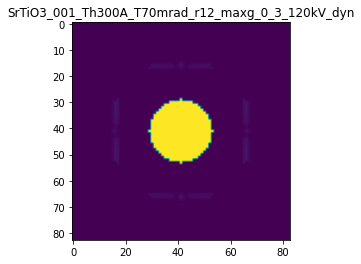

X_sim.max(): 0.9999978840577132
>>>replaced the 54. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 266ms/step - loss: 0.0223 - acc: 0.2000 - val_loss: 0.0088 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0223 - acc: 0.4000 - val_loss: 0.0084 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 217ms/step - loss: 0.0223 - acc: 0.5400 - val_loss: 0.0082 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0223 - acc: 0.5400 - val_loss: 0.0081 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0223 - acc: 0.5400 - val_loss: 0.0081 - val_acc: 0.4750


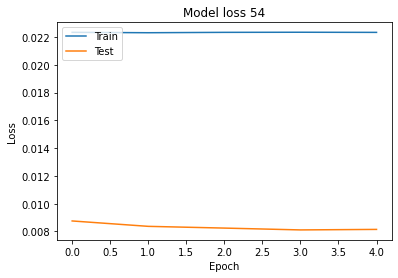

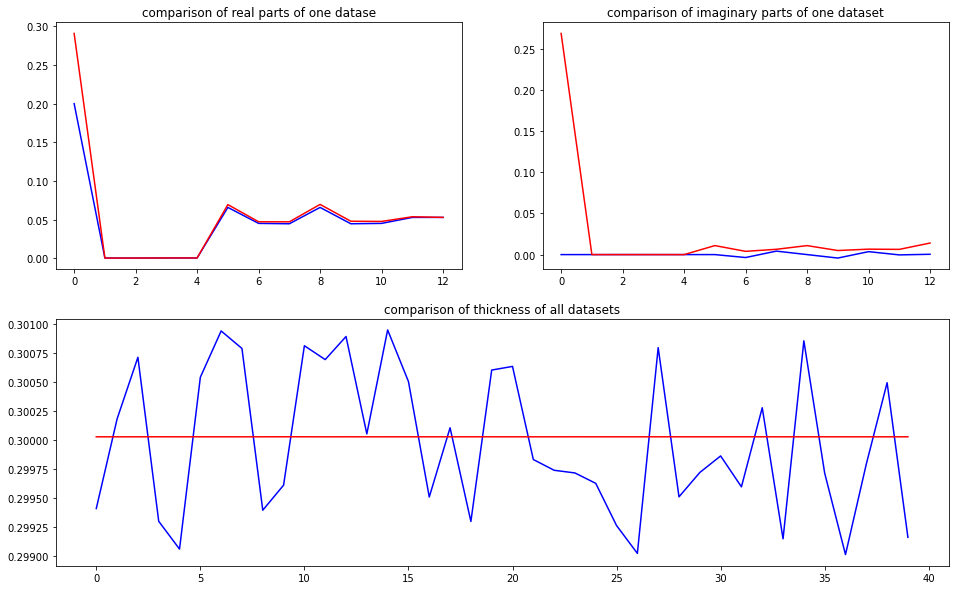

predicted thickness: 0.30003008


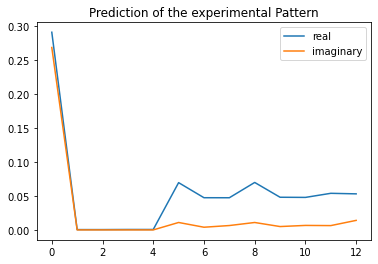

The offset applied on thickness: 0.0006969385227734426

The offset applied on Ug: 2.1974071116950054

Applied shift of unit cell origin (fractional coordinates): -0.0027835183248311993 -5.347809864268012e-05
Ug[ 0 ]: 0.63485 0.0  =>  0.63485 0.0
Ug[ 1 ]: 0.00046 -0.00019  =>  0.00046 -0.00052
Ug[ 2 ]: 0.00046 0.00019  =>  0.00046 0.00052
Ug[ 3 ]: 0.00061 0.01749  =>  0.00061 -0.0
Ug[ 4 ]: 0.00061 -0.01749  =>  0.00061 0.0
Ug[ 5 ]: 0.0806 -0.00067  =>  0.0806 0.0
Ug[ 6 ]: 0.05264 -0.02716  =>  0.05264 -0.04432
Ug[ 7 ]: 0.05274 0.0126  =>  0.05274 0.03043
Ug[ 8 ]: 0.0806 0.00067  =>  0.0806 -0.0
Ug[ 9 ]: 0.05274 -0.0126  =>  0.05274 -0.03043
Ug[ 10 ]: 0.05264 0.02716  =>  0.05264 0.04432
Ug[ 11 ]: 0.06009 -0.06537  =>  0.06009 -0.03039
Ug[ 12 ]: 0.06009 0.06537  =>  0.06009 0.03039
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

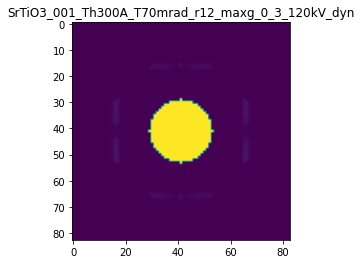

X_sim.max(): 0.9999987807161783
>>>replaced the 55. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 250ms/step - loss: 0.0209 - acc: 0.4700 - val_loss: 0.0081 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0209 - acc: 0.3000 - val_loss: 0.0081 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0209 - acc: 0.3000 - val_loss: 0.0079 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0209 - acc: 0.3000 - val_loss: 0.0076 - val_acc: 0.4500
Epoch 5/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0210 - acc: 0.5400 - val_loss: 0.0080 - val_acc: 0.4500


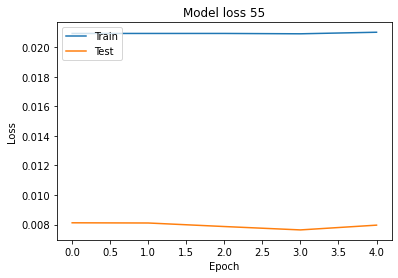

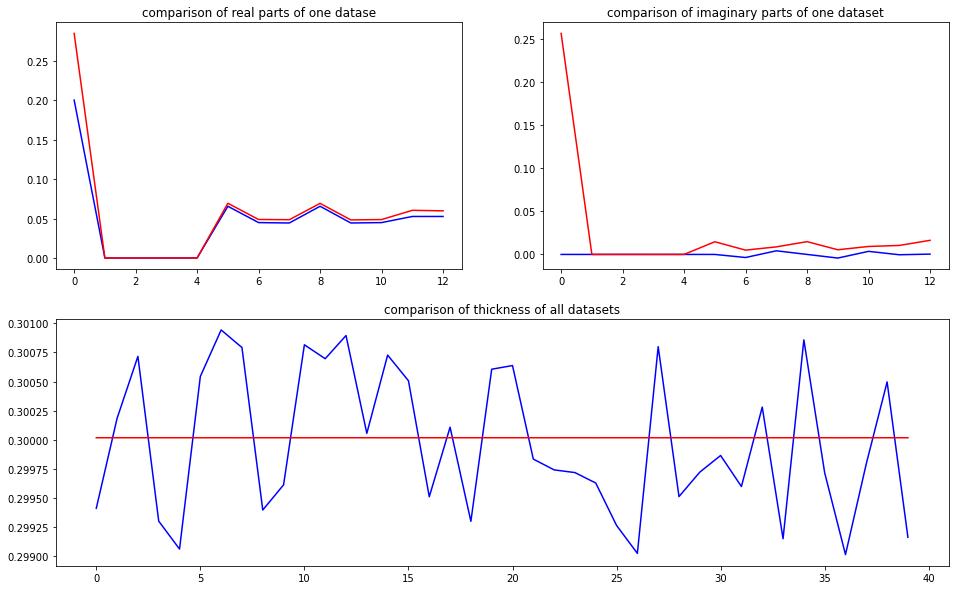

predicted thickness: 0.3000174


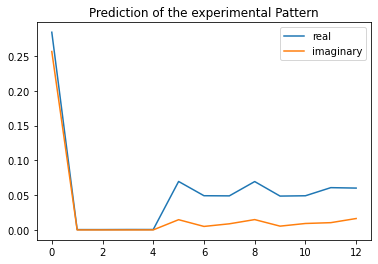

The offset applied on thickness: -0.000865251343792488

The offset applied on Ug: 1.27371072616747

Applied shift of unit cell origin (fractional coordinates): 0.003968336646681292 -5.9024022958901364e-05
Ug[ 0 ]: 0.47101 0.0  =>  0.47101 0.0
Ug[ 1 ]: 0.00047 -0.00672  =>  0.00047 -0.00709
Ug[ 2 ]: 0.00047 0.00672  =>  0.00047 0.00709
Ug[ 3 ]: 0.00057 -0.02493  =>  0.00057 -0.0
Ug[ 4 ]: 0.00057 0.02493  =>  0.00057 0.0
Ug[ 5 ]: 0.07605 -0.00074  =>  0.07605 -0.0
Ug[ 6 ]: 0.05233 -0.04132  =>  0.05233 -0.01601
Ug[ 7 ]: 0.05193 0.03352  =>  0.05193 0.00896
Ug[ 8 ]: 0.07605 0.00074  =>  0.07605 0.0
Ug[ 9 ]: 0.05193 -0.03352  =>  0.05193 -0.00896
Ug[ 10 ]: 0.05233 0.04132  =>  0.05233 0.01601
Ug[ 11 ]: 0.06543 -0.04633  =>  0.06543 -0.0962
Ug[ 12 ]: 0.06543 0.04633  =>  0.06543 0.0962
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

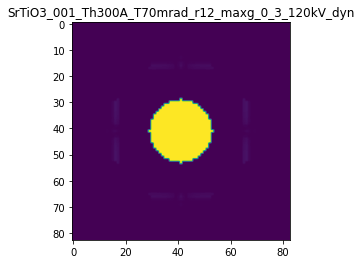

X_sim.max(): 0.9999987868883358
>>>replaced the 56. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 239ms/step - loss: 0.0205 - acc: 0.5400 - val_loss: 0.0072 - val_acc: 0.4500
Epoch 2/5
5/5 [==============================] - 1s 189ms/step - loss: 0.0205 - acc: 0.5400 - val_loss: 0.0070 - val_acc: 0.4500
Epoch 3/5
5/5 [==============================] - 1s 183ms/step - loss: 0.0205 - acc: 0.5300 - val_loss: 0.0073 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0205 - acc: 0.3100 - val_loss: 0.0073 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0206 - acc: 0.3100 - val_loss: 0.0070 - val_acc: 0.5500


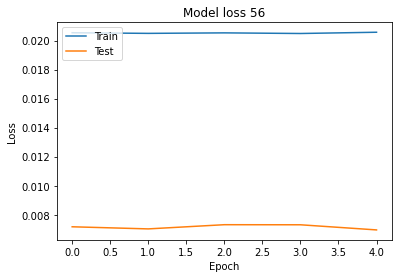

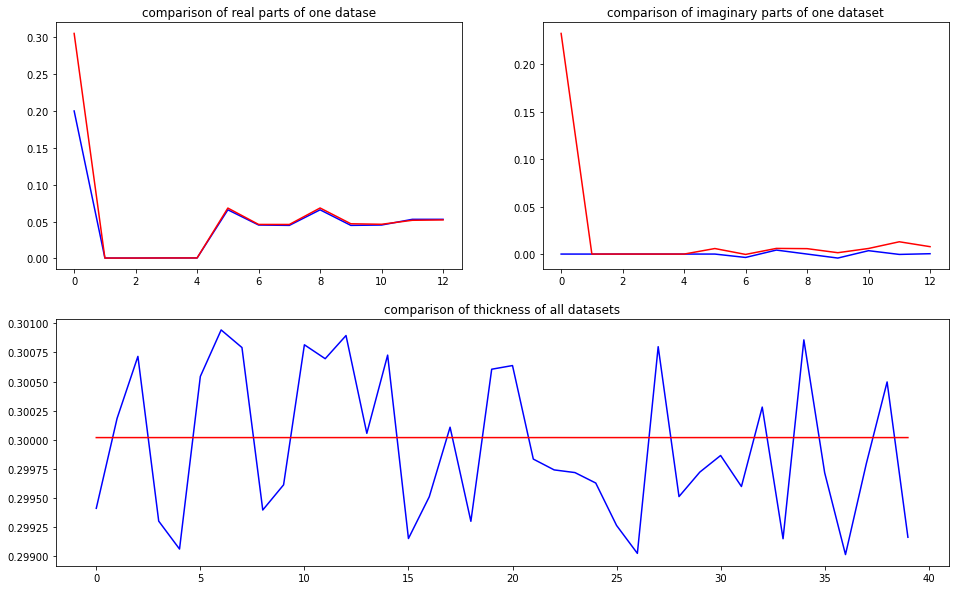

predicted thickness: 0.30001882


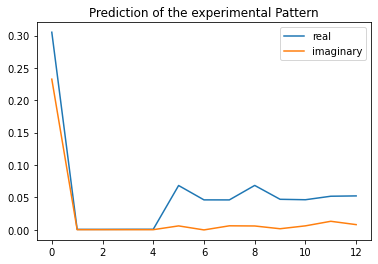

The offset applied on thickness: 0.0005863523111611828

The offset applied on Ug: -1.478907498598351

Applied shift of unit cell origin (fractional coordinates): -0.001138813072157064 8.750701958880219e-05
Ug[ 0 ]: 0.08737 0.0  =>  0.08737 0.0
Ug[ 1 ]: 0.00045 -0.01595  =>  0.00045 -0.0154
Ug[ 2 ]: 0.00045 0.01595  =>  0.00045 0.0154
Ug[ 3 ]: 0.00058 0.00716  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 -0.00716  =>  0.00058 0.0
Ug[ 5 ]: 0.06139 0.0011  =>  0.06139 -0.0
Ug[ 6 ]: 0.04311 -0.07214  =>  0.04311 -0.07984
Ug[ 7 ]: 0.04333 0.05304  =>  0.04333 0.05964
Ug[ 8 ]: 0.06139 -0.0011  =>  0.06139 0.0
Ug[ 9 ]: 0.04333 -0.05304  =>  0.04333 -0.05964
Ug[ 10 ]: 0.04311 0.07214  =>  0.04311 0.07984
Ug[ 11 ]: 0.04785 0.05313  =>  0.04785 0.06744
Ug[ 12 ]: 0.04785 -0.05313  =>  0.04785 -0.06744
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

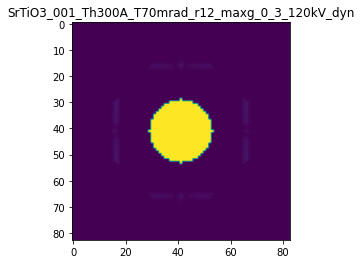

X_sim.max(): 0.9999982009524933
>>>replaced the 57. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 296ms/step - loss: 0.0205 - acc: 0.3300 - val_loss: 0.0068 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0205 - acc: 0.5400 - val_loss: 0.0071 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0206 - acc: 0.5400 - val_loss: 0.0068 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0205 - acc: 0.3200 - val_loss: 0.0068 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0205 - acc: 0.3100 - val_loss: 0.0068 - val_acc: 0.5250


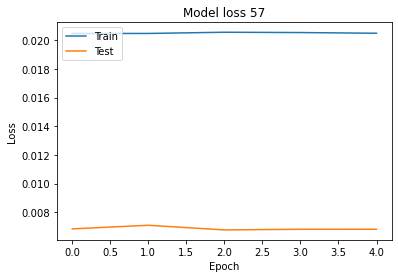

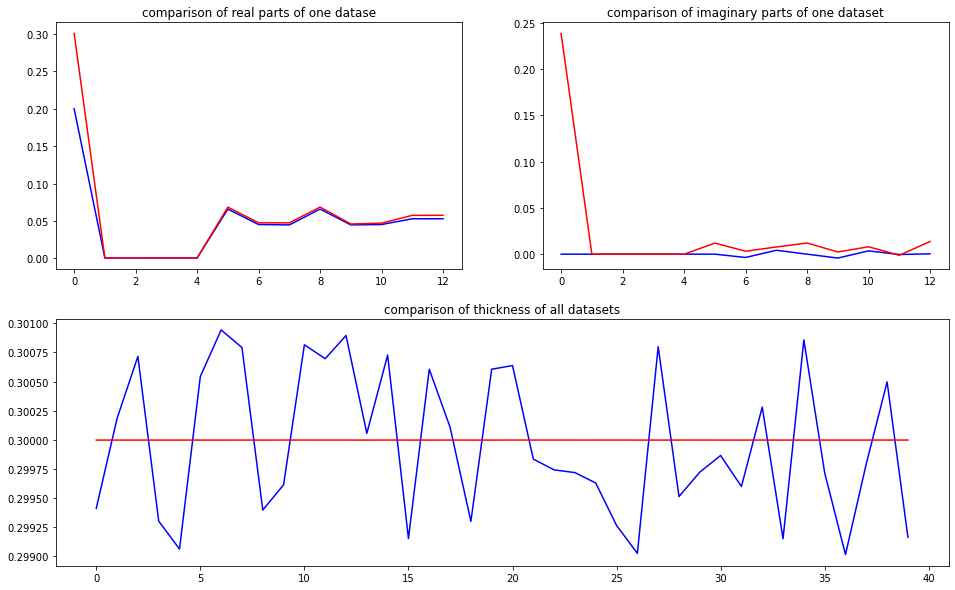

predicted thickness: 0.29999742


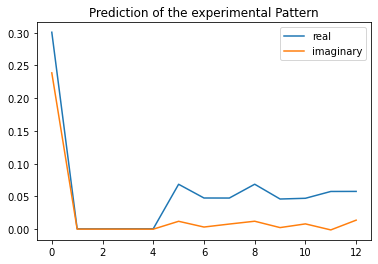

The offset applied on thickness: 0.00039515201276078284

The offset applied on Ug: -2.3995369442289722

Applied shift of unit cell origin (fractional coordinates): -0.010511781114172558 -6.007614332594729e-05
Ug[ 0 ]: 0.05301 3.14159  =>  0.05301 3.14159
Ug[ 1 ]: 0.00045 -0.01027  =>  0.00045 -0.01065
Ug[ 2 ]: 0.00045 0.01027  =>  0.00045 0.01065
Ug[ 3 ]: 0.00054 0.06605  =>  0.00054 -0.0
Ug[ 4 ]: 0.00054 -0.06605  =>  0.00054 0.0
Ug[ 5 ]: 0.05694 -0.00075  =>  0.05694 0.0
Ug[ 6 ]: 0.04194 -0.05686  =>  0.04194 -0.12253
Ug[ 7 ]: 0.0415 0.0612  =>  0.0415 0.12763
Ug[ 8 ]: 0.05694 0.00075  =>  0.05694 -0.0
Ug[ 9 ]: 0.0415 -0.0612  =>  0.0415 -0.12763
Ug[ 10 ]: 0.04194 0.05686  =>  0.04194 0.12253
Ug[ 11 ]: 0.04993 -0.14624  =>  0.04993 -0.01415
Ug[ 12 ]: 0.04993 0.14624  =>  0.04993 0.01415
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrT

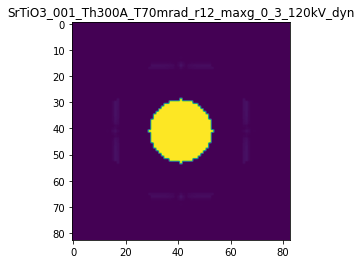

X_sim.max(): 0.9999981859867065
>>>replaced the 58. dataset and train: 
Epoch 1/5
5/5 [==============================] - 1s 235ms/step - loss: 0.0205 - acc: 0.3300 - val_loss: 0.0069 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0205 - acc: 0.3400 - val_loss: 0.0072 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0205 - acc: 0.5400 - val_loss: 0.0073 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 263ms/step - loss: 0.0206 - acc: 0.5400 - val_loss: 0.0069 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 306ms/step - loss: 0.0206 - acc: 0.5400 - val_loss: 0.0070 - val_acc: 0.4750


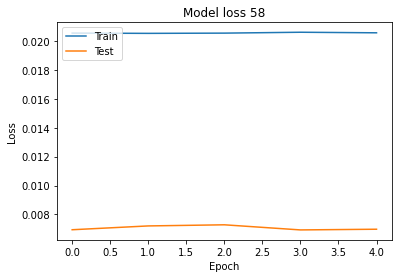

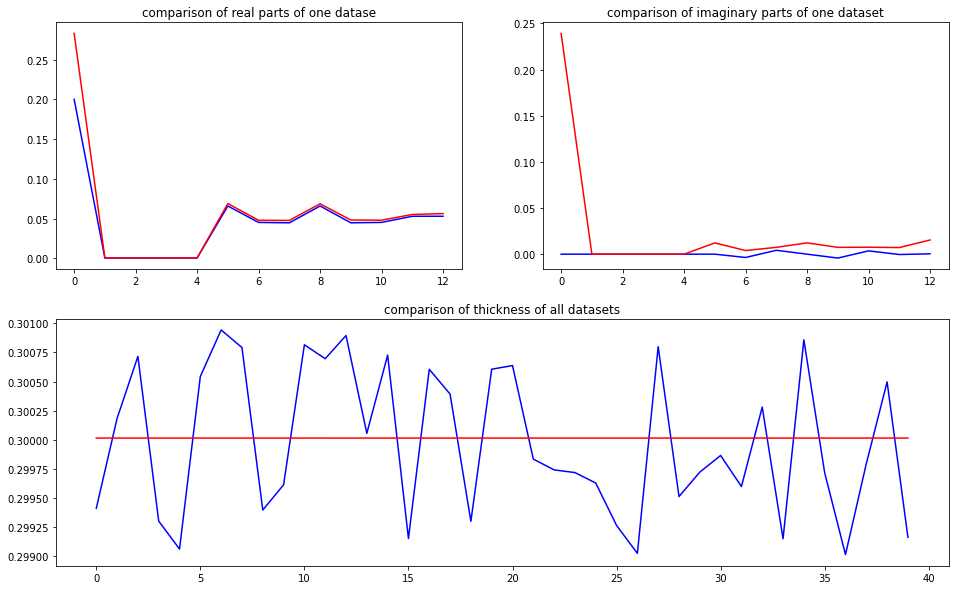

predicted thickness: 0.30001473


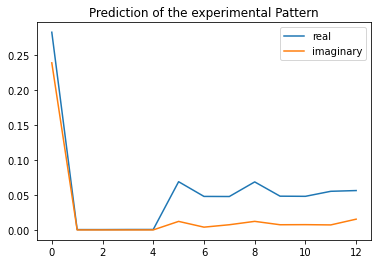

The offset applied on thickness: 0.00021017827637756948

The offset applied on Ug: 0.6984983127857645

Applied shift of unit cell origin (fractional coordinates): -0.00032971750021248215 -7.670877247075843e-06
Ug[ 0 ]: 0.37869 0.0  =>  0.37869 0.0
Ug[ 1 ]: 0.00046 -0.01237  =>  0.00046 -0.01242
Ug[ 2 ]: 0.00046 0.01237  =>  0.00046 0.01242
Ug[ 3 ]: 0.00059 0.00207  =>  0.00059 0.0
Ug[ 4 ]: 0.00059 -0.00207  =>  0.00059 0.0
Ug[ 5 ]: 0.07225 -0.0001  =>  0.07225 0.0
Ug[ 6 ]: 0.04966 -0.03647  =>  0.04966 -0.03849
Ug[ 7 ]: 0.04968 -0.00019  =>  0.04968 0.00193
Ug[ 8 ]: 0.07225 0.0001  =>  0.07225 0.0
Ug[ 9 ]: 0.04968 0.00019  =>  0.04968 -0.00193
Ug[ 10 ]: 0.04966 0.03647  =>  0.04966 0.03849
Ug[ 11 ]: 0.05821 -0.0727  =>  0.05821 -0.06856
Ug[ 12 ]: 0.05821 0.0727  =>  0.05821 0.06856
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

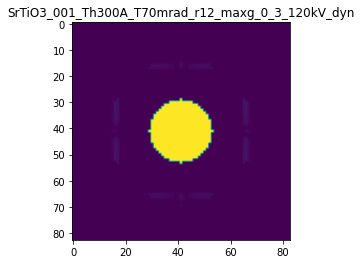

X_sim.max(): 0.9999986398847225
>>>replaced the 59. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 260ms/step - loss: 0.0181 - acc: 0.5400 - val_loss: 0.0064 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 217ms/step - loss: 0.0181 - acc: 0.4700 - val_loss: 0.0062 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 235ms/step - loss: 0.0181 - acc: 0.3200 - val_loss: 0.0061 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 1s 227ms/step - loss: 0.0181 - acc: 0.3600 - val_loss: 0.0059 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0181 - acc: 0.5400 - val_loss: 0.0059 - val_acc: 0.4750


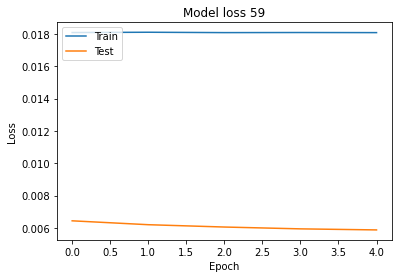

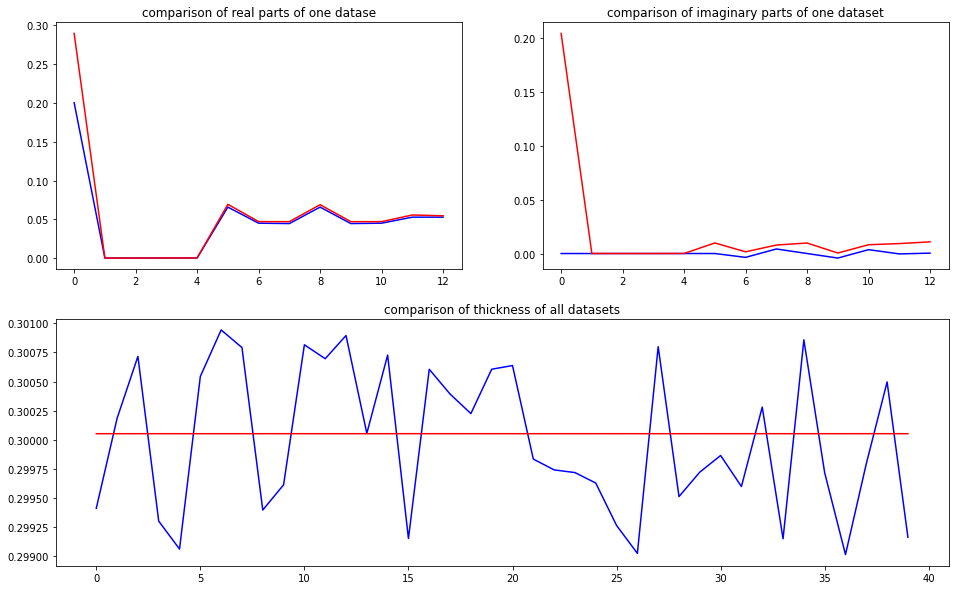

predicted thickness: 0.3000522


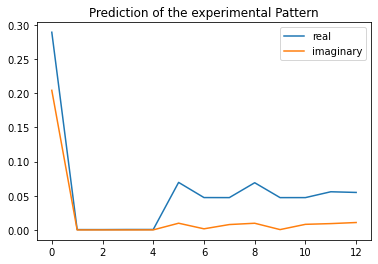

The offset applied on thickness: -0.0005478146377779265

The offset applied on Ug: -0.5322318768965028

Applied shift of unit cell origin (fractional coordinates): 0.0060393901212225844 1.4373381814926492e-05
Ug[ 0 ]: 0.22241 0.0  =>  0.22241 0.0
Ug[ 1 ]: 0.00046 -0.02615  =>  0.00046 -0.02605
Ug[ 2 ]: 0.00046 0.02615  =>  0.00046 0.02605
Ug[ 3 ]: 0.0006 -0.03795  =>  0.0006 0.0
Ug[ 4 ]: 0.0006 0.03795  =>  0.0006 0.0
Ug[ 5 ]: 0.06663 0.00018  =>  0.06663 -0.0
Ug[ 6 ]: 0.04617 -0.07074  =>  0.04617 -0.03288
Ug[ 7 ]: 0.04617 0.07961  =>  0.04617 0.04157
Ug[ 8 ]: 0.06663 -0.00018  =>  0.06663 0.0
Ug[ 9 ]: 0.04617 -0.07961  =>  0.04617 -0.04157
Ug[ 10 ]: 0.04617 0.07074  =>  0.04617 0.03288
Ug[ 11 ]: 0.05361 -0.01518  =>  0.05361 -0.09108
Ug[ 12 ]: 0.05361 0.01518  =>  0.05361 0.09108
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

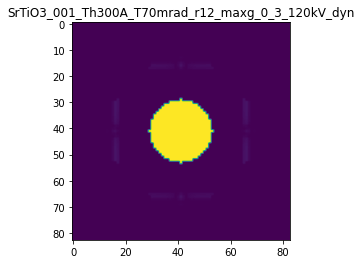

X_sim.max(): 0.9999982525867672
>>>replaced the 60. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 271ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0060 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0170 - acc: 0.3500 - val_loss: 0.0058 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0171 - acc: 0.4200 - val_loss: 0.0056 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 308ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0056 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 2s 358ms/step - loss: 0.0170 - acc: 0.5100 - val_loss: 0.0056 - val_acc: 0.4750


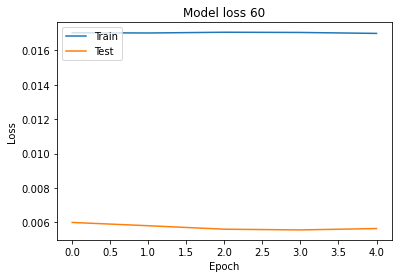

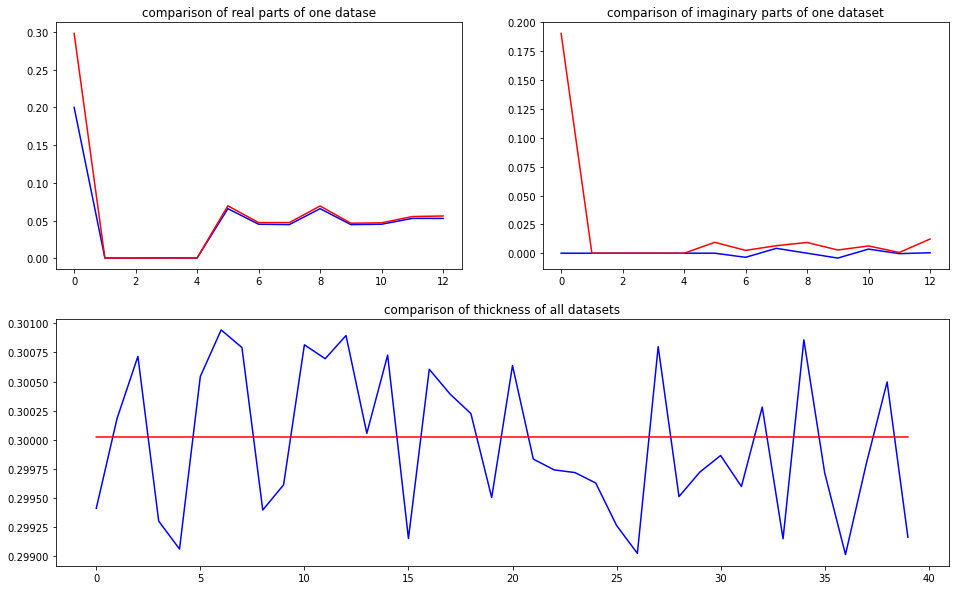

predicted thickness: 0.300024


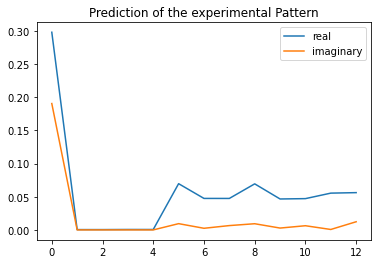

The offset applied on thickness: -0.00048462963275862017

The offset applied on Ug: -1.8986313119459122

Applied shift of unit cell origin (fractional coordinates): -0.0033151448504766187 4.4298261542019936e-05
Ug[ 0 ]: 0.06048 0.0  =>  0.06048 0.0
Ug[ 1 ]: 0.00047 -0.01143  =>  0.00047 -0.01115
Ug[ 2 ]: 0.00047 0.01143  =>  0.00047 0.01115
Ug[ 3 ]: 0.00062 0.02083  =>  0.00062 -0.0
Ug[ 4 ]: 0.00062 -0.02083  =>  0.00062 0.0
Ug[ 5 ]: 0.0602 0.00056  =>  0.0602 0.0
Ug[ 6 ]: 0.04306 -0.0446  =>  0.04306 -0.06571
Ug[ 7 ]: 0.04282 0.0417  =>  0.04282 0.06225
Ug[ 8 ]: 0.0602 -0.00056  =>  0.0602 0.0
Ug[ 9 ]: 0.04282 -0.0417  =>  0.04282 -0.06225
Ug[ 10 ]: 0.04306 0.0446  =>  0.04306 0.06571
Ug[ 11 ]: 0.05007 -0.11309  =>  0.05007 -0.07143
Ug[ 12 ]: 0.05007 0.11309  =>  0.05007 0.07143
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

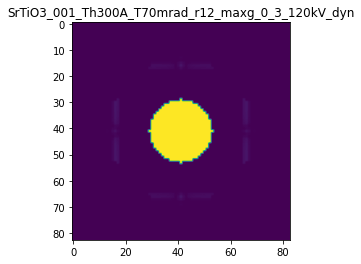

X_sim.max(): 0.9999978373291403
>>>replaced the 61. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 254ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0056 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0058 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0057 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0170 - acc: 0.5500 - val_loss: 0.0057 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 1s 179ms/step - loss: 0.0170 - acc: 0.4000 - val_loss: 0.0057 - val_acc: 0.5000


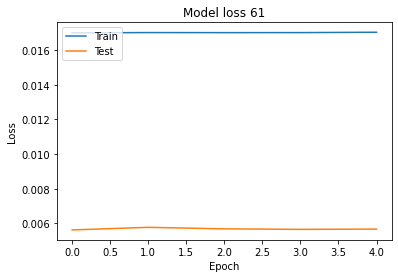

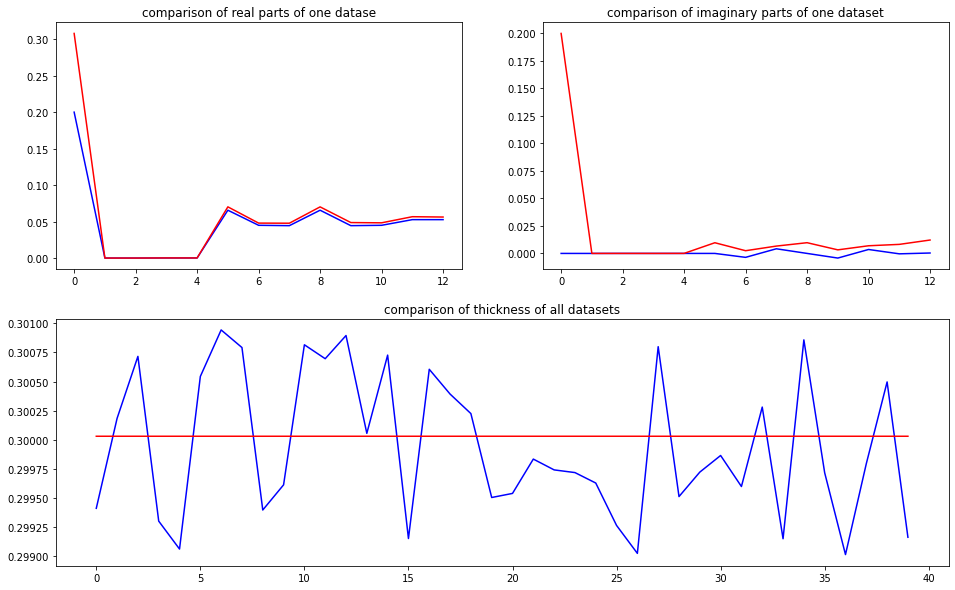

predicted thickness: 0.30003047


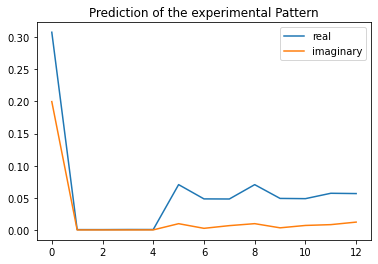

The offset applied on thickness: -8.955878840730369e-05

The offset applied on Ug: 2.0801087283085757

Applied shift of unit cell origin (fractional coordinates): 0.004131608331266649 -1.0893176232885445e-05
Ug[ 0 ]: 0.58765 0.0  =>  0.58765 0.0
Ug[ 1 ]: 0.00047 -0.01344  =>  0.00047 -0.01351
Ug[ 2 ]: 0.00047 0.01344  =>  0.00047 0.01351
Ug[ 3 ]: 0.00061 -0.02596  =>  0.00061 0.0
Ug[ 4 ]: 0.00061 0.02596  =>  0.00061 0.0
Ug[ 5 ]: 0.08101 -0.00014  =>  0.08101 0.0
Ug[ 6 ]: 0.05346 -0.04396  =>  0.05346 -0.01793
Ug[ 7 ]: 0.05356 0.03056  =>  0.05356 0.00467
Ug[ 8 ]: 0.08101 0.00014  =>  0.08101 0.0
Ug[ 9 ]: 0.05356 -0.03056  =>  0.05356 -0.00467
Ug[ 10 ]: 0.05346 0.04396  =>  0.05346 0.01793
Ug[ 11 ]: 0.06377 -0.03139  =>  0.06377 -0.08331
Ug[ 12 ]: 0.06377 0.03139  =>  0.06377 0.08331
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

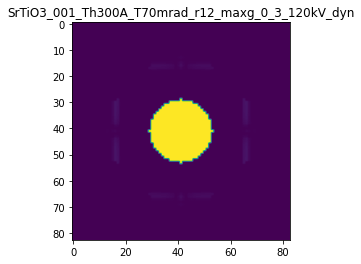

X_sim.max(): 0.9999987880460546
>>>replaced the 62. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 254ms/step - loss: 0.0160 - acc: 0.3300 - val_loss: 0.0056 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0160 - acc: 0.3300 - val_loss: 0.0053 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0160 - acc: 0.5400 - val_loss: 0.0053 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0160 - acc: 0.5500 - val_loss: 0.0052 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 1s 308ms/step - loss: 0.0160 - acc: 0.5500 - val_loss: 0.0054 - val_acc: 0.5000


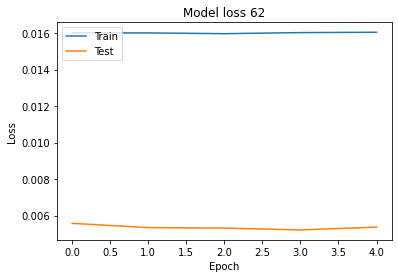

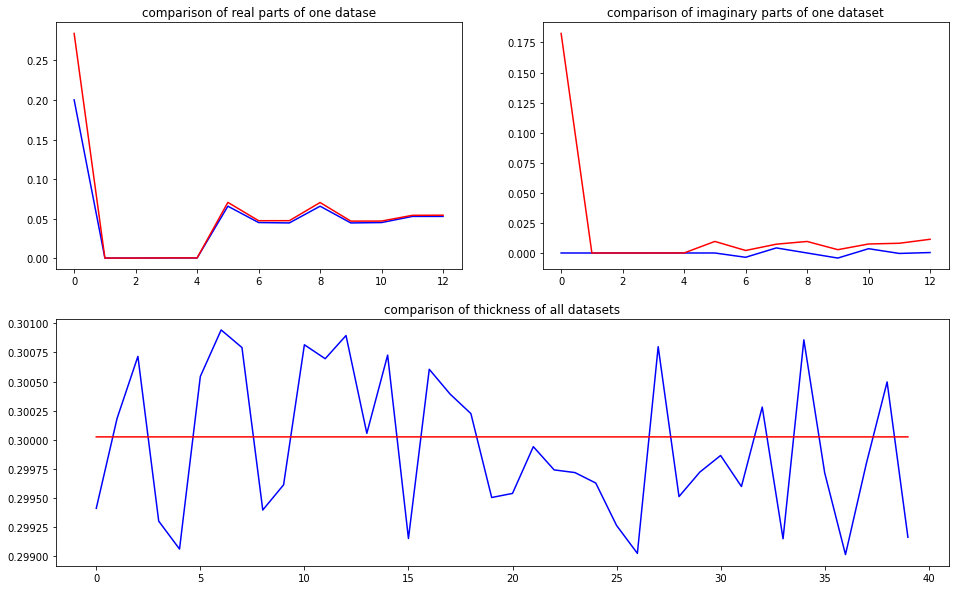

predicted thickness: 0.30002484


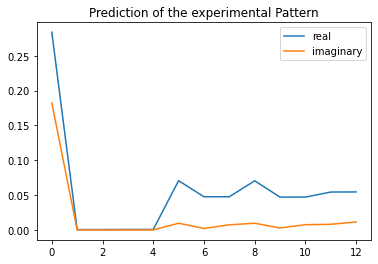

The offset applied on thickness: 0.0004797009783518427

The offset applied on Ug: 2.571711076744996

Applied shift of unit cell origin (fractional coordinates): 0.005100977674130705 6.175121590632193e-05
Ug[ 0 ]: 0.57681 0.0  =>  0.57681 0.0
Ug[ 1 ]: 0.00047 -0.00461  =>  0.00047 -0.00422
Ug[ 2 ]: 0.00047 0.00461  =>  0.00047 0.00422
Ug[ 3 ]: 0.00063 -0.03205  =>  0.00063 0.0
Ug[ 4 ]: 0.00063 0.03205  =>  0.00063 -0.0
Ug[ 5 ]: 0.08369 0.00078  =>  0.08369 -0.0
Ug[ 6 ]: 0.05329 -0.05082  =>  0.05329 -0.01916
Ug[ 7 ]: 0.05325 0.04608  =>  0.05325 0.01364
Ug[ 8 ]: 0.08369 -0.00078  =>  0.08369 0.0
Ug[ 9 ]: 0.05325 -0.04608  =>  0.05325 -0.01364
Ug[ 10 ]: 0.05329 0.05082  =>  0.05329 0.01916
Ug[ 11 ]: 0.06238 -0.02878  =>  0.06238 -0.09288
Ug[ 12 ]: 0.06238 0.02878  =>  0.06238 0.09288
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

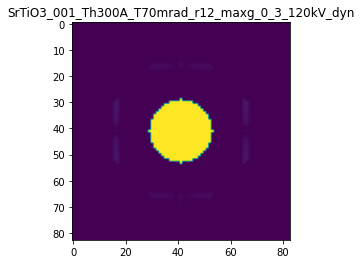

X_sim.max(): 0.9999987400655375
>>>replaced the 63. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 271ms/step - loss: 0.0160 - acc: 0.3100 - val_loss: 0.0052 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0160 - acc: 0.3400 - val_loss: 0.0052 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 211ms/step - loss: 0.0160 - acc: 0.4400 - val_loss: 0.0051 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0160 - acc: 0.5300 - val_loss: 0.0053 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0160 - acc: 0.3400 - val_loss: 0.0053 - val_acc: 0.5000


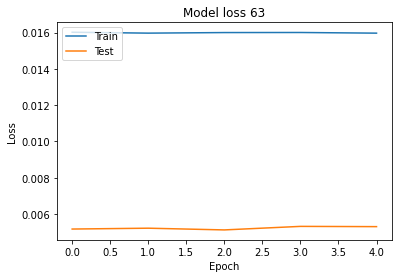

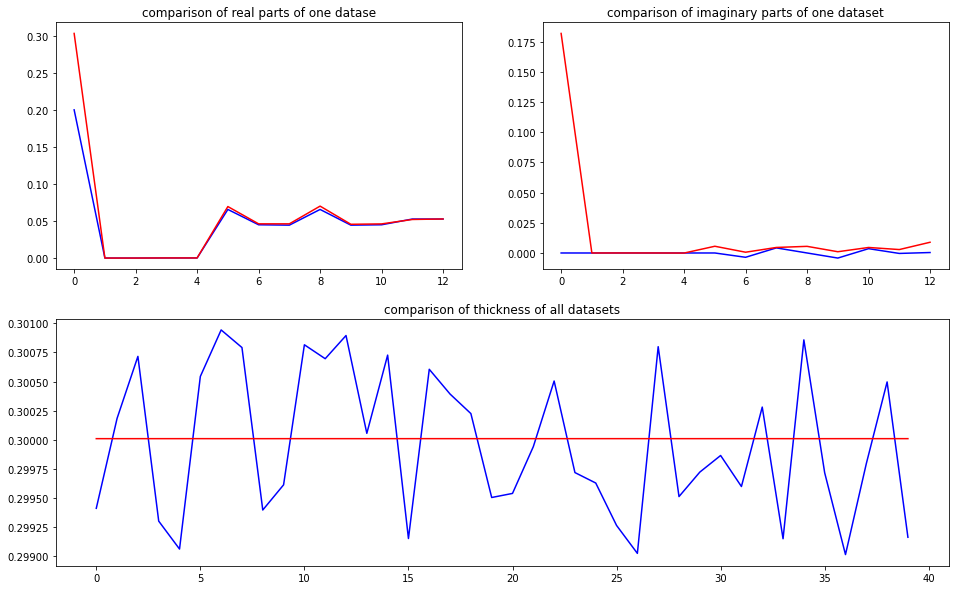

predicted thickness: 0.3000096


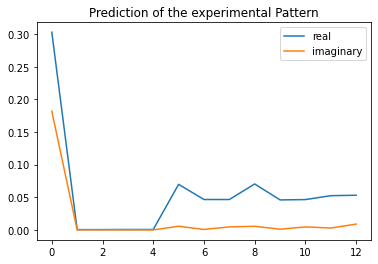

The offset applied on thickness: 0.0009006032376474867

The offset applied on Ug: -2.361527934914037

Applied shift of unit cell origin (fractional coordinates): -0.008294190949068551 0.00012629669458340032
Ug[ 0 ]: 0.00801 0.0  =>  0.00801 0.0
Ug[ 1 ]: 0.00045 -0.01598  =>  0.00045 -0.01518
Ug[ 2 ]: 0.00045 0.01598  =>  0.00045 0.01518
Ug[ 3 ]: 0.0006 0.05211  =>  0.0006 0.0
Ug[ 4 ]: 0.0006 -0.05211  =>  0.0006 0.0
Ug[ 5 ]: 0.05842 0.00159  =>  0.05842 0.0
Ug[ 6 ]: 0.04141 -0.04722  =>  0.04141 -0.10012
Ug[ 7 ]: 0.04119 0.04146  =>  0.04119 0.09278
Ug[ 8 ]: 0.05842 -0.00159  =>  0.05842 -0.0
Ug[ 9 ]: 0.04119 -0.04146  =>  0.04119 -0.09278
Ug[ 10 ]: 0.04141 0.04722  =>  0.04141 0.10012
Ug[ 11 ]: 0.04616 -0.06292  =>  0.04616 0.0413
Ug[ 12 ]: 0.04616 0.06292  =>  0.04616 -0.0413
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th3

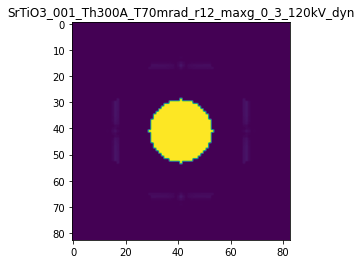

X_sim.max(): 0.9999979071980335
>>>replaced the 64. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 249ms/step - loss: 0.0133 - acc: 0.3400 - val_loss: 0.0048 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0133 - acc: 0.5500 - val_loss: 0.0047 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 300ms/step - loss: 0.0133 - acc: 0.5500 - val_loss: 0.0045 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 1s 301ms/step - loss: 0.0133 - acc: 0.5100 - val_loss: 0.0044 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 306ms/step - loss: 0.0133 - acc: 0.5000 - val_loss: 0.0044 - val_acc: 0.5250


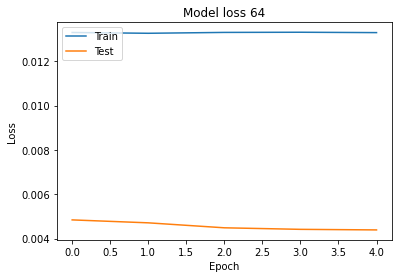

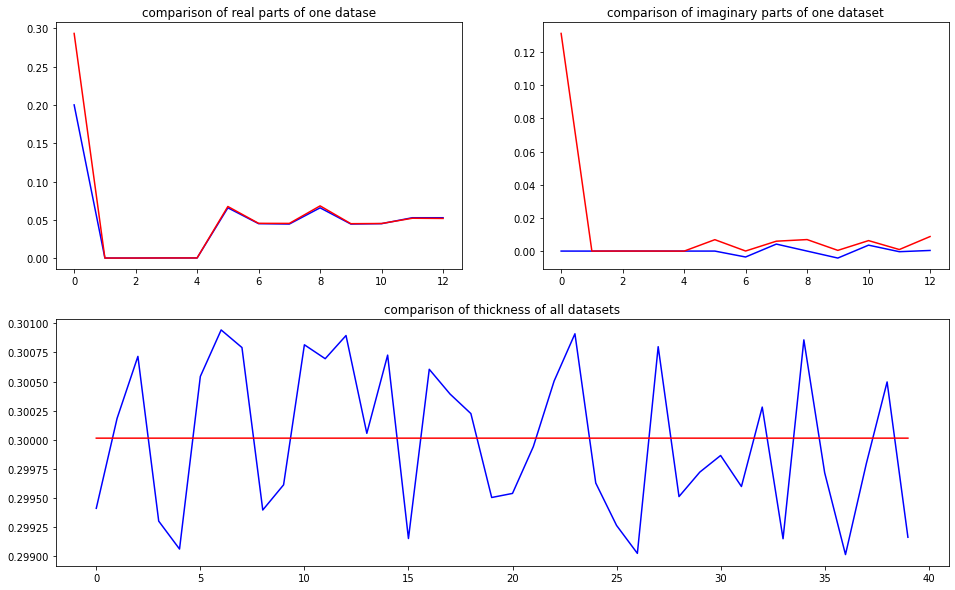

predicted thickness: 0.30001408


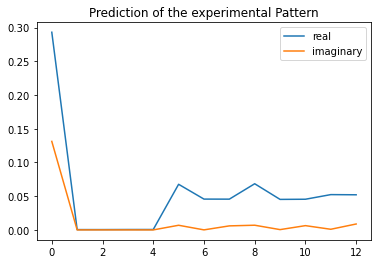

The offset applied on thickness: -0.00039057219798992594

The offset applied on Ug: -0.5795780025472761

Applied shift of unit cell origin (fractional coordinates): -0.0043379136174762686 -4.814993251219326e-06
Ug[ 0 ]: 0.23336 0.0  =>  0.23336 0.0
Ug[ 1 ]: 0.00045 -0.02294  =>  0.00045 -0.02297
Ug[ 2 ]: 0.00045 0.02294  =>  0.00045 0.02297
Ug[ 3 ]: 0.00058 0.02726  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 -0.02726  =>  0.00058 -0.0
Ug[ 5 ]: 0.06534 -6e-05  =>  0.06534 -0.0
Ug[ 6 ]: 0.04447 -0.07054  =>  0.04447 -0.09777
Ug[ 7 ]: 0.0443 0.0621  =>  0.0443 0.08938
Ug[ 8 ]: 0.06534 6e-05  =>  0.06534 0.0
Ug[ 9 ]: 0.0443 -0.0621  =>  0.0443 -0.08938
Ug[ 10 ]: 0.04447 0.07054  =>  0.04447 0.09777
Ug[ 11 ]: 0.05076 -0.07694  =>  0.05076 -0.02243
Ug[ 12 ]: 0.05076 0.07694  =>  0.05076 0.02243
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

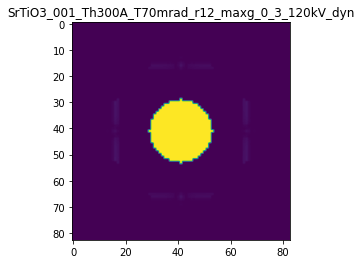

X_sim.max(): 0.9999982064649616
>>>replaced the 65. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 267ms/step - loss: 0.0133 - acc: 0.5500 - val_loss: 0.0043 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 1s 289ms/step - loss: 0.0133 - acc: 0.5500 - val_loss: 0.0043 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 1s 260ms/step - loss: 0.0133 - acc: 0.3400 - val_loss: 0.0045 - val_acc: 0.4500
Epoch 4/5
5/5 [==============================] - 1s 231ms/step - loss: 0.0133 - acc: 0.4100 - val_loss: 0.0045 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0133 - acc: 0.5500 - val_loss: 0.0042 - val_acc: 0.5500


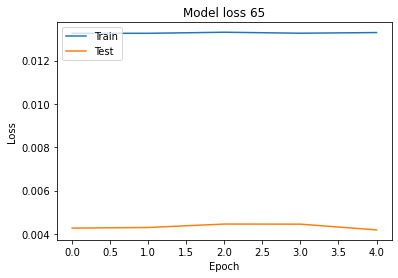

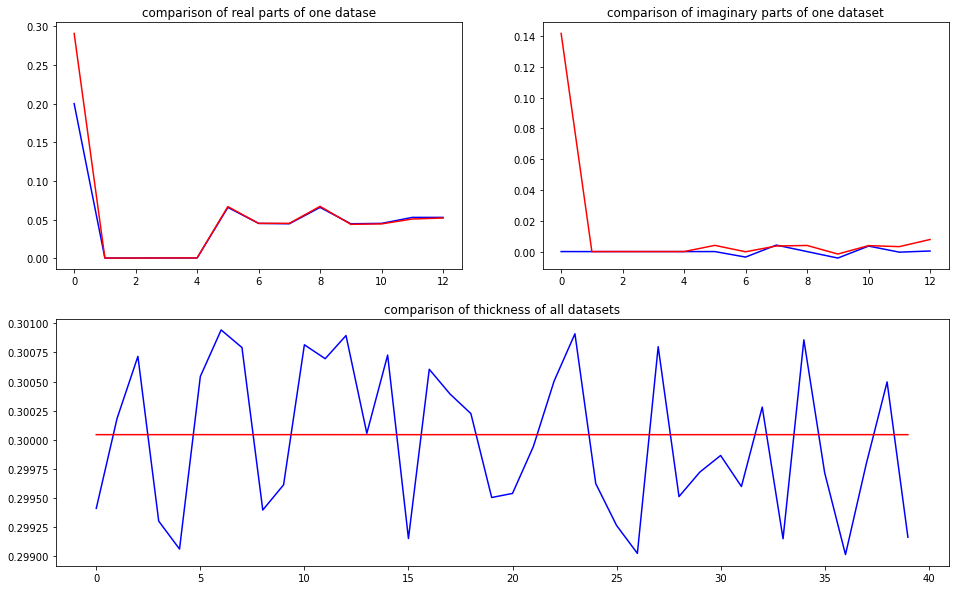

predicted thickness: 0.3000438


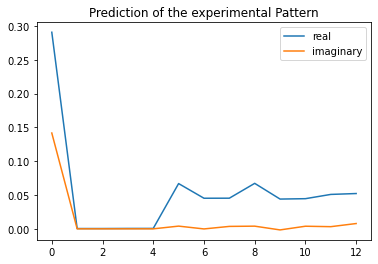

The offset applied on thickness: 0.00030605040521153673

The offset applied on Ug: -1.6006400935564948

Applied shift of unit cell origin (fractional coordinates): 0.00029358470791554693 7.230118527650675e-05
Ug[ 0 ]: 0.12328 0.0  =>  0.12328 0.0
Ug[ 1 ]: 0.00045 -0.0002  =>  0.00045 0.00025
Ug[ 2 ]: 0.00045 0.0002  =>  0.00045 -0.00025
Ug[ 3 ]: 0.00061 -0.00184  =>  0.00061 0.0
Ug[ 4 ]: 0.00061 0.00184  =>  0.00061 0.0
Ug[ 5 ]: 0.05989 0.00091  =>  0.05989 0.0
Ug[ 6 ]: 0.04175 -0.04861  =>  0.04175 -0.04722
Ug[ 7 ]: 0.04156 0.0607  =>  0.04156 0.0584
Ug[ 8 ]: 0.05989 -0.00091  =>  0.05989 0.0
Ug[ 9 ]: 0.04156 -0.0607  =>  0.04156 -0.0584
Ug[ 10 ]: 0.04175 0.04861  =>  0.04175 0.04722
Ug[ 11 ]: 0.04731 -0.04658  =>  0.04731 -0.05027
Ug[ 12 ]: 0.04731 0.04658  =>  0.04731 0.05027
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

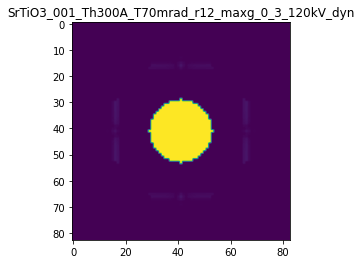

X_sim.max(): 0.9999978660537923
>>>replaced the 66. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 373ms/step - loss: 0.0132 - acc: 0.5500 - val_loss: 0.0042 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0132 - acc: 0.5500 - val_loss: 0.0042 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0132 - acc: 0.2900 - val_loss: 0.0042 - val_acc: 0.4250
Epoch 4/5
5/5 [==============================] - 1s 230ms/step - loss: 0.0132 - acc: 0.3400 - val_loss: 0.0044 - val_acc: 0.4250
Epoch 5/5
5/5 [==============================] - 2s 319ms/step - loss: 0.0132 - acc: 0.3400 - val_loss: 0.0044 - val_acc: 0.5750


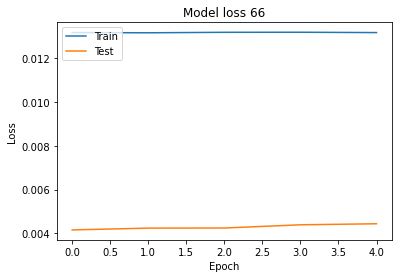

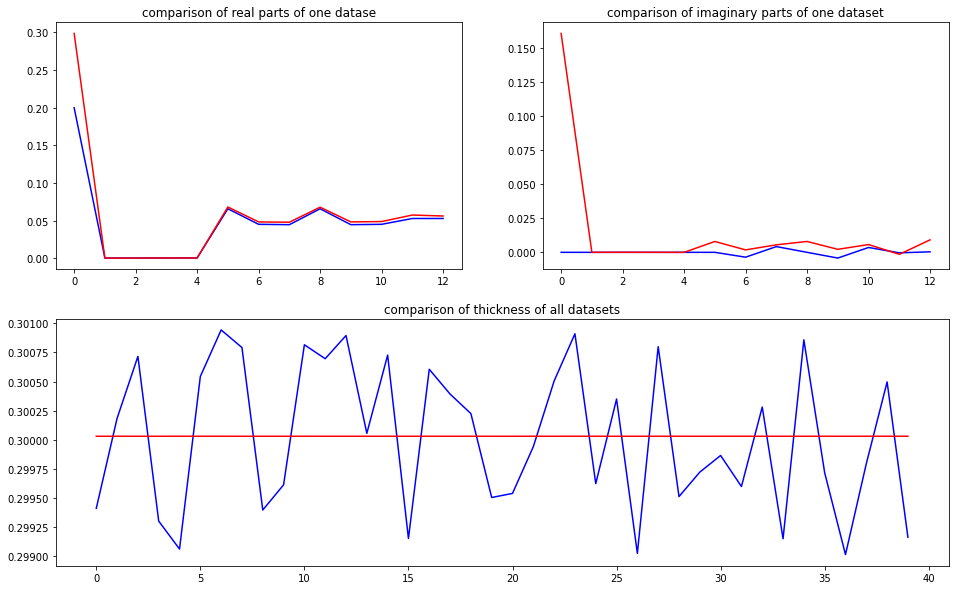

predicted thickness: 0.30003026


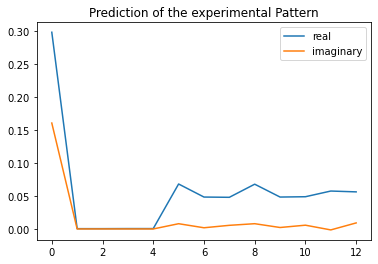

The offset applied on thickness: -5.916642541752415e-05

The offset applied on Ug: 0.5673238295969454

Applied shift of unit cell origin (fractional coordinates): -0.0016982618112950155 3.2367830636527987e-06
Ug[ 0 ]: 0.36407 0.0  =>  0.36407 0.0
Ug[ 1 ]: 0.00046 -0.02347  =>  0.00046 -0.02345
Ug[ 2 ]: 0.00046 0.02347  =>  0.00046 0.02345
Ug[ 3 ]: 0.00057 0.01067  =>  0.00057 -0.0
Ug[ 4 ]: 0.00057 -0.01067  =>  0.00057 0.0
Ug[ 5 ]: 0.0708 4e-05  =>  0.0708 -0.0
Ug[ 6 ]: 0.05009 -0.03955  =>  0.05009 -0.05025
Ug[ 7 ]: 0.04961 0.03322  =>  0.04961 0.04387
Ug[ 8 ]: 0.0708 -4e-05  =>  0.0708 0.0
Ug[ 9 ]: 0.04961 -0.03322  =>  0.04961 -0.04387
Ug[ 10 ]: 0.05009 0.03955  =>  0.05009 0.05025
Ug[ 11 ]: 0.05905 -0.08978  =>  0.05905 -0.06844
Ug[ 12 ]: 0.05905 0.08978  =>  0.05905 0.06844
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

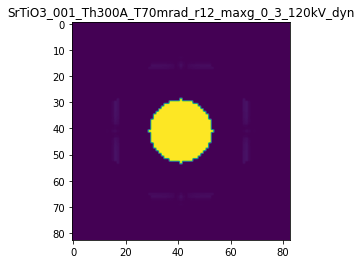

X_sim.max(): 0.9999987115731036
>>>replaced the 67. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 239ms/step - loss: 0.0131 - acc: 0.5400 - val_loss: 0.0041 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 1s 209ms/step - loss: 0.0131 - acc: 0.5400 - val_loss: 0.0040 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0130 - acc: 0.4000 - val_loss: 0.0041 - val_acc: 0.4250
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0131 - acc: 0.3500 - val_loss: 0.0041 - val_acc: 0.4250
Epoch 5/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0130 - acc: 0.3500 - val_loss: 0.0040 - val_acc: 0.4250


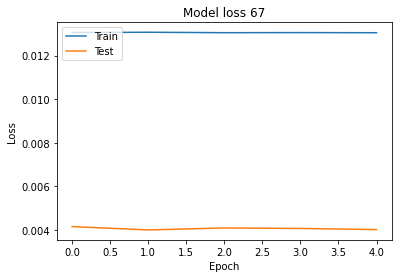

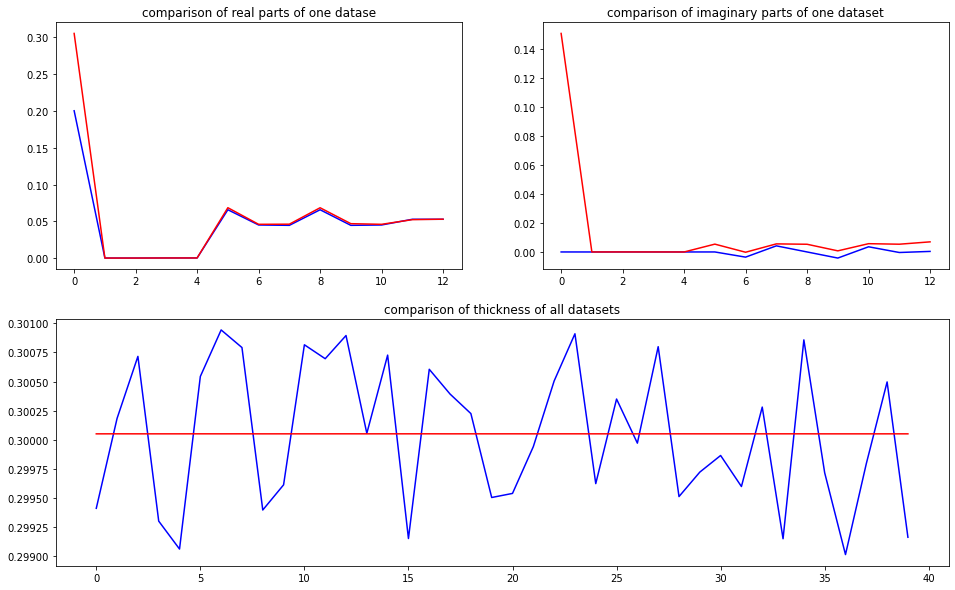

predicted thickness: 0.30005097


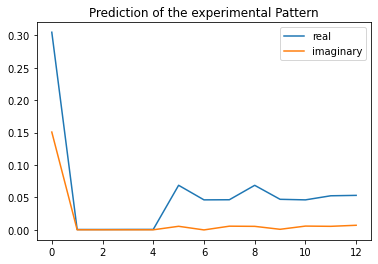

The offset applied on thickness: 0.0007796110681144835

The offset applied on Ug: 1.2230878450431515

Applied shift of unit cell origin (fractional coordinates): -0.0022124895295358997 5.510864361131018e-05
Ug[ 0 ]: 0.44627 0.0  =>  0.44627 0.0
Ug[ 1 ]: 0.00045 -0.00702  =>  0.00045 -0.00668
Ug[ 2 ]: 0.00045 0.00702  =>  0.00045 0.00668
Ug[ 3 ]: 0.00056 0.0139  =>  0.00056 0.0
Ug[ 4 ]: 0.00056 -0.0139  =>  0.00056 0.0
Ug[ 5 ]: 0.07444 0.00069  =>  0.07444 0.0
Ug[ 6 ]: 0.04889 -0.06086  =>  0.04889 -0.07511
Ug[ 7 ]: 0.04944 0.04813  =>  0.04944 0.06169
Ug[ 8 ]: 0.07444 -0.00069  =>  0.07444 -0.0
Ug[ 9 ]: 0.04944 -0.04813  =>  0.04944 -0.06169
Ug[ 10 ]: 0.04889 0.06086  =>  0.04889 0.07511
Ug[ 11 ]: 0.05626 -0.01551  =>  0.05626 0.01229
Ug[ 12 ]: 0.05626 0.01551  =>  0.05626 -0.01229
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

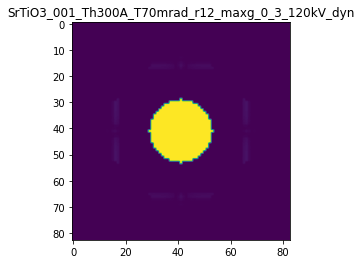

X_sim.max(): 0.9999987601374766
>>>replaced the 68. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 254ms/step - loss: 0.0130 - acc: 0.4300 - val_loss: 0.0038 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0130 - acc: 0.5400 - val_loss: 0.0038 - val_acc: 0.4500
Epoch 3/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0130 - acc: 0.4400 - val_loss: 0.0038 - val_acc: 0.4500
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0130 - acc: 0.3600 - val_loss: 0.0039 - val_acc: 0.4500
Epoch 5/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0130 - acc: 0.3600 - val_loss: 0.0039 - val_acc: 0.4500


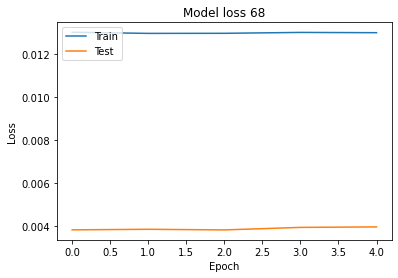

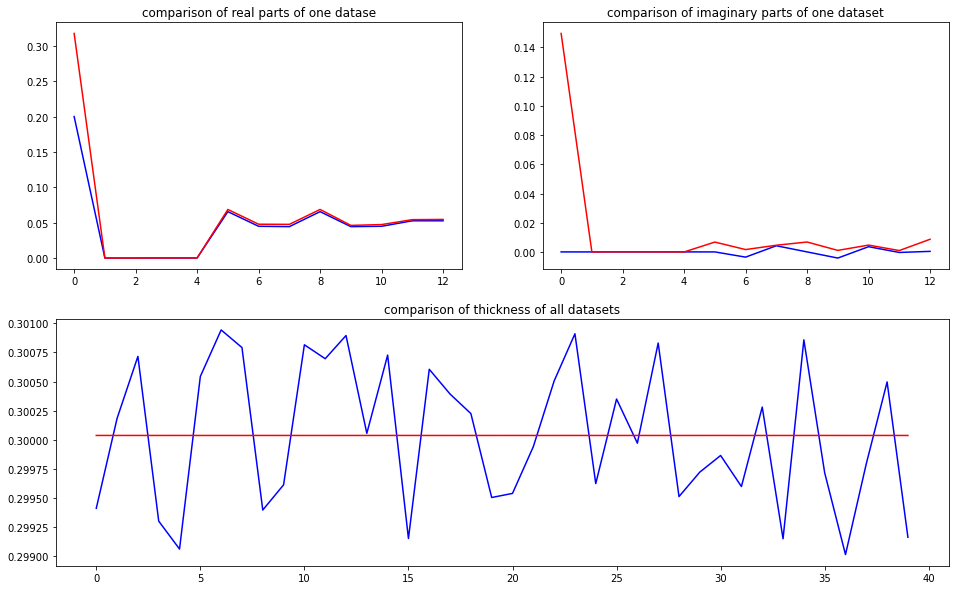

predicted thickness: 0.30003715


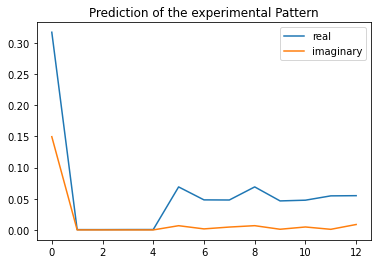

The offset applied on thickness: 0.0009358494167900988

The offset applied on Ug: -1.472598142951867

Applied shift of unit cell origin (fractional coordinates): -0.004454074633422682 -2.2764164808511975e-05
Ug[ 0 ]: 0.13607 0.0  =>  0.13607 0.0
Ug[ 1 ]: 0.00046 -0.00787  =>  0.00046 -0.00802
Ug[ 2 ]: 0.00046 0.00787  =>  0.00046 0.00802
Ug[ 3 ]: 0.00057 0.02799  =>  0.00057 -0.0
Ug[ 4 ]: 0.00057 -0.02799  =>  0.00057 0.0
Ug[ 5 ]: 0.06192 -0.00029  =>  0.06192 0.0
Ug[ 6 ]: 0.04456 -0.03476  =>  0.04456 -0.0626
Ug[ 7 ]: 0.04398 0.03799  =>  0.04398 0.06612
Ug[ 8 ]: 0.06192 0.00029  =>  0.06192 0.0
Ug[ 9 ]: 0.04398 -0.03799  =>  0.04398 -0.06612
Ug[ 10 ]: 0.04456 0.03476  =>  0.04456 0.0626
Ug[ 11 ]: 0.05045 -0.07539  =>  0.05045 -0.01942
Ug[ 12 ]: 0.05045 0.07539  =>  0.05045 0.01942
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

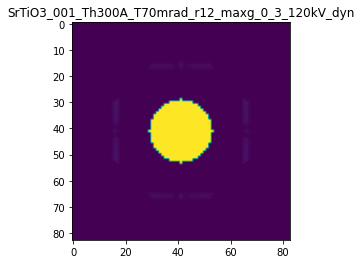

X_sim.max(): 0.9999983656630232
>>>replaced the 69. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 255ms/step - loss: 0.0130 - acc: 0.3600 - val_loss: 0.0039 - val_acc: 0.4500
Epoch 2/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0130 - acc: 0.4300 - val_loss: 0.0038 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0130 - acc: 0.5500 - val_loss: 0.0037 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0130 - acc: 0.5500 - val_loss: 0.0037 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0130 - acc: 0.3900 - val_loss: 0.0038 - val_acc: 0.4500


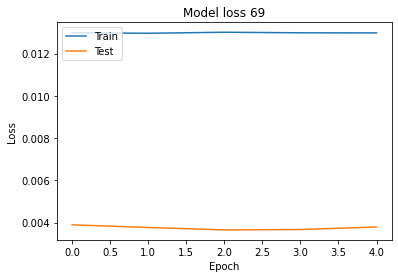

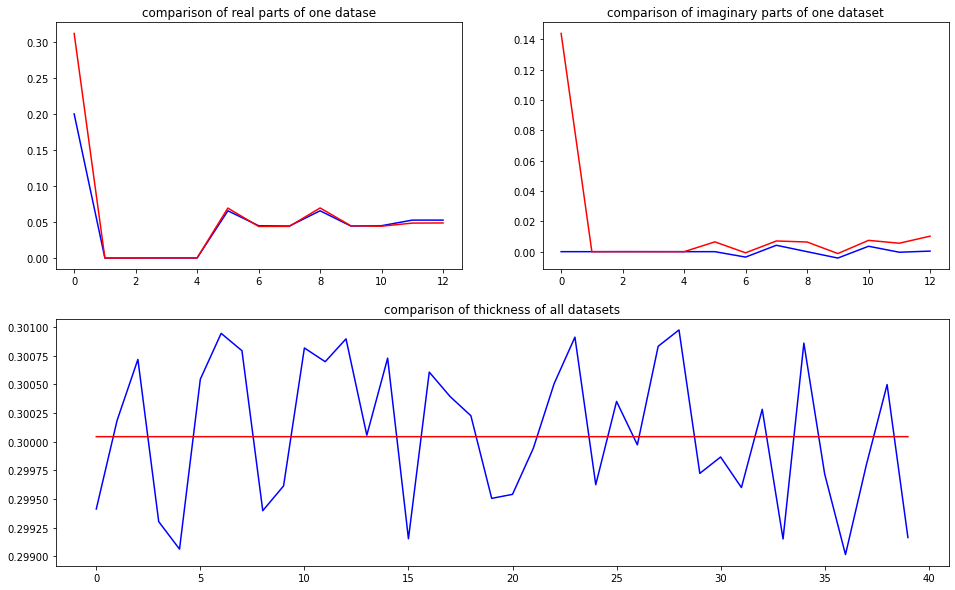

predicted thickness: 0.3000424


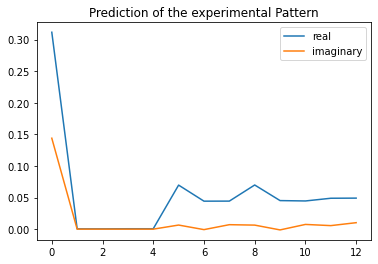

The offset applied on thickness: -0.0002978719102190277

The offset applied on Ug: 0.8997045641852183

Applied shift of unit cell origin (fractional coordinates): -0.0023487976850237726 3.4032042727545455e-05
Ug[ 0 ]: 0.41743 0.0  =>  0.41743 0.0
Ug[ 1 ]: 0.00045 -0.033  =>  0.00045 -0.03279
Ug[ 2 ]: 0.00045 0.033  =>  0.00045 0.03279
Ug[ 3 ]: 0.00063 0.01476  =>  0.00063 0.0
Ug[ 4 ]: 0.00063 -0.01476  =>  0.00063 -0.0
Ug[ 5 ]: 0.07417 0.00043  =>  0.07417 -0.0
Ug[ 6 ]: 0.0464 -0.0895  =>  0.0464 -0.10447
Ug[ 7 ]: 0.04676 0.08836  =>  0.04676 0.1029
Ug[ 8 ]: 0.07417 -0.00043  =>  0.07417 0.0
Ug[ 9 ]: 0.04676 -0.08836  =>  0.04676 -0.1029
Ug[ 10 ]: 0.0464 0.0895  =>  0.0464 0.10447
Ug[ 11 ]: 0.05124 -0.04626  =>  0.05124 -0.01675
Ug[ 12 ]: 0.05124 0.04626  =>  0.05124 0.01675
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A

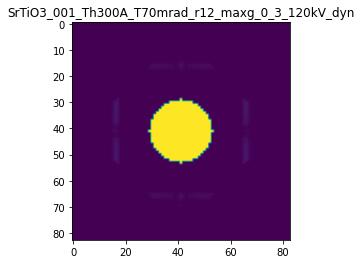

X_sim.max(): 0.9999982013878931
>>>replaced the 70. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 238ms/step - loss: 0.0130 - acc: 0.3700 - val_loss: 0.0038 - val_acc: 0.4500
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0130 - acc: 0.3700 - val_loss: 0.0038 - val_acc: 0.4500
Epoch 3/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0130 - acc: 0.3700 - val_loss: 0.0037 - val_acc: 0.4500
Epoch 4/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0130 - acc: 0.3900 - val_loss: 0.0037 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0130 - acc: 0.4900 - val_loss: 0.0038 - val_acc: 0.4500


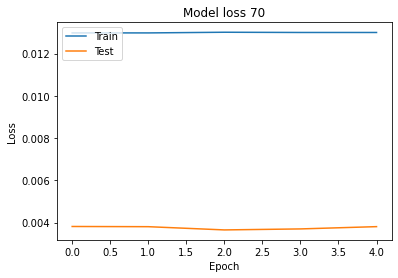

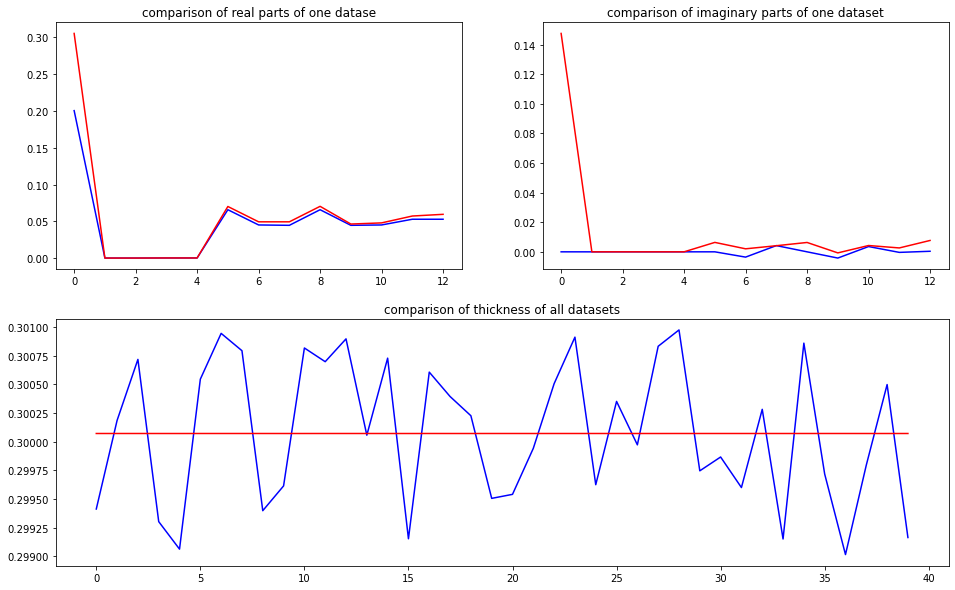

predicted thickness: 0.30007014


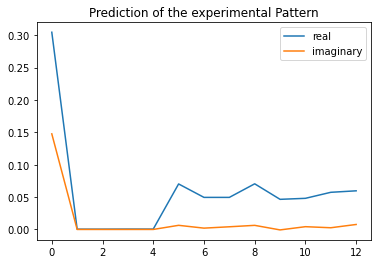

The offset applied on thickness: 7.6082624962128255e-06

The offset applied on Ug: 1.2295813206980506

Applied shift of unit cell origin (fractional coordinates): 0.0013572547592487752 9.879754617970696e-08
Ug[ 0 ]: 0.44538 0.0  =>  0.44538 0.0
Ug[ 1 ]: 0.00047 0.00244  =>  0.00047 0.00244
Ug[ 2 ]: 0.00047 -0.00244  =>  0.00047 -0.00244
Ug[ 3 ]: 0.00058 -0.00853  =>  0.00058 0.0
Ug[ 4 ]: 0.00058 0.00853  =>  0.00058 0.0
Ug[ 5 ]: 0.07651 0.0  =>  0.07651 0.0
Ug[ 6 ]: 0.05174 -0.01979  =>  0.05174 -0.01126
Ug[ 7 ]: 0.05093 0.05196  =>  0.05093 0.04343
Ug[ 8 ]: 0.07651 -0.0  =>  0.07651 -0.0
Ug[ 9 ]: 0.05093 -0.05196  =>  0.05093 -0.04343
Ug[ 10 ]: 0.05174 0.01979  =>  0.05174 0.01126
Ug[ 11 ]: 0.06283 -0.04407  =>  0.06283 -0.06113
Ug[ 12 ]: 0.06283 0.04407  =>  0.06283 0.06113
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

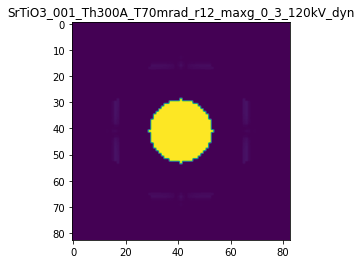

X_sim.max(): 0.9999987844814902
>>>replaced the 71. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 258ms/step - loss: 0.0130 - acc: 0.3800 - val_loss: 0.0038 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0130 - acc: 0.3800 - val_loss: 0.0037 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 297ms/step - loss: 0.0130 - acc: 0.3800 - val_loss: 0.0037 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 2s 311ms/step - loss: 0.0130 - acc: 0.3800 - val_loss: 0.0037 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 2s 316ms/step - loss: 0.0130 - acc: 0.3800 - val_loss: 0.0038 - val_acc: 0.4750


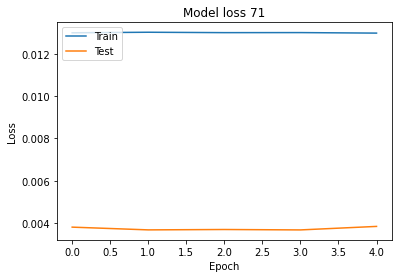

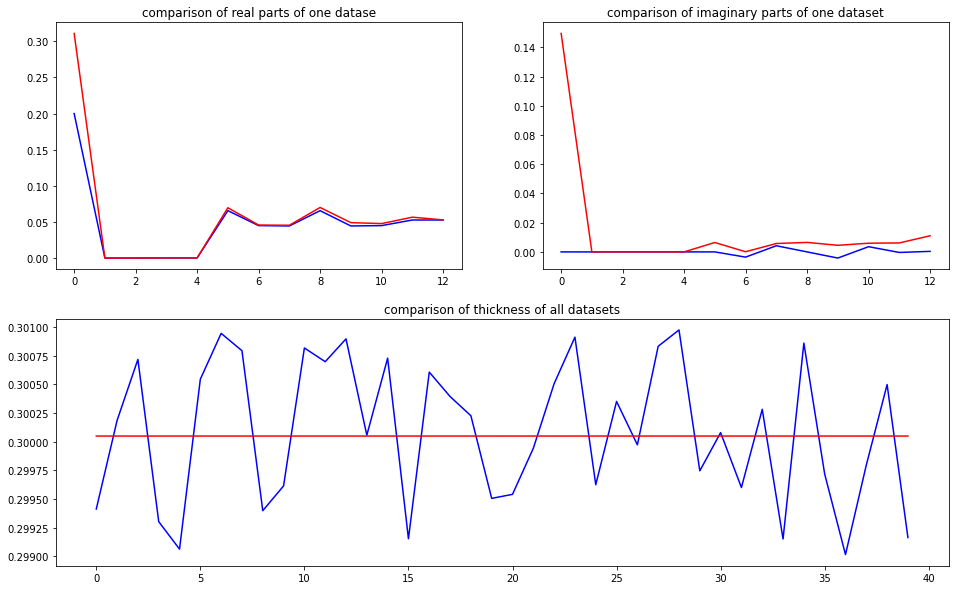

predicted thickness: 0.3000478


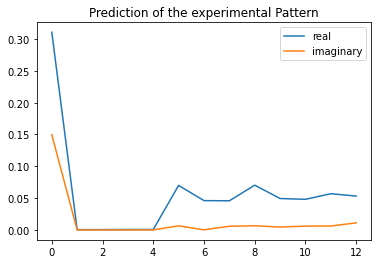

The offset applied on thickness: -0.00031351470614836784

The offset applied on Ug: -1.1181159437600343

Applied shift of unit cell origin (fractional coordinates): 0.0020708794274634187 -1.1651608576827783e-05
Ug[ 0 ]: 0.17775 0.0  =>  0.17775 0.0
Ug[ 1 ]: 0.00046 -0.00477  =>  0.00046 -0.00484
Ug[ 2 ]: 0.00046 0.00477  =>  0.00046 0.00484
Ug[ 3 ]: 0.00063 -0.01301  =>  0.00063 0.0
Ug[ 4 ]: 0.00063 0.01301  =>  0.00063 0.0
Ug[ 5 ]: 0.06459 -0.00015  =>  0.06459 0.0
Ug[ 6 ]: 0.04465 -0.06309  =>  0.04465 -0.05001
Ug[ 7 ]: 0.04501 0.01715  =>  0.04501 0.00421
Ug[ 8 ]: 0.06459 0.00015  =>  0.06459 0.0
Ug[ 9 ]: 0.04501 -0.01715  =>  0.04501 -0.00421
Ug[ 10 ]: 0.04465 0.06309  =>  0.04465 0.05001
Ug[ 11 ]: 0.05163 -0.05038  =>  0.05163 -0.0764
Ug[ 12 ]: 0.05163 0.05038  =>  0.05163 0.0764
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

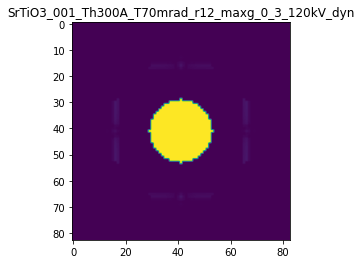

X_sim.max(): 0.9999980360915532
>>>replaced the 72. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 249ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0038 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 190ms/step - loss: 0.0120 - acc: 0.3800 - val_loss: 0.0036 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0036 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0119 - acc: 0.4600 - val_loss: 0.0035 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 1s 195ms/step - loss: 0.0119 - acc: 0.4400 - val_loss: 0.0036 - val_acc: 0.4750


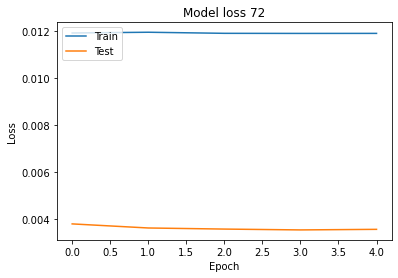

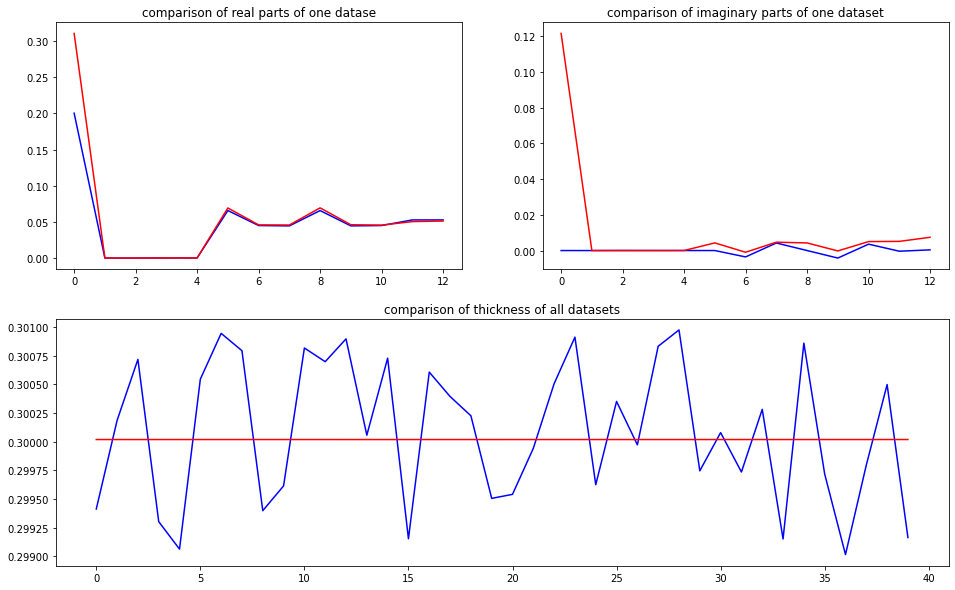

predicted thickness: 0.30001733


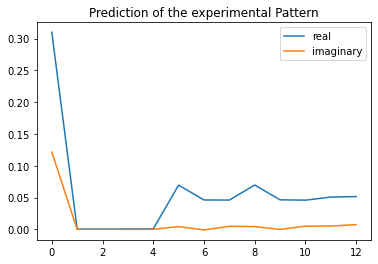

The offset applied on thickness: 0.0008770536463388132

The offset applied on Ug: -0.6996777647075875

Applied shift of unit cell origin (fractional coordinates): 0.002942347397382152 1.3574678226679578e-05
Ug[ 0 ]: 0.23242 0.0  =>  0.23242 0.0
Ug[ 1 ]: 0.00046 -0.01078  =>  0.00046 -0.01069
Ug[ 2 ]: 0.00046 0.01078  =>  0.00046 0.01069
Ug[ 3 ]: 0.00064 -0.01849  =>  0.00064 -0.0
Ug[ 4 ]: 0.00064 0.01849  =>  0.00064 0.0
Ug[ 5 ]: 0.06615 0.00017  =>  0.06615 -0.0
Ug[ 6 ]: 0.04462 -0.06699  =>  0.04462 -0.04859
Ug[ 7 ]: 0.04475 0.05469  =>  0.04475 0.03612
Ug[ 8 ]: 0.06615 -0.00017  =>  0.06615 0.0
Ug[ 9 ]: 0.04475 -0.05469  =>  0.04475 -0.03612
Ug[ 10 ]: 0.04462 0.06699  =>  0.04462 0.04859
Ug[ 11 ]: 0.04925 -0.02255  =>  0.04925 -0.05953
Ug[ 12 ]: 0.04925 0.02255  =>  0.04925 0.05953
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

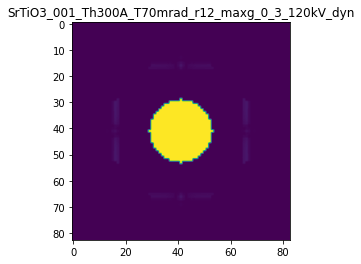

X_sim.max(): 0.9999980794122019
>>>replaced the 73. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 255ms/step - loss: 0.0119 - acc: 0.3300 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 219ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 227ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 312ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0032 - val_acc: 0.4750


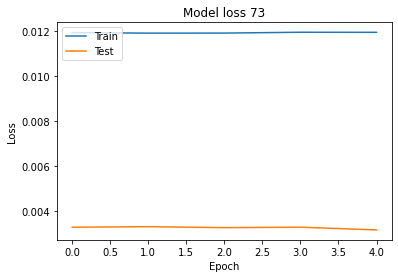

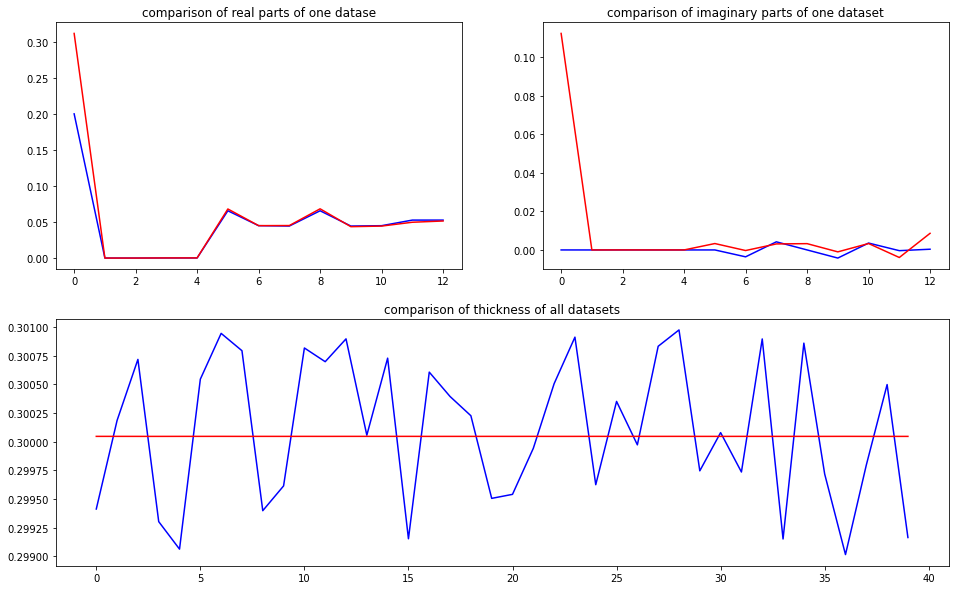

predicted thickness: 0.30004495


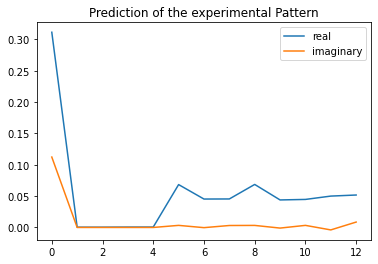

The offset applied on thickness: -0.0003239066863538487

The offset applied on Ug: 1.4652317625171545

Applied shift of unit cell origin (fractional coordinates): -0.0001705609737436749 -5.605531043540704e-06
Ug[ 0 ]: 0.47189 0.0  =>  0.47189 0.0
Ug[ 1 ]: 0.00046 -0.0122  =>  0.00046 -0.01224
Ug[ 2 ]: 0.00046 0.0122  =>  0.00046 0.01224
Ug[ 3 ]: 0.00065 0.00107  =>  0.00065 0.0
Ug[ 4 ]: 0.00065 -0.00107  =>  0.00065 0.0
Ug[ 5 ]: 0.07539 -7e-05  =>  0.07539 0.0
Ug[ 6 ]: 0.04803 -0.03703  =>  0.04803 -0.03807
Ug[ 7 ]: 0.04766 0.04596  =>  0.04766 0.04707
Ug[ 8 ]: 0.07539 7e-05  =>  0.07539 -0.0
Ug[ 9 ]: 0.04766 -0.04596  =>  0.04766 -0.04707
Ug[ 10 ]: 0.04803 0.03703  =>  0.04803 0.03807
Ug[ 11 ]: 0.05513 -0.11771  =>  0.05513 -0.11556
Ug[ 12 ]: 0.05513 0.11771  =>  0.05513 0.11556
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

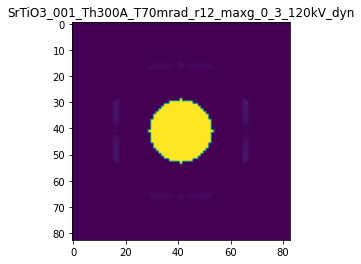

X_sim.max(): 0.9999982735330336
>>>replaced the 74. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 254ms/step - loss: 0.0119 - acc: 0.4000 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 2/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0119 - acc: 0.3900 - val_loss: 0.0032 - val_acc: 0.4750
Epoch 3/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0119 - acc: 0.3900 - val_loss: 0.0034 - val_acc: 0.4750
Epoch 4/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0119 - acc: 0.3900 - val_loss: 0.0033 - val_acc: 0.4750
Epoch 5/5
5/5 [==============================] - 1s 224ms/step - loss: 0.0119 - acc: 0.3900 - val_loss: 0.0034 - val_acc: 0.4750


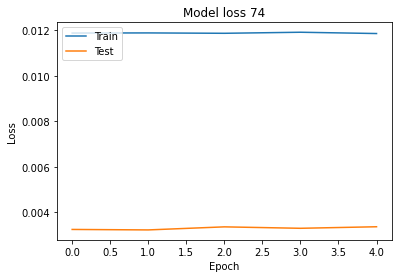

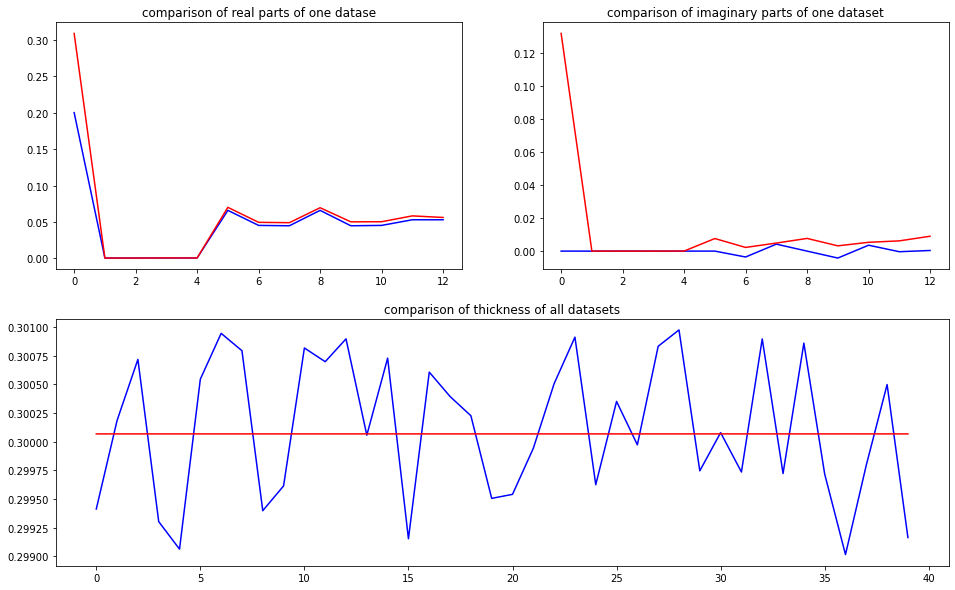

predicted thickness: 0.30006638


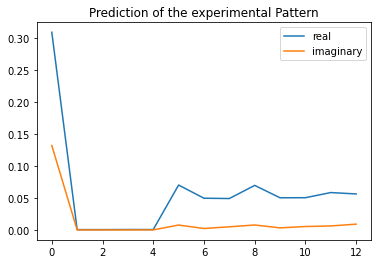

The offset applied on thickness: -0.0002262640849067008

The offset applied on Ug: 0.17149187730719093

Applied shift of unit cell origin (fractional coordinates): 0.004183472694915722 -3.553605405720653e-05
Ug[ 0 ]: 0.32804 0.0  =>  0.32804 0.0
Ug[ 1 ]: 0.00047 0.00099  =>  0.00047 0.00077
Ug[ 2 ]: 0.00047 -0.00099  =>  0.00047 -0.00077
Ug[ 3 ]: 0.00061 -0.02629  =>  0.00061 0.0
Ug[ 4 ]: 0.00061 0.02629  =>  0.00061 0.0
Ug[ 5 ]: 0.07064 -0.00045  =>  0.07064 0.0
Ug[ 6 ]: 0.05035 -0.03093  =>  0.05035 -0.00443
Ug[ 7 ]: 0.05002 0.01657  =>  0.05002 -0.00949
Ug[ 8 ]: 0.07064 0.00045  =>  0.07064 0.0
Ug[ 9 ]: 0.05002 -0.01657  =>  0.05002 0.00949
Ug[ 10 ]: 0.05035 0.03093  =>  0.05035 0.00443
Ug[ 11 ]: 0.05784 -0.02384  =>  0.05784 -0.07641
Ug[ 12 ]: 0.05784 0.02384  =>  0.05784 0.07641
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

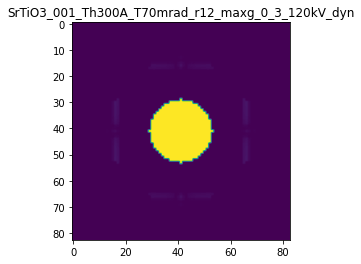

X_sim.max(): 0.9999985639332866
>>>replaced the 75. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 271ms/step - loss: 0.0119 - acc: 0.4000 - val_loss: 0.0033 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0119 - acc: 0.4000 - val_loss: 0.0033 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0119 - acc: 0.4000 - val_loss: 0.0033 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 220ms/step - loss: 0.0119 - acc: 0.4000 - val_loss: 0.0033 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0119 - acc: 0.3800 - val_loss: 0.0033 - val_acc: 0.5000


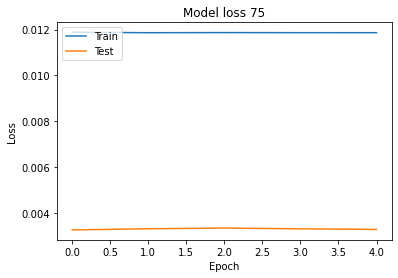

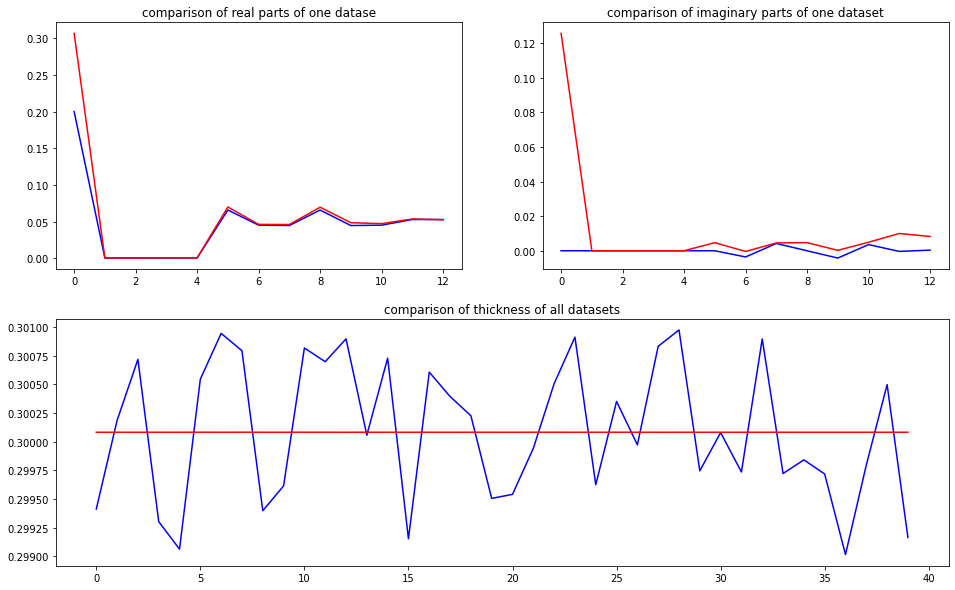

predicted thickness: 0.30008113


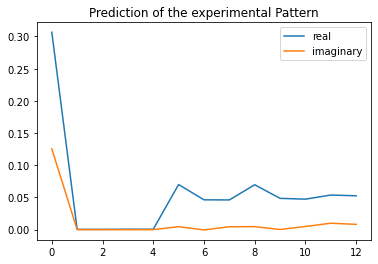

The offset applied on thickness: -0.0009765780617728465

The offset applied on Ug: -0.19549241568900086

Applied shift of unit cell origin (fractional coordinates): 0.0029828891797549963 -2.002223736307109e-05
Ug[ 0 ]: 0.28513 0.0  =>  0.28513 0.0
Ug[ 1 ]: 0.00046 -0.00358  =>  0.00046 -0.0037
Ug[ 2 ]: 0.00046 0.00358  =>  0.00046 0.0037
Ug[ 3 ]: 0.00066 -0.01874  =>  0.00066 0.0
Ug[ 4 ]: 0.00066 0.01874  =>  0.00066 -0.0
Ug[ 5 ]: 0.06894 -0.00025  =>  0.06894 0.0
Ug[ 6 ]: 0.04649 -0.05704  =>  0.04649 -0.03818
Ug[ 7 ]: 0.04701 0.04601  =>  0.04701 0.0274
Ug[ 8 ]: 0.06894 0.00025  =>  0.06894 -0.0
Ug[ 9 ]: 0.04701 -0.04601  =>  0.04701 -0.0274
Ug[ 10 ]: 0.04649 0.05704  =>  0.04649 0.03818
Ug[ 11 ]: 0.05262 0.0163  =>  0.05262 -0.02118
Ug[ 12 ]: 0.05262 -0.0163  =>  0.05262 0.02118
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

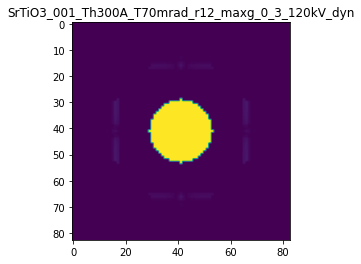

X_sim.max(): 0.999998025462594
>>>replaced the 76. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 249ms/step - loss: 0.0113 - acc: 0.4000 - val_loss: 0.0032 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0113 - acc: 0.4000 - val_loss: 0.0032 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0113 - acc: 0.4000 - val_loss: 0.0031 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0113 - acc: 0.4000 - val_loss: 0.0032 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0113 - acc: 0.4000 - val_loss: 0.0032 - val_acc: 0.5000


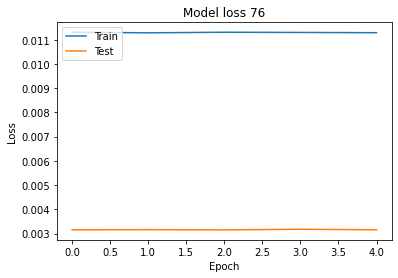

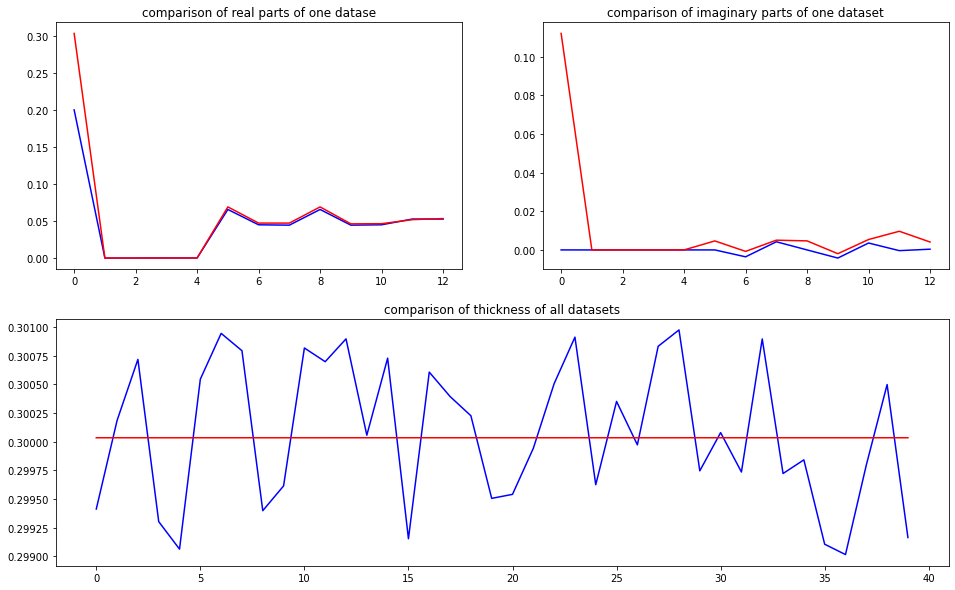

predicted thickness: 0.30003288


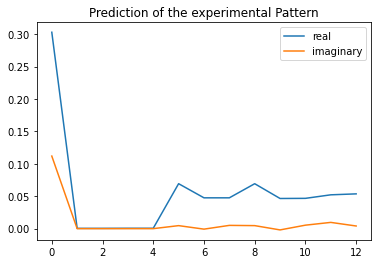

The offset applied on thickness: -0.0007865865069471025

The offset applied on Ug: 2.072283449632013

Applied shift of unit cell origin (fractional coordinates): 0.0008328741761603741 -4.015035222081065e-06
Ug[ 0 ]: 0.51939 0.0  =>  0.51939 0.0
Ug[ 1 ]: 0.00046 -0.01035  =>  0.00046 -0.01038
Ug[ 2 ]: 0.00046 0.01035  =>  0.00046 0.01038
Ug[ 3 ]: 0.00059 -0.00523  =>  0.00059 0.0
Ug[ 4 ]: 0.00059 0.00523  =>  0.00059 0.0
Ug[ 5 ]: 0.07937 -5e-05  =>  0.07937 -0.0
Ug[ 6 ]: 0.05189 -0.05785  =>  0.05189 -0.05259
Ug[ 7 ]: 0.0518 0.0706  =>  0.0518 0.0654
Ug[ 8 ]: 0.07937 5e-05  =>  0.07937 0.0
Ug[ 9 ]: 0.0518 -0.0706  =>  0.0518 -0.0654
Ug[ 10 ]: 0.05189 0.05785  =>  0.05189 0.05259
Ug[ 11 ]: 0.05892 0.04515  =>  0.05892 0.03468
Ug[ 12 ]: 0.05892 -0.04515  =>  0.05892 -0.03468
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

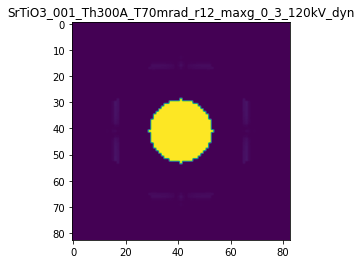

X_sim.max(): 0.9999987243167594
>>>replaced the 77. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 347ms/step - loss: 0.0113 - acc: 0.4100 - val_loss: 0.0030 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 225ms/step - loss: 0.0113 - acc: 0.4100 - val_loss: 0.0030 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0113 - acc: 0.4100 - val_loss: 0.0030 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 232ms/step - loss: 0.0113 - acc: 0.4100 - val_loss: 0.0030 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 2s 311ms/step - loss: 0.0113 - acc: 0.4100 - val_loss: 0.0029 - val_acc: 0.5000


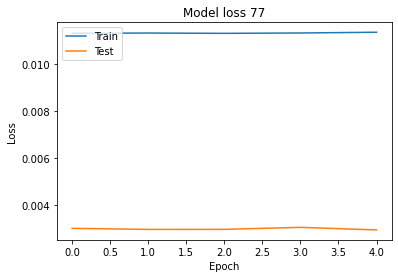

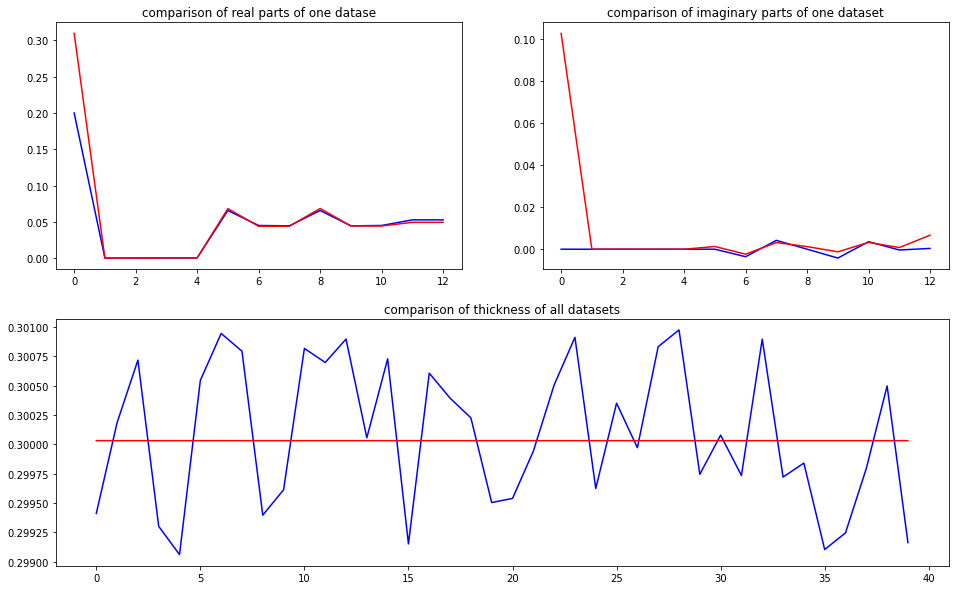

predicted thickness: 0.3000306


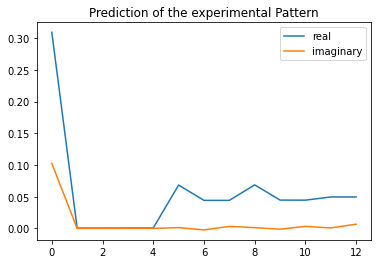

The offset applied on thickness: 0.0007695821067266396

The offset applied on Ug: 0.05315907297902789

Applied shift of unit cell origin (fractional coordinates): -0.000634373818120842 3.1555050028664634e-05
Ug[ 0 ]: 0.31516 0.0  =>  0.31516 0.0
Ug[ 1 ]: 0.00045 -0.01969  =>  0.00045 -0.01949
Ug[ 2 ]: 0.00045 0.01969  =>  0.00045 0.01949
Ug[ 3 ]: 0.00064 0.00399  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 -0.00399  =>  0.00064 0.0
Ug[ 5 ]: 0.0688 0.0004  =>  0.0688 0.0
Ug[ 6 ]: 0.0446 -0.06291  =>  0.0446 -0.06709
Ug[ 7 ]: 0.0446 0.04943  =>  0.0446 0.05322
Ug[ 8 ]: 0.0688 -0.0004  =>  0.0688 0.0
Ug[ 9 ]: 0.0446 -0.04943  =>  0.0446 -0.05322
Ug[ 10 ]: 0.0446 0.06291  =>  0.0446 0.06709
Ug[ 11 ]: 0.04984 -0.05936  =>  0.04984 -0.05139
Ug[ 12 ]: 0.04984 0.05936  =>  0.04984 0.05139
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70m

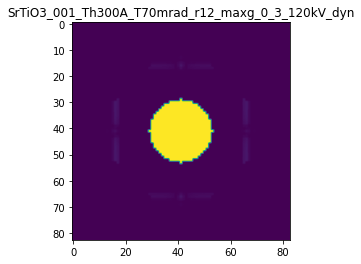

X_sim.max(): 0.9999980739693273
>>>replaced the 78. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 339ms/step - loss: 0.0099 - acc: 0.4200 - val_loss: 0.0027 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0099 - acc: 0.4200 - val_loss: 0.0026 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0099 - acc: 0.4200 - val_loss: 0.0027 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 1s 217ms/step - loss: 0.0099 - acc: 0.4200 - val_loss: 0.0027 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0099 - acc: 0.4200 - val_loss: 0.0027 - val_acc: 0.5250


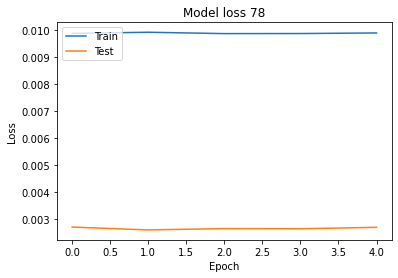

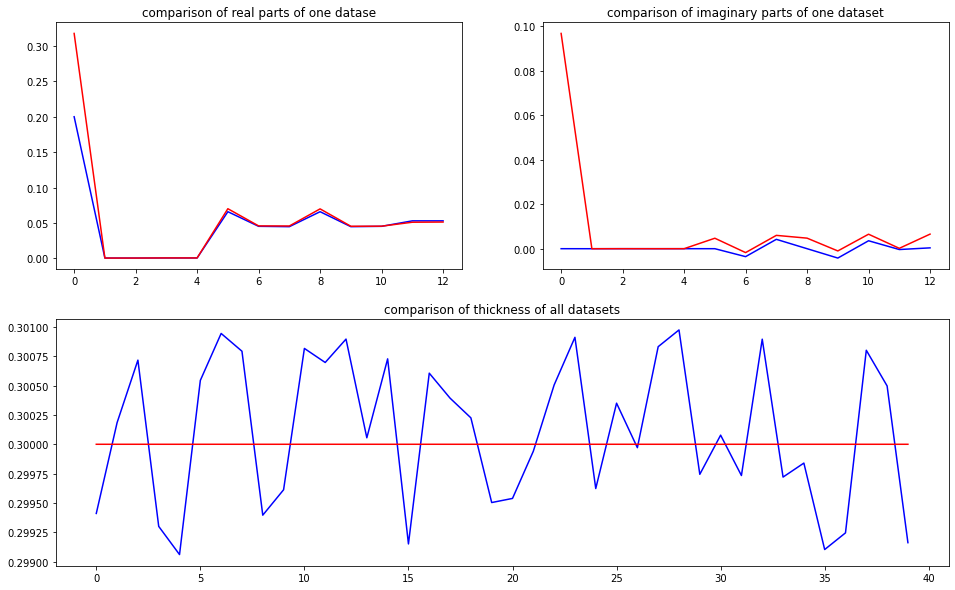

predicted thickness: 0.30000013


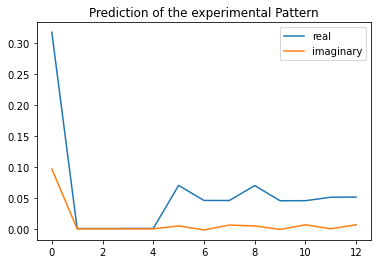

The offset applied on thickness: 0.0003486083948769181

The offset applied on Ug: -0.02868626787498817

Applied shift of unit cell origin (fractional coordinates): 0.000542776428027171 -2.1110486712943697e-05
Ug[ 0 ]: 0.31451 0.0  =>  0.31451 0.0
Ug[ 1 ]: 0.00046 -0.01369  =>  0.00046 -0.01382
Ug[ 2 ]: 0.00046 0.01369  =>  0.00046 0.01382
Ug[ 3 ]: 0.00063 -0.00341  =>  0.00063 -0.0
Ug[ 4 ]: 0.00063 0.00341  =>  0.00063 0.0
Ug[ 5 ]: 0.06988 -0.00027  =>  0.06988 0.0
Ug[ 6 ]: 0.0458 -0.09037  =>  0.0458 -0.08682
Ug[ 7 ]: 0.04564 0.07677  =>  0.04564 0.0735
Ug[ 8 ]: 0.06988 0.00027  =>  0.06988 0.0
Ug[ 9 ]: 0.04564 -0.07677  =>  0.04564 -0.0735
Ug[ 10 ]: 0.0458 0.09037  =>  0.0458 0.08682
Ug[ 11 ]: 0.05121 -0.06239  =>  0.05121 -0.06921
Ug[ 12 ]: 0.05121 0.06239  =>  0.05121 0.06921
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

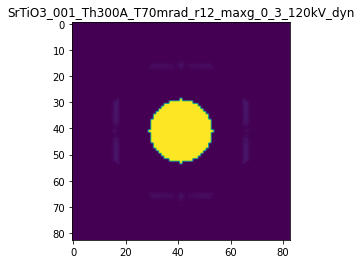

X_sim.max(): 0.9999981669600309
>>>replaced the 79. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 257ms/step - loss: 0.0099 - acc: 0.4300 - val_loss: 0.0026 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0099 - acc: 0.4300 - val_loss: 0.0026 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 199ms/step - loss: 0.0099 - acc: 0.4300 - val_loss: 0.0027 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0099 - acc: 0.4300 - val_loss: 0.0027 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0099 - acc: 0.4300 - val_loss: 0.0027 - val_acc: 0.5250


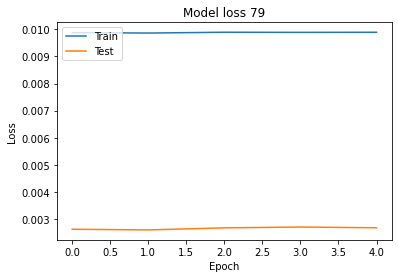

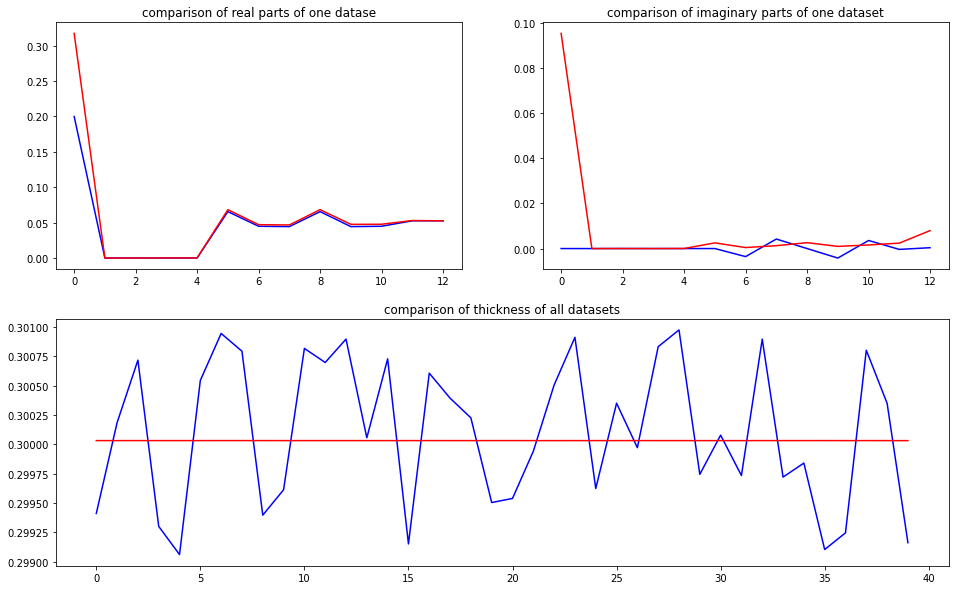

predicted thickness: 0.3000313


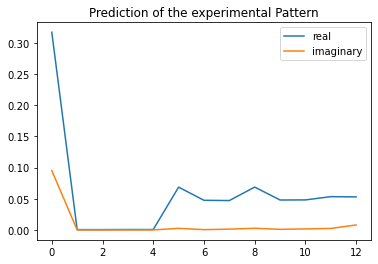

The offset applied on thickness: 0.0009576370098051233

The offset applied on Ug: -1.5803984053143358

Applied shift of unit cell origin (fractional coordinates): 0.0029939138281651393 -5.424322765826583e-05
Ug[ 0 ]: 0.14384 0.0  =>  0.14384 0.0
Ug[ 1 ]: 0.00046 -0.00525  =>  0.00046 -0.0056
Ug[ 2 ]: 0.00046 0.00525  =>  0.00046 0.0056
Ug[ 3 ]: 0.00064 -0.01881  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 0.01881  =>  0.00064 0.0
Ug[ 5 ]: 0.06121 -0.00068  =>  0.06121 0.0
Ug[ 6 ]: 0.0442 -0.01202  =>  0.0442 0.00713
Ug[ 7 ]: 0.04397 0.00465  =>  0.04397 -0.01382
Ug[ 8 ]: 0.06121 0.00068  =>  0.06121 -0.0
Ug[ 9 ]: 0.04397 -0.00465  =>  0.04397 0.01382
Ug[ 10 ]: 0.0442 0.01202  =>  0.0442 -0.00713
Ug[ 11 ]: 0.04871 -0.0567  =>  0.04871 -0.09432
Ug[ 12 ]: 0.04871 0.0567  =>  0.04871 0.09432
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th30

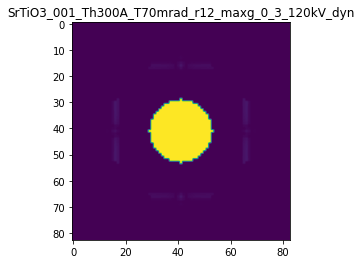

X_sim.max(): 0.999998029605902
>>>replaced the 80. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 338ms/step - loss: 0.0097 - acc: 0.4300 - val_loss: 0.0026 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 255ms/step - loss: 0.0097 - acc: 0.4300 - val_loss: 0.0024 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 252ms/step - loss: 0.0097 - acc: 0.4200 - val_loss: 0.0025 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 273ms/step - loss: 0.0097 - acc: 0.4700 - val_loss: 0.0025 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 2s 366ms/step - loss: 0.0097 - acc: 0.4300 - val_loss: 0.0025 - val_acc: 0.5000


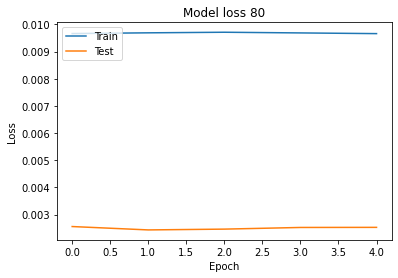

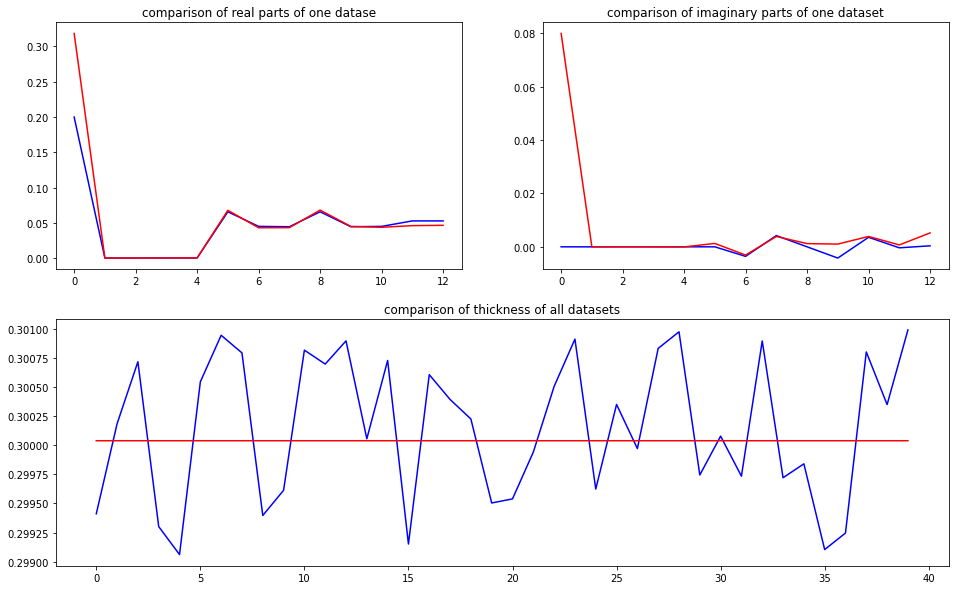

predicted thickness: 0.30003837


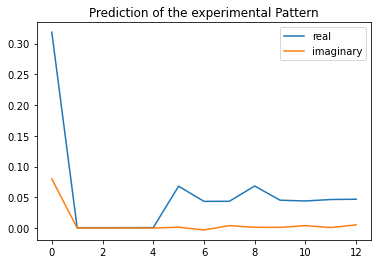

The offset applied on thickness: 0.0006140848932581156

The offset applied on Ug: -0.7289794891455467

Applied shift of unit cell origin (fractional coordinates): -0.0039804334195960465 5.367069458507517e-05
Ug[ 0 ]: 0.23982 0.0  =>  0.23982 0.0
Ug[ 1 ]: 0.00045 -0.01776  =>  0.00045 -0.01742
Ug[ 2 ]: 0.00045 0.01776  =>  0.00045 0.01742
Ug[ 3 ]: 0.00063 0.02501  =>  0.00063 0.0
Ug[ 4 ]: 0.00063 -0.02501  =>  0.00063 0.0
Ug[ 5 ]: 0.06476 0.00067  =>  0.06476 0.0
Ug[ 6 ]: 0.0424 -0.08196  =>  0.0424 -0.10731
Ug[ 7 ]: 0.04292 0.03428  =>  0.04292 0.05895
Ug[ 8 ]: 0.06476 -0.00067  =>  0.06476 0.0
Ug[ 9 ]: 0.04292 -0.03428  =>  0.04292 -0.05895
Ug[ 10 ]: 0.0424 0.08196  =>  0.0424 0.10731
Ug[ 11 ]: 0.04503 -0.04954  =>  0.04503 0.00048
Ug[ 12 ]: 0.04503 0.04954  =>  0.04503 -0.00048
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_T

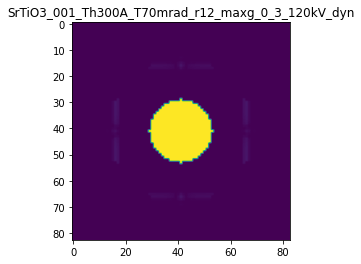

X_sim.max(): 0.9999979409079403
>>>replaced the 81. dataset and train: 
Epoch 1/5
5/5 [==============================] - 3s 390ms/step - loss: 0.0096 - acc: 0.4300 - val_loss: 0.0024 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 247ms/step - loss: 0.0097 - acc: 0.4300 - val_loss: 0.0024 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 307ms/step - loss: 0.0096 - acc: 0.4300 - val_loss: 0.0024 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 2s 326ms/step - loss: 0.0096 - acc: 0.4300 - val_loss: 0.0025 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 2s 360ms/step - loss: 0.0097 - acc: 0.4300 - val_loss: 0.0025 - val_acc: 0.5000


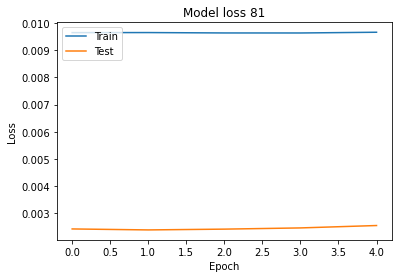

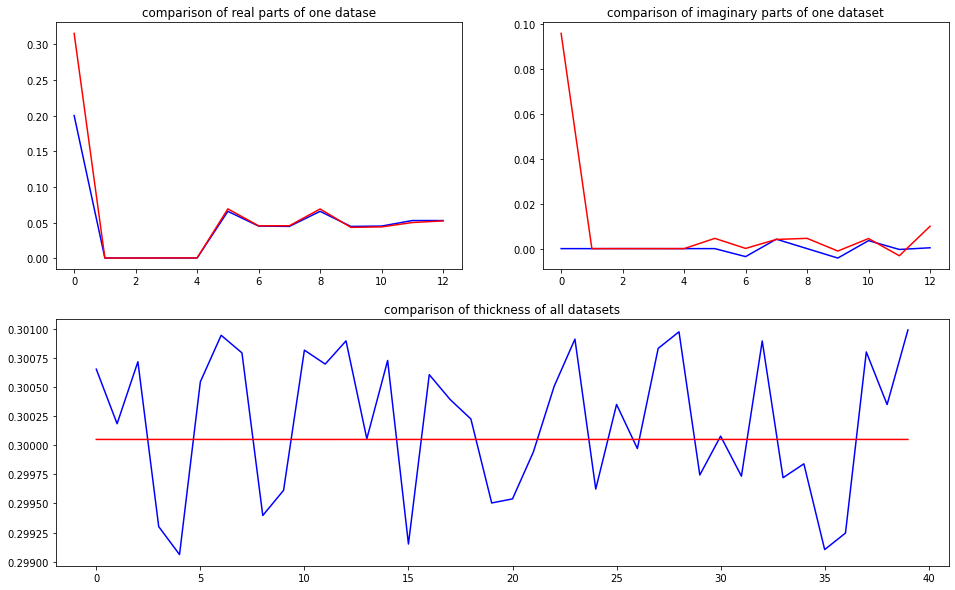

predicted thickness: 0.30004954


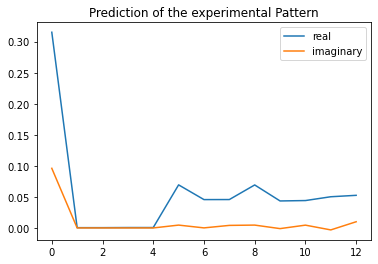

The offset applied on thickness: 0.0002495875531844014

The offset applied on Ug: 0.38229049646710844

Applied shift of unit cell origin (fractional coordinates): -0.0008626798717335305 1.8646840584051554e-06
Ug[ 0 ]: 0.35658 0.0  =>  0.35658 0.0
Ug[ 1 ]: 0.00046 -0.00776  =>  0.00046 -0.00775
Ug[ 2 ]: 0.00046 0.00776  =>  0.00046 0.00775
Ug[ 3 ]: 0.00064 0.00542  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 -0.00542  =>  0.00064 0.0
Ug[ 5 ]: 0.07112 2e-05  =>  0.07112 0.0
Ug[ 6 ]: 0.04569 -0.04785  =>  0.04569 -0.05328
Ug[ 7 ]: 0.04543 0.05804  =>  0.04543 0.06345
Ug[ 8 ]: 0.07112 -2e-05  =>  0.07112 -0.0
Ug[ 9 ]: 0.04543 -0.05804  =>  0.04543 -0.06345
Ug[ 10 ]: 0.04569 0.04785  =>  0.04569 0.05328
Ug[ 11 ]: 0.05282 -0.12609  =>  0.05282 -0.11525
Ug[ 12 ]: 0.05282 0.12609  =>  0.05282 0.11525
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

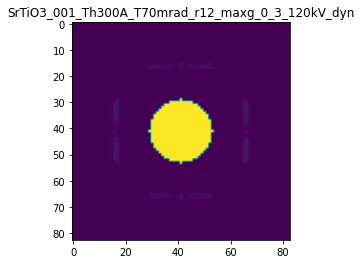

X_sim.max(): 0.9999981274504123
>>>replaced the 82. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 299ms/step - loss: 0.0096 - acc: 0.4400 - val_loss: 0.0023 - val_acc: 0.5000
Epoch 2/5
5/5 [==============================] - 1s 241ms/step - loss: 0.0096 - acc: 0.4400 - val_loss: 0.0022 - val_acc: 0.5000
Epoch 3/5
5/5 [==============================] - 1s 182ms/step - loss: 0.0096 - acc: 0.4400 - val_loss: 0.0022 - val_acc: 0.5000
Epoch 4/5
5/5 [==============================] - 1s 295ms/step - loss: 0.0097 - acc: 0.4400 - val_loss: 0.0022 - val_acc: 0.5000
Epoch 5/5
5/5 [==============================] - 2s 347ms/step - loss: 0.0097 - acc: 0.4400 - val_loss: 0.0023 - val_acc: 0.5000


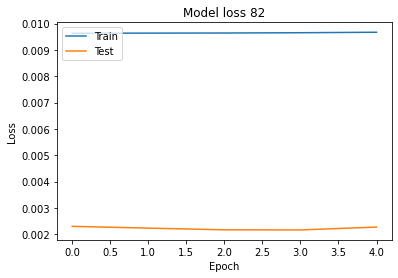

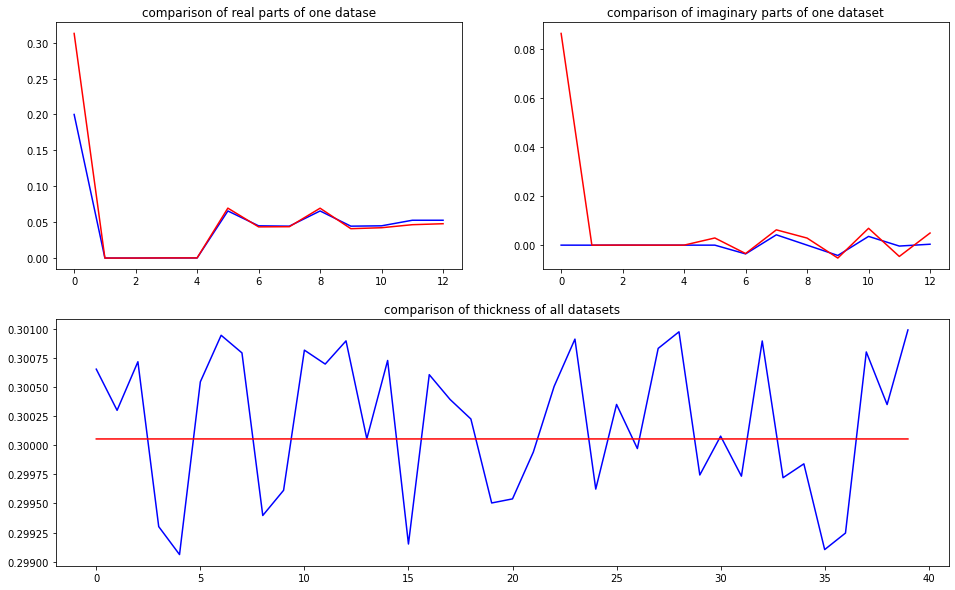

predicted thickness: 0.3000537


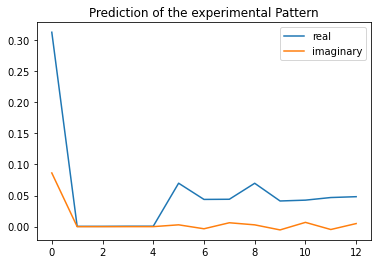

The offset applied on thickness: -0.0009529205044648035

The offset applied on Ug: 0.6770734466838533

Applied shift of unit cell origin (fractional coordinates): 0.0004192076660628195 3.0876419527732236e-05
Ug[ 0 ]: 0.38392 0.0  =>  0.38392 0.0
Ug[ 1 ]: 0.00045 -0.04254  =>  0.00045 -0.04234
Ug[ 2 ]: 0.00045 0.04254  =>  0.00045 0.04234
Ug[ 3 ]: 0.00065 -0.00263  =>  0.00065 0.0
Ug[ 4 ]: 0.00065 0.00263  =>  0.00065 0.0
Ug[ 5 ]: 0.07311 0.00039  =>  0.07311 0.0
Ug[ 6 ]: 0.04478 -0.11466  =>  0.04478 -0.11222
Ug[ 7 ]: 0.0443 0.13236  =>  0.0443 0.12953
Ug[ 8 ]: 0.07311 -0.00039  =>  0.07311 -0.0
Ug[ 9 ]: 0.0443 -0.13236  =>  0.0443 -0.12953
Ug[ 10 ]: 0.04478 0.11466  =>  0.04478 0.11222
Ug[ 11 ]: 0.04928 -0.09802  =>  0.04928 -0.10329
Ug[ 12 ]: 0.04928 0.09802  =>  0.04928 0.10329
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

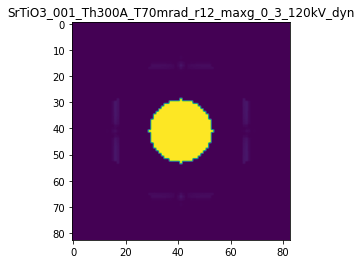

X_sim.max(): 0.999997814340246
>>>replaced the 83. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 265ms/step - loss: 0.0081 - acc: 0.4500 - val_loss: 0.0022 - val_acc: 0.5250
Epoch 2/5
5/5 [==============================] - 1s 227ms/step - loss: 0.0081 - acc: 0.4500 - val_loss: 0.0021 - val_acc: 0.5250
Epoch 3/5
5/5 [==============================] - 1s 287ms/step - loss: 0.0081 - acc: 0.4500 - val_loss: 0.0021 - val_acc: 0.5250
Epoch 4/5
5/5 [==============================] - 2s 312ms/step - loss: 0.0081 - acc: 0.4500 - val_loss: 0.0021 - val_acc: 0.5250
Epoch 5/5
5/5 [==============================] - 2s 339ms/step - loss: 0.0081 - acc: 0.4500 - val_loss: 0.0021 - val_acc: 0.5250


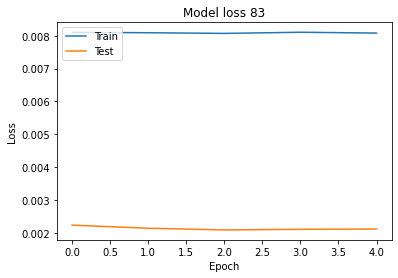

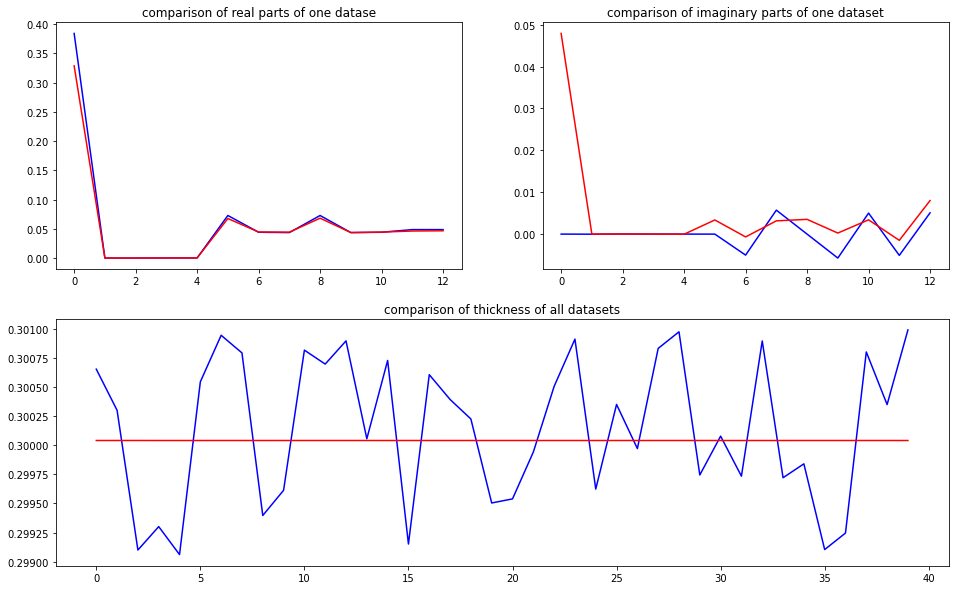

predicted thickness: 0.3000404


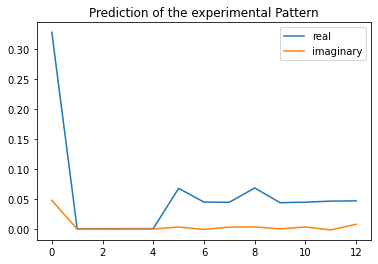

The offset applied on thickness: -0.0007656972792631045

The offset applied on Ug: 0.6318285361528553

Applied shift of unit cell origin (fractional coordinates): -0.0037434469872225113 -0.00011492226962234121
Ug[ 0 ]: 0.39814 0.0  =>  0.39814 0.0
Ug[ 1 ]: 0.00046 -0.01963  =>  0.00046 -0.02035
Ug[ 2 ]: 0.00046 0.01963  =>  0.00046 0.02035
Ug[ 3 ]: 0.00065 0.02352  =>  0.00065 -0.0
Ug[ 4 ]: 0.00065 -0.02352  =>  0.00065 0.0
Ug[ 5 ]: 0.07119 -0.00144  =>  0.07119 -0.0
Ug[ 6 ]: 0.04618 -0.04422  =>  0.04618 -0.06702
Ug[ 7 ]: 0.04558 0.03253  =>  0.04558 0.05677
Ug[ 8 ]: 0.07119 0.00144  =>  0.07119 0.0
Ug[ 9 ]: 0.04558 -0.03253  =>  0.04558 -0.05677
Ug[ 10 ]: 0.04618 0.04422  =>  0.04618 0.06702
Ug[ 11 ]: 0.04845 -0.09888  =>  0.04845 -0.05184
Ug[ 12 ]: 0.04845 0.09888  =>  0.04845 0.05184
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTi

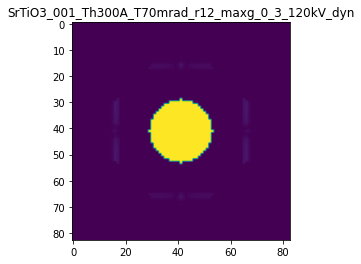

X_sim.max(): 0.9999979715262884
>>>replaced the 84. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 260ms/step - loss: 0.0080 - acc: 0.4600 - val_loss: 0.0021 - val_acc: 0.5500
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0080 - acc: 0.4600 - val_loss: 0.0021 - val_acc: 0.5500
Epoch 3/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0080 - acc: 0.4600 - val_loss: 0.0022 - val_acc: 0.5500
Epoch 4/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0080 - acc: 0.4600 - val_loss: 0.0022 - val_acc: 0.5500
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0080 - acc: 0.4600 - val_loss: 0.0021 - val_acc: 0.5500


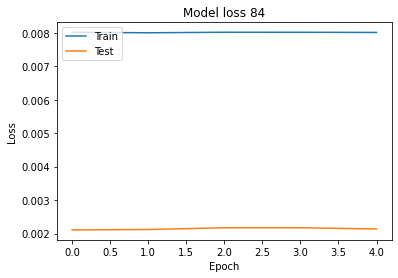

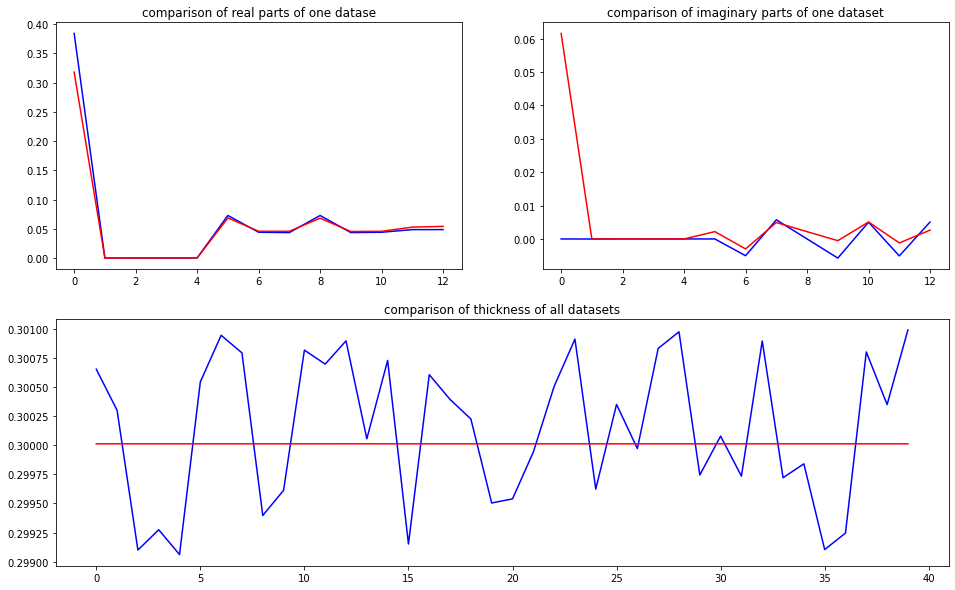

predicted thickness: 0.3000119


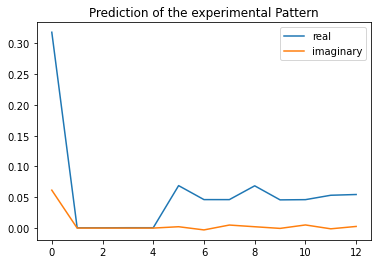

The offset applied on thickness: -0.00019265466813931154

The offset applied on Ug: 1.9586254957511984

Applied shift of unit cell origin (fractional coordinates): -0.0009153068578649943 7.338512113563886e-05
Ug[ 0 ]: 0.52323 0.0  =>  0.52323 0.0
Ug[ 1 ]: 0.00045 -0.01491  =>  0.00045 -0.01445
Ug[ 2 ]: 0.00045 0.01491  =>  0.00045 0.01445
Ug[ 3 ]: 0.00057 0.00575  =>  0.00057 0.0
Ug[ 4 ]: 0.00057 -0.00575  =>  0.00057 -0.0
Ug[ 5 ]: 0.07802 0.00092  =>  0.07802 0.0
Ug[ 6 ]: 0.05055 -0.08004  =>  0.05055 -0.08625
Ug[ 7 ]: 0.05023 0.05566  =>  0.05023 0.06095
Ug[ 8 ]: 0.07802 -0.00092  =>  0.07802 -0.0
Ug[ 9 ]: 0.05023 -0.05566  =>  0.05023 -0.06095
Ug[ 10 ]: 0.05055 0.08004  =>  0.05055 0.08625
Ug[ 11 ]: 0.05962 -0.03528  =>  0.05962 -0.02378
Ug[ 12 ]: 0.05962 0.03528  =>  0.05962 0.02378
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

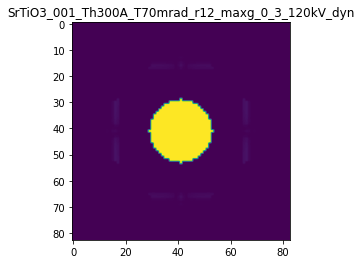

X_sim.max(): 0.9999987339785648
>>>replaced the 85. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 252ms/step - loss: 0.0080 - acc: 0.4700 - val_loss: 0.0020 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0080 - acc: 0.4700 - val_loss: 0.0019 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 1s 226ms/step - loss: 0.0080 - acc: 0.4700 - val_loss: 0.0019 - val_acc: 0.5750
Epoch 4/5
5/5 [==============================] - 1s 304ms/step - loss: 0.0080 - acc: 0.4700 - val_loss: 0.0019 - val_acc: 0.5750
Epoch 5/5
5/5 [==============================] - 2s 321ms/step - loss: 0.0080 - acc: 0.4700 - val_loss: 0.0019 - val_acc: 0.5750


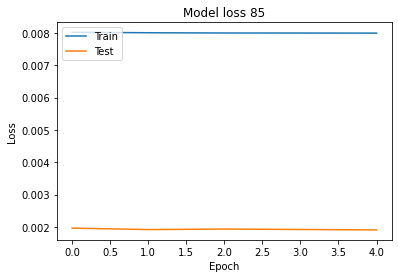

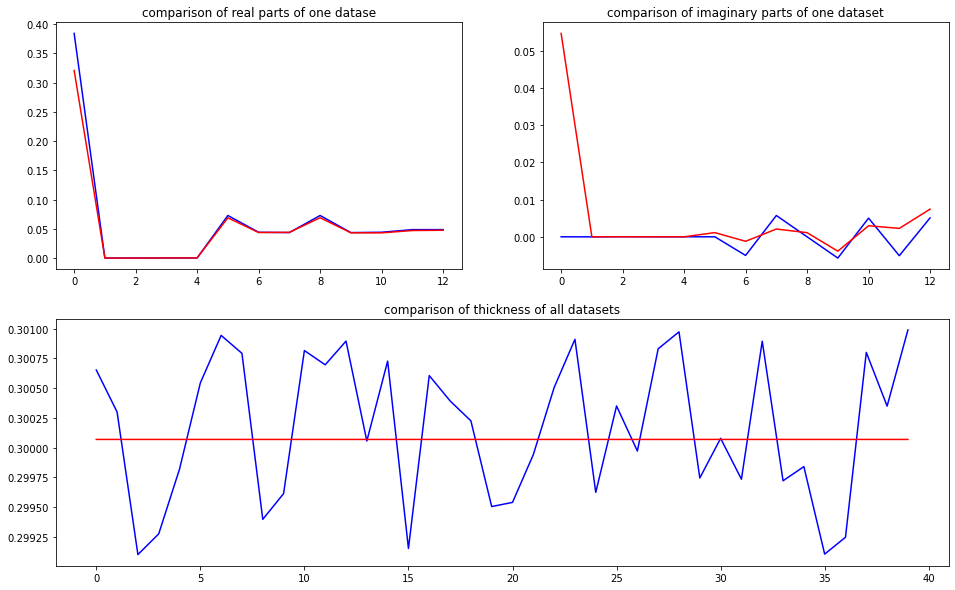

predicted thickness: 0.30006865


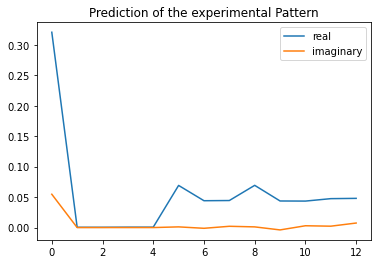

The offset applied on thickness: 7.766083970990079e-05

The offset applied on Ug: 0.23354951062181156

Applied shift of unit cell origin (fractional coordinates): -0.0003572439189765838 1.5892758314003142e-06
Ug[ 0 ]: 0.34538 0.0  =>  0.34538 0.0
Ug[ 1 ]: 0.00046 -0.00974  =>  0.00046 -0.00973
Ug[ 2 ]: 0.00046 0.00974  =>  0.00046 0.00973
Ug[ 3 ]: 0.00066 0.00224  =>  0.00066 0.0
Ug[ 4 ]: 0.00066 -0.00224  =>  0.00066 0.0
Ug[ 5 ]: 0.07036 2e-05  =>  0.07036 -0.0
Ug[ 6 ]: 0.04426 -0.04709  =>  0.04426 -0.04934
Ug[ 7 ]: 0.04457 0.067  =>  0.04457 0.06923
Ug[ 8 ]: 0.07036 -2e-05  =>  0.07036 0.0
Ug[ 9 ]: 0.04457 -0.067  =>  0.04457 -0.06923
Ug[ 10 ]: 0.04426 0.04709  =>  0.04426 0.04934
Ug[ 11 ]: 0.04831 -0.05379  =>  0.04831 -0.0493
Ug[ 12 ]: 0.04831 0.05379  =>  0.04831 0.0493
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300

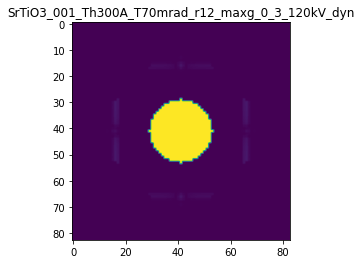

X_sim.max(): 0.9999978884062419
>>>replaced the 86. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 254ms/step - loss: 0.0080 - acc: 0.4800 - val_loss: 0.0019 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 191ms/step - loss: 0.0080 - acc: 0.4800 - val_loss: 0.0019 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 200ms/step - loss: 0.0080 - acc: 0.4800 - val_loss: 0.0019 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0080 - acc: 0.4800 - val_loss: 0.0019 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0080 - acc: 0.4800 - val_loss: 0.0019 - val_acc: 0.6000


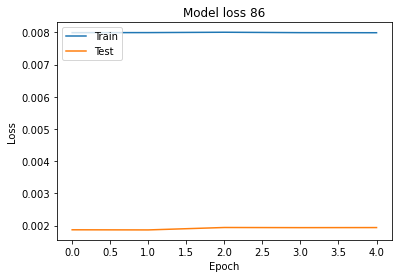

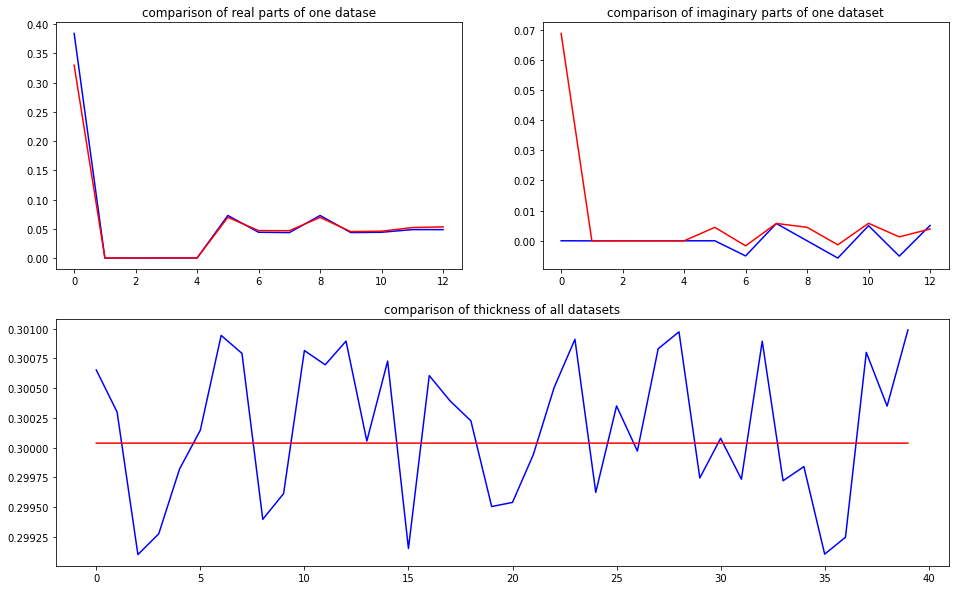

predicted thickness: 0.30003744


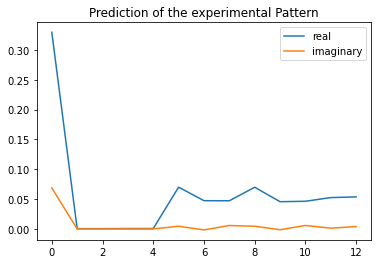

The offset applied on thickness: 0.0008747600630334477

The offset applied on Ug: 1.300959038522772

Applied shift of unit cell origin (fractional coordinates): -0.0017758276870611708 5.821986848047162e-06
Ug[ 0 ]: 0.47702 0.0  =>  0.47702 0.0
Ug[ 1 ]: 0.00046 -0.01428  =>  0.00046 -0.01424
Ug[ 2 ]: 0.00046 0.01428  =>  0.00046 0.01424
Ug[ 3 ]: 0.00061 0.01116  =>  0.00061 -0.0
Ug[ 4 ]: 0.00061 -0.01116  =>  0.00061 0.0
Ug[ 5 ]: 0.07628 7e-05  =>  0.07628 -0.0
Ug[ 6 ]: 0.04985 -0.074  =>  0.04985 -0.08519
Ug[ 7 ]: 0.04935 0.0745  =>  0.04935 0.08562
Ug[ 8 ]: 0.07628 -7e-05  =>  0.07628 0.0
Ug[ 9 ]: 0.04935 -0.0745  =>  0.04935 -0.08562
Ug[ 10 ]: 0.04985 0.074  =>  0.04985 0.08519
Ug[ 11 ]: 0.05677 -0.02487  =>  0.05677 -0.00255
Ug[ 12 ]: 0.05677 0.02487  =>  0.05677 0.00255
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

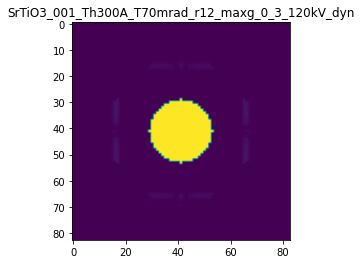

X_sim.max(): 0.9999986441395496
>>>replaced the 87. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 266ms/step - loss: 0.0080 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0080 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0080 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0080 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0080 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6250


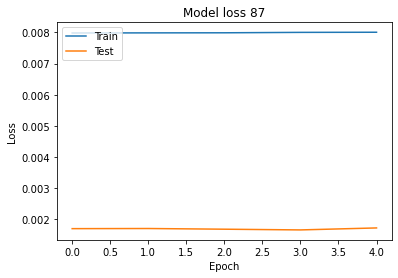

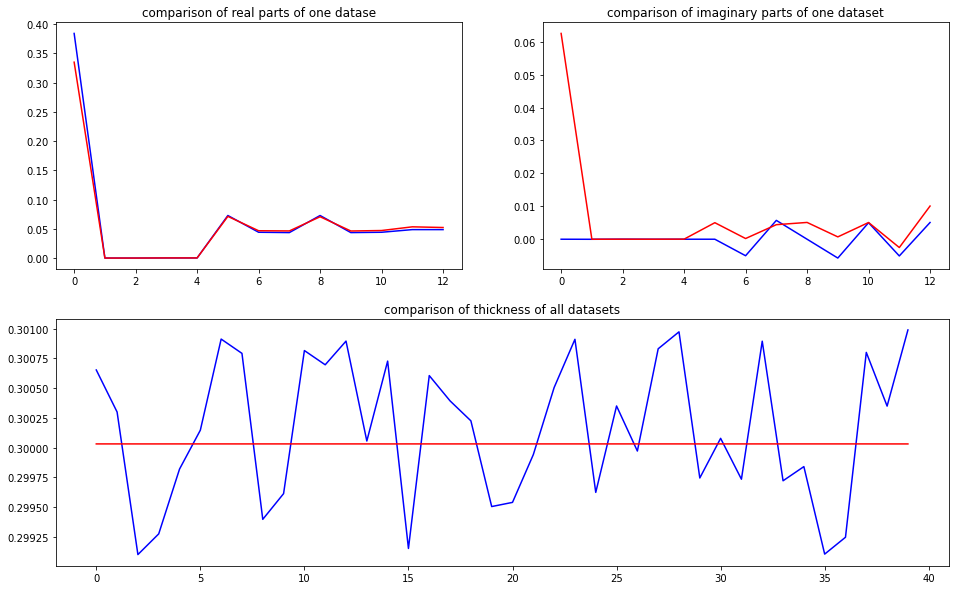

predicted thickness: 0.30003083


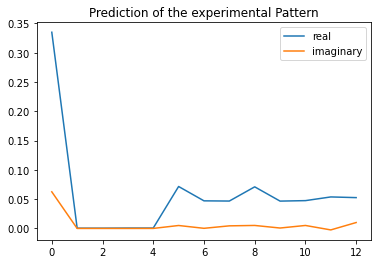

The offset applied on thickness: -0.00038626992193118093

The offset applied on Ug: -1.0080724542274044

Applied shift of unit cell origin (fractional coordinates): 0.003127884185206114 -8.876042888698396e-05
Ug[ 0 ]: 0.21788 0.0  =>  0.21788 0.0
Ug[ 1 ]: 0.00046 -0.01308  =>  0.00046 -0.01364
Ug[ 2 ]: 0.00046 0.01308  =>  0.00046 0.01364
Ug[ 3 ]: 0.00067 -0.01965  =>  0.00067 0.0
Ug[ 4 ]: 0.00067 0.01965  =>  0.00067 0.0
Ug[ 5 ]: 0.06614 -0.00112  =>  0.06614 0.0
Ug[ 6 ]: 0.04508 -0.05341  =>  0.04508 -0.0332
Ug[ 7 ]: 0.04453 0.04137  =>  0.04453 0.02228
Ug[ 8 ]: 0.06614 0.00112  =>  0.06614 0.0
Ug[ 9 ]: 0.04453 -0.04137  =>  0.04453 -0.02228
Ug[ 10 ]: 0.04508 0.05341  =>  0.04508 0.0332
Ug[ 11 ]: 0.05067 -0.12486  =>  0.05067 -0.16417
Ug[ 12 ]: 0.05067 0.12486  =>  0.05067 0.16417
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

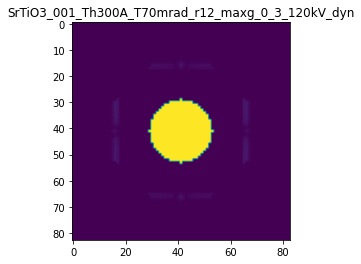

X_sim.max(): 0.99999780697971
>>>replaced the 88. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 256ms/step - loss: 0.0074 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0074 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0074 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 219ms/step - loss: 0.0074 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0074 - acc: 0.4900 - val_loss: 0.0017 - val_acc: 0.6000


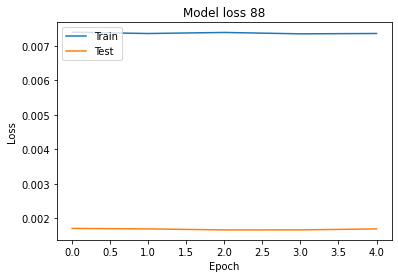

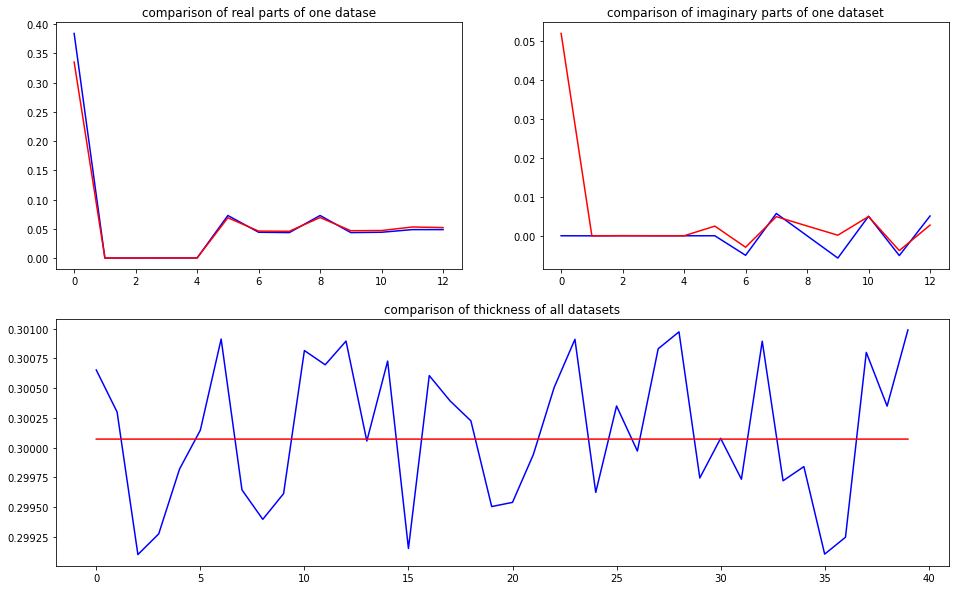

predicted thickness: 0.30007133


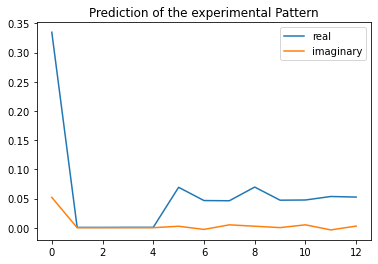

The offset applied on thickness: -0.0009655003815831389

The offset applied on Ug: 1.8055577839798733

Applied shift of unit cell origin (fractional coordinates): -0.0005994590358187272 -9.024407426800846e-05
Ug[ 0 ]: 0.54245 0.0  =>  0.54245 0.0
Ug[ 1 ]: 0.00045 -0.02025  =>  0.00045 -0.02081
Ug[ 2 ]: 0.00045 0.02025  =>  0.00045 0.02081
Ug[ 3 ]: 0.0006 0.00377  =>  0.0006 0.0
Ug[ 4 ]: 0.0006 -0.00377  =>  0.0006 0.0
Ug[ 5 ]: 0.07814 -0.00113  =>  0.07814 0.0
Ug[ 6 ]: 0.05117 -0.07943  =>  0.05117 -0.08262
Ug[ 7 ]: 0.05066 0.04548  =>  0.05066 0.04982
Ug[ 8 ]: 0.07814 0.00113  =>  0.07814 0.0
Ug[ 9 ]: 0.05066 -0.04548  =>  0.05066 -0.04982
Ug[ 10 ]: 0.05117 0.07943  =>  0.05117 0.08262
Ug[ 11 ]: 0.05815 -0.05399  =>  0.05815 -0.04645
Ug[ 12 ]: 0.05815 0.05399  =>  0.05815 0.04645
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_

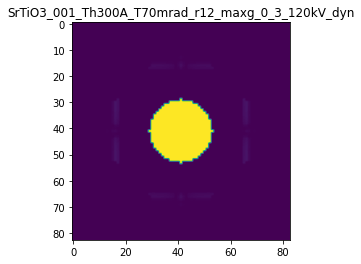

X_sim.max(): 0.9999986247102823
>>>replaced the 89. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 286ms/step - loss: 0.0051 - acc: 0.5000 - val_loss: 0.0015 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 240ms/step - loss: 0.0051 - acc: 0.5000 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 235ms/step - loss: 0.0051 - acc: 0.5000 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 207ms/step - loss: 0.0051 - acc: 0.5000 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 307ms/step - loss: 0.0051 - acc: 0.5000 - val_loss: 0.0014 - val_acc: 0.6000


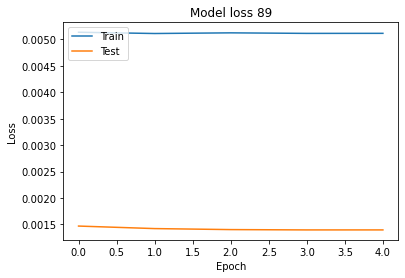

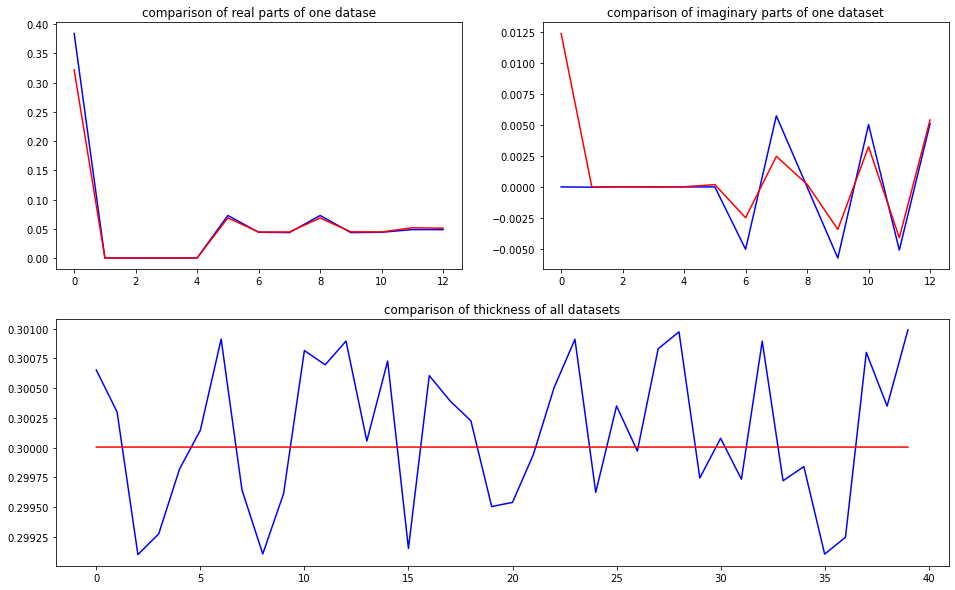

predicted thickness: 0.30000433


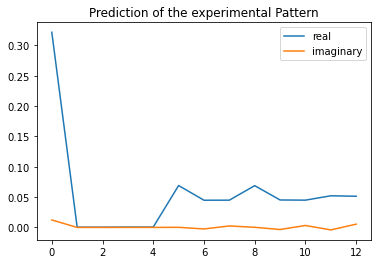

The offset applied on thickness: 0.00047971363581615536

The offset applied on Ug: 0.3680165582439567

Applied shift of unit cell origin (fractional coordinates): 0.002058679222727882 -1.0831153460585363e-05
Ug[ 0 ]: 0.35989 0.0  =>  0.35989 0.0
Ug[ 1 ]: 0.00046 -0.00679  =>  0.00046 -0.00686
Ug[ 2 ]: 0.00046 0.00679  =>  0.00046 0.00686
Ug[ 3 ]: 0.00064 -0.01294  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 0.01294  =>  0.00064 0.0
Ug[ 5 ]: 0.07072 -0.00014  =>  0.07072 -0.0
Ug[ 6 ]: 0.04575 -0.06258  =>  0.04575 -0.04958
Ug[ 7 ]: 0.04595 0.06378  =>  0.04595 0.05092
Ug[ 8 ]: 0.07072 0.00014  =>  0.07072 0.0
Ug[ 9 ]: 0.04595 -0.06378  =>  0.04595 -0.05092
Ug[ 10 ]: 0.04575 0.06258  =>  0.04575 0.04958
Ug[ 11 ]: 0.05299 -0.08926  =>  0.05299 -0.11513
Ug[ 12 ]: 0.05299 0.08926  =>  0.05299 0.11513
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

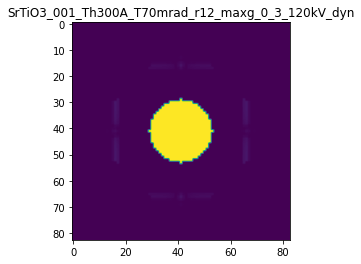

X_sim.max(): 0.9999982104219842
>>>replaced the 90. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 324ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 196ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.6000


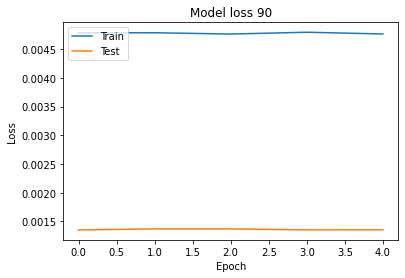

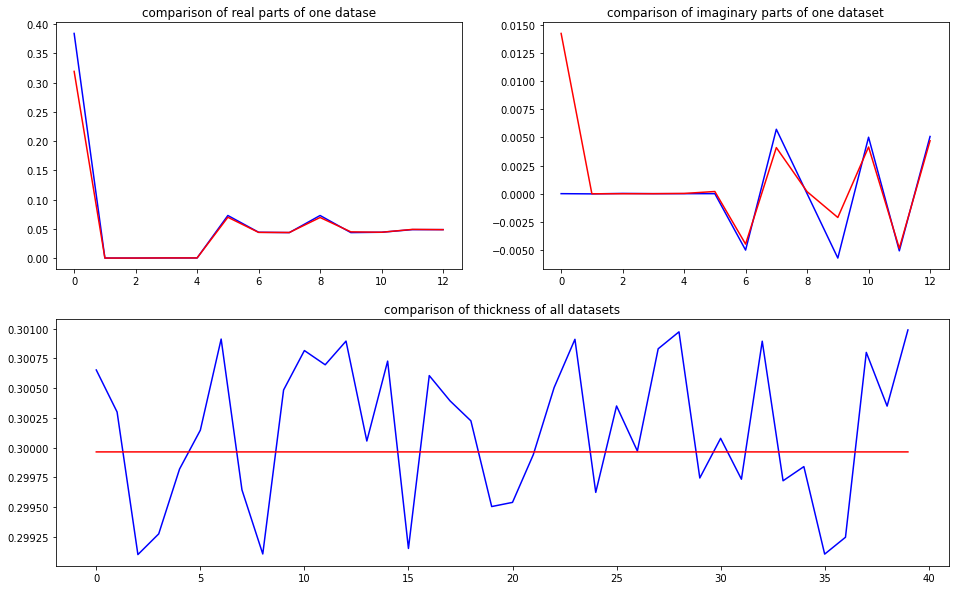

predicted thickness: 0.29996374


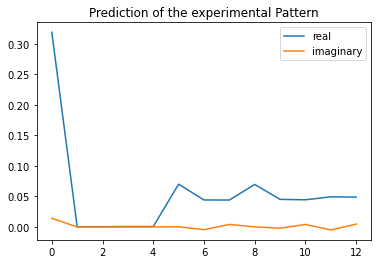

The offset applied on thickness: 0.0005148157506716591

The offset applied on Ug: -1.0734134416921801

Applied shift of unit cell origin (fractional coordinates): 0.002559952836328866 -2.1602594989483495e-05
Ug[ 0 ]: 0.20959 0.0  =>  0.20959 0.0
Ug[ 1 ]: 0.00046 -0.00619  =>  0.00046 -0.00633
Ug[ 2 ]: 0.00046 0.00619  =>  0.00046 0.00633
Ug[ 3 ]: 0.00068 -0.01608  =>  0.00068 0.0
Ug[ 4 ]: 0.00068 0.01608  =>  0.00068 -0.0
Ug[ 5 ]: 0.06465 -0.00027  =>  0.06465 0.0
Ug[ 6 ]: 0.04247 -0.10155  =>  0.04247 -0.08533
Ug[ 7 ]: 0.04261 0.07387  =>  0.04261 0.05792
Ug[ 8 ]: 0.06465 0.00027  =>  0.06465 0.0
Ug[ 9 ]: 0.04261 -0.07387  =>  0.04261 -0.05792
Ug[ 10 ]: 0.04247 0.10155  =>  0.04247 0.08533
Ug[ 11 ]: 0.04678 -0.1028  =>  0.04678 -0.13497
Ug[ 12 ]: 0.04678 0.1028  =>  0.04678 0.13497
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

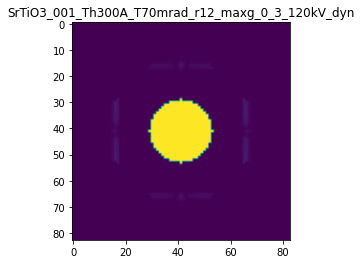

X_sim.max(): 0.9999975852534115
>>>replaced the 91. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 242ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.5750
Epoch 2/5
5/5 [==============================] - 1s 178ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.5750
Epoch 3/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.5750
Epoch 4/5
5/5 [==============================] - 1s 204ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.5750
Epoch 5/5
5/5 [==============================] - 1s 262ms/step - loss: 0.0048 - acc: 0.5100 - val_loss: 0.0014 - val_acc: 0.5750


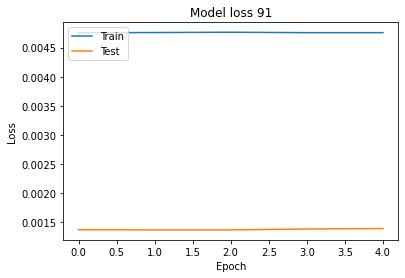

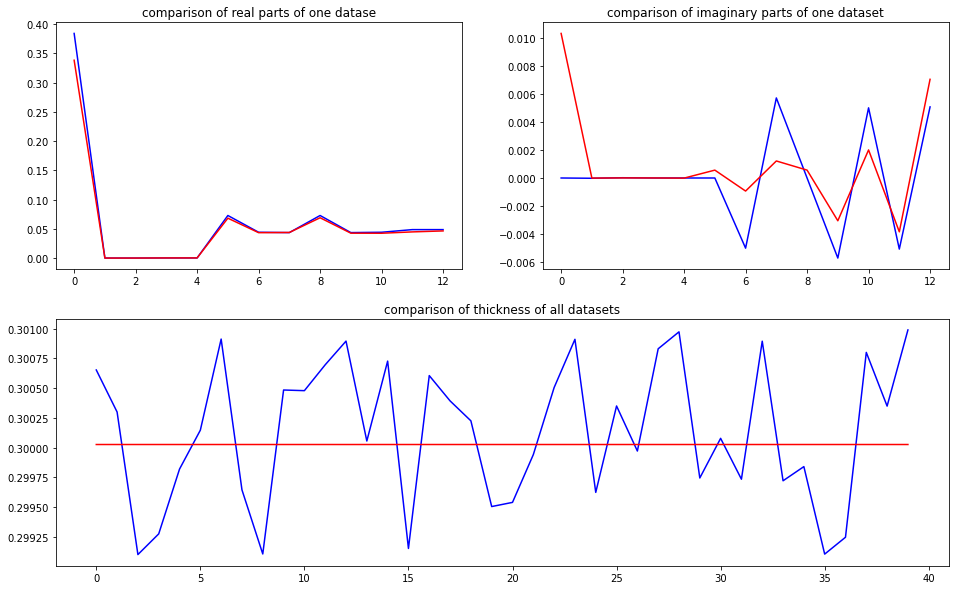

predicted thickness: 0.30002597


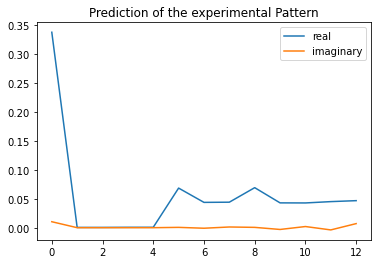

The offset applied on thickness: -0.0009527619400486758

The offset applied on Ug: 1.4400421561191663

Applied shift of unit cell origin (fractional coordinates): -0.001193250341418492 -0.00010036022540778453
Ug[ 0 ]: 0.50296 0.0  =>  0.50296 0.0
Ug[ 1 ]: 0.00046 -0.01255  =>  0.00046 -0.01318
Ug[ 2 ]: 0.00046 0.01255  =>  0.00046 0.01318
Ug[ 3 ]: 0.00067 0.0075  =>  0.00067 0.0
Ug[ 4 ]: 0.00067 -0.0075  =>  0.00067 0.0
Ug[ 5 ]: 0.07573 -0.00126  =>  0.07573 0.0
Ug[ 6 ]: 0.04603 -0.03039  =>  0.04603 -0.03726
Ug[ 7 ]: 0.04632 0.04794  =>  0.04632 0.05606
Ug[ 8 ]: 0.07573 0.00126  =>  0.07573 -0.0
Ug[ 9 ]: 0.04632 -0.04794  =>  0.04632 -0.05606
Ug[ 10 ]: 0.04603 0.03039  =>  0.04603 0.03726
Ug[ 11 ]: 0.04935 -0.11395  =>  0.04935 -0.09896
Ug[ 12 ]: 0.04935 0.11395  =>  0.04935 0.09896
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

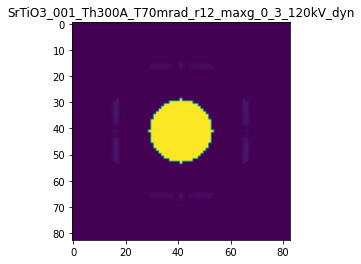

X_sim.max(): 0.9999978724861713
>>>replaced the 92. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 256ms/step - loss: 0.0047 - acc: 0.5200 - val_loss: 0.0013 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 192ms/step - loss: 0.0047 - acc: 0.5200 - val_loss: 0.0013 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0047 - acc: 0.5200 - val_loss: 0.0013 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 198ms/step - loss: 0.0047 - acc: 0.5200 - val_loss: 0.0013 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 188ms/step - loss: 0.0047 - acc: 0.5200 - val_loss: 0.0013 - val_acc: 0.6000


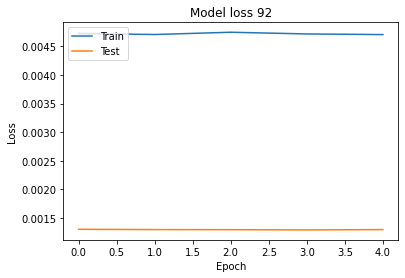

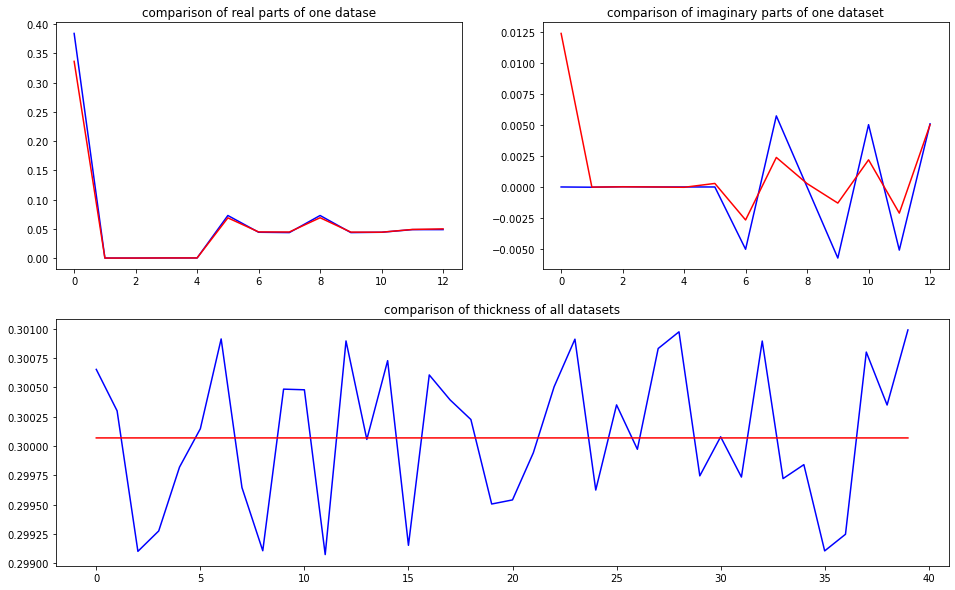

predicted thickness: 0.3000681


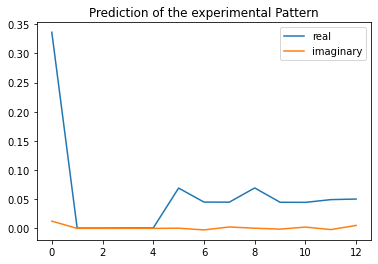

The offset applied on thickness: -0.00013914077161548066

The offset applied on Ug: -0.05287359382546281

Applied shift of unit cell origin (fractional coordinates): -0.0036822137745188385 7.869319494294443e-06
Ug[ 0 ]: 0.33026 0.0  =>  0.33026 0.0
Ug[ 1 ]: 0.00046 -0.02459  =>  0.00046 -0.02454
Ug[ 2 ]: 0.00046 0.02459  =>  0.00046 0.02454
Ug[ 3 ]: 0.00065 0.02314  =>  0.00065 0.0
Ug[ 4 ]: 0.00065 -0.02314  =>  0.00065 -0.0
Ug[ 5 ]: 0.06893 0.0001  =>  0.06893 -0.0
Ug[ 6 ]: 0.04478 -0.05411  =>  0.04478 -0.07729
Ug[ 7 ]: 0.04479 0.04102  =>  0.04479 0.0641
Ug[ 8 ]: 0.06893 -0.0001  =>  0.06893 0.0
Ug[ 9 ]: 0.04479 -0.04102  =>  0.04479 -0.0641
Ug[ 10 ]: 0.04478 0.05411  =>  0.04478 0.07729
Ug[ 11 ]: 0.04977 -0.07147  =>  0.04977 -0.0252
Ug[ 12 ]: 0.04977 0.07147  =>  0.04977 0.0252
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_00

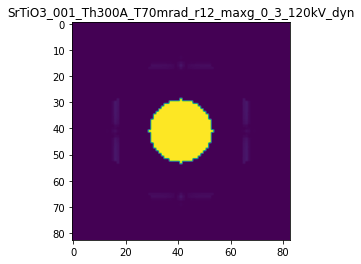

X_sim.max(): 0.999997950842012
>>>replaced the 93. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 251ms/step - loss: 0.0047 - acc: 0.5300 - val_loss: 0.0012 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0047 - acc: 0.5300 - val_loss: 0.0012 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 203ms/step - loss: 0.0047 - acc: 0.5300 - val_loss: 0.0012 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 202ms/step - loss: 0.0047 - acc: 0.5300 - val_loss: 0.0012 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 1s 215ms/step - loss: 0.0047 - acc: 0.5300 - val_loss: 0.0013 - val_acc: 0.6000


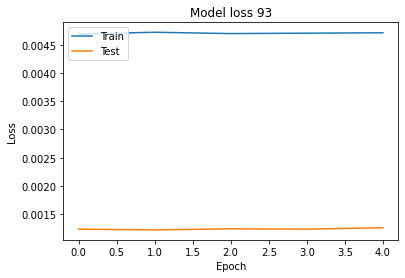

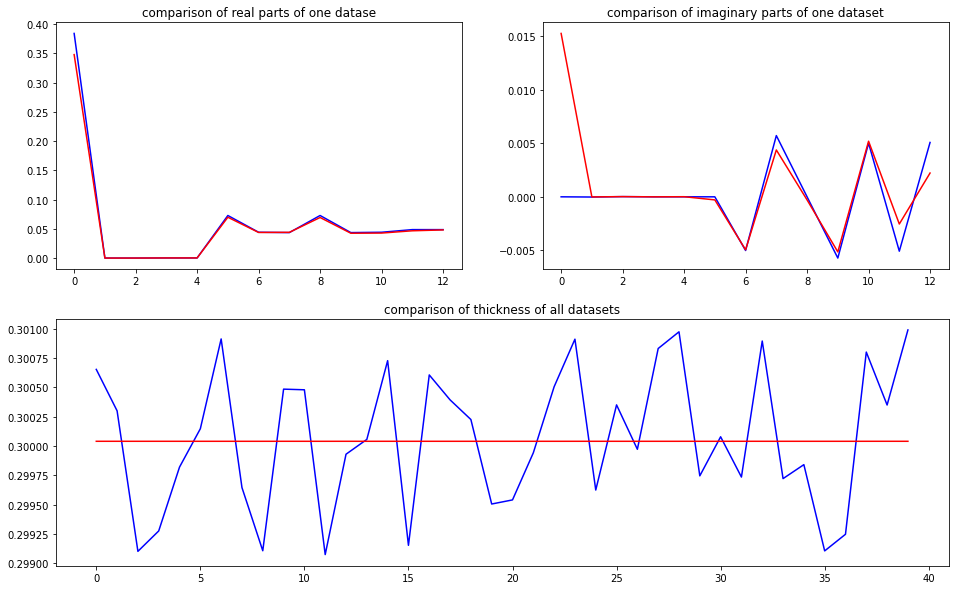

predicted thickness: 0.30003923


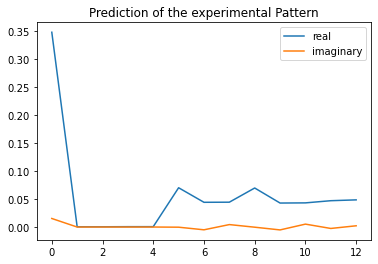

The offset applied on thickness: -0.0006993091907429645

The offset applied on Ug: 0.2426528643079306

Applied shift of unit cell origin (fractional coordinates): 0.0013685431938250537 1.007598982601103e-05
Ug[ 0 ]: 0.37718 0.0  =>  0.37718 0.0
Ug[ 1 ]: 0.00046 -0.03295  =>  0.00046 -0.03289
Ug[ 2 ]: 0.00046 0.03295  =>  0.00046 0.03289
Ug[ 3 ]: 0.00066 -0.0086  =>  0.00066 -0.0
Ug[ 4 ]: 0.00066 0.0086  =>  0.00066 0.0
Ug[ 5 ]: 0.0711 0.00013  =>  0.0711 0.0
Ug[ 6 ]: 0.0444 -0.11425  =>  0.0444 -0.10571
Ug[ 7 ]: 0.04432 0.10803  =>  0.04432 0.09937
Ug[ 8 ]: 0.0711 -0.00013  =>  0.0711 0.0
Ug[ 9 ]: 0.04432 -0.10803  =>  0.04432 -0.09937
Ug[ 10 ]: 0.0444 0.11425  =>  0.0444 0.10571
Ug[ 11 ]: 0.04836 -0.04962  =>  0.04836 -0.06682
Ug[ 12 ]: 0.04836 0.04962  =>  0.04836 0.06682
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_

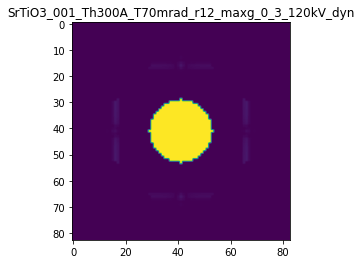

X_sim.max(): 0.9999977804782387
>>>replaced the 94. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 264ms/step - loss: 0.0042 - acc: 0.5400 - val_loss: 0.0010 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 1s 205ms/step - loss: 0.0042 - acc: 0.5400 - val_loss: 0.0010 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 1s 254ms/step - loss: 0.0042 - acc: 0.5400 - val_loss: 0.0010 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 1s 229ms/step - loss: 0.0042 - acc: 0.5400 - val_loss: 0.0010 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 1s 225ms/step - loss: 0.0042 - acc: 0.5400 - val_loss: 0.0010 - val_acc: 0.6250


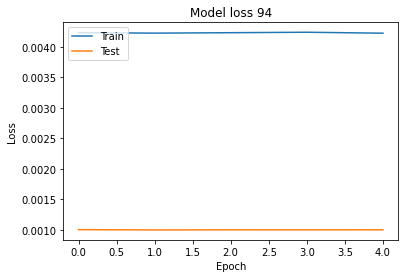

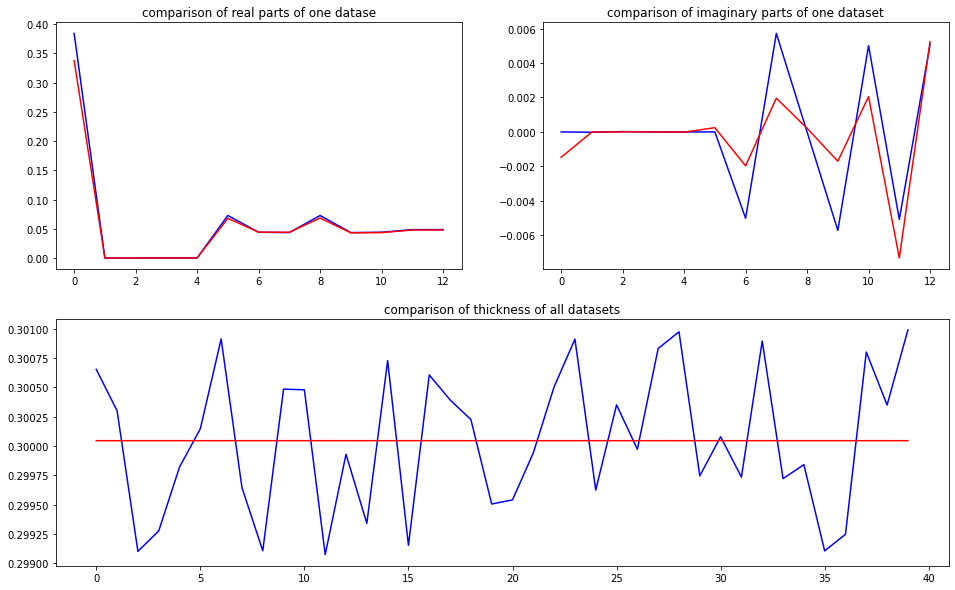

predicted thickness: 0.30004448


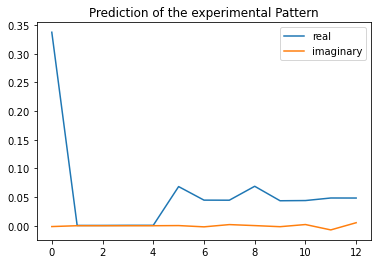

The offset applied on thickness: 0.0009551506870440319

The offset applied on Ug: 1.0799064864519214

Applied shift of unit cell origin (fractional coordinates): -0.0018015915819163276 -3.4150684034050685e-05
Ug[ 0 ]: 0.46061 0.0  =>  0.46061 0.0
Ug[ 1 ]: 0.00046 -0.01598  =>  0.00046 -0.0162
Ug[ 2 ]: 0.00046 0.01598  =>  0.00046 0.0162
Ug[ 3 ]: 0.00066 0.01132  =>  0.00066 0.0
Ug[ 4 ]: 0.00066 -0.01132  =>  0.00066 0.0
Ug[ 5 ]: 0.07361 -0.00043  =>  0.07361 -0.0
Ug[ 6 ]: 0.04644 -0.04251  =>  0.04644 -0.05361
Ug[ 7 ]: 0.04617 0.04084  =>  0.04617 0.05237
Ug[ 8 ]: 0.07361 0.00043  =>  0.07361 0.0
Ug[ 9 ]: 0.04617 -0.04084  =>  0.04617 -0.05237
Ug[ 10 ]: 0.04644 0.04251  =>  0.04644 0.05361
Ug[ 11 ]: 0.05128 -0.1224  =>  0.05128 -0.09976
Ug[ 12 ]: 0.05128 0.1224  =>  0.05128 0.09976
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001

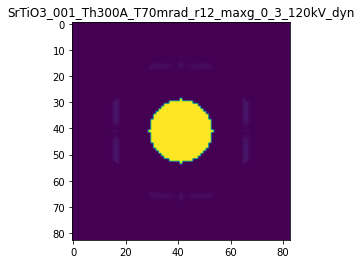

X_sim.max(): 0.9999982067693179
>>>replaced the 95. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 268ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.2692e-04 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.3192e-04 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.4479e-04 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.3112e-04 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.4407e-04 - val_acc: 0.6250


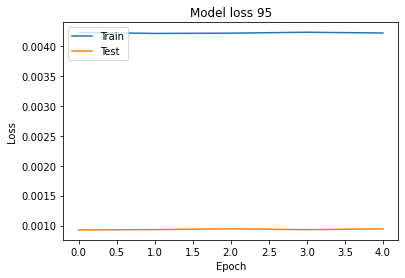

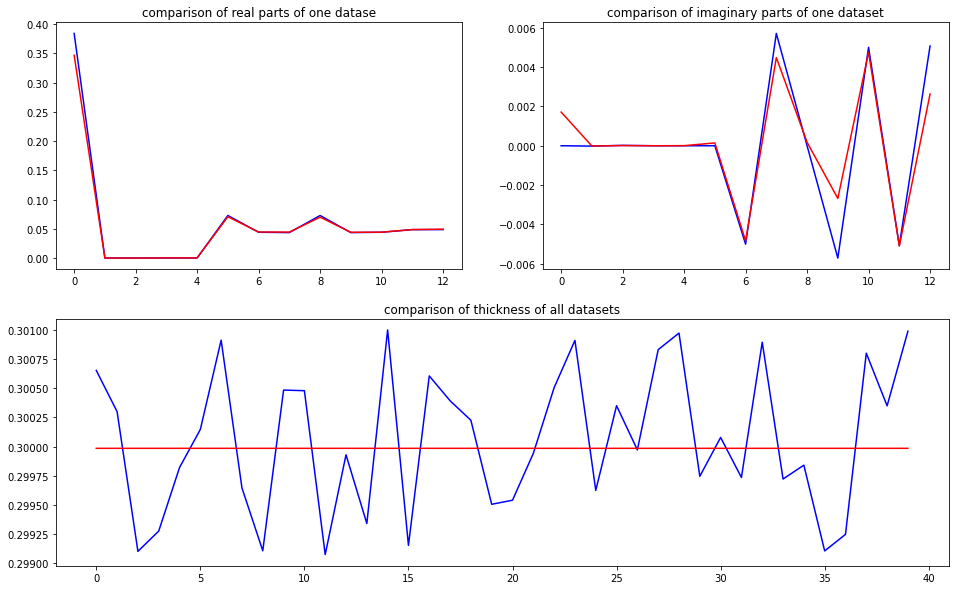

predicted thickness: 0.29998443


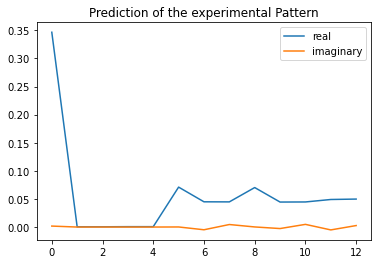

The offset applied on thickness: 0.0004323719717928813

The offset applied on Ug: -1.0039323227041135

Applied shift of unit cell origin (fractional coordinates): 0.0004925216220767224 -7.400967681160173e-05
Ug[ 0 ]: 0.22601 0.0  =>  0.22601 0.0
Ug[ 1 ]: 0.00046 -0.02349  =>  0.00046 -0.02396
Ug[ 2 ]: 0.00046 0.02349  =>  0.00046 0.02396
Ug[ 3 ]: 0.00068 -0.00309  =>  0.00068 0.0
Ug[ 4 ]: 0.00068 0.00309  =>  0.00068 0.0
Ug[ 5 ]: 0.06565 -0.00093  =>  0.06565 0.0
Ug[ 6 ]: 0.04301 -0.11211  =>  0.04301 -0.10855
Ug[ 7 ]: 0.04276 0.08362  =>  0.04276 0.08099
Ug[ 8 ]: 0.06565 0.00093  =>  0.06565 0.0
Ug[ 9 ]: 0.04276 -0.08362  =>  0.04276 -0.08099
Ug[ 10 ]: 0.04301 0.11211  =>  0.04301 0.10855
Ug[ 11 ]: 0.04709 -0.08186  =>  0.04709 -0.08805
Ug[ 12 ]: 0.04709 0.08186  =>  0.04709 0.08805
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_0

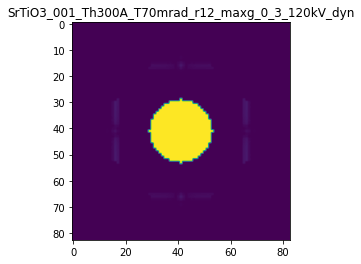

X_sim.max(): 0.9999976170353231
>>>replaced the 96. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 306ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.2859e-04 - val_acc: 0.6000
Epoch 2/5
5/5 [==============================] - 1s 252ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.3344e-04 - val_acc: 0.6000
Epoch 3/5
5/5 [==============================] - 1s 247ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.2338e-04 - val_acc: 0.6000
Epoch 4/5
5/5 [==============================] - 1s 250ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.3008e-04 - val_acc: 0.6000
Epoch 5/5
5/5 [==============================] - 2s 363ms/step - loss: 0.0042 - acc: 0.5500 - val_loss: 9.4378e-04 - val_acc: 0.6000


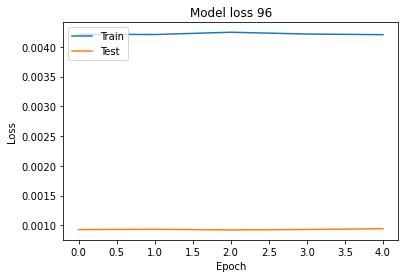

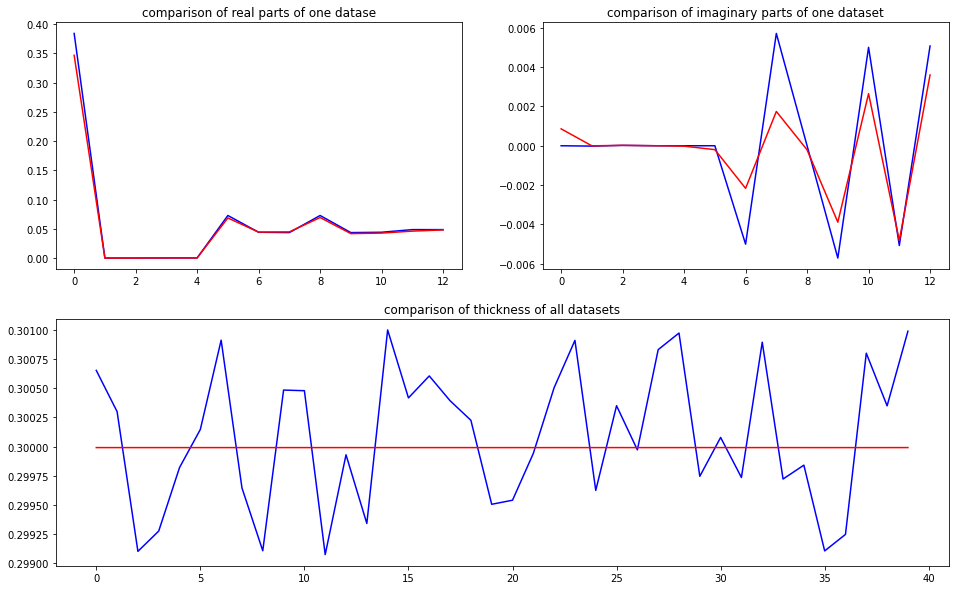

predicted thickness: 0.29999062


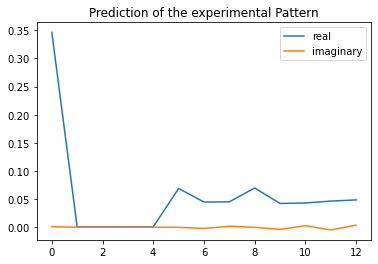

The offset applied on thickness: -0.0003841053626526767

The offset applied on Ug: 1.5499140197894405

Applied shift of unit cell origin (fractional coordinates): -0.0028742847474986354 -0.00010625670888264497
Ug[ 0 ]: 0.53274 0.0  =>  0.53274 0.0
Ug[ 1 ]: 0.00046 -0.02689  =>  0.00046 -0.02756
Ug[ 2 ]: 0.00046 0.02689  =>  0.00046 0.02756
Ug[ 3 ]: 0.00064 0.01806  =>  0.00064 0.0
Ug[ 4 ]: 0.00064 -0.01806  =>  0.00064 0.0
Ug[ 5 ]: 0.07672 -0.00134  =>  0.07672 0.0
Ug[ 6 ]: 0.04696 -0.04859  =>  0.04696 -0.06598
Ug[ 7 ]: 0.04672 0.06532  =>  0.04672 0.08405
Ug[ 8 ]: 0.07672 0.00134  =>  0.07672 -0.0
Ug[ 9 ]: 0.04672 -0.06532  =>  0.04672 -0.08405
Ug[ 10 ]: 0.04696 0.04859  =>  0.04696 0.06598
Ug[ 11 ]: 0.05118 -0.08596  =>  0.05118 -0.04984
Ug[ 12 ]: 0.05118 0.08596  =>  0.05118 0.04984
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO

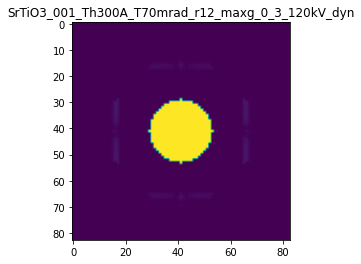

X_sim.max(): 0.999998175027656
>>>replaced the 97. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 267ms/step - loss: 0.0042 - acc: 0.5600 - val_loss: 9.0814e-04 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 1s 248ms/step - loss: 0.0042 - acc: 0.5600 - val_loss: 9.0594e-04 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 1s 212ms/step - loss: 0.0042 - acc: 0.5600 - val_loss: 9.0596e-04 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 1s 210ms/step - loss: 0.0042 - acc: 0.5600 - val_loss: 9.1684e-04 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 1s 213ms/step - loss: 0.0042 - acc: 0.5600 - val_loss: 9.0685e-04 - val_acc: 0.6250


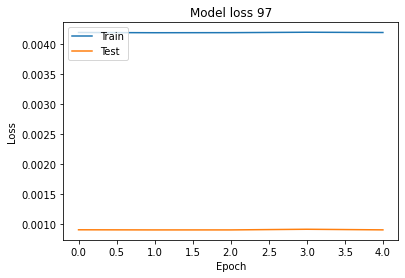

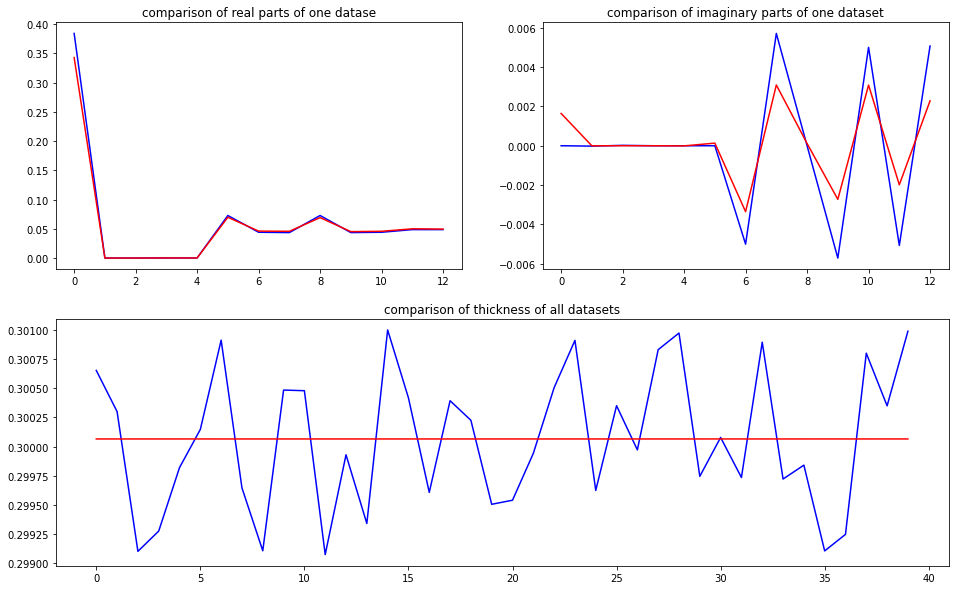

predicted thickness: 0.30006483


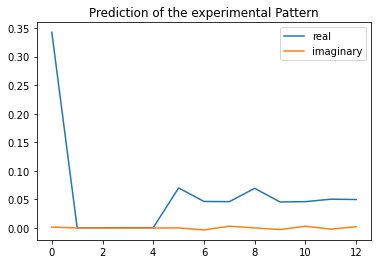

The offset applied on thickness: 0.0007669290036124983

The offset applied on Ug: 1.6829951055000147

Applied shift of unit cell origin (fractional coordinates): -0.0008631086680060744 0.00011246487440626814
Ug[ 0 ]: 0.54045 0.0  =>  0.54045 0.0
Ug[ 1 ]: 0.00046 -0.00513  =>  0.00046 -0.00442
Ug[ 2 ]: 0.00046 0.00513  =>  0.00046 0.00442
Ug[ 3 ]: 0.00063 0.00542  =>  0.00063 -0.0
Ug[ 4 ]: 0.00063 -0.00542  =>  0.00063 0.0
Ug[ 5 ]: 0.07797 0.00141  =>  0.07797 0.0
Ug[ 6 ]: 0.05004 -0.06382  =>  0.05004 -0.06995
Ug[ 7 ]: 0.04949 0.05993  =>  0.04949 0.06465
Ug[ 8 ]: 0.07797 -0.00141  =>  0.07797 0.0
Ug[ 9 ]: 0.04949 -0.05993  =>  0.04949 -0.06465
Ug[ 10 ]: 0.05004 0.06382  =>  0.05004 0.06995
Ug[ 11 ]: 0.05443 -0.03827  =>  0.05443 -0.02742
Ug[ 12 ]: 0.05443 0.03827  =>  0.05443 0.02742
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_

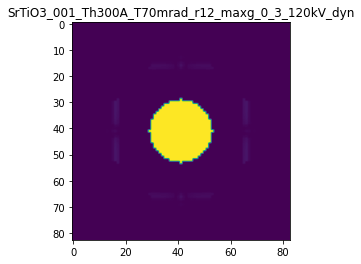

X_sim.max(): 0.9999985762167617
>>>replaced the 98. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 238ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0146e-04 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 1s 206ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 7.9761e-04 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0301e-04 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 1s 224ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0293e-04 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 1s 226ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0172e-04 - val_acc: 0.6500


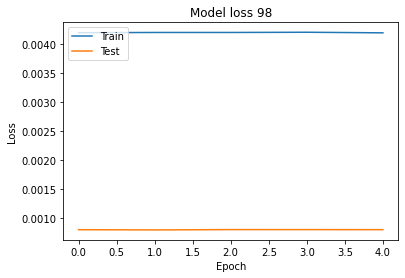

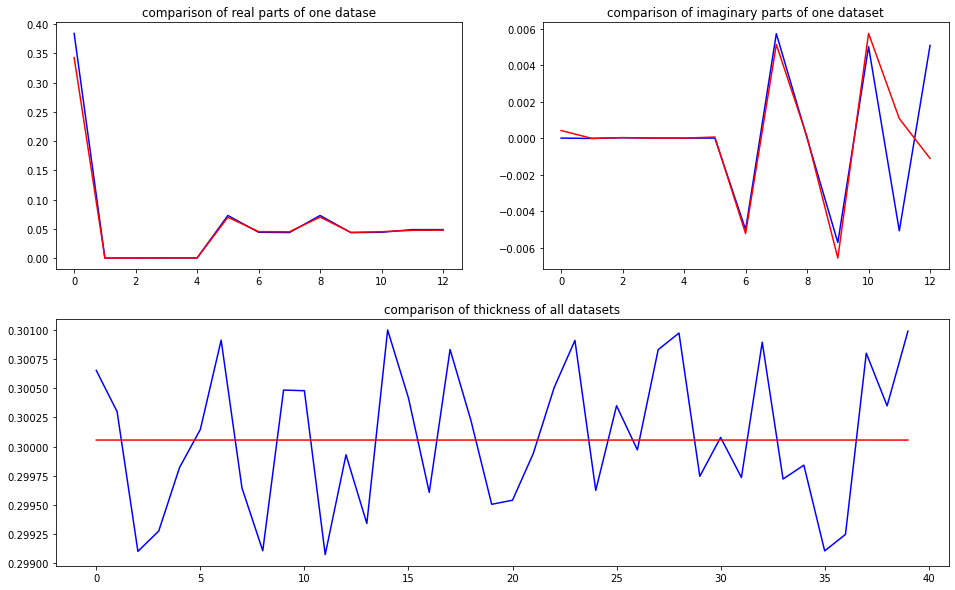

predicted thickness: 0.3000554


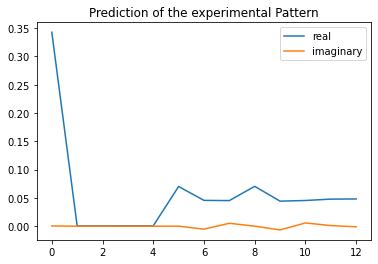

The offset applied on thickness: -0.0009233357745570316

The offset applied on Ug: -0.4101272401910677

Applied shift of unit cell origin (fractional coordinates): -0.0002138428109101109 4.5530472069424535e-06
Ug[ 0 ]: 0.2945 0.0  =>  0.2945 0.0
Ug[ 1 ]: 0.00046 -0.04579  =>  0.00046 -0.04577
Ug[ 2 ]: 0.00046 0.04579  =>  0.00046 0.04577
Ug[ 3 ]: 0.00064 0.00134  =>  0.00064 -0.0
Ug[ 4 ]: 0.00064 -0.00134  =>  0.00064 0.0
Ug[ 5 ]: 0.06824 6e-05  =>  0.06824 0.0
Ug[ 6 ]: 0.045 -0.12219  =>  0.045 -0.12357
Ug[ 7 ]: 0.04428 0.13222  =>  0.04428 0.13354
Ug[ 8 ]: 0.06824 -6e-05  =>  0.06824 -0.0
Ug[ 9 ]: 0.04428 -0.13222  =>  0.04428 -0.13354
Ug[ 10 ]: 0.045 0.12219  =>  0.045 0.12357
Ug[ 11 ]: 0.04703 0.02331  =>  0.04703 0.026
Ug[ 12 ]: 0.04703 -0.02331  =>  0.04703 -0.026
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T70m

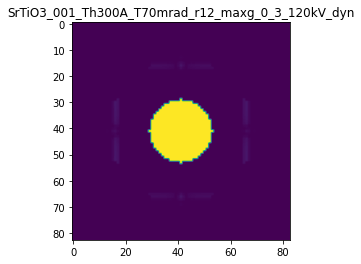

X_sim.max(): 0.9999978502841025
>>>replaced the 99. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 284ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0203e-04 - val_acc: 0.6250
Epoch 2/5
5/5 [==============================] - 1s 216ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0872e-04 - val_acc: 0.6250
Epoch 3/5
5/5 [==============================] - 1s 214ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0847e-04 - val_acc: 0.6250
Epoch 4/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 7.9922e-04 - val_acc: 0.6250
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0042 - acc: 0.5700 - val_loss: 8.0616e-04 - val_acc: 0.6250


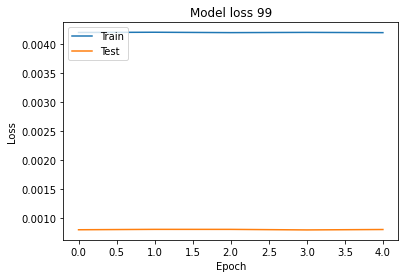

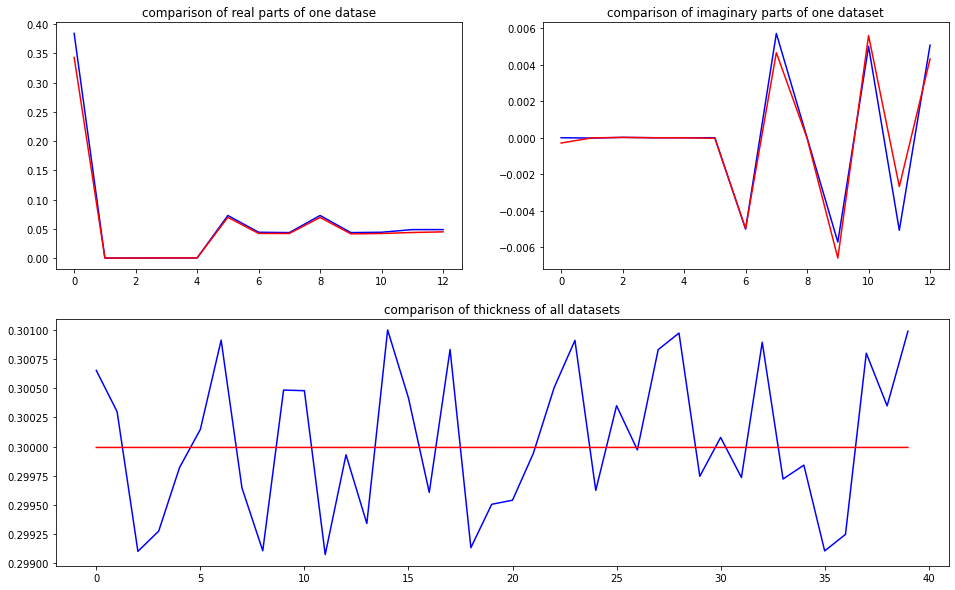

predicted thickness: 0.29999188


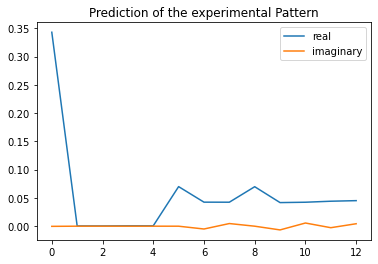

The offset applied on thickness: -9.38973887004837e-05

The offset applied on Ug: 0.7074660727179001

Applied shift of unit cell origin (fractional coordinates): -0.00020570865837591493 7.017079708569136e-06
Ug[ 0 ]: 0.42622 0.0  =>  0.42622 0.0
Ug[ 1 ]: 0.00045 -0.02822  =>  0.00045 -0.02818
Ug[ 2 ]: 0.00045 0.02822  =>  0.00045 0.02818
Ug[ 3 ]: 0.00069 0.00129  =>  0.00069 0.0
Ug[ 4 ]: 0.00069 -0.00129  =>  0.00069 0.0
Ug[ 5 ]: 0.07334 9e-05  =>  0.07334 0.0
Ug[ 6 ]: 0.04404 -0.12055  =>  0.04404 -0.12189
Ug[ 7 ]: 0.04371 0.1296  =>  0.04371 0.13085
Ug[ 8 ]: 0.07334 -9e-05  =>  0.07334 -0.0
Ug[ 9 ]: 0.04371 -0.1296  =>  0.04371 -0.13085
Ug[ 10 ]: 0.04404 0.12055  =>  0.04404 0.12189
Ug[ 11 ]: 0.04621 -0.07666  =>  0.04621 -0.07408
Ug[ 12 ]: 0.04621 0.07666  =>  0.04621 0.07408
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th

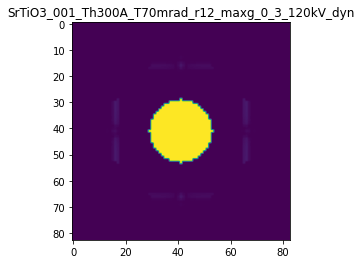

X_sim.max(): 0.9999976169604028
>>>replaced the 100. dataset and train: 
Epoch 1/5
5/5 [==============================] - 2s 261ms/step - loss: 0.0042 - acc: 0.5800 - val_loss: 7.9573e-04 - val_acc: 0.6500
Epoch 2/5
5/5 [==============================] - 1s 193ms/step - loss: 0.0042 - acc: 0.5800 - val_loss: 7.9901e-04 - val_acc: 0.6500
Epoch 3/5
5/5 [==============================] - 1s 201ms/step - loss: 0.0042 - acc: 0.5800 - val_loss: 7.9165e-04 - val_acc: 0.6500
Epoch 4/5
5/5 [==============================] - 1s 197ms/step - loss: 0.0042 - acc: 0.5800 - val_loss: 7.9425e-04 - val_acc: 0.6500
Epoch 5/5
5/5 [==============================] - 1s 208ms/step - loss: 0.0042 - acc: 0.5800 - val_loss: 7.9462e-04 - val_acc: 0.6500


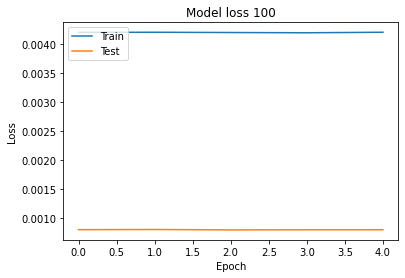

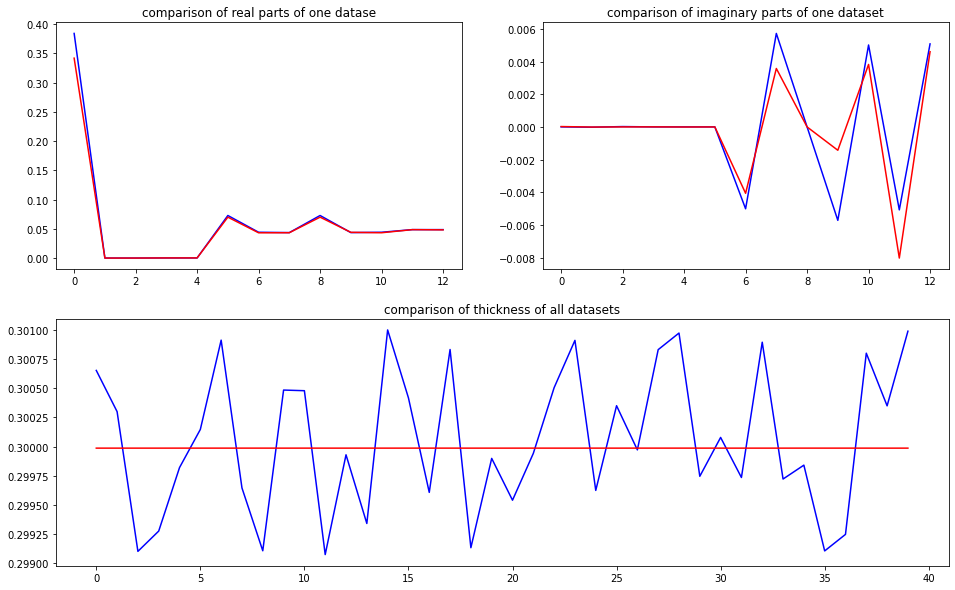

predicted thickness: 0.2999861


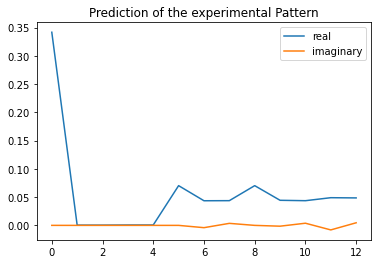

The offset applied on thickness: 7.560361509577462e-05

The offset applied on Ug: -1.617737224611654

Applied shift of unit cell origin (fractional coordinates): -0.0008623098978850603 -1.986783065108611e-07
Ug[ 0 ]: 0.15281 0.0  =>  0.15281 0.0
Ug[ 1 ]: 0.00046 -0.00948  =>  0.00046 -0.00948
Ug[ 2 ]: 0.00046 0.00948  =>  0.00046 0.00948
Ug[ 3 ]: 0.00069 0.00542  =>  0.00069 0.0
Ug[ 4 ]: 0.00069 -0.00542  =>  0.00069 0.0
Ug[ 5 ]: 0.0623 -0.0  =>  0.0623 0.0
Ug[ 6 ]: 0.04071 -0.09695  =>  0.04071 -0.10236
Ug[ 7 ]: 0.04098 0.06184  =>  0.04098 0.06726
Ug[ 8 ]: 0.0623 0.0  =>  0.0623 0.0
Ug[ 9 ]: 0.04098 -0.06184  =>  0.04098 -0.06726
Ug[ 10 ]: 0.04071 0.09695  =>  0.04071 0.10236
Ug[ 11 ]: 0.04532 -0.14103  =>  0.04532 -0.13019
Ug[ 12 ]: 0.04532 0.14103  =>  0.04532 0.13019
mode = 		LARBED_SIM
cfg file = 		/Users/chenjie/pyQEDA/crystal_files/SrTiO3.cfg
created output folder = 		/pyQEDA_simulations/
file exists
output file = 		/Users/chenjie/pyQEDA/pyQEDA_simulations//SrTiO3_001_Th300A_T7

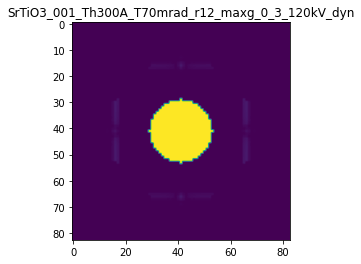

X_sim.max(): 0.9999973005850302
Time:  1575.7100368129998


In [23]:
Ug_t_exp_pred_matrix = [] #matrix to save the predicted {Ug,t} of the experimental pattern
Ug_exp_pred_matrix = [] #matrix to save the predicted Ug of the experimental pattern
t_exp_pred_matrix = [] #matrix to save the predicted t of the experimental pattern
simulation_pattern = [] #matrix to save the simulation pattern produced by predicted {Ug,t}
sim_Intensity_matrix = []
scale = 5 # scale of random offset 

DoDiverse = True

start = timeit.default_timer()
for i in range(0,trainsize+1):
    
    if i == 0:
        print('>>>train the initial training set:')
        Epochs = 30
    else:
        print('>>>replaced the {0:d}. dataset and train: '.format(i))
        Epochs = 5
    
    # load and compile the model
    model = load_model(name+"_ANN.h5")
    

    # train the model
    model.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=20, epochs=Epochs)
    
    # save the trained weigths of the model, delete the existing model
    model.save(name+"_ANN.h5")


    # plot the model loss
    plt.plot(model.history.history['loss'])
    plt.plot(model.history.history['val_loss'])
    plt.title('Model loss {0:d}'.format(i))
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
    plt.close()
    

    # Prediction of the testing set
    y_test_pred = model.predict(X_test)    
    Ug_test_pred_complex = y_test_pred[:,:2*numUg].reshape(-1,numUg,2)
    Ug_test_complex = y_test[:,:2*numUg].reshape(-1,numUg,2)    
    t_test_pred = y_test_pred[:,2*numUg]
    t_test = y_test[:,2*numUg]
    
    # plot the comparison of imaginary parts, real parts and thickness
    gs = gridspec.GridSpec(2, 2)
    fig = plt.figure(figsize=(16,10))
    
    ax1 = fig.add_subplot(gs[0, 0]) 
    ax1.plot(Ug_test_complex[2,:,0],'b')
    ax1.plot(Ug_test_pred_complex[2,:,0],'r')
    ax1.set_title('comparison of real parts of one datase')
    
    ax2 = fig.add_subplot(gs[0, 1]) 
    ax2.plot(Ug_test_complex[2,:,1],'b')
    ax2.plot(Ug_test_pred_complex[2,:,1],'r')
    ax2.set_title('comparison of imaginary parts of one dataset')
    
    ax3 = fig.add_subplot(gs[1, :])
    ax3.plot(t_test[:],'b')
    ax3.plot(t_test_pred[:],'r')
    ax3.set_title('comparison of thickness of all datasets')
    plt.show()
    plt.close()
    
    
    # Prediction of the experimental Pattern
    y_exp_pred = model.predict(I)
    Ug_t_exp_pred = y_exp_pred[0,:]
    Ug_exp_pred = Ug_t_exp_pred[0:-1]
    t_exp_pred = Ug_t_exp_pred[-1]
    
    Ug_t_exp_pred_matrix.append(Ug_t_exp_pred)
    Ug_exp_pred_matrix.append(Ug_exp_pred)
    t_exp_pred_matrix.append(t_exp_pred)
    print("predicted thickness:", t_exp_pred)
 
    
    # plot the results
    plt.plot(Ug_t_exp_pred[0:-1:2],label='real')
    plt.plot(Ug_t_exp_pred[1:-1:2],label='imaginary')
    plt.legend()
    plt.title('Prediction of the experimental Pattern')
    plt.show()
    plt.close()
    
    # diverse the predicted Ug and thickness
    if DoDiverse == True:
        # scale will be reduced by iterations
        scale *= 0.99
        Ug_t_diverse = diverse_Ug_t(Ug_t_exp_pred, scale_Ug=scale)
        Ug_t_exp_pred = Ug_t_diverse
    
    
    # normalization
    Ug_pred = np.array(range( np.int((Ug_t_exp_pred.size - 1)/2) ), dtype=complex)
    Ug_pred.real = Ug_t_exp_pred[0:-1:2]
    Ug_pred.imag = Ug_t_exp_pred[1:-1:2]
    Ug_pred_normalized = nf.normalization(file=File, origin_Ug=Ug_pred)
    Ug_pred_normalized = np.asarray(Ug_pred_normalized)
    
    # Make unique Ug
    if makeUniqueUgVector == True:
        UgUnique, r0 = mu.makeUniqueUgVector(Ug_pred_normalized,beam1,beam2,file = File)
        Ug_pred_normalized = UgUnique

    # reshape
    Ug_pred_normalized_2real = np.concatenate((np.array(Ug_pred_normalized.real,ndmin=2).T, np.array(Ug_pred_normalized.imag,ndmin=2).T),axis=1)  
    Ug_pred_normalized_2real = np.asarray(Ug_pred_normalized_2real)
    Ug_t_pred_normalized_2real = np.append(Ug_pred_normalized_2real.reshape(-1), Ug_t_exp_pred[-1])
    
    
    # Compute the LARBED pattern: X_sim, from the predicted {Ug,t}: Y_exp_pred
    file = File+".qed"
    X_sim = pf.pyQEDA(filename=file, UseInputUgMasterList=True, InputUg=Ug_t_pred_normalized_2real, InputUgdoFlip=False)
    X_sim = X_sim.reshape(-1)
    #nlogf_X_sim = nlogf(X_sim)
    
    if LoadIntensityAsInput == True:
        #load the intensities of simulation pattern from txt.files
        sim_Intensity = lif.LoadIntensity(file = File, test_simulation=True)
        sim_Intensity = sim_Intensity.reshape(-1)
        sim_Intensity_matrix.append(sim_Intensity)
    
    simulation_pattern.append(X_sim)
    print("X_sim.max():",X_sim.max())
    #print("nlogf_X_sim.max():",nlogf_X_sim.max())
        
    
    # replace the training set & testing set with new training set
    if LoadIntensityAsInput == True:
        X_train_new = sim_Intensity
    else:
        X_train_new = X_sim
        
    if i < trainsize:
        X_train[i] = X_train_new               
        y_train[i] = Ug_t_pred_normalized_2real

        X_test[i%testsize] = X_train_new
        y_test[i%testsize] = Ug_t_pred_normalized_2real
    

stop = timeit.default_timer()
print('Time: ', stop - start)

# IV. Compare

1. diffraction pattern:

Text(0.5, 1.0, 'experimental Pattern')

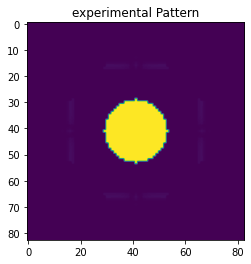

In [24]:
# plot the experimental Pattern:
plt.imshow(nlogf_I_exp[0])
plt.title('experimental Pattern')

Text(0.5, 1.0, 'simulation pattern')

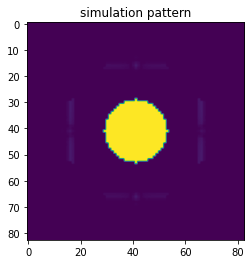

In [25]:
# plot the final simulated Pattern:
simulation_pattern = np.asarray(simulation_pattern)
plt.imshow(nlogf(simulation_pattern[-1].reshape(Nx,Nx,1)))
plt.title("simulation pattern")

2. thickness:

Text(0.5, 0, 'iteration')

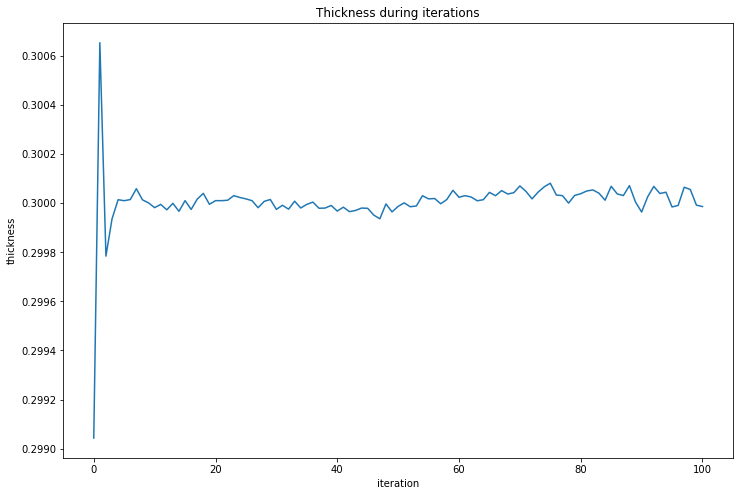

In [26]:
# plot the prediction of thickness during iterations:
plt.figure(figsize=(12,8))
plt.plot(t_exp_pred_matrix)
plt.title("Thickness during iterations")
plt.ylabel("thickness")
plt.xlabel("iteration")

3. R-factors:

Text(0.5, 0, 'Iteration')

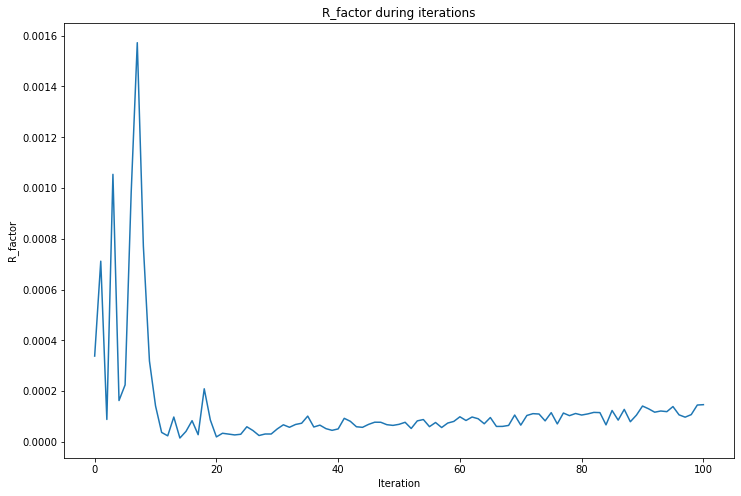

In [33]:
# plot the R-factors during iterations
sim_Intensities = []
R_factors = []
R_factors_integrated = []
    
for i in range(len(simulation_pattern)):
    sim_I_int = simulation_pattern[i].reshape(-1)
    #sim_I = sim_Intensity_matrix[i].reshape(-1)
    
    R_integrated = np.sum(np.abs(sim_I_int - I))/np.sum(I)
    R_factors_integrated = np.append(R_factors_integrated, R_integrated)
    
    #R = np.sum(np.abs(sim_I - I.reshape(-1)))/np.sum(I.reshape(-1))
    #R_factors = np.append(R_factors_integrated, R)

plt.figure(figsize=(12,8))
#plt.plot(R_factors[:], "r", label="R_factor")
plt.plot(R_factors_integrated[:], label="R_factor")
plt.title('R_factor during iterations')
plt.ylabel('R_factor')
plt.xlabel('Iteration')

R_min: 1.4702946878234768e-05


Text(0.5, 1.0, 'simulation pattern')

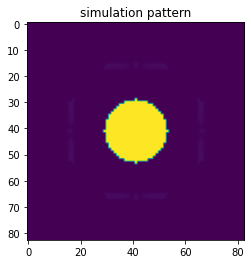

In [35]:
R_argmin = R_factors_integrated.argmin()
R_min = R_factors_integrated.min()
print("R_min:", R_min)
plt.imshow(nlogf(simulation_pattern[R_argmin].reshape(Nx,Nx,1)))
plt.title("simulation pattern")

In [36]:
t_exp_pred_matrix[R_argmin]

0.29996663